# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100998.27887305  99723.88095634 101303.67223198 103092.61280875
  99532.83469866  99532.86737755 103208.50728239 101546.55324918
  99065.53858503 101090.91919622  99077.5383033   99072.95740148
 100485.04873236  96246.09556884  96609.32594441  98881.83582563
  97994.91492509 100630.41060507  98200.52092999  97215.18620668
 102974.38116142  99549.51030708 100135.13413065  97190.99577765
  98917.24782412 100222.06920894  97724.53133637 100754.1504107
  98806.02781904  99418.36888778  98803.91770933 103773.6459511
  99973.01189183  97907.00331514 101658.52873405  97588.11897026
 100418.55894768  96156.8490052

Omni_P_RQi ================== 0.102864587213153
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97215.18620668055, 'S': 10000, 'W': 10000, 'P': 0.102864587213153, 'dP': 0}, 'j': {'R': 101515.07839877611, 'S': 10000, 'W': 10000, 'P': 0.0985075336367032}, 'k': {'R': 101515.07839877611, 'S': 10000, 'W': 10000, 'P': 0.0985075336367032}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.102864587213153
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97215.18620668055, 'S': 10000, 'W': 10000, 'P': 0.102864587213153, 'dP': 0}, 'j': {'R': 101515.07839877611, 'S': 10000, 'W': 10000, 'P': 0.0985075336367032}, 'k': {'R': 101515.07839877611, 'S': 10000, 'W': 10000, 'P': 0.0985075336367032}}}
config_param a value =============  1
Omni_P_RQi ================== 0.102864587213153
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': 

Omni_P_RQi ================== 0.09925149444700146
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100754.15041070059, 'S': 10000, 'W': 10000, 'P': 0.09925149444700146, 'dP': 0}, 'j': {'R': 98873.90621701919, 'S': 10000, 'W': 10000, 'P': 0.10113891907993312}, 'k': {'R': 98873.90621701919, 'S': 10000, 'W': 10000, 'P': 0.10113891907993312}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10120840014250117
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98806.02781903504, 'S': 10000, 'W': 10000, 'P': 0.10120840014250117, 'dP': 0}, 'j': {'R': 100199.48150436938, 'S': 10000, 'W': 10000, 'P': 0.09980091563212262}, 'k': {'R': 100199.48150436938, 'S': 10000, 'W': 10000, 'P': 0.09980091563212262}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10120840014250117
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Ass

Omni_P_RQi ================== 0.10399675221734773
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96156.84900525093, 'S': 10000, 'W': 10000, 'P': 0.10399675221734773, 'dP': 0}, 'j': {'R': 99358.0109780049, 'S': 10000, 'W': 10000, 'P': 0.10064613715157525}, 'k': {'R': 99358.0109780049, 'S': 10000, 'W': 10000, 'P': 0.10064613715157525}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10399675221734773
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96156.84900525093, 'S': 10000, 'W': 10000, 'P': 0.10399675221734773, 'dP': 0}, 'j': {'R': 99358.0109780049, 'S': 10000, 'W': 10000, 'P': 0.10064613715157525}, 'k': {'R': 99358.0109780049, 'S': 10000, 'W': 10000, 'P': 0.10064613715157525}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10269169542170073
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'p

Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97086.5358131398, 'S': 10000, 'W': 10000, 'P': 0.10300089416360234, 'dP': 0}, 'j': {'R': 100521.06647708717, 'S': 10000, 'W': 10000, 'P': 0.0994816345514938}, 'k': {'R': 100521.06647708717, 'S': 10000, 'W': 10000, 'P': 0.0994816345514938}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10144995581930497
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98570.76742163642, 'S': 10000, 'W': 10000, 'P': 0.10144995581930497, 'dP': 0}, 'j': {'R': 101575.77585747576, 'S': 10000, 'W': 10000, 'P': 0.09844866963193391}, 'k': {'R': 101575.77585747576, 'S': 10000, 'W': 10000, 'P': 0.09844866963193391}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10144995581930497
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98570.76742163642, 'S': 1

Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102083.19467310328, 'S': 10000, 'W': 10000, 'P': 0.09795931673202997, 'dP': 0}, 'j': {'R': 100587.80719105592, 'S': 10000, 'W': 10000, 'P': 0.09941562779081223}, 'k': {'R': 100587.80719105592, 'S': 10000, 'W': 10000, 'P': 0.09941562779081223}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09795931673202997
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102083.19467310328, 'S': 10000, 'W': 10000, 'P': 0.09795931673202997, 'dP': 0}, 'j': {'R': 100587.80719105592, 'S': 10000, 'W': 10000, 'P': 0.09941562779081223}, 'k': {'R': 100587.80719105592, 'S': 10000, 'W': 10000, 'P': 0.09941562779081223}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09815486100305458
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101879.82436946042, 'S

Omni_P_RQi ================== 0.09927988638564327
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100725.33686386335, 'S': 10000, 'W': 10000, 'P': 0.09927988638564327, 'dP': 0}, 'j': {'R': 98236.87716117396, 'S': 10000, 'W': 10000, 'P': 0.10179476678186068}, 'k': {'R': 98236.87716117396, 'S': 10000, 'W': 10000, 'P': 0.10179476678186068}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09927988638564327
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100725.33686386335, 'S': 10000, 'W': 10000, 'P': 0.09927988638564327, 'dP': 0}, 'j': {'R': 98236.87716117396, 'S': 10000, 'W': 10000, 'P': 0.10179476678186068}, 'k': {'R': 98236.87716117396, 'S': 10000, 'W': 10000, 'P': 0.10179476678186068}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.096971054821072
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99561.66365956445, 'S': 10000, 'W': 10000, 'P': 0.10044026618712838, 'dP': 0}, 'j': {'R': 101259.06996539503, 'S': 10000, 'W': 10000, 'P': 0.0987565854932054}, 'k': {'R': 101259.06996539503, 'S': 10000, 'W': 10000, 'P': 0.0987565854932054}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10044026618712838
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99561.66365956445, 'S': 10000, 'W': 10000, 'P': 0.10044026618712838, 'dP': 0}, 'j': {'R': 101259.06996539503, 'S': 10000, 'W': 10000, 'P': 0.0987565854932054}, 'k': {'R': 101259.06996539503, 'S': 10000, 'W': 10000, 'P': 0.0987565854932054}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09928839028214399
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100716.70989511852, 'S': 10000, 'W': 10000, 'P': 

Omni_P_RQi ================== 0.0994793020116473
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100523.42344369458, 'S': 10000, 'W': 10000, 'P': 0.0994793020116473, 'dP': 0}, 'j': {'R': 100307.89249178552, 'S': 10000, 'W': 10000, 'P': 0.09969305257628583}, 'k': {'R': 100307.89249178552, 'S': 10000, 'W': 10000, 'P': 0.09969305257628583}}}
config_param a value =============  1
Omni_P_RQi ================== 0.0994793020116473
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100523.42344369458, 'S': 10000, 'W': 10000, 'P': 0.0994793020116473, 'dP': 0}, 'j': {'R': 100307.89249178552, 'S': 10000, 'W': 10000, 'P': 0.09969305257628583}, 'k': {'R': 100307.89249178552, 'S': 10000, 'W': 10000, 'P': 0.09969305257628583}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09998977463201118
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

H_chosen_agentH_chosen_agent  delta_Ri =  -7876.839376694558
H_agent r out =  90515.23809775145
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 74875.53 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6457.7812063334295
H_agent r out =  74875.5322944847
**********
Q ADDED INTO POOL: 1000 to existing amount 29623.46953170559
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82637.49 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109271.38 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i 

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 129452.81 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri = H_chosen_agent  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62468.48 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5593.7900450411435
H_agent r out =  62468.479482602386
**********
Q ADDED INTO POOL: 1000 to existing amount 31115.23401664911
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5593.7900450411435 from reserve 123772.15171457865
**********
 5329.741666847362delta_Ri = H_chosen_agent delta_Ri =  -4357.927840003538
H_agent r out =  65370.60626169091
**********
Q ADDED INTO POOL: 1000 to existing amount 24805.611724944123
**********
**********
POOL RESE

delta_Ri =   -4717.714197884051
H_agent r out =  59377.67790908647
**********
Q ADDED INTO POOL: 1000 to existing amount 33791.94746339176
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4717.714197884051 from reserve 115443.21649412128
**********
H_chosen_agentH_chosen_agent 
delta_Ri =  -4454.636666695119
H_agent r out =  46918.48396150228
**********
Q ADDED INTO POOL: 1000 to existing amount 33713.55237641453
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4454.636666695119 from reserve 110222.15619347854
**********
11477.044099449717
addliq - Sq delta S 11477.044099449718
POOL ADD LIQUIDITY Timestep ===  10 delta W  15956.311598967992
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60347.94 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 143916.70 1

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54419.15 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47772.83 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2844.954744322
H_agent r out = delta_Ri =  -5750.415207496555
H_agent r out =  54419.146249064586
**********
Q ADDED INTO POOL: 1000 to existing amount 30189.78558355778
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5750.415207496555 from reserve 119951.98094772022
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 150897.55 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    

H_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 141202.92 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4872.9035349005435
H_agent r out =  141202.92487053134
**********
Q ADDED INTO POOL: 1000 to existing amount 33470.05975581628
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4872.9035349005435 from reserve 118520.95608581089
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38504.45 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4518.99739614592
H_agent r out = H_chosen_agent H_chosen_agent  38504.45173511696
**********
Q ADDED INTO POOL: 1000 to existing amount 32788.70303191902
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4518.99739614592 from reser

0 130000.00 180000.00 160000.00  
delta_Ri =  -3335.783673366
H_agent r out =  35752.49485823264
**********
Q ADDED INTO POOL: 1000 to existing amount 39205.72342027341   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 163397.34 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3717.6554944115915
H_agent r out =  163397.34308405968
**********

Q ADDED INTO POOL: 1000 to existing amount 37680.3750486188
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3717.6554944115915 from reserve 106135.52429348577
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 40169.061713841606
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2775.7485205734074 from reserve 86697.47457790836
**********
delta_Ri = 
 4221.0019514158275
H_agent r out =  150563.11574404256
**********
Q ADDED INTO POOL: 1000 to existing amount 35238.55465692421
*********

0 130000.00 180000.00 160000.00  


  **********H_chosen_agentdelta_Ri =  3905.8093353323598
H_agent r out =  158839.9541593167
**********
Q ADDED INTO POOL: 1000 to existing amount 36245.800689388976
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3905.8093353323598 from reserve 105883.92679702552
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26184.03 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170852.97 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3568.68 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 -2565.697649367598

**********H_agent r out =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177656.89 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2697.670030859387 from reserve 90666.71993241871
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 2332.6750039565995 from reserve 91975.91688338043H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173164.57 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3061.762206717344
H_agent r out =  173164.5734919919
**********
Q ADDED INTO POOL: 1000 to existing amount 39682.11955978256
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3061.762206717344 from reserve 93559.30746435029
**********
H_chosen_agent 
**********    m  r_i_out    r_i_in  

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2347.5349827859627 from reserve 81285.12479203701
**********
delta_Ri = 
 2954.3335855660634
H_agent r out =  184108.45544107404
**********
Q ADDED INTO POOL: 1000 to existing amount 41081.899143091396
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2954.3335855660634 from reserve 94424.41193647141
**********
Q ADDED INTO POOL: 1000 to existing amount 45586.58148674112 H_chosen_agent
  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201153.33 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1782.80 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2945.514882783471
delta_Ri =  -2349.207984595049
H_agent r out =  1


Q ADDED INTO POOL: 1000 to existing amount 47875.56183209775
  delta_Ri =  1983.0372314582526
H_agent r out =  205463.3955787299
**********
Q ADDED INTO POOL: 1000 to existing amount 46739.06053878919
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1983.0372314582526 from reserve 74627.5236174911
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13564.67 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1973.0195685359768
H_agent r out =  -7072.236131504838
**********
Q ADDED INTO POOL: 1000 to existing amount 46804.769093261486
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194910.54 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2435.956157579721
H_agent r out =  194910.54422050287
**********
Q ADDED INTO PO

H_chosen_agent 
H_chosen_agentH_agent r out =  198547.73528554037
**********
Q ADDED INTO POOL: 1000 to existing amount 45939.28677351049
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2095.3935184511433 from reserve 77176.14567080181
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21793.55 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1643.1939624465006
H_agent r out =  -21793.5485285956
**********
Q ADDED INTO POOL: 1000 to existing amount 49376.93213950571 **********
POOL RESERVE ONE REMOVING ASSET i in amount 1819.8789926688778 from reserve 74306.96332595024
**********
delta_Ri =  1797.121977178063
H_agent r out =  213098.11991932706
**********
Q ADDED INTO POOL: 1000 to existing amount 48605.68631239605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1797.121977178063 from reserve 70992.799276893

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7501.70 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8927.31 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2089.5929807848815
H_agent r out =  8927.306352748317
**********
Q ADDED INTO POOL: 1000 to existing amount 50897.35829651181
**********delta_Ri =  -1742.9717772793902
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218324.40 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1639.416897876968
H_agent r out =  218324.40207771235
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2306.1231065097886 from reserve

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12672.11 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1641.235700736054
H_agent r out =  -12672.108566804365
**********
Q ADDED INTO POOL: 1000 to existing amount 51871.20696226216
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1641.235700736054 from reserve 70536.39871558316
**********
H_chosen_agent 154960.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214426.68 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1831.9584977955628
H_agent r out =  214426.67888439918
**********
Q ADDED INTO POOL: 1000 to existing amount 49552.03971353649
**********
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28392.22 110

0 130000.00 180000.00 160000.00  H_chosen_agent POOL REMOVE LIQUIDITY Timestep ===    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27463.13 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 49213.84592054431
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1762.1656468163637 from reserve 70685.77981147898
**********

delta_Ri =  -2429.7366911761883
H_agent r out =  -27463.134752715705
**********
Q ADDED INTO POOL: 1000 to existing amount 41028.76454150117
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2429.7366911761883 from reserve 77069.69994593994
**********
 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36504.10 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   90 delta W  9010

delta_Ri =  1418.4808921266388
H_agent r out =  230118.23586924927
**********
Q ADDED INTO POOL: 1000 to existing amount 53487.28962965475
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1418.4808921266388 from reserve 62972.683326971695
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -9696.714277171764
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9696.714277171764 from reserve 103092.61280875358
**********

H_chosen_agent
********** H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215525.16 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta

0 130000.00 180000.00 160000.00  H_chosen_agent delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220224.02 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12965.77 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 224474.27 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = 
delta_Ri = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -38330.45 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1425.5110473081936
H_agent

0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =   1469.5362738745798
H_agent r out =  234363.50972870184
**********

H_chosen_agentdelta_Ri =  1291.4205270288676
H_agent r out =  224316.64994911687
**********
Q ADDED INTO POOL: 1000 to existing amount 55864.71702293679
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1291.4205270288676 from reserve 60407.231007225295
**********
-1354.9276130511669Q ADDED INTO POOL: 1000 to existing amount 43681.16248994406
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1469.5362738745798 from reserve 50798.472161562946
**********
 -1119.8744511290295
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53144.30 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -3223.0411827999096
H_agent r out =  53144.300811819405
**********
Q ADDED INTO POOL: 1000 to existing amount 42889.1063

0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 56830.59403286026    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 147423.39 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1238.7544611815272 from reserve 59142.07649334096
**********
H_chosen_agent 
delta_Ri =  3760.1933844484615
H_agent r out =  147423.38753509676
**********
Q ADDED INTO POOL: 1000 to existing amount 37492.79166737244
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3760.1933844484615 from reserve 106642.15104993808
**********

 H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37227.13 110000.00 87000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out 

154832.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 154822.99 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent
delta_Ri =  3461.4763313122767
H_agent r out =  154822.9937797888
**********
Q ADDED INTO POOL: 1000 to existing amount 38665.287683971525
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3461.4763313122767 from reserve 102242.54480524606
********** H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35567.05 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2475.144736664648
H_agent r out =  35567.05318404301
**********
Q ADDED INTO POOL: 1000 to existing amount 47545.49374143465
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2475.144736664648 from reserve 94659.6659927966
**********
delt

3147.297293312674
H_agent r out =  161649.54345051025
**********
Q ADDED INTO POOL: 1000 to existing amount 40075.8379491949
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3147.297293312674 from reserve 97415.9951345246
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69911.37 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -5218.714065103675
H_agent r out =  69911.37140443425
**********
Q ADDED INTO POOL: 1000 to existing amount 23437.285929809706
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5218.714065103675 from reserve 75002.29060065518
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9551.294567687304
H_agent r out =  100000.0

0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173770.44 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2770.238297329956
H_agent r out =  173770.44491145434
**********
Q ADDED INTO POOL: 1000 to existing amount 42073.44671889025
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2770.238297329956 from reserve 91295.09367358047
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166836.95 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
H_chosen_agent H_chosen_agent H_chosen_agentdelta_Ri =  3281.5193813802575
H_agent r out =  166836.94846476207
**********
Q ADDED INTO POOL: 1000 to existing amount 38595.0558553491
**********
**********
POOL RESERVE ONE REMOVING ASSET i in a

delta_Ri =  -3276.789584077701-2821.1807583172945  5398.032700542021
H_agent r out =  131047.74144353809
**********
Q ADDED INTO POOL: 1000 to existing amount 32300.29281571348
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5398.032700542021 from reserve 124950.53742951425
**********
2867.2827051112927
H_chosen_agent 
H_agent r out =  44305.301441288495
**********
Q ADDED INTO POOL: 1000 to existing amount 39576.49916539915
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3276.789584077701 from reserve 100396.22063750942
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61432.22 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = H_chosen_agent 
H_agent r out =  176246.31541918303
**********
Q ADDED INTO POOL: 1000 to existing amount 40610.49014370033
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2867.28

 **********H_chosen_agent H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 2250.484752733702 from reserve 85549.71275048492
**********
 -4104.0264690485442635.315433570573**********


H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34897.87 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8339.83 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50120.26 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out = 
 50795.36907981537
**********
Q ADDED INTO POOL: 1000 to existing amount 36446.61447461147
**********
***

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187185.62 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2456.4393457157407
H_agent r out =  187185.61602132898
**********
Q ADDED INTO POOL: 1000 to existing amount 44073.61476294897H_chosen_agent 
H_agent r out =  32081.06899204514
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 42225.42129861122
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2767.9917764305933 from reserve 92171.98818826606
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2456.4393457157407 from reserve 85879.9225637058
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40785.87 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29329.92 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1430.9719636322213 from reserve 71691.58518388585
**********
H_chosen_agent 
H_chosen_agent H_chosen_agent delta_Ri =  -3124.1601551836948
H_agent r out =  29329.916245349217
**********
Q ADDED INTO POOL: 1000 to existing amount 40319.22880118116
**********H_agent r out =  164967.66908816644
**********
Q ADDED INTO POOL: 1000 to existing amount 39899.62222364485
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3022.8774680951988 from reserve 93030.60978488598
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167990.55 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

0 130000.00 180000.00 160000.00  delta_Ri =  delta_Ri =  2408.1940567760594
H_agent r out =  176099.78515316368
**********
Q ADDED INTO POOL: 1000 to existing amount 43537.355627638026
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2408.1940567760594 from reserve 82898.49371988875
**********

-1510.5121743919228
H_agent r out =  -7456.2979479603155
**********
Q ADDED INTO POOL: 1000 to existing amount 58041.46541537806
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1510.5121743919228 from reserve 73636.31486079324
**********
delta_Ri =  -1869.9631218074492
H_agent r out =  15065.881040208327
**********
Q ADDED INTO POOL: 1000 to existing amount 50497.102176108114
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1869.9631218074492 from reserve 77789.76199655051
**********
H_chosen_agent H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13528.09 110000.00 116000.00 170000.00 150

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211308.39 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9672.58 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2028.6222324733003
 H_chosen_agent 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5402.63 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6150.92 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1285.7982

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 225861.68 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1109.41 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1426.3985946360847 
delta_Ri =  -1909.8964821281315
H_agent r out =  -1109.4080818096668
**********
Q ADDED INTO POOL: 1000 to existing amount 48798.13076480897
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1909.8964821281315 from reserve 75437.1451673736
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1341.30 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1606.6928044684719
H

Q ADDED INTO POOL: 1000 to existing amount 49228.58505233477H_chosen_agent delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1979.08 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1570.9035353527934
H_agent r out =  -8209.472089893703
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1879.7033367289089 from reserve 75803.40821446964
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228696.15 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1493.9799949807182
H_agent r out =  228696.14609530178
**********
Q ADDED INTO POOL: 1000 to existing amount 44469.39271273361
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1493.9799949807182 from reserve 52824.01046318235
**********


**********
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206002.09 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

POOL RESERVE ONE REMOVING ASSET i in amount 1747.4617732960482 from reserve 70206.32903074677
**********
delta_Ri =  1535.7605786522527
H_agent r out =  206002.08531248377
**********
Q ADDED INTO POOL: 1000 to existing amount 52068.316585077984
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1535.7605786522527 from reserve 65996.19356056863
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 223073.97 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4597.76 110000.00 107000.00 170000.00 

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15228.19 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10086.72 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229453.81 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1615.812705896523
H_agent r out =  229453.81156882798
**********
Q ADDED INTO POOL: 1000 to existing amount 41568.40061772774

delta_Ri = delta_Ri =  -1813.281015669305
H_agent r out =  -17147.76343896735delta_Ri = H_chosen_agent
**********
Q ADDED INTO POOL: 1000 to existing amount 49777.57393138399
**********
***

H_agent r out = delta_Ri = H_chosen_agent -20560.132961266216
**********
Q ADDED INTO POOL: 1000 to existing amount 52205.312828722985
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1628.4112659244386 from reserve 70530.78623495472
**********
  
delta_Ri = -1284.6575062795312
H_agent r out =  -20327.08726152767
**********
Q ADDED INTO POOL: 1000 to existing amount 59003.9003262588
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1284.6575062795312 from reserve 64396.79369481451
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 146020.36 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24265.05 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  5578.95990886

H_chosen_agent H_chosen_agentH_chosen_agent H_chosen_agent      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27518.46 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15616.15 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1963.2150777190652
H_agent r out =  -15616.152915978713
**********
Q ADDED INTO POOL: 1000 to existing amount 49607.17129348858
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1963.2150777190652 from reserve 79916.71446156678
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17579.37 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223399.76 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1806.591237308923
H_agent r out =  223399.76265348317
**********
Q ADDED INTO POOL: 1000 to existing amount 48733.64388762521
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1806.591237308923 from reserve 71598.51621956927H_chosen_agent
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181820.82 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
addliq - Sq delta Sq     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34025.87 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 37445.7548594352
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4009.5333119339284 from reserve 114260.61138598477
**********
delta_Ri = H_agent r out = H_chosen_agent -37825.991070544886
**********
Q ADDED INTO POOL: 1000 to existing amount 47734.63541303494
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1265.1381314189582 from reserve 48623.604322093175
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188420.21 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent -2473.8726791457148
H_agent r out =  9051.687300622401
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28668.45 110000.00 88000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_

0 130000.00 180000.00 160000.00  
delta_Ri =  -2360.2902396866757
H_agent r out =  4194.145464776294
**********
Q ADDED INTO POOL: 1000 to existing amount 41661.691253602476
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2360.2902396866757 from reserve 77259.68404981107
**********


H_chosen_agent
delta_Ri =  -7291.146119318559
H_agent r out =  81610.55924940336
**********
Q ADDED INTO POOL: 1000 to existing amount 21542.2037820066
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7291.146119318559 from reserve 88819.06653179089
**********
delta_Ri =  Q ADDED INTO POOL: 1000 to existing amount 20785.872386710475
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8131.381579230561 from reserve 93924.26831686533
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82967.68 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

H_agent r out = H_chosen_agent   140137.25840513626
**********
Q ADDED INTO POOL: 1000 to existing amount 35166.90609495865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4511.17545168197 from reserve 117409.29484404704
**********
Q ADDED INTO POOL: 1000 to existing amount 33460.44585753524
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4935.055888929368 from reserve 119122.21207521057
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60175.14 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37376.69 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2838.425457042312
H_agent r out =  37376.68564544759
**********
Q ADDED INTO POOL: 1000 to existing amoun

H_chosen_agent H_chosen_agentdelta_Ri =  -3913.701556995267
H_agent r out =  51649.5064107395
**********
Q ADDED INTO POOL: 1000 to existing amount 37096.6791079219
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3913.701556995267 from reserve 108727.0447140384
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216262.51 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1740.3200179180378
H_agent r out =  216262.50649245782
**********
Q ADDED INTO POOL: 1000 to existing amount 46932.12422149049
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1740.3200179180378 from reserve 65830.10631629583
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65428.19 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent

-4310.64664010002
H_agent r out =  53014.70874084737
**********
Q ADDED INTO POOL: 1000 to existing amount 35143.157352103924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4310.64664010002 from reserve 111318.38097282364
**********

delta_Ri = 
delta_Ri =  -3850.8366310611027
H_agent r out =  47735.80485374424
**********
Q ADDED INTO POOL: 1000 to existing amount 37312.562396594134
**********
********** delta_Ri = H_chosen_agent 3321.3265232646854**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24263.03 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_agent r out =  160065.40418552124

POOL RESERVE ONE REMOVING ASSET i in amount 3850.8366310611027 from reserve 107813.34315704314
**********
-4034.490046260055    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48704.06 110000.00 132000.00 170000.00 150000.00 0.0

0 130000.00 180000.00 160000.00  
delta_Ri =  -2359.6980390286817
H_agent r out =  21825.91009589966
**********
Q ADDED INTO POOL: 1000 to existing amount 45933.205810715874
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2359.6980390286817 from reserve 87358.74479455526
**********
H_agent r out =  H_chosen_agent 228139.93599051068   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19466.21 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2235.3706063492896
H_agent r out =  19466.21205687098
**********
Q ADDED INTO POOL: 1000 to existing amount 46933.205810715874
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2235.3706063492896 from reserve 84999.04675552658
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36954.09 110000.00 128000.00 170000.00 150000.00 0.00 120000.00

delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 42312.562396594134H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24571.54 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  -2311.7739254049707
H_agent r out =  -24571.544673796416
**********
Q ADDED INTO POOL: 1000 to existing amount 42015.939651155604
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2311.7739254049707 from reserve 76493.99391123836
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17098.01 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2110.9070114284536
H_agent r out =  13046.081437930436
**********
Q ADDED INTO POOL: 1000 to existing amount 48025.140946442414
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2110.9070114284536 


delta_Ri =  -2535.2115851576077
H_agent r out =  8599.206758111957
**********
Q ADDED INTO POOL: 1000 to existing amount 42758.97256119782
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2535.2115851576077 from reserve 84807.71404049949
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23106.18 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********
H_chosen_agent**********delta_Ri = 
  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6924.59 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25539.98 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to exist

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239081.34 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -38920.78 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18174.52 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agentdelta_Ri =  -1658.8763060549657
H_agent r out =  -38920.78302240686
**********
Q ADDED INTO POOL: 1000 to existing amount 38464.80448175201
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1658.8763060549657 from reserve 48972.526237425904
**********
 
   m  r_i_out   

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1798.2236606029037
H_agent r out =  8087.41114905383
**********
Q ADDED INTO POOL: 1000 to existing amount 49000.79067389313
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1798.2236606029037 from reserve 71391.0833810301
**********
 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201267.85 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1687.2559644401908
H_agent r out =  201267.84773680367
**********
Q ADDED INTO POOL: 1000 to existing amount 51342.02634200616154611.0

POOL REMOVE LIQUIDITY Timestep === H_chosen_agent 90 delta W  10037.910590543823 delta S  4611 
POOL REMOVE LIQUIDITY share fraction of pool = 0.17914606468701214
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21806379621033714
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21806379621033717
154611.0
H_c

H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 2106.9631919008866 from reserve 82527.54033862473
**********
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5874.45 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1162.61 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 243629.10 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20286.93 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

H_chosen_agent H_chosen_agent 100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
 POOL RESERVE ONE REMOVING ASSET i in amount 9474.111312319974 from reserve 103092.61280875358
**********
addliq - Sq delta S   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212048.74 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10811.64 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   8630.219903492967

delta_Ri =  -2230.9034932969466
H_agent r out =  -10811.640999016172
**********
Q ADDED INTO POOL: 1000 to existing amount 44893.938645071044
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2230.9034932969466 from reserve 79396.86628337136
**********
POOL

 H_chosen_agent
delta_Ri =  -1940.1510614018414
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9547.85 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5373.92 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 delta_Ri =  -1492.4934847963136
H_agent r out = H_chosen_agent -5373.922453139026
**********
Q ADDED INTO POOL: 1000 to existing amount 52800.57050586098
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1492.4934847963136 from reserve 64929.74977883724
**********
  
delta_Ri =  -2029.1770940722463
H_agent r out =  -9547.849777036628
**********
Q ADDED INTO POOL: 1000 to existing amount 48812.801175743276
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2029

H_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17374.33 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1843.5296190873785
H_agent r out =  -17374.32649235703
**********
Q ADDED INTO POOL: 1000 to existing amount 50750.43114235849
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1843.5296190873785 from reserve 77158.50820629859
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7272.52 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37155.00 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h 

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222320.13 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri = 
H_chosen_agent  -3039.810859619014
H_agent r out =  26942.045411416915
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10123.22 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -1508.7125378368482
H_agent r out = H_chosen_agent   -10123.222092332722 1209.3152852310316
H_agent r out =  222320.12637079647
**********
Q ADDED INTO POOL: 1000 to existing amount 58886.47231853927
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49514.77 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********
Q ADDED I

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224730.51 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent
delta_Ri = -2023.8745676830981 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14497.34 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 1000 to existing amount 55561.130681915325
**********
delta_Ri =  1193.16588806027
H_agent r out =  224730.50552584836
**********
Q ADDED INTO POOL: 1000 to existing amount 59216.131312960504
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1193.16588806027 from reserve 59816.04772333501
**********
-4034.783825077177
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8635.52 110000.00 106000.00 170000.00 15000

0 130000.00 180000.00 160000.00  
delta_Ri =  -3489.6202331841637
H_agent r out =  29253.066355441337
**********
Q ADDED INTO POOL: 1000 to existing amount 37702.650266153454
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3489.6202331841637 from reserve 100345.67916419492
**********
delta_Ri =  H_chosen_agent-1859.9107512603448
H_agent r out =  -31708.228652433994
**********
Q ADDED INTO POOL: 1000 to existing amount 39707.91117774308
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1859.9107512603448 from reserve 56534.91855071389
**********
H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25763.45 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19075.51 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in  


**********H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3271.11 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70662.74 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -5191.751685869646
H_agent r out =  70662.74390726148
**********
Q ADDED INTO POOL: 1000 to existing amount 23450.416716086907
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5191.751685869646 from reserve 73195.61128480696
**********
Q ADDED INTO POOL: 1000 to existing amount 57969.18703328815**********
POOL RESERVE ONE REMOVING ASSET i in amount 1691.6795137787947 from reserve 53869.87287678921

 
delta_Ri =  -2141.6745094509647
H_agent r out =  3271.1073815170007
**********
Q ADDED

POOL RESERVE ONE REMOVING ASSET i in amount 4949.286095821066 from reserve 73227.22952737032-2361.2477517030484H_chosen_agent
H_agent r out =  -3723.3491461489775
**********
Q ADDED INTO POOL: 1000 to existing amount 45034.29512284827
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2361.2477517030484 from reserve 84367.57005007195
**********

delta_Ri =  **********
 POOL RESERVE ONE REMOVING ASSET i in amount 2452.0218347749314 from reserve 83917.41025903163
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56025.22 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4378.579950133804
H_agent r out =  56025.21833843702
**********
Q ADDED INTO POOL: 1000 to existing amount 35481.75529767678
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4378.579950133804 from reserve 114558.08571598251
**********
-1176.090135510636

**********

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47443.71 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_agent r out =    154685.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 139251.00 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29432.16 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3899.116878395904
H_agent r out =  47443.70951211004
**********
Q ADDED INTO POOL: 1000 to existing amount 37008.276233713135
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3899.116878395904 from reserve 107976.57688965554
**********
-1341.5962131666606
**********
Q ADDED 

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33171.49 110000.00 88000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1014.6457632732424
H_agent r out =  -33648.00140843313
**********
Q ADDED INTO POOL: 1000 to existing amount 51720.799598893755
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1014.6457632732424 from reserve 43044.80983647444
**********

delta_Ri =  -1298.855713001544
H_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36267.15 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    -3407.686614616164H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j 


**********
POOL RESERVE ONE REMOVING ASSET i in amount 1360.3578482013822 from reserve 52500.40386646736
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9575.912048053693
H_agent r out =  100000.0
**********
delta_Ri =  -1659.3910174542327
H_agent r out =  -23553.646214865952
**********
Q ADDED INTO POOL: 1000 to existing amount 51805.16563646354
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1659.3910174542327 from reserve 70537.27298135497
**********H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 19801.63903635262
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9575.912048053693 from reserve 101077.5383032989
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26628.86 110000.00 125000.00 170000.00 150000.00 0.

H_chosen_agentaddliq - Sq delta Sq **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2384.7309131410843 from reserve 84091.48902124213
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31263.17 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  7444.508439233024   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17794.15 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -1361.8816719328377
H_agent r out =  -31263.166671471656
**********
Q ADDED INTO POOL: 1000 to existing amount 56160.95044974785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1361.8816719328377 from reserve 63827.75252474927
**********
delta_Ri =  -1727.15262571384
H_agent r out =  -17794.151601528334
**********
Q ADDED INTO POOL: 1000 to existing amount 49

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27922.84 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1531.6742125430974
H_agent r out =  -27922.843005453284
**********
Q ADDED INTO POOL: 1000 to existing amount 52093.92199953834
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1531.6742125430974 from reserve 66169.76980330031
**********
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 6532.377467542671 from reserve 82580.45287820569
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4786.584290793321 from reserve 117598.69656448334
H_agent r out =  130622.9827852943**********
POOL RESERVE ONE REMOVING ASSET i in amount 2043.2953875309759 from reserve 77730.01923754168
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36857.05 110000.00 95000.00 170000.00 1

H_chosen_agent 3524.456095921372
H_agent r out =  156630.0527917796
**********
Q ADDED INTO POOL: 1000 to existing amount 38479.96477481027
**********H_agent r out =  179852.6740021315
**********
Q ADDED INTO POOL: 1000 to existing amount 48110.43387346128
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2393.2905739958987 from reserve 93355.83328025597
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49854.49 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4078.177611375375
H_agent r out =  49854.48548778989
**********
Q ADDED INTO POOL: 1000 to existing amount 35539.836281599106
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4078.177611375375 from reserve 108401.03873697319
**********
H_chosen_agent  -1380.049235264871
H_agent r out =  -32314.30087630768
**********
Q ADDED INTO POOL: 1000 to existing amount 54376.910752

 H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168234.34 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39216.97 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33858.58 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46070.61 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1214.5498081874268
H_agent r out =  -39216.9710541037
**********
Q ADDED IN

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9451.451274136516
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9451.451274136516 from reserve 100485.04873235802
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31663.42 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3274.99815621748
H_agent r out =  31663.423386416664
**********
Q ADDED INTO POOL: 1000 to existing amount 38439.22478797268
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10314.13 110000.00 108000.00 170000.00 150000.00 0.00

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174183.81 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30691.92 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2942.315026598499
H_agent r out =  30691.91842170139
**********
Q ADDED INTO POOL: 1000 to existing amount 40124.89743049136
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2942.315026598499 from reserve 91769.45672500029
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13584.41 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
  2790.9277110469693
H_agent r out =

H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209339.34 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182062.46 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  2382.1163867303003
H_agent r out =  182062.46430762677
**********
Q ADDED INTO POOL: 1000 to existing amount 43638.013992638946
24803.90874530142
**********
Q ADDED INTO POOL: 1000 to existing amount 39769.984190613155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3012.4052466438866 from reserve 92881.44704860031
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68980.50 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j 

**********H_chosen_agentH_agent r out = H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 2654.260676997896 from reserve 86859.09153761917
**********
  -19800.78013146868
**********
Q ADDED INTO POOL: 1000 to existing amount 52693.33045365122
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1560.759487520991 from reserve 67732.0872460768
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16076.95 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
H_chosen_agentdelta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214855.72 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2656.721928516821
H_agent r out =  16076.950638735934
**********
Q ADDED INTO POOL: 1000 to existing amount 41733.53049337026
**********
**********
POOL R

H_chosen_agent  1543.2138920502514
H_agent r out =  221455.6900126231
**********
Q ADDED INTO POOL: 1000 to existing amount 57526.06483520551
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1543.2138920502514 from reserve 74752.81726976437
**********
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3305.40 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 55644.10639796781    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3814.73 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent  
2350.513439595161H_chosen_agent
delta_Ri =  -2182.0309077430215
H_agent r out =  3814.7300143535354
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31179.56 110000.


delta_Ri = H_chosen_agent********************
 
H_chosen_agent
 delta_Ri =  -3215.2220341204425
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9249.54 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31287.11 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   H_chosen_agent24395.94411734232-1313.1990220025007
H_agent r out =  -31287.109275248695
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 37891.08202442772
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3215.2220341204425 from reserve 91880.99284970034
**********
1314.516865003379 


Q ADDED INTO POOL: 1000 to existing amount 46444.40565123389
**********
**********
POOL RESERVE ONE REMOVING ASSET

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14436.57 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36147.15 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1166.207249475223
H_agent r out =  -36147.153024006875
**********
Q ADDED INTO POOL: 1000 to existing amount 48671.0562311446
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1166.207249475223 from reserve 45914.54153913096
**********

delta_Ri =  -1581.572262664882
H_agent r out =  -14436.572046458305
**********
Q ADDED INTO POOL: 1000 to existing amount 51327.55094942131
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1581.572262664882 from reserve 67109.981202725
**********
H_chosen_agentH_chosen_agent    m   r_i_ou

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231153.15 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10290.52 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1377.168137882772
H_agent r out =  -18967.449577955416
**********
Q ADDED INTO POOL: 1000 to existing amount 54327.55094942131
delta_Ri =  1291.1486350836315
H_agent r out =  231153.15433726113H_agent r out =  15381.637274551927
**********
Q ADDED INTO POOL: 1000 to existing amount 39463.486643000986

**********
Q ADDED INTO POOL: 1000 to existing amount 52385.02416517128
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1291.1486350836315 from reserve 55894.14670830269
**********
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amou

0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -7373.192024498263

 H_chosen_agent H_agent r out = **********
POOL RESERVE ONE REMOVING ASSET i in amount 1799.5711001817199 from reserve 71307.99822125118
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19551.99 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   91121.69647398972
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7373.192024498263 from reserve 87731.0224184026
**********
 -1636.5031620471188
H_agent r out =  -11711.77208800929

delta_Ri =  -2052.42249532792
H_agent r out =  -19551.98736570997
**********
Q ADDED INTO POOL: 1000 to existing amount 46196.609418729335
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2052.42249532792 from reserve 76525.55093758887
**********
7412.559920304388H_cho

**********delta_Ri =    H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6485.51 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2160.6237232958515
H_agent r out =  -6485.512815727734
**********
Q ADDED INTO POOL: 1000 to existing amount 44017.42868812919
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2160.6237232958515 from reserve 74999.53591663031
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 147871.98 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4654.088143603392
H_agent r out =  147871.97508178063
**********
Q ADDED INTO POOL: 1000 to existing amount 32224.152387104532
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4654.088143603392 from reserve 107374.120487060

delta_Ri =   4164.867416169131
H_agent r out =  156792.64843001502
**********
Q ADDED INTO POOL: 1000 to existing amount 33506.79577692352
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4164.867416169131 from reserve 101453.4471388265
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16171.83 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1489.8870942834615 from reserve 50206.77041385448
**********
**********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3941.7854530339455 from reserve 112800.32976161364
**********


    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 227011.25 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1644.4425003603349
H_agent r out =  -16171.

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48139.85 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3216.7455033828674
H_agent r out =  48139.854465323515
**********
Q ADDED INTO POOL: 1000 to existing amount 40564.45505009759
**********
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82475.95 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   POOL RESERVE ONE REMOVING ASSET i in amount 3216.7455033828674 from reserve 101749.18040973641
delta_Ri =  -6726.491308632063
H_agent r out =  82475.95035393615
**********
Q ADDED INTO POOL: 1000 to existing amount 21780.181852157573
**********
**********
H_agent r out = delta_Ri = delta_Ri = 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35819.56

0 130000.00 180000.00 160000.00  171842.05709947282
delta_Ri =  -5359.270116410058
H_agent r out =  69541.27453417359
**********
Q ADDED INTO POOL: 1000 to existing amount 32375.77182852445
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5359.270116410058 from reserve 123536.18945926787
**********
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10230.824222633986 delta S  4891
POOL REMOVE LIQUIDITY share fraction of pool = 0.17781705822204086
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2152241347921316
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2152241347921316
**********H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23818.35 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38594.26 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in   

0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 1000 to existing amount 43254.92297220135
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2724.920079984759 from reserve 93554.40130468358
**********
 117446.63211604775
**********
Q ADDED INTO POOL: 1000 to existing amount 21763.530675205562
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6793.674276699302 from reserve 85183.7784890244
**********


POOL RESERVE ONE REMOVING ASSET i in amount 1525.7958955102758 from reserve 62835.00992145766
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189758.82 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2914.301970191734 
-9203.340004601261
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19899.066195492585
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9203.340004601261 from re

H_chosen_agent H_chosen_agent
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197903.94 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta S
delta_Ri =  -2202.1004339331125
H_agent r out =  20387.850961857486
**********
Q ADDED INTO POOL: 1000 to existing amount 47052.33533195935
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2202.1004339331125 from reserve 83997.17690627035
**********

POOL RESERVE ONE REMOVING ASSET i in amount 3379.4273257734526 from reserve 97563.3779120941590 delta W  9671.733543523173 delta S  4853
POOL REMOVE LIQUIDITY share fraction of pool = 0.1818426245886609
POOL REMOVE LIQUIDITY share fraction of reserve = 0.22394812086440716
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22394812086440719

**********
delta_Ri =   154853.0 2701.2196563918087
H_agent r out =  197903.93826245275
**********
Q ADDED INTO 

 2691.751608951844   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10460.54 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41062.18 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agentdelta_Ri =  -1257.0206478446846
H_agent r out =  -41062.17725858628
**********
Q ADDED INTO POOL: 1000 to existing amount 44508.900234651956
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1257.0206478446846 from reserve 44252.22580892217
**********

 delta_Ri =  -2416.859165215313
H_agent r out =  10460.540953610925
**********
Q ADDED INTO POOL: 1000 to existing amount 45353.91077517424
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2416.859165215313 from reserve 88069.86

Q ADDED INTO POOL: 1000 to existing amount 40875.46768938451

-3877.747938729535
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2423.7179201993454 from reserve 76963.44174548217
**********
delta_Ri =  -2613.0680388562555
H_agent r out =  25901.1824478895
**********
Q ADDED INTO POOL: 1000 to existing amount 43021.45460528201
**********
**********delta_Ri = 
H_chosen_agent H_agent r out =  42672.056326569495
**********
Q ADDED INTO POOL: 1000 to existing amount 36560.76491738421
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3877.747938729535 from reserve 105646.437487993
**********

POOL RESERVE ONE REMOVING ASSET i in amount 2613.0680388562555 from reserve 89101.70337788429
 **********
-2316.4891211756108**********
H_agent r out = H_chosen_agent H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 35502.85366576871   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118702.12 110000.00 138000.00 170000.00 150000.00 0.

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   872.52 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2277.8973019745254
H_agent r out =  872.5172031789243
**********
Q ADDED INTO POOL: 1000 to existing amount 46436.9483249049
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2277.8973019745254 from reserve 85481.8431475918
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1405.38 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2263.098931954036
H_agent r out =  -1405.380098795601
**********
Q ADDED INTO POOL: 1000 to existing amount 46559.12112306277
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4627.89 110000.00 116000.00 170000.00 150000.00 0.00

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176969.80 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3555.006529354899
H_agent r out =  176969.8038373575
**********
Q ADDED INTO POOL: 1000 to existing amount 37447.30231289947
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3555.006529354899 from reserve 100660.6067677147
**********
H_chosen_agent delta_Ri =  -2132.904017598253
H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180524.81 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3448.135636950471
H_agent r out =  180524.8103667124
**********
Q ADDED INTO POOL: 1000 to existing amount 37872.46229802191
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15975.57 110000.00 

delta_Ri = H_chosen_agentdelta_Ri =    -1942.6467955992887
H_agent r out = 2816.7422758099005
H_agent r out =  190195.24972258497
**********
Q ADDED INTO POOL: 1000 to existing amount 40872.46229802191
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2816.7422758099005 from reserve 89435.16088248722
**********
 H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17240.27 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 226956.96 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2186.16707998238-17444.883961909505
delta_Ri =  2085.3789170273308
H_agent r out =  226956.9573959634
**********
Q ADDED INTO POOL: 1000 to existing amount 43299.68403600478
**********
**********
POOL RESERVE ONE

0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6909.69 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176060.70 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3517.103780145009
H_agent r out =  176060.70232175116
**********
Q ADDED INTO POOL: 1000 to existing amount 36834.46717144386
**********
delta_Ri = delta_Ri =  -2065.0880804411313
H_agent r out =  6909.689210908853
**********
Q ADDED INTO POOL: 1000 to existing amount 47216.06759964233
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2065.0880804411313 from reserve 79110.21014090364
**********
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out 

 201109.61760354394H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 38800.11966705052
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 43040.36184537452
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2461.908967944465 from reserve 83520.79300152823
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1570.271953693446 from reserve 46593.95245193391
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19590.26 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1758.6646059230357
H_agent r out =  -19590.255994354502
**********
Q ADDED INTO POOL: 1000 to existing amount 51551.314420385745
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1758.6646059230357 from reserve 75019.06995005837
**********
 H_chosen_agent -2341.7422768871743
H_agent r out =  6724.048253648787
**********
Q ADDED INTO


delta_Ri = delta_Ri =  -7480.278973759663
H_agent r out =  90976.25073811245
**********
Q ADDED INTO POOL: 1000 to existing amount 20897.03501567779
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7480.278973759663 from reserve 88222.34630695399
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192359.67 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2823.6625552727305

H_agent r out =  192359.6734916276
delta_Ri = **********
 Q ADDED INTO POOL: 1000 to existing amount 39979.3117719906
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2823.6625552727305 from reserve 87125.37524073043
**********
 2123.540290912857
H_agent r out =  208139.11327433388
**********
Q ADDED INTO POOL: 1000 to existing amount 45600.303913562966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2123.540290912857 from reserve 77491.2

0 130000.00 180000.00 160000.00  H_chosen_agent  -1836.4769714947909
H_agent r out =  -23238.799393102865
**********
Q ADDED INTO POOL: 1000 to existing amount 42114.49669233974
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1836.4769714947909 from reserve 60948.70728613152
**********
addliq - Sq delta Sq 8808.557799241291
addliq - Sq delta S 8808.557799241291
POOL ADD LIQUIDITY Timestep ===  10 delta W  10720.624130996344
 

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2439.78 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66640.79 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17380.04 110000.00 1

H_chosen_agent-1564.7073130369556 
H_agent r out =  -11428.071284577392
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205246.07 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2227.087811135565
H_agent r out =  205246.0749363617
**********
Q ADDED INTO POOL: 1000 to existing amount 43794.78487111961
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2227.087811135565 from reserve 77238.9737959963
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54026.21 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 46639.07422417707**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2038.2551480124137 from reserve 76101.704350017
**********
H_chosen_agentQ ADDED INTO POOL:

**********
H_chosen_agent
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 225457.43 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    -3033.788508170043H_chosen_agent 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11055.56 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2137.470687191698
H_agent r out =  -11055.56399490777
**********
Q ADDED INTO POOL: 1000 to existing amount 45757.12198852734
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15917.64 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1411.3037890223954
H_agent r out =  -15917.644976568683
**********
Q ADDED INTO POOL: 1000 to

0 130000.00 180000.00 160000.00  1931.2613863318136

H_agent r out =  -13193.034682099467
**********
Q ADDED INTO POOL: 1000 to existing amount 44907.159938313656
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2240.873207996365 from reserve 79781.34647932407
**********
H_chosen_agent
H_agent r out =  215635.98201527557
**********
Q ADDED INTO POOL: 1000 to existing amount 46310.27358656836
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1931.2613863318136 from reserve 71849.0667170824
**********
 delta_Ri = H_chosen_agent -2576.5886609676845
H_agent r out =  35058.685880410594
**********
Q ADDED INTO POOL: 1000 to existing amount 43194.24058177894
********** H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117149.85 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_ou

-4820.646320328084-21337.48238961796
**********
Q ADDED INTO POOL: 1000 to existing amount 56894.28848986293
**********
**********addliq - Sq delta Sq   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29995.65 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2458.7882287008915
H_agent r out =  29995.654988522612
**********
Q ADDED INTO POOL: 1000 to existing amount 43994.052377215216
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2458.7882287008915 from reserve 86241.75055736417
**********
 5253.00726345707
addliq - Sq delta S 5253.00726345707
POOL ADD LIQUIDITY Timestep ===  10 delta W  5318.949210832531

POOL RESERVE ONE REMOVING ASSET i in amount 1309.28327100774 from reserve 62863.03854037682H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110709.34 110000.00 139000.00 170000.00 150000.00 0.

delta_Ri =  4625.339175815133
H_agent r out =  140133.81627669395
**********
Q ADDED INTO POOL: 1000 to existing amount 33978.44377447952
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4625.339175815133 from reserve 114861.09864840034
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 141105.65 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44101.74 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent delta_Ri =  5966.660491900528
H_agent r out =  141105.64696454295
**********
Q ADDED INTO POOL: 1000 to existing amount 29108.010055049795
**********
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 227548.41 110000.00 1

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29664.47 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1060.8235157006945
H_agent r out =  -29664.470973859858
**********
Q ADDED INTO POOL: 1000 to existing amount 62164.397906489314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1060.8235157006945 from reserve 56536.04995613492
**********

 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29709.87 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agentH_chosen_agent delta_Ri =  -7814.865668834075
H_agent r out =  90573.37814475421
**********
Q ADDED INTO POOL: 1000 to existing amount 20901.482434102967
**********   m  r_i_out    r_i_in         h

0 130000.00 180000.00 160000.00   H_chosen_agent-1167.6864410666385    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239777.77 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 
-1617.9182457003383
H_agent r out =  -33212.442587445985
**********
Q ADDED INTO POOL: 1000 to existing amount 41857.33734568996
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1617.9182457003383 from reserve 52661.76326531448
**********
 
delta_Ri = H_agent r out = addliq - Sq delta Sq   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171117.57 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3680.1844929838444
H_agent r out =  171117.5736598591
**********
Q ADDED INTO POOL: 1000 to existing amount 34402.016618513706
**********
**********
POOL RESERVE ONE REMOV

********** -1518.713178856079H_chosen_agent**********H_chosen_agent 
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181489.45 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3201.7773758546864
H_agent r out =  181489.45254210354
**********
Q ADDED INTO POOL: 1000 to existing amount 36179.0308809862
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3201.7773758546864 from reserve 86583.50485938035
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64214.19 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
delta_Ri = H_agent r out =  -37899.42680741746
**********
Q ADDED INTO POOL: 1000 to existing amount 42871.35273585433
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1518.713178856079 from reserve 50974

**********H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54314.64 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173240.00 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
delta_Ri =  3170.4192328626314
H_agent r out =  173240.00343884103
**********
Q ADDED INTO POOL: 1000 to existing amount 39014.0780880909
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3170.4192328626314 from reserve 94754.91148625324
**********
delta_Ri = 
POOL RESERVE ONE REMOVING ASSET i in amount 1924.2872201816233 from reserve 76210.07068554297
**********
 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8171.21 110000.00 117000.00 170000.00 150000.00 0.00 120000

H_chosen_agent2409.1950393293096 addliq - Sq delta Sq   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7134.93 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1724.473327539479
H_agent r out =  -7134.930810000653
**********
Q ADDED INTO POOL: 1000 to existing amount 50713.194265014434
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1724.473327539479 from reserve 72111.16475884088
**********

 
delta_Ri =  8439.915417268745
addliq - Sq delta S 8439.915417268745
POOL ADD LIQUIDITY Timestep ===  10 delta W  10357.700803798381
 -3913.154040320771
H_agent r out = 52748.01164254021H_agent r out =  41686.170061590434
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187668.62 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentdelta_Ri = H_ch

-10503.21684925822   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 141429.52 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = H_chosen_agent  delta_Ri = **********
Q ADDED INTO POOL: 1000 to existing amount 51507.44418002399
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1660.1303997741866 from reserve 70742.87871958331
**********
-1527.1105677177889 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196614.02 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2127.0142180049825
H_agent r out =  196614.01611370823
**********
Q ADDED INTO POOL: 1000 to existing amount 45489.064730739454
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2127.0142180049825 from reserve 77380.89881138605
**********
H_chosen_age

H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21381.58 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2818.3265285358234
H_agent r out =  21381.57880465005
**********
Q ADDED INTO POOL: 1000 to existing amount 40870.09670209702
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2818.3265285358234 from reserve 90011.98940972217
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8116.34 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1370.4167148341403
H_agent r out =  -8116.343434307389
**********
Q ADDED INTO POOL: 1000 to existing amount 52907.450076520305
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1370.4167148341403 from reserve 59765.492391321975
**********
   m  r_i_out    r_i_in

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14559.21 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10279.85 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1219.3775675721647
**********

H_agent r out = 
delta_Ri =  -2569.909999971556
H_agent r out =  10279.847424709194
**********
Q ADDED INTO POOL: 1000 to existing amount 42354.94488167557
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2569.909999971556 from reserve 85910.25802978133
**********
delta_Ri = H_chosen_agent  -3525.2761242349993
H_agent r out =  34072.86695813638
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206950.19 110000.00 111000.00 170000.00 150000.00 0.00 12

POOL RESERVE ONE REMOVING ASSET i in amount 1850.2957039013208 from reserve 72091.23784210702   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12309.04 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  225577.69854416806
**********
Q ADDED INTO POOL: 1000 to existing amount 47363.82825610193
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1581.1993777988407 from reserve 60495.2588573158
**********


**********H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   580.91 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2299.285486696216
H_agent r out =  580.9136547656008 H_chosen_agentdelta_Ri =  -2568.6866007415883
H_agent r out =  12309.04354126619
**********
Q ADDED INTO POOL: 1000 to existing amount 41162.78514215029
**

H_agent r out = H_chosen_agent  
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219429.08 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19264.01 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2109.037409221501
H_agent r out =  -3890.824379395713
**********
Q ADDED INTO POOL: 1000 to existing amount 45772.83784705248
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2109.037409221501 from reserve 77739.58622567641
**********
230438.9867640149
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 179956.70 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2

  delta_Ri = 1406.6613691740777
H_agent r out =  235066.4317104901
**********
Q ADDED INTO POOL: 1000 to existing amount 49626.11759880703
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1406.6613691740777 from reserve 57006.52569099375
**********
 H_chosen_agent-6417.484923614478 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11740.95 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1757.3312576886688
H_agent r out =  -11740.948675986692
**********
Q ADDED INTO POOL: 1000 to existing amount 49240.494252339675
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1757.3312576886688 from reserve 70889.46192908542
**********
H_agent r out = H_chosen_agent 76478.04364300358
**********
Q ADDED INTO POOL: 1000 to existing amount 29602.383287223995
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6417.4849236

0 130000.00 180000.00 160000.00  
H_chosen_agent154853.0
delta_Ri =  -1828.3026138415014
H_agent r out =  -5777.12564486751
**********
Q ADDED INTO POOL: 1000 to existing amount 47035.400283927855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1828.3026138415014 from reserve 69707.9230874905
**********
 
H_agent r out = delta_Ri = H_chosen_agentH_chosen_agentdelta_Ri =  224018.70530403193
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7605.43 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1734.7028185614136
H_agent r out =  -7605.428258709012
**********
Q ADDED INTO POOL: 1000 to existing amount 48035.400283927855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1734.7028185614136 from reserve 67879.620473649
**********
-4913.392296592623 **********
Q ADDED INTO POOL: 1000 to existing amount 50342.42504350478
**********
******

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14957.43 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1716.3184875944683
H_agent r out =  -14957.428084322437
**********
Q ADDED INTO POOL: 1000 to existing amount 48248.77334907561
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1716.3184875944683 from reserve 67527.62064803558
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 204341.74 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1265.0715970162785 from reserve 41294.94386330906
**********
delta_Ri = 
delta_Ri =  -3904.0129737171237
H_agent r out =  45303.023572556245
**********
Q ADDED INTO POOL: 1000 to existing amount 35167.4

H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21382.65 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -1644.8988303608205
H_agent r out =  -21382.648986423235
**********
Q ADDED INTO POOL: 1000 to existing amount 49087.9917609584
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1644.8988303608205 from reserve 66102.39974593477
**********
H_agent r out =  34216.15846532537
**********
Q ADDED INTO POOL: 1000 to existing amount 37319.11834220523
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3314.728393428673 from reserve 92825.48440973827
**********
155010.0   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 246625.09 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1114.2

0 130000.00 180000.00 160000.00   H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14401.63 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33695.44 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83334.08 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -6381.072865287192
H_agent r out =  83334.07556003083
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6381.072865287192 from reserve 82407.03296151475
**********
POOL REMOVE LIQUIDITY Timestep ===  delta_Ri = delta_R

0 130000.00 180000.00 160000.00  addliq - Sq delta Sq 9409.876764956452
addliq - Sq delta S 9409.876764956452
POOL ADD LIQUIDITY Timestep ===  H_chosen_agent
10**********H_chosen_agent   delta_Ri =  -1859.0900865604801
H_agent r out =  -28139.2779105545
**********
Q ADDED INTO POOL: 1000 to existing amount 46748.060085326826
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1859.0900865604801 from reserve 70345.77082180351
**********
delta W 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83201.81 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 1000 to existing amount 54079.575985650896
delta_Ri =  -6722.646464362583
H_agent r out =  83201.81406087252
**********
Q ADDED INTO POOL: 1000 to existing amount 21615.894968546003
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6722.646464362583 from reserve 84196.72898596681
********

H_chosen_agent **********delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33384.57 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 1377.4154123007856H_chosen_agent delta_Ri = 
H_agent r out =  220248.2545657362
**********
Q ADDED INTO POOL: 1000 to existing amount 36078.79986842562Q ADDED INTO POOL: 1000 to existing amount 56079.575985650896
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1377.4154123007856 from reserve 64726.12659568732
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24903.79 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent-1533.2511050186972
********** H_agent r out = 

H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 3627.273973046289 from reserve 97071.094787517

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37770.83 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =  -1521.9272163761957
H_agent r out =  -26500.869011474475
**********
Q ADDED INTO POOL: 1000 to existing amount 51818.52188821367   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221625.67 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43410.11 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76685.86 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j 

H_agent r out = 9227.573487947759 40135.025067751616
**********
Q ADDED INTO POOL: 1000 to existing amount 38329.7491299921
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3305.338822403467 from reserve 97129.93999284589
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta S  5019
POOL REMOVE LIQUIDITY share fraction of pool = 0.18023236279843002
POOL REMOVE LIQUIDITY share fraction of reserve = 0.22397998774376046
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22397998774376046
155019.0
H_chosen_agent 
**********
H_chosen_agent 
delta_Ri =  -9610.716416700341
H_agent r out =  100000.0
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7674.24 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j 

0 130000.00 180000.00 160000.00   

delta_Ri =  -2290.905191053521
H_agent r out =  -2796.6474170816973
**********
Q ADDED INTO POOL: 1000 to existing amount 42836.34494157171
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2290.905191053521 from reserve 76812.6785273312
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30852.25 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62247.62 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
H_chosen_agent 
 -32653.873256224426delta_Ri = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 154851.27 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13

 -4193.551919405937



delta_Ri =  -2556.0620685434264
H_agent r out =  22273.83014839821
**********
Q ADDED INTO POOL: 1000 to existing amount 42285.36430008852
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2556.0620685434264 from reserve 85268.74507349248
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15517.75 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1973.8382425797759
H_agent r out =  15517.75330865082
**********
Q ADDED INTO POOL: 1000 to existing amount 49224.08653663037
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1973.8382425797759 from reserve 79590.71071013475
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11207.29 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
de

delta_Ri = 
H_agent r out = H_chosen_agent 170607.30951764202
**********
Q ADDED INTO POOL: 1000 to existing amount 42275.494612772076
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2752.691225114445 from reserve 91274.52630798737
**********

 delta_Ri = H_chosen_agent -1691.971989224475
H_agent r out =    100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9463.245938391372 from reserve 102974.38116142353
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173360.00 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = -2563.400533457909   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14588.22 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL:

delta_Ri =       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4060.35 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = -2216.701486777153delta_Ri =  -5197.96445123277
4038.590975948857
H_agent r out =  142687.05507824826
**********
Q ADDED INTO POOL: 1000 to existing amount 36503.49986656873
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4038.590975948857 from reserve 110528.1311284323
**********


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28335.53 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  69552.30805074362
**********
Q ADDED INTO POOL: 1000 to existing amount 23593.488536750217
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5197.96445123277 from reserve 75526.68921216716
**********
delta_Ri = 

 -1933.651366165423-3058.5370222329766
H_agent r out =  13978.49016364296
**********
Q ADDED INTO POOL: 1000 to existing amount 37506.29937032336
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3058.5370222329766 from reserve 86224.58573248451
**********

H_chosen_agentH_agent r out = H_chosen_agent  H_chosen_agent  H_chosen_agent 1055.6023072666667   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2778.23 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19477.61 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162300.90 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in     

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33008.13 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3059.1257174772372
H_agent r out =  33008.12823970541
H_chosen_agent H_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 40635.72965118114
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3059.1257174772372 from reserve 96982.50940112895
**********
 H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33912.83 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1453.3647814082663
H_agent r out =  -33912.82669808209
**********
Q ADDED INTO POOL: 1000 to existing amount 41283.91872514243
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1453.3647814082663 from res


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24376.42 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_agent r out =  -40584.983489944054
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181687.71 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2545.0179105724533
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1814.0354537977921 from reserve 71717.54751714692
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14091.40 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4821.38 110000.00 111000.00 170000.0

13410.82234271119   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213549.56 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1646.7547760599507
H_agent r out =  213549.56123177466
**********
Q ADDED INTO POOL: 1000 to existing amount 51805.44865105321
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1646.7547760599507 from reserve 70332.27459385482
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17680.35 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1952.422500476498
H_agent r out =  -17680.354520860543
**********
Q ADDED INTO POOL: 1000 to existing amount 44423.23837942549
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1952.422500476498 from reserve 68565.741047981
**********

**********
Q ADDED INT

0 130000.00 180000.00 160000.00       m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25755.19 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   752.38 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL ADD LIQUIDITY Timestep ===  10 delta W  9097.723122694395
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219747.62 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1458.0714263334567
H_agent r out =  219747.623364693
**********
Q ADDED INTO POOL: 1000 to existing amount 54448.5302377635
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1458.0714263334567 from reserve 66134.212460936

 H_agent r out =  154790.0H_chosen_agent-1850.5517473274867 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201393.32 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent144008.26345013682
H_agent r out =  -28577.731316222846
**********
Q ADDED INTO POOL: 1000 to existing amount 45330.077258497506
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1850.5517473274867 from reserve 66668.3642526187
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11112.48 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 225299.62 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agen

H_chosen_agent H_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203794.67 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2435.3013676505834
H_chosen_agent H_agent r out =  203794.66678805955
**********
Q ADDED INTO POOL: 1000 to existing amount 44188.139338865185
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2435.3013676505834 from reserve 85420.51941862097
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12945.27 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1988.8447761011507
H_agent r out =  -12945.267533050857
**********
Q ADDED INTO POOL: 1000 to existing amount 48138.05384052553
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1988.8447761011507 f

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160242.25 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1544.0066960104846
H_agent r out =  -20742.600413871794
**********
Q ADDED INTO POOL: 1000 to existing amount 48168.79340486062
**********
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231037.24 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 1544.0066960104846 from reserve 60012.524846913024
**********
H_chosen_agent H_chosen_agent 5312.777127710453
H_agent r out =  130738.30305446262
**********
Q ADDED INTO POOL: 1000 to existing amount 32456.570237109074
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5312.777127710453 fro

********** 
Q ADDED INTO POOL: 1000 to existing amount 46195.69683099345
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2174.2027139064057 from reserve 80637.57168812289
**********

 **********delta_Ri =  -6449.485349202174
H_agent r out =  83155.3975678267
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6449.485349202174 from reserve 83290.53169847946
**********
H_chosen_agent90534.8762375241 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27741.98 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1208.3388662665009
H_agent r out =  -27741.97723515401
**********
Q ADDED INTO POOL: 1000 to existing amount 53168.79340486062
**********
**********-18621.987557896642H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 1

delta_Ri = addliq - Sq delta Sq H_chosen_agent 7762.656601009268
addliq - Sq delta S 7762.656601009268
POOL ADD LIQUIDITY Timestep ===  10 delta W  9071.779668355333
 -4403.152596828837
H_agent r out =  66284.32544070676
**********
Q ADDED INTO POOL: 1000 to existing amount 24589.684899143762
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4403.152596828837 from reserve 68419.45957135952
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109494.41 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8012.312168715226
H_agent r out =  109494.40919195458
**********
Q ADDED INTO POOL: 1000 to existing amount 20681.821703563473   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65631.20 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59551.05 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4679.889386613552
H_agent r out =  59551.04927839028
**********
Q ADDED INTO POOL: 1000 to existing amount 33848.84642810063
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4679.889386613552 from reserve 116432.88510401963
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165252.19 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 223958.41 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent  3377.572

0 130000.00 180000.00 160000.00   **********
POOL RESERVE ONE REMOVING ASSET i in amount 3489.029818848363 from reserve 109113.06713153412
**********
174732.4084290664
**********
Q ADDED INTO POOL: 1000 to existing amount 41232.4076069213
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2765.8309104078007 from reserve 88817.10187801742
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 136722.33 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5494.139122896289
H_agent r out =  136722.33192022733
**********
Q ADDED INTO POOL: 1000 to existing amount 31268.33853871678
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5494.139122896289 from reserve 121478.18900976746
**********

delta_Ri =  -3282.503962817371
H_agent r out =  42898.85959177345
**********delta_Ri =  -1641.7581544141035
H_agent r out =  -29474.249519358284
*******

0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -2581.263230308322
H_agent r out =  38016.91227059655
**********
Q ADDED INTO POOL: 1000 to existing amount 45583.22286515854 H_chosen_agent H_agent r out =  187612.67104843626
**********
Q ADDED INTO POOL: 1000 to existing amount 40981.65579942329
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2761.9107578391186 from reserve 87996.65489597665
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28181.62 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2475.713342302897
H_agent r out =  28181.618125898687
**********
Q ADDED INTO POOL: 1000 to existing amount 44992.5987033539
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2475.713342302897 from reserve 89316.75225655145
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 147405.88 11

-2248.3026131808847H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32992.94 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 152240.42 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   8657.323646679364
POOL ADD LIQUIDITY Timestep ===  

H_chosen_agent H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197988.23 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10
delta_Ri =  4766.527193122865
H_agent r out =  152240.41645550617
**********
Q ADDED INTO POOL: 1000 to existing amount 32848.974809971485
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4766.527193122865 from reserve 11

Q ADDED INTO POOL: 1000 to existing amount 47729.33789341319
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1901.6250336081914 from reserve 73451.0285384162
**********
 3884.4997775853344
H_agent r out =  165425.04768444918
**********
Q ADDED INTO POOL: 1000 to existing amount 35340.31246583827
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3884.4997775853344 from reserve 101775.47324554564
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16555.81 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2025.1392576487158
H_agent r out = **********
Q ADDED INTO POOL: 1000 to existing amount 48750.999939484056
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2177.6320028986106 from reserve 85909.43295948766
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 579

0 130000.00 180000.00 160000.00  
delta_Ri =  -1840.6175131582704
H_agent r out =  6762.765009827441
**********
Q ADDED INTO POOL: 1000 to existing amount 50675.27805736036
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1840.6175131582704 from reserve 76897.89914048021
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207618.67 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1356.9840132329252
H_agent r out =  207618.67023863972
**********
Q ADDED INTO POOL: 1000 to existing amount 54729.33789341319
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1356.9840132329252 from reserve 61930.84006844407
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49609.04 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_

H_chosen_agent**********  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1312.84 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1680.5996205478298
H_agent r out =  1312.8437786802251
**********
Q ADDED INTO POOL: 1000 to existing amount 52595.059332971396
 
H_chosen_agentH_chosen_agent  POOL RESERVE ONE REMOVING ASSET i in amount 2864.379278547345 from reserve 93045.86063023514
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9410.20 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2304.4215814977147
H_agent r out =  9410.199287018433
**********
Q ADDED INTO POOL: 1000 to existing amount 44194.934831716804
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2304.4215814977147 from reserve 8129

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188009.08 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219099.80 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1835.3771650266146
H_agent r out =  219099.79799421434
**********
Q ADDED INTO POOL: 1000 to existing amount 48064.97986206356
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1835.3771650266146 from reserve 71509.52795019861
**********
 
 delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217842.15 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1140.007612834447
H_agent r out =

1596.9530220809136
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20594.77 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2384.9663077198225
H_agent r out =  20594.772975864646
**********
Q ADDED INTO POOL: 1000 to existing amount 44477.55822959144
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2384.9663077198225 from reserve 84809.95918254521

H_agent r out =   delta_Ri =  -1450.7170729376596
H_agent r out =  -7936.480934900832
**********
Q ADDED INTO POOL: 1000 to existing amount 55893.607522332604
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1450.7170729376596 from reserve 68198.65319575196
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22780.56 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1800

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4418.30 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2111.5438587076683
H_agent r out =  13323.338896301182
**********
Q ADDED INTO POOL: 1000 to existing amount 45709.42117228807
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2111.5438587076683 from reserve 76872.84920338495
**********

delta_Ri =  -2041.065473488644
H_agent r out = H_chosen_agent H_chosen_agent -4418.302771172399
**********
Q ADDED INTO POOL: 1000 to existing amount 46373.080692307696
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2041.065473488644 from reserve 76463.53305445697
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 225901.09 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_

H_chosen_agent **********H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236978.45 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1192.125133565893
H_agent r out =  236978.45391509248
**********
Q ADDED INTO POOL: 1000 to existing amount 46531.712838566826
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1192.125133565893 from reserve 44615.432208027014   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11976.37 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1661.3639625932306
H_agent r out =  -11976.365433152001
**********
**********
H_chosen_agent **********delta_Ri =  -1989.5607187260878
H_agent r out =  7172.268340412969
**********
Q ADDED INTO POOL: 1000 to existing amount 47802.50275753463
*******

0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri =  -1797.1361352263414
H_agent r out =  3293.0327495738475
**********
Q ADDED INTO POOL: 1000 to existing amount 49802.50275753463
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1797.1361352263414 from reserve 73508.21895625441
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15220.76 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   2215.275852723888
H_agent r out =  212727.9484516737
**********
Q ADDED INTO POOL: 1000 to existing amount 43634.15926667528
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2215.275852723888 from reserve 76472.57247832105
**********

H_chosen_agentdelta_Ri =  -1350.9122334453214
H_agent r out =  -12249.537874919532
**********
Q ADDED INTO POOL: 1000 to existing amount 59169.48778642969
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1

H_chosen_agent 
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2872.51 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1692.3851599736704
H_agent r out =  -2872.5062158821065
**********
Q ADDED INTO POOL: 1000 to existing amount 49879.04233837025
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1692.3851599736704 from reserve 68677.00409120166
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219228.18 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2019.9573149260161
H_agent r out =  219228.18393323582
**********
Q ADDED INTO POOL: 1000 to existing amount 45235.295905626816
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2019.9573149260161 from reserve 72972.336

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49297.33 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3357.585360231334
H_agent r out =  49297.32513647215
**********
Q ADDED INTO POOL: 1000 to existing amount 40348.928979312856
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3357.585360231334 from reserve 104214.57296059342
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 226888.36 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
 delta_Ri =  -1619.0109517492192
H_agent r out =  -19855.081780723503
**********
Q ADDED INTO POOL: 1000 to existing amount 50913.75370673753
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1619.0109517492192 from reserve 68026.75404490587
**********

 154917.0delta_Ri =  -16

H_chosen_agent delta_Ri =  -5731.495923097234
H_agent r out =  75580.19066577316
**********
Q ADDED INTO POOL: 1000 to existing amount 22707.09415856471
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5731.495923097234 from reserve 78129.70097285692
**********
H_chosen_agentH_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -9511.805189134553  
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36880.99 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2671.62179231412
H_agent r out =  36880.99011718538
**********
Q ADDED INTO POOL: 1000 to existing amount 44040.21262789907
**********
**********
POOL RESERVE ONE REMOVING ASSET


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26940.14 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12990.22 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1738.9056087729944
H_agent r out =  -12990.21963588356
**********
Q ADDED INTO POOL: 1000 to existing amount 49301.362656062905
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1738.9056087729944 from reserve 69559.29067120022
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60597.07 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75456.40 110000

0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 21717.48247384147
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6818.599823963305 from reserve 85179.18603712512
**********

delta_Ri =  -1368.931719768039
H_agent r out =  -26638.368383087072
**********
Q ADDED INTO POOL: 1000 to existing amount 49070.45035536172
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1368.931719768039 from reserve 54443.265152176835
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49349.66 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3275.2481628011706
H_agent r out =  49349.66135326963
**********
Q ADDED INTO POOL: 1000 to existing amount 40655.48702530339
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3275.2481628011706 from reserve 103899.17166035339
**********
H_cho


H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42878.18 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3122.9653250159695
H_agent r out =  42878.17529662366
**********
Q ADDED INTO POOL: 1000 to existing amount 41407.65673260804
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3122.9653250159695 from reserve 101427.68560370742
**********
**********
delta_Ri =  -1379.9409580408692
H_agent r out =  -23854.88335136982
**********
Q ADDED INTO POOL: 1000 to existing amount 55524.081120224335
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1379.9409580408692 from reserve 64360.30285531069
**********

  
Q ADDED INTO POOL: 1000 to existing amount 40641.700078375805
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1601.6344063399172 from reserve 50483.24929173362
**********
   m  r_i_out    r_i_in         h

POOL REMOVE LIQUIDITY Timestep ===   90   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38663.10 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta W  10084.314317868413 
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31444.50 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2466.01213902486
H_agent r out =  31444.49565655242
**********
Q ADDED INTO POOL: 1000 to existing amount 45407.65673260804
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2466.01213902486 from reserve 89994.00596363617
**********
delta_Ri = H_chosen_agent  delta S  5088
POOL REMOVE LIQUIDITY share fraction of pool = 0.1775462378389116
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21548489266193505
POOL REMOVE LIQUIDITY weight fraction


H_chosen_agentH_chosen_agent delta_Ri =      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32537.13 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1364.1380892677807 addliq - Sq delta Sq 8678.382300347248
addliq - Sq delta S 8678.382300347248
POOL ADD LIQUIDITY Timestep ===  10 3580.6157122710656
H_agent r out =  155910.04418443923
**********
Q ADDED INTO POOL: 1000 to existing amount 38261.782844150766
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3580.6157122710656 from reserve 104312.0250244998
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159490.66 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3342.595906592322
H_agent r out =  159490.6598967103delta W  10569.425628614043

**********
   m  r_i_

POOL RESERVE ONE REMOVING ASSET i in amount 6611.16195120426 from reserve 83512.15592031386   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60511.64 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4258.485909422659
H_agent r out =  60511.6418949548
**********
Q ADDED INTO POOL: 1000 to existing amount 35927.480535209084
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4258.485909422659 from reserve 113317.66971398983
**********

**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7822.28 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2462.2306278301126
H_agent r out =  7822.276471981202
**********
Q ADDED INTO POOL: 1000 to existing amount 43021.36542443712
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2

delta_Ri =  -1332.445730494808
H_agent r out =  -10746.687397276168
**********
Q ADDED INTO POOL: 1000 to existing amount 58202.593880465014
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1332.445730494808 from reserve 65170.56042684509
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12079.13 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 150462.17 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5192.47 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
43972.79518049366   m  r_i_out    r_i_in         

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26488.20 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
 Q ADDED INTO POOL: 1000 to existing amount 60805.27394236237-2153.737460479225

delta_Ri =  -2848.7854112544765
H_agent r out =  26488.201505562913
**********
Q ADDED INTO POOL: 1000 to existing amount 41706.2033486791
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2848.7854112544765 from reserve 92294.22932459795
**********
 H_agent r out =  -19758.055082710962
**********
Q ADDED INTO POOL: 1000 to existing amount 45256.77634562652
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2153.737460479225 from reserve 77432.9406949359
**********
H_chosen_agent 2805.9449078805683
H_agent r out =  163201.097448131
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35928.97 110000.00 130000.00


**********
Q ADDED INTO POOL: 1000 to existing amount 41641.2697684527
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2859.191304157749 from reserve 92445.44391334348
**********


delta_Ri =  2050.280470382119
H_agent r out = ********** 190612.41847792373
**********
Q ADDED INTO POOL: 1000 to existing amount 47445.479088299355
**********
**********H_chosen_agent 
**********

POOL RESERVE ONE REMOVING ASSET i in amount 2050.280470382119 from reserve 78609.65073101535
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1426.60 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 48256.77634562652
delta_Ri = 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1830.5824278080404 from reserve 71312.39047680653
**********
H_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i 

H_chosen_agent H_agent r out =  11788.13109508829
**********
Q ADDED INTO POOL: 1000 to existing amount 37056.04966720773
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14295.41 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1639.2165133103385
H_agent r out =  -14295.40738580757
**********
Q ADDED INTO POOL: 1000 to existing amount 53577.52341812467
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1639.2165133103385 from reserve 73254.10292127622
**********
154722.0
delta_Ri =  -2045.5381825659053
H_chosen_agent H_agent r out = POOL REMOVE LIQUIDITY Timestep === **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7310.07 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
-1932.0256996683677  H_chosen_agentH_chose

delta_Ri =  -1437.177253351706H_chosen_agentH_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 185829.36 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

delta_Ri =  1825.4454958494775H_agent r out =  -19002.15379982795
**********
Q ADDED INTO POOL: 1000 to existing amount 56577.52341812467
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1437.177253351706 from reserve 68547.35650725584
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14539.32 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_agent r out = 
 185829.36144475522
**********
Q ADDED INTO POOL: 1000 to existing amount 51053.56356094486
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1825.4454958494775 from reserve 76589.00

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1209.58 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2492.021578895912
H_agent r out =  269.71070141699147
**********
Q ADDED INTO POOL: 1000 to existing amount 40663.6322503307
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2492.021578895912 from reserve 79073.62841074239
**********

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31827.73 110000.00 84000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1029.157332074063
H_agent r out =  -31827.72825843236
**********
Q ADDED INTO POOL: 1000 to existing amount 54331.33872547326
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1029.157332074063 from reserve 46349.40324251128
**********
H_chosen_agent H_chosen_age


**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27030.33 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -4561.746483952466
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 42229.942993638644
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2259.269014391979 from reserve 75242.17122537292
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191660.20 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1978.6788352079382
H_chosen_agentH_agent r out =  191660.19667467917
**********
Q ADDED INTO POOL: 1000 to existing amount 49409.23543488167
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1978.6788352079382 from reserve 79758.17221310422
H_chosen_agentdelta_Ri = 

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11068.09 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -1999.697106454899
H_agent r out =  -11068.092393331517
**********
Q ADDED INTO POOL: 1000 to existing amount 44291.2939461215
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1999.697106454899 from reserve 70735.82531599388
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22888.18 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1755.996645115195
H_agent r out =  -22888.18092509895
**********
Q ADDED INTO POOL: 1000 to existing amount 50376.46871170779
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 141734.

  
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26426.34 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
 201196.84181264543
**********
Q ADDED INTO POOL: 1000 to existing amount 51770.017701148834
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1762.6963574554416 from reserve 75221.52707513791
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18899.86 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33597.46 110000.00 88000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1139.863072716781
H_agent r out =  -33597.45819736392
**********
Q ADDED INTO POOL

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165029.92 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  222505.56158092202
**********
Q ADDED INTO POOL: 1000 to existing amount 55420.2532390185
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1396.840641138673 from reserve 64716.50762801705
delta_Ri =  3859.2406300308085
H_agent r out =  165029.9153377852
**********
Q ADDED INTO POOL: 1000 to existing amount 35352.54876014919
**********
**********

**********
H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 3859.2406300308085 from reserve 101161.08043986165    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 146404.48 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4853.549195465866
H_agent

**********Q ADDED INTO POOL: 1000 to existing amount 53324.05137963294H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164186.45 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  226522.54701266953Q ADDED INTO POOL: 1000 to existing amount 38063.38673015075
delta_Ri =  3736.22325320352
H_agent r out =  164186.448749255
**********
Q ADDED INTO POOL: 1000 to existing amount 36897.62180156451
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3736.22325320352 from reserve 103730.79907486629


 81666.30561220707
**********
Q ADDED INTO POOL: 1000 to existing amount 21445.816764717656
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7233.846127887538 from reserve 87420.45602290766
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 57634.38251208339
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1270.8926315

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3392.1069209749135 from reserve 98734.70002028206
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190127.28 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40398.46 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1867.1699989467745
H_agent r out =  -24313.48507329574
**********
Q ADDED INTO POOL: 1000 to existing amount 40453.48991823745
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1867.1699989467745 from reserve 58149.763172433
**********
delta_Ri = 
H_chosen_agent  
H_chosen_agentdelta_Ri =  -3261.655137819414
H_agent r out =  40398.45622208391
**********
Q ADDED INTO POOL: 1000 to existing amount 39521.30837401515


 -1132.5887584314053
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31159.58 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri = 
POOL RESERVE ONE REMOVING ASSET i in amount 2073.0583810175017 from reserve 61282.593173486224
**********
H_chosen_agent 
H_agent r out = delta_Ri = H_chosen_agent -2746.671838192561
H_agent r out =  31159.578450109697
**********
Q ADDED INTO POOL: 1000 to existing amount 42182.03658329343
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2746.671838192561 from reserve 90294.71258076243
**********
  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187703.66 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-4131.034684225701 delta_Ri =  2839.693722802597
H_agent r out =  187703.6564798186
**********
Q

H_agent r out = -3622.8048788392625H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83140.77 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   193209.49412674466
**********
Q ADDED INTO POOL: 1000 to existing amount 42505.64114303094
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2566.941066643898 from reserve 85707.75369737667
**********

delta_Ri =  -6455.084647776115   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30256.46 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   224586.59044959684
**********
Q ADDED INTO POOL: 1000 to existing amount 60771.69492110134
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1196.2059267142356 from reserve 61831.77843818657
**********
Q ADDED INTO POOL: 1000 to existing amount 44429.69907038

H_chosen_agent********************
Q ADDED INTO POOL: 1000 to existing amount 45548.96184279761
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1111.6128650126534 from reserve 40724.54959409432
**********

 Q ADDED INTO POOL: 1000 to existing amount 37807.615272919815H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3510.97284514229 from reserve 100039.09071561357
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62088.24 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  H_chosen_agent
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44040.33 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3781.820172304252
 
delta_Ri =  -1052.4427450135872
H_agent r out =  -44040.327633816276
*

0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14202.22 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2292.8387434789743
H_agent r out =  14202.218263251818
**********
Q ADDED INTO POOL: 1000 to existing amount 45214.66309677861
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2292.8387434789743 from reserve 82337.35239390454
**********
  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213539.07 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -97

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48833.76 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2941.6170570489894
H_agent r out =  48833.76352983723
**********
Q ADDED INTO POOL: 1000 to existing amount 44291.70673842376
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2941.6170570489894 from reserve 104055.8327387763
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5584.91 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 74138.10 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6356.729598451202
H_agent r out =  74138.10246061116
**********
Q ADDED INTO POOL: 

H_chosen_agentH_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 2560.368990005785 from reserve 85139.69717560873
**********
delta_Ri =  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34867.20 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -2564.5891165366024
H_agent r out =  34867.19969529237
**********
Q ADDED INTO POOL: 1000 to existing amount 46766.81009654608
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2564.5891165366024 from reserve 97089.26890423142
**********
 
 **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220512.48 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1791.1880596049248
H_agent r out =  220512.4849005296
**********
-4509.39652319334
H_agent r out =  52097.90633580225
**

0 130000.00 180000.00 160000.00    
delta_Ri =  1633.317374641481
H_agent r out =  225771.57145362117
**********
Q ADDED INTO POOL: 1000 to existing amount 50819.91961813535
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1633.317374641481 from reserve 68145.67637050016
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10662.38 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1642.3060540968163
H_agent r out =  -10662.376368331197
**********
Q ADDED INTO POOL: 1000 to existing amount 51599.379343344066
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1642.3060540968163 from reserve 69472.75776232155
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230081.71 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1

H_chosen_agentdelta_Ri =  -2381.027550184852
H_agent r out =  -4737.6082669066145
**********
Q ADDED INTO POOL: 1000 to existing amount 43751.63549202016
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2381.027550184852 from reserve 82016.54214379398
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 35837.61646925018
H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4076.803938361034 from reserve 108116.10770360846
**********
3292.5064034663797   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24732.75 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2402.8811704799814
H_agent r out =  24732.748521464255
**********
Q ADDED INTO POOL: 1000 to existing amount 48005.992249922674
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2402.8811704799814 from reserve 93954.81773040329
**********
H_chose

 
delta_Ri =  -3721.196019387864
H_agent r out =  31413.109191154334
**********
**********delta_Ri =  -1586.848272342495

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11705.93 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2160.112485142747
H_agent r out =  -11705.926910826467
**********
Q ADDED INTO POOL: 1000 to existing amount 45435.30080426036
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2160.112485142747 from reserve 78048.22349987413
**********

-2677.308523649286POOL REMOVE LIQUIDITY Timestep === H_agent r out = H_agent r out =  19947.495293637716
**********
Q ADDED INTO POOL: 1000 to existing amount 49172.95597156893
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2263.8716056240155 from reserve 91169.56450257674
**********

  -18898.42948966155
**********
Q ADDED INTO POOL: 1000 to existing amount 52298.2040512671

0 130000.00 180000.00 160000.00  

delta_Ri =  2820.020002212427
H_chosen_agentdelta_Ri =  -1578.7561932402825
H_agent r out =  -22091.714180041345
**********
Q ADDED INTO POOL: 1000 to existing amount 52396.09761206187
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1578.7561932402825 from reserve 68043.4199506114
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out =  185549.02735324446
**********
Q ADDED INTO POOL: 1000 to existing amount 40772.67389222435
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2820.020002212427 from reserve 89257.00046579062
**********

delta_Ri =  -8931.758420565147
H_agent r out = 
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19832.92 110000.00 108000.00 170000.00 150000.00 0.00 120000.

H_chosen_agentdelta_Ri = H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191076.98 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26662.31 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1635.4058624436339
H_agent r out =  -26990.692603209438
**********
Q ADDED INTO POOL: 1000 to existing amount 50733.47509628107
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1635.4058624436339 from reserve 67763.45780749117
**********
 delta_Ri = H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76947.32 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1600

H_chosen_agent**********     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32045.73 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1254.3285828031637
H_agent r out =  -32045.733197517162
**********
Q ADDED INTO POOL: 1000 to existing amount 47570.00466274058
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1254.3285828031637 from reserve 48001.436637915314
**********

Q ADDED INTO POOL: 1000 to existing amount 51735.7113299789
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30184.39 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1627.0258594329487
H_agent r out =  -30184.392915004373
**********
Q ADDED INTO POOL: 1000 to existing amount 50827.747694394355
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amou

H_agent r out = H_agent r out =  51512.8803554011
**********
Q ADDED INTO POOL: 1000 to existing amount 35467.697286013754
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4063.040905071751 from reserve 107703.87613304798
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1785.37 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68959.07 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5992.47294787121
H_agent r out =  68959.06555887399
**********
Q ADDED INTO POOL: 1000 to existing amount 30334.095424058254
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5992.47294787121 from reserve 127876.31338299526
**********
H_chosen_agent    m   r_i_out    r_i_in      

0 130000.00 180000.00 160000.00  **********
delta_Ri =  -2112.9875892909427
H_agent r out = 
delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in amount 3980.8790512349306 from reserve 103840.30853312525
**********
  -3078.1799130185896H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214635.80 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = -2138.9808472437226 33359.89450233074
**********
Q ADDED INTO POOL: 1000 to existing amount 39330.69813263653
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3078.1799130185896 from reserve 93550.89027997761
**********

delta_Ri =  2228.3944516959214
H_agent r out =  214635.79773047596
**********
Q ADDED INTO POOL: 1000 to existing amount 44638.98776138542
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2228.3944516959214 from reserve 79170.23008855914
**********
H_chosen

-2107.452921902087H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27555.49 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 150698.23 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  4218.127467333337
H_agent r out =  150698.23161477232
**********
Q ADDED INTO POOL: 1000 to existing amount 35321.47911558627
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4218.127467333337 from reserve 110436.90251588044
**********
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 132050.89 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6367.1519455789

delta_Ri = 
delta_Ri =  -1672.1774094309103
H_chosen_agent H_agent r out =  -20654.119304474676
H_chosen_agent 
 -2839.709933394628
H_agent r out =  -14044.535546470668
**********
Q ADDED INTO POOL: 1000 to existing amount 40907.55844707648
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 144174.36 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5594.733231650186
H_agent r out =  144174.35575746375
**********
Q ADDED INTO POOL: 1000 to existing amount 30357.38531595014
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5594.733231650186 from reserve 118579.79465323684
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2839.709933394628 from reserve 89729.11040463088
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 158896.48 110000.00 130000.00 170000.00 15000

H_chosen_agent H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169239.14 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -22326.296713905587
**********
Q ADDED INTO POOL: 1000 to existing amount 49829.02582320447
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1590.3430358296678 from reserve 65092.072173877765
**********
 H_chosen_agent3001.2822389765925
H_agent r out =  169239.14353376476
**********
Q ADDED INTO POOL: 1000 to existing amount 40075.66947728931
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3001.2822389765925 from reserve 92895.99059688803
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11480.10 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2410.912539

1820.6355864298698H_agent r out = 
 H_agent r out = 6778.00337512339H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 185382.54 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent 
delta_Ri =  2390.145029114801
H_agent r out =  185382.54487276412
**********
Q ADDED INTO POOL: 1000 to existing amount 43735.747181734754
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2390.145029114801 from reserve 82752.58925788869
**********
230709.56371041274**********

Q ADDED INTO POOL: 1000 to existing amount 41859.33014497742**********H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187772.69 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = **********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_o

-2544.55169070236
H_agent r out =  1845.4116080092276
**********
Q ADDED INTO POOL: 1000 to existing amount 41454.88614371626
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2544.55169070236 from reserve 82762.65943213052
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -804.57 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187727.89 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2913.750660881978
H_agent r out =  187727.89343844552
**********
Q ADDED INTO POOL: 1000 to existing amount 38310.228440467756
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2913.750660881978 from reserve 85026.25697225507
**********
H_chosen_agent  -7607.920231710357

0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8294.45 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2308.206323261805
H_agent r out =  -8294.453167147756
**********
Q ADDED INTO POOL: 1000 to existing amount 43966.61958594003
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2308.206323261805 from reserve 80896.54261049913
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193561.83 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2792.0704263210155
H_agent r out =  193561.83213686314
**********
Q ADDED INTO POOL: 1000 to existing amount 38923.10846466641
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2792.0704263210155 from reserve 83192.31827383743
*****

H_chosen_agent H_agent r out =   69651.85948772651
**********
Q ADDED INTO POOL: 1000 to existing amount 30759.632356146703
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5756.915281420485 from reserve 123376.39082409875
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10081.28 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  
Q ADDED INTO POOL: 1000 to existing amount 21466.05425032571   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196353.90 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2140.808376476701
H_agent r out =  -10081.280856541729
**********
Q ADDED INTO POOL: 1000 to existing amount 44341.82025363805
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2140.808376476701 from r

H_chosen_agent delta_Ri =  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24267.91 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2508.65238491984 from reserve 78773.60184898957
**********
 1932.896817375154
H_agent r out =  204841.54097347977
**********
Q ADDED INTO POOL: 1000 to existing amount 47540.74491208025
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1932.896817375154 from reserve 74293.593157173
**********

delta_Ri =  -1633.5570649390215
H_agent r out =  -24267.90612881927
**********
Q ADDED INTO POOL: 1000 to existing amount 50477.405391700646
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1633.5570649390215 from reserve 67923.08964882763
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62243.05 110000.00 135000.00 170

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 136873.15 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5477.609640343076
H_agent r out =  136873.15321252693
**********
Q ADDED INTO POOL: 1000 to existing amount 32138.198537726203
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5477.609640343076 from reserve 125900.49273857463
**********H_chosen_agentH_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42980.18 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28989.04 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 **********    m   r_i_out    r_i_in   



delta_Ri =  2263.1853094053963
H_agent r out =  
215004.78378839718
**********
Q ADDED INTO POOL: 1000 to existing amount 42145.953623546826
**********delta_Ri =  -1544.9705219306156
H_agent r out =  -30495.432637724934
**********
Q ADDED INTO POOL: 1000 to existing amount 42406.15549811356
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1544.9705219306156 from reserve 51726.70701359667

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2263.1853094053963 from reserve 74749.36662230338
********************
POOL RESERVE ONE REMOVING ASSET i in amount 4280.308102555503 from reserve 105938.8444555601
**********
Q ADDED INTO POOL: 1000 to existing amount 33006.50086223798   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25385.95 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s

 154934.0H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19046.79 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -3231.1725552093453
H_agent r out =  19046.788511659754
**********
Q ADDED INTO POOL: 1000 to existing amount 37716.36205828194
**********
**********-3213.537407280934


H_agent r out =  25449.10030849043
**********
Q ADDED INTO POOL: 1000 to existing amount 38021.61559767409
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3213.537407280934 from reserve 92253.01801781582
**********
H_chosen_agent
 POOL RESERVE ONE REMOVING ASSET i in amount 3231.1725552093453 from reserve 91771.319848032   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90226.64 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  382

 226606.1231709641
**********
Q ADDED INTO POOL: 1000 to existing amount 55285.38150569202
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1331.9253030044915 from reserve 61529.01095968866
**********

Q ADDED INTO POOL: 1000 to existing amount 49844.88356002405
delta_Ri =  -6326.276411516448
H_agent r out =  74488.32206086708
**********
Q ADDED INTO POOL: 1000 to existing amount 29952.825996197942
**********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6326.276411516448 from reserve 130461.3339526968
**********
**********Q ADDED INTO POOL: 1000 to existing amount 38971.753349648665    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9859.54 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3216.51325442463 from reserve 95995.9560219615
**********
delta_Ri = H_chosen_

**********
POOL RESERVE ONE REMOVING ASSET i in amount 4895.684183500473 from reserve 114381.55789827222
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8162.29 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = delta_Ri =  2653.7198868075025
H_agent r out =  
 198736.79821317672
**********
Q ADDED INTO POOL: 1000 to existing amount 41916.25501263062
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2653.7198868075025 from reserve 87036.84773792488
**********
1507.8223466475456 delta_Ri =  -2042.7074455190818
H_agent r out =  8162.293083977587
**********
Q ADDED INTO POOL: 1000 to existing amount 47565.17565432407
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2042.7074455190818 from reserve 78968.32090301259
**********
232854.13997234858H_chosen_agent

H_agent r out =  235913.47463409184
**********
Q ADDED INTO POOL: 10

Q ADDED INTO POOL: 1000 to existing amount 52565.17565432407 4709
POOL REMOVE LIQUIDITY share fraction of pool = 0.18242419610712388
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2278834388519516
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2278834388519516
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69530.72 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agentH_agent r out =  37648.200916041205
**********
Q ADDED INTO POOL: 1000 to existing amount 35243.26425164584
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3958.486750252193 from reserve 102621.2128078709
**********
delta_Ri =  -5236.563880964424
 154709.0
H_chosen_agent H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2967.69 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13


delta_Ri =  1060.9248286909155
H_agent r out =  239745.42409893157
**********
Q ADDED INTO POOL: 1000 to existing amount 50267.788526869976
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1060.9248286909155 from reserve 43677.273091977986
**********
 -4057.384288238595Q ADDED INTO POOL: 1000 to existing amount 45424.046615807216
H_agent r out =  50665.184207593535
**********
Q ADDED INTO POOL: 1000 to existing amount 36646.07625137558
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4057.384288238595 from reserve 110887.25341653256
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2157.6206929706254 from reserve 78353.74626467885
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7451.54 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1534.7699904458057
   m  r_i_out    r_i_in         h       q


delta_Ri =  -2954.7095956339035
H_agent r out =  8354.768410623492
**********
Q ADDED INTO POOL: 1000 to existing amount 39205.99874805539
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2954.7095956339035 from reserve 88327.7803024532
**********
delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 2067.566205840496 from reserve 76665.14757022461
**********
 -4207.599976110377
H_agent r out = H_chosen_agent 54638.13073159476
**********
Q ADDED INTO POOL: 1000 to existing amount 35197.49971059968
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4207.599976110377 from reserve 110392.28114229535
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30633.67 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12254.37 11000

**********H_chosen_agentH_chosen_agent  H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 49242.92671992201
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18379.05 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2465.8287103683456
H_agent r out =  -18379.05267777
**********
Q ADDED INTO POOL: 1000 to existing amount 41923.913725658334
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2465.8287103683456 from reserve 80424.8650315554
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20351.49 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3034.734257791726
H_agent r out =  20351.4947865071
**********
Q ADDED INTO POOL: 1000 to existing amount 40802.946949310426
**********
**********
POOL RESE

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11791.27 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2757.5927611773022
H_agent r out =  11791.274229880988
**********
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 42312.27081346634H_chosen_agent 154988.0

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22996.83 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2736.5182482095374
H_agent r out =  22996.826038050993
**********
Q ADDED INTO POOL: 1000 to existing amount 41361.92753882485
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2736.5182482095374 from reserve 88750.9764487516
**********

********** delta_Ri =  -1553.3234858849883
H_agent r out =  -23005.426948515647
**********
Q ADDED INTO POOL: 1000 to existing am

0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24558.75 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109367.33 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -505.50 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 238040.64 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1800.0496216058573
H_agent r out =  238040.63604527194


delta_Ri = 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9536.69759878798 from reserve 103773.64595110154
**********
 **********
 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9635.05238072329 from reserve 100724.53133637224
**********
H_chosen_agentH_chosen_agentdelta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27934.03 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2375.692127316881 -1916.222442886757
H_agent r out =  -6556.828526327553
**********
Q ADDED INTO POOL: 1000 to existing amount 48786.78266134749
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1916.222442886757 from reserve 75665.24068261149
**********
  
H_agent r out =  12868.888304933138
**********
Q ADDED INTO POOL: 1000 to existing amount 43698.801379636425
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2375.692127316881 from reserve 8

0 130000.00 180000.00 160000.00  
H_agent r out =  90464.68235988708
**********
Q ADDED INTO POOL: 1000 to existing amount 20780.93306719388
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8048.095645298174 from reserve 91883.05124767046
**********
H_chosen_agent delta_Ri =  -2198.572186278191
H_agent r out =  5697.142149011987
**********
Q ADDED INTO POOL: 1000 to existing amount 45052.8775764854
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2198.572186278191 from reserve 79451.29255971259
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31030.60 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
H_chosen_agentH_chosen_agentdelta_Ri =  -1332.2518502357111
H_agent r out =   -31030.601299999897
**********
Q ADDED INTO POOL: 1000 to existing amount 53538.424601759194
**********
**********
POOL RESERVE ONE REMOVING ASSET i i

H_chosen_agent10052.26560010847delta_Ri =  4140.987986270024
H_agent r out =  144811.8806753561
**********
Q ADDED INTO POOL: 1000 to existing amount 35440.642235110914
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4140.987986270024 from reserve 108912.65066101613
**********
H_agent r out = 
  135903.81544056634
**********
Q ADDED INTO POOL: 1000 to existing amount 31027.360471552744
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5574.277979916319 from reserve 121900.10226875907
**********
-1668.9932333345241   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2472.77 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_agent r out =  -17697.748642327882
**********
Q ADDED INTO POOL: 1000 to existing amount 51553.07176330028
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1668.9932333345241 from reserve 70524.3205666

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47809.08 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3585.800874299266
H_agent r out =  47809.07664094474
**********
Q ADDED INTO POOL: 1000 to existing amount 38380.12239355862
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3585.800874299266 from reserve 104227.44552872812
**********
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 146650.21 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37767.32 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5159.051367742694
H_agent r out =  1466

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12793.25 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1521.2274366946922
H_agent r out =  -12793.253205522653
**********
Q ADDED INTO POOL: 1000 to existing amount 52252.859107643155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1521.2274366946922 from reserve 65960.89720517793
**********
 9476.00826206213H_chosen_agentdelta_Ri =   4156.530714611707
H_agent r out =  160872.1034426377
**********
Q ADDED INTO POOL: 1000 to existing amount 34388.76957066633
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4156.530714611707 from reserve 104931.81426668772
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39704.69 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

H_agent r out =  **********
175799.6758375847
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2823.3141702616376 from reserve 93263.02575073247
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18609.94 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  -1309.0463442555067
H_agent r out =  -18609.936040054403
********** 
26568.612455899427H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 55592.99551073576

 
H_chosen_agent**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36280.85 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** 


delta_Ri = ******************** -1289.463456450825
H_agent r out =  -36280.85369693953
**********
Q ADDED INTO POOL: 1000 to existing amount 47306.168680707844
*********

H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2409.7510882886622 from reserve 86083.87928022897
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184587.39 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2208.447840741145
H_agent r out =  184587.3917200469
**********
Q ADDED INTO POOL: 1000 to existing amount 44944.14420006535
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2208.447840741145 from reserve 79137.13961632535
**********
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 46952.715012544795
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2118.792805879932 from reserve 79773.98264911083
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15236.82 110000.00 119000.00 170000.00 150000.00 0.00 12000

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190914.79 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  3335.9999716457446 
H_agent r out =  167717.9413261669
**********
Q ADDED INTO POOL: 1000 to existing amount 37386.26569401558
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3335.9999716457446 from reserve 94255.07056566283
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4472.88 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1540.7031275366046
H_agent r out =  4472.884693936338
**********
Q ADDED INTO POOL: 1000 to existing amount 53360.99125706623
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1540.7031275366046 from reserve 67891.25358171972
**********
H_chosen_agentdelta_Ri

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183240.01 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8913.56 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2769.315234469718
H_agent r out =  183240.009727209
**********
Q ADDED INTO POOL: 1000 to existing amount 40081.74549412045
9593.913513896494 delta S 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4446.50 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1413.7923409266502
H_agent r out =  -4446.495940936976
**********
Q ADDED INTO POOL: 1000 to existing amount 55250.07344550464
**********
**********
POOL RESERVE ONE REM

H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 1408.191333809516 from reserve 64796.64544126122
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14029.91 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1348.2640065533876
H_agent r out =  -14029.914780331652
**********
Q ADDED INTO POOL: 1000 to existing amount 56308.37944825769
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1348.2640065533876 from reserve 63388.454107451704
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203007.90 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1869.7872481627298
H_agent r out =  203007.89674792346
**********
Q ADDED INTO POOL: 1000 to existing amount 47993.69542872656


H_chosen_agent 

0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  -1544.4813791445313
H_agent r out =  -23988.14754800038
**********
Q ADDED INTO POOL: 1000 to existing amount 53425.739415124845
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1544.4813791445313 from reserve 68785.49840310117
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 228819.27 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1336.4173881424374
H_agent r out = H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207721.15 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21723.59 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j

H_agent r out =  236260.9561070461
**********
Q ADDED INTO POOL: 1000 to existing amount 57607.89168268514
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1103.4860435329513 from reserve 53542.96160227938
**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27344.28 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri =  -1021.4364094965422
H_agent r out =  -27344.28157800787
**********
Q ADDED INTO POOL: 1000 to existing amount 63207.091452493594
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1021.4364094965422 from reserve 55074.08730977548
**********
 1435.3501368493244
H_agent r out =  219120.5208431652
**********
Q ADDED INTO POOL: 1000 to existing amount 53405.51774971497
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1435.3501368493244 from reserve 63604.01049320696
**********
 

0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227062.58 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1223.1572361688052
H_agent r out =  227062.57761672945
**********
Q ADDED INTO POOL: 1000 to existing amount 57046.540501037736
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1223.1572361688052 from reserve 58661.95371964271
**********

delta_Ri =  -865.5987416296714
H_agent r out =  -32220.100793279646
**********
Q ADDED INTO POOL: 1000 to existing amount 56076.22532197793
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 865.5987416296714 from reserve 40494.904307628974
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32459.59 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

0 130000.00 180000.00 160000.00  
delta_Ri =  1262.8061670979293
H_agent r out =  231397.95260015392
**********
Q ADDED INTO POOL: 1000 to existing amount 54683.77136812402
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1262.8061670979293 from reserve 57575.059291675796
**********

delta_Ri =  1020.9645177526377
H_agent r out =  233762.89743625082
**********
Q ADDED INTO POOL: 1000 to existing amount 50373.631521900126
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1020.9645177526377 from reserve 42140.416808495494
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232660.76 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1208.5582837641757
H_agent r out =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234783.86 110000.00 88000.00 170000.00 150000.00 0.00 120000.00

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48862.29 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3541.5038508124435
H_agent r out =  48862.28644063252
**********
Q ADDED INTO POOL: 1000 to existing amount 38263.85639054619
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3541.5038508124435 from reserve 103835.29833246223
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45320.78 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3372.5996936979072
H_agent r out =  45320.782589820075
**********
Q ADDED INTO POOL: 1000 to existing amount 38975.12236574825
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3372.5996936979072 from reserve 101293.79448164979
**********
H_chosen_

0 130000.00 180000.00 160000.00  
delta_Ri =  -2085.5610487452827
H_agent r out =  -530.6183121572458
**********
Q ADDED INTO POOL: 1000 to existing amount 47000.01080563121
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2085.5610487452827 from reserve 79442.39357967248
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2616.18 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2133.0000812862363
H_agent r out =  -2616.1793609025285
**********
Q ADDED INTO POOL: 1000 to existing amount 46582.95398378999
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2133.0000812862363 from reserve 80356.8325309272
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4749.18 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6726.687932432957 from reserve 83075.9127721052
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76442.22 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5864.714417439279
H_agent r out =  76442.22152453274
**********
Q ADDED INTO POOL: 1000 to existing amount 22544.745584879565
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5864.714417439279 from reserve 77349.22483967224
**********
addliq - Sq delta Sq 7736.154565407136
addliq - Sq delta S 7736.154565407135
POOL ADD LIQUIDITY Timestep ===  10 delta W  8963.998861451513
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70577.51 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6624.52 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1904.136134954502
H_agent r out =  6624.52311013293
**********
Q ADDED INTO POOL: 1000 to existing amount 47393.12857493467
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1904.136134954502 from reserve 72531.5264252724
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4720.39 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1806.6684170914639
H_agent r out =  4720.386975178428
**********
Q ADDED INTO POOL: 1000 to existing amount 48393.12857493467
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1806.6684170914639 from reserve 70627.3902903179
**********
H_chosen_agent   

0 130000.00 180000.00 160000.00  
delta_Ri =  -1258.3350880611017
H_agent r out =  -27190.529273820495
**********
Q ADDED INTO POOL: 1000 to existing amount 55955.81555587467
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1258.3350880611017 from reserve 58716.47404131895
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28448.86 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1205.5134936359475
H_agent r out =  -28448.8643618816
**********
Q ADDED INTO POOL: 1000 to existing amount 56955.81555587467
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1205.5134936359475 from reserve 57458.13895325785
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29654.38 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82233.76 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -7707.619159382175
H_agent r out =  82233.75664471739
**********delta_Ri =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70903.99 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  7963.075388418643 
Q ADDED INTO POOL: 1000 to existing amount 27301.063051107747
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7707.619159382175 from reserve 140892.28537876863
**********

-5902.64636601603
delta_Ri =  -4968.6132703775365
H_agent r out =  70903.9872335637
**********
Q ADDED INTO POOL: 1000 to existing amount 23688.611257878994
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4968.6132703775365 from

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 138864.97 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53715.83 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3616.9254357983154
H_agent r out =  53715.82932296467
**********
Q ADDED INTO POOL: 1000 to existing amount 38934.640325818946

 H_chosen_agent -3543.9397332363033
H_agent r out =  56897.183969093174
**********
Q ADDED INTO POOL: 1000 to existing amount 40438.24714447048
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3543.9397332363033 from reserve 110315.7429167759
**********
delta_Ri = **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55941.00 110000.00 133000.00 170000.00 150000.00

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 146827.00 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43290.60 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52865.15 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4912.693297676042
H_agent r out =  43290.59609418988
**********
Q ADDED INTO POOL: 1000 to existing amount 31771.378513960015
**********
**********delta_Ri = 

 POOL RESERVE ONE REMOVING ASSET i in amount 4912.693297676042 from reserve 111949.12482824113
**********
delta_Ri = H_chosen_agent -4860.6115

 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37169.48 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34789.33 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent-3024.265564892157
H_agent r out =  35080.89425674057
**********
Q ADDED INTO POOL: 1000 to existing amount 41900.77708035167
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3024.265564892157 from reserve 98568.63810979702
**********
H_chosen_agent 

delta_Ri =  -2785.5260983530216
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39047.03 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta

Q ADDED INTO POOL: 1000 to existing amount 45522.23788033276 delta_Ri =  -2995.139548678578
H_agent r out =  11394.12205417789
**********
Q ADDED INTO POOL: 1000 to existing amount 38010.2330582954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2995.139548678578 from reserve 87052.65078822913
**********
**********-2542.578533915798
H_agent r out =  31753.119355568233
**********
Q ADDED INTO POOL: 1000 to existing amount 45947.719385774886
**********

H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 2542.578533915798 from reserve 93171.67830325098
**********

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27284.99 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 163706.89 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j    

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182617.48 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2677.5178096405807
H_agent r out =  182617.47690845813
**********
Q ADDED INTO POOL: 1000 to existing amount 43744.57036597354
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2677.5178096405807 from reserve 92725.81328339402
**********
H_chosen_agent
delta_Ri = 
H_agent r out =  delta_Ri = H_chosen_agent  176169.98106526307
**********
Q ADDED INTO POOL: 1000 to existing amount 41824.29036063503
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2659.6745111821288 from reserve 86986.86793998782
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16853.47 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -23

**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188017.58 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195019.88 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 46585.14551642502
**********
delta_Ri =  1992.1138443285088
H_agent r out =  188017.57698968542
**********
Q ADDED INTO POOL: 1000 to existing amount 46824.29036063503
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1992.1138443285088 from reserve 75139.27201556545
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13123.42 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 49387.29092746724
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2116.082050648478 from reserve 84829.02442396898
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195593.10 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent -5296.21716021811
**********
Q ADDED INTO POOL: 1000 to existing amount 51077.99165128728
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1823.6323708902642 from reserve 76191.52669283835
**********
  H_chosen_agent
delta_Ri =  1710.732697347497
H_agent r out =  195593.09692586516
**********
Q ADDED INTO POOL: 1000 to existing amount 49762.85991266046
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1710.732697347497 from reserve 69563.75207938573
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  

H_chosen_agent-2010.593574382534 -1626.0072418497564
H_agent r out =  4637.219887013108
**********
Q ADDED INTO POOL: 1000 to existing amount 53419.51597155855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1626.0072418497564 from reserve 72406.21367785247
**********

H_chosen_agentH_agent r out = H_chosen_agent 6232.696218588501
**********
Q ADDED INTO POOL: 1000 to existing amount 50406.41667805638
**********
**********   
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 2010.593574382534 from reserve 82651.25516627124
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206577.19 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12191.93 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

********************
Q ADDED INTO POOL: 1000 to existing amount 47724.93341350054
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1877.5445627561824 from reserve 72512.62325179708
**********
 H_chosen_agentH_chosen_agent-1832.5138526545854 

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31322.10 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1698.4668209337638
H_agent r out =  -31322.101447400964
**********
Q ADDED INTO POOL: 1000 to existing amount 47375.03180243003
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1698.4668209337638 from reserve 65336.42728665027
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210271.92 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_o


delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -34892.34 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent H_chosen_agent   1462.8038197979622   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22489.83 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1863.107401543904
H_agent r out =  -34892.34451979612
**********
Q ADDED INTO POOL: 1000 to existing amount 36805.624716444334
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1863.107401543904 from reserve 51894.39379516931
**********


H_agent r out = delta_Ri =   H_chosen_agent -1374.0475224951113
H_agent r out =  -22489.832253911758
**********
Q ADDED INTO POOL: 1000 to existing amount 57324.503707299016
**********
**********
POOL RESERVE ONE REMOVING ASSET i

H_agent r out =  -1294.9550009251507
H_agent r out = 
H_agent r out =  -26447.13871476673
**********H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 58745.65256253021
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22174.21 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   227568.75840158327
**********
Q ADDED INTO POOL: 1000 to existing amount 58979.87242579881
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1278.1588861390421 from reserve 63774.53179026897
**********
 
delta_Ri =  -2130.8523625864855
H_agent r out =  -22174.21256788932
**********
Q ADDED INTO POOL: 1000 to existing amount 44211.54727199723
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2130.8523625864855 from reserve 75204.64517650049
**********
-7132.516444286082
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  

-2253.10799136159541580.4978628231252H_chosen_agent
H_agent r out =  213351.53413973365
**********
Q ADDED INTO POOL: 1000 to existing amount 51365.16690017164
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1580.4978628231252 from reserve 66805.31486551724
**********
 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28985.70 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -6970.109406568671
**********
Q ADDED INTO POOL: 1000 to existing amount 48113.1690047579
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2253.1079913615954 from reserve 87448.44954111405
**********
 H_chosen_agent 
delta_Ri =  addliq - Sq delta Sq-1360.5686620021295    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11104.58 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0

-1819.2460058883828delta_Ri =  1193.2040942151152
H_agent r out =  233761.01367432388
**********
Q ADDED INTO POOL: 1000 to existing amount 50441.32299637635
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1193.2040942151152 from reserve 49330.54946130367
**********
delta_Ri = 
H_chosen_agent 1375.5900941600466
H_agent r out =  217878.63344601484
**********
Q ADDED INTO POOL: 1000 to existing amount 54365.16690017164
**********
**********H_chosen_agent H_agent r out =  -31993.13030644563
**********
Q ADDED INTO POOL: 1000 to existing amount 37816.40882587131
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1819.2460058883828 from reserve 52521.304701297624
**********

POOL RESERVE ONE REMOVING ASSET i in amount 1375.5900941600466 from reserve 62278.21555923605 H_chosen_agentH_chosen_agent 
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15717.67 110000.00 96000.00 170000.00 150000.00 0.00 120000.


delta_Ri =  -4975.750934144432
H_agent r out =  47432.546331294114
**********
Q ADDED INTO POOL: 1000 to existing amount 30836.89721698734
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4975.750934144432 from reserve 107020.66530155901
**********
H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231612.83 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri = 
delta_Ri =  1255.4786365743594
H_agent r out =  231612.83163656248
**********
Q ADDED INTO POOL: 1000 to existing amount 46012.75564063975 addliq - Sq delta Sq 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1255.4786365743594 from reserve 46333.4102185643
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19697.65 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18

0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1245.3292048928927 from reserve 59218.02991762529
delta_Ri =  1328.6479955166974
H_agent r out =  234275.49586892116
**********



**********delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 44989.34555111129

 delta_Ri = delta_Ri = H_chosen_agent -3702.094207309003
H_agent r out =  29413.510101233573
**********
Q ADDED INTO POOL: 1000 to existing amount 34172.250712957815
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3702.094207309003 from reserve 92001.62907149848
**********
 
 8808.635299876842H_chosen_agent**********-951.6730653599693
H_agent r out =  -21489.618094603335
**********
Q ADDED INTO POOL: 1000 to existing amount 66947.88765447422
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 951.6730653599693 from reserve 55279.37569623604
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26060.18 110000.00 97000.00 170000.00 150

H_chosen_agent delta_Ri =  6418.471573649709
H_agent r out =  143086.89280841147
**********
Q ADDED INTO POOL: 1000 to existing amount 28399.37110032143
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6418.471573649709 from reserve 123400.851044645
**********
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30499.32 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 4964.083555553568 from reserve 119854.72862799933
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22062.58 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_chosen_agent
delta_Ri =  -1398.5650542062963
H_agent r out =  -30499.316411871023
**********
Q ADDED INTO POOL: 1000 to existing amount 48900.35012838553
**********
**********


********** 
H_chosen_agent
delta_Ri =  -5840.296064943252
H_agent r out =  68558.76208066648
**********
Q ADDED INTO POOL: 1000 to existing amount 30723.74660898227
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5840.296064943252 from reserve 124953.22113856071
**********
  160705.14465664915   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43157.04 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -927.1873284368063
H_chosen_agent H_chosen_agent

delta_Ri =  -3441.778530810777
H_agent r out =  43157.0422833868
**********
Q ADDED INTO POOL: 1000 to existing amount 37855.9535693883
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3441.778530810777 from reserve 99500.33247523887
**********
 **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83051.26 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j

H_chosen_agentH_chosen_agent -2851.811804157088 **********delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2343.30 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2500.7136755374736
H_agent r out =  -2343.295514390559
**********
Q ADDED INTO POOL: 1000 to existing amount 39401.142037959966
********** 


H_agent r out =  27114.531419486662
**********
Q ADDED INTO POOL: 1000 to existing amount 40652.38857319271
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2851.811804157088 from reserve 90457.82161133875
**********
5551.3454732278105**********
POOL RESERVE ONE REMOVING ASSET i in amount 929.8804131428436 from reserve 44239.9202550929
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71056.01 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000

0 130000.00 180000.00 160000.00  **********

**********
delta_Ri =  -2546.062155498147
H_agent r out =  19067.527734471743
**********
Q ADDED INTO POOL: 1000 to existing amount 42471.42177604097
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2546.062155498147 from reserve 85410.81792632384
**********
 
-855.5491466380364
H_agent r out =  -30844.291803222728
**********
Q ADDED INTO POOL: 1000 to existing amount 58457.8994872462
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 855.5491466380364 from reserve 42418.48705996212
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193655.10 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_chosen_agent
delta_Ri =  3226.314051682595
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159161.91 110000.00 131000.00 170000.00 150000.00 0.00 120000.

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174134.76 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3235.5975278481465
H_agent r out =  174134.76206989767
**********
Q ADDED INTO POOL: 1000 to existing amount 37036.864111118455
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3235.5975278481465 from reserve 90283.79687778505
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18182.99 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2016.6701986059586
H_agent r out =  -18182.991744269042
**********
Q ADDED INTO POOL: 1000 to existing amount 42731.05314082646
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2016.6701986059586 from reserve 6

delta_Ri =  H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82247.88 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11255.16 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  2732.508756460303

H_agent r out =  186575.76678868438
**********
Q ADDED INTO POOL: 1000 to existing amount 39443.01221057045
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2732.508756460303 from reserve 82842.79215899832
-3628.7724866677722delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26925.54 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
 
delta_Ri =  -2538.412131

**********H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26482.65 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2525.175684713947
H_agent r out =  26482.646997385917
**********
Q ADDED INTO POOL: 1000 to existing amount 43626.864326580486
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33163.11 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2010.231943805443
H_agent r out =  -33163.107989378426
**********
Q ADDED INTO POOL: 1000 to existing amount 34048.06164532132
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4575.670610796486 from reserve 117899.81085228294
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59924.48 110000.00 134000.00 170000.00 150000.0

delta_Ri =  -1887.2622254004095
H_agent r out =  -9192.636494013834
**********
Q ADDED INTO POOL: 1000 to existing amount 46500.24057676733
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1887.2622254004095 from reserve 70201.82256388041
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13312.16 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11079.90 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46602.79 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent


delta_Ri = delta

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213268.00 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -515.08 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2151.764874448959
H_agent r out =  -515.0828501793203
**********
Q ADDED INTO POOL: 1000 to existing amount 45345.59256380173
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2151.764874448959 from reserve 78391.92046496016
**********

-2964.0977262237425
H_agent r out =  29068.296814012487
**********
Q ADDED INTO POOL: 1000 to existing amount 41179.918237931204
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2964.0977262237425 from reserve 94467.95890336508
**********
   m   r_i_out    r_

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15739.23 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19856.98 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent addliq - Sq delta S
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 246223.33 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1802.895914695663
delta_Ri =  -2250.040755318553
H_agent r out =  15739.228032480332
**********H_agent r out =  -19856.978980885644
**********
Q ADDED INTO POOL: 1000 to existing amount 47316.86208326676
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1802.89591

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2019.3064350263667
H_agent r out =  11359.19463262458
**********
Q ADDED INTO POOL: 1000 to existing amount 47808.82724292005
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2019.3064350263667 from reserve 77758.85672197716
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25194.17 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221710.95 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1680.0933273385988
H_agent r out =  221710.95262970735
**********
-1634.2027535050058 -30809.328280530146
**********
Q ADDED INTO POOL: 1000 to existing amount 44185.92257797697
**********
**********
POOL RESERVE ONE REMOVING ASSET 

H_agent r out = H_chosen_agentH_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69555.03 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14017.56 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -29957.133672066957
 
delta_Ri =  -2017.2014853711098
H_agent r out = delta_Ri =  -5634.508111986228
H_agent r out =  69555.02919176215
**********
Q ADDED INTO POOL: 1000 to existing amount 31708.852811026027
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5634.508111986228 from reserve 128042.7730448186
**********
 -14017.557373910451    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 226502.18 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in

H_chosen_agent H_chosen_agent H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230678.17 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent1295.7439189421025 H_chosen_agent  
H_agent r out =  230678.1726505494
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32890.01 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1410.5458326323524
H_agent r out =  -32890.006709099296
**********
Q ADDED INTO POOL: 1000 to existing amount 52191.24796404271
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168450.09 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET

Q ADDED INTO POOL: 1000 to existing amount 54069.341105247375H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1813.2602731431698 from reserve 71917.266685755768581.030667758941delta_Ri =  -1777.7093456959403
H_agent r out =  -9738.379428709362
**********
Q ADDED INTO POOL: 1000 to existing amount 50197.832361078596
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1777.7093456959403 from reserve 73418.4695765416
**********
H_agent r out =  177518.1166909746
**********
Q ADDED INTO POOL: 1000 to existing amount 41706.34657662943
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2671.878795228065 from reserve 87070.00227929032
**********
delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35692.51 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1227.4317100808485 from

delta_Ri = H_chosen_agent H_chosen_agent delta_Ri =  -1896.431332489733
H_agent r out =  -8172.375190796291
**********-1670.2743885916693
H_agent r out =  -15009.322019400039
**********
Q ADDED INTO POOL: 1000 to existing amount 51490.956478261265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1670.2743885916693 from reserve 71147.52698585093
**********

**********Q ADDED INTO POOL: 1000 to existing amount 48967.74659320945 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236779.78 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1202.801563471785
H_agent r out =  236779.77718938518
**********
Q ADDED INTO POOL: 1000 to existing amount 54517.360149711625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1202.801563471785 from reserve 54638.78175829756
**********
Q ADDED INTO POOL: 1000 to existing amount 41048.45367250535
H_chosen_agen

H_chosen_agentdelta_Ri =  -3566.996176064428
H_agent r out =  38731.229617483434
**********
Q ADDED INTO POOL: 1000 to existing amount 38329.56450006179
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3566.996176064428 from reserve 103500.22340832282
**********
delta_Ri =  -3104.744073999608
H_agent r out =  17113.15103915071
**********
Q ADDED INTO POOL: 1000 to existing amount 39408.4906391152
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3104.744073999608 from reserve 94600.89489220719
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117072.20 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1517.4701322192618
H_agent r out = H_chosen_agent  -23365.824891278746delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35164.23 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

  

0 130000.00 180000.00 160000.00   
delta_Ri =  -5732.695894587658
H_agent r out =  76056.25272982473
**********
Q ADDED INTO POOL: 1000 to existing amount 22763.647523804557
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5732.695894587658 from reserve 78474.81167750746
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25620.37 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 138180.79 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8070.28 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2725.4650610844824
H_agent r out

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208125.45 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 73623.80 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65242.51 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4729.986313360165
H_agent r out =  65242.51161362369
**********
Q ADDED INTO POOL: 1000 to existing amount 34475.2972883936
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4729.986313360165 from reserve 120661.07056130642
**********
 -7026.328016402573
H_agent r out =  736

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9169.627064191827  6107.3265686232935
addliq - Sq delta S 6107.326568623293
POOL ADD LIQUIDITY Timestep ===  10 delta W  6469.106072294488
-4750.499850966068
H_agent r out =  60512.52530026353
**********
Q ADDED INTO POOL: 1000 to existing amount 34422.309083645
**********
Q ADDED INTO POOL: 1000 to existing amount 45046.61994063175
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2198.5848775383547 from reserve 79437.94308281415
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 47196.74902068382
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2072.9087624842095 from reserve 78552.82591444702
**********delta S     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216318.06 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1801.7470912989613
H_agent r out =  216318.061346304
***

H_chosen_agent H_chosen_agent H_chosen_agentH_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28838.68 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1580.7018365181282
H_agent r out =  -28838.67612327995
**********
Q ADDED INTO POOL: 1000 to existing amount 43457.298261432385
**********
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32205.14 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3538.399511656993
H_agent r out =  32205.136226295046
**********
Q ADDED INTO POOL: 1000 to existing amount 35844.93563668142
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15317.15 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1800

**********H_chosen_agent H_chosen_agentH_chosen_agent 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31910.09 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 36524.226599202615
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4039.7050488940495 from reserve 111377.64190288045
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36816.19 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

H_chosen_agentdelta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22127.09 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -3034.6265471275574
H_agent r out =  22127.088408046384
******

**********
delta_Ri =  -1655.8255854595382
H_agent r out =  -24649.042604317194
**********
Q ADDED INTO POOL: 1000 to existing amount 50471.19660156283
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1655.8255854595382 from reserve 68838.70124873928
**********
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9721.290129601877 delta S 
 Q ADDED INTO POOL: 1000 to existing amount 200004997
POOL REMOVE LIQUIDITY share fraction of pool = 0.17910812458525607
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21956067856297776
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21956067856297776

H_chosen_agent154997.0H_chosen_agent
H_chosen_agent**********  H_chosen_agent
  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26304.87 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_

delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184864.11 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2407.7469314442415
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16351.15 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2698.2314308740774
H_agent r out =  16351.148675165947
**********
Q ADDED INTO POOL: 1000 to existing amount 42565.2413535567
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2698.2314308740774 from reserve 90769.70762284868
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4299.21 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING

**********
Q ADDED INTO POOL: 1000 to existing amount 39285.797035480326
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2717.277401920082 from reserve 81447.17639923675
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91031.75 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8711.51 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2322.2352901347112
H_agent r out =  8711.505865082829
delta_Ri =  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196128.97 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2041.18788

Q ADDED INTO POOL: 1000 to existing amount 46429.308941288306Q ADDED INTO POOL: 1000 to existing amount 45464.25167823192
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1333.081880195126 from reserve 48724.85977329263
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1783.9957291390804 from reserve 66233.86350820579
**********


H_chosen_agentdelta_Ri =  -1588.2255259025007
H_agent r out =  -18210.230942059083
**********
Q ADDED INTO POOL: 1000 to existing amount 52463.548048901765
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1588.2255259025007 from reserve 68558.7628487803
**********
delta_Ri =  -1924.3473756156243
H_agent r out =  83.40631850269574
**********
Q ADDED INTO POOL: 1000 to existing amount 48657.783432881224
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1924.3473756156243 from reserve 76501.96526618542
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \


2987.3291216088082
delta_Ri =  -4190.420799565095
H_agent r out =  55403.826892794445
**********
Q ADDED INTO POOL: 1000 to existing amount 35209.452366506695
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4190.420799565095 from reserve 109991.94586305934
**********

H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2888.04 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  159712.50309284808
**********
Q ADDED INTO POOL: 1000 to existing amount 41818.97420440843
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2987.3291216088082 from reserve 97687.15899650448
**********

delta_Ri =  -1876.81339895731
H_agent r out =  -2888.0420955147056
**********
Q ADDED INTO POOL: 1000 to existing amount 45264.26783811579
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1876.81339895731 from reserve 67490.8156488751
**********
  

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10171.17 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 54741.29250415882-4274.876189829277

delta_Ri = **********
**********
 POOL RESERVE ONE REMOVING ASSET i in amount 1430.2624484149105 from reserve 65000.49747619516
-1534.9741596870276
**********
H_agent r out =  65150.80620371016
**********
Q ADDED INTO POOL: 1000 to existing amount 24900.958345822837
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4274.876189829277 from reserve 66494.09639556229
**********
H_chosen_agent 
H_agent r out =  -10171.172731864352
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27198.76 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m  r

 -2725.441182419026H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49996.10 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agentH_chosen_agent -3240.2778694846443
H_agent r out =  49996.103956645544
**********
 
Q ADDED INTO POOL: 1000 to existing amount 41817.67415548902
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3240.2778694846443 from reserve 105339.39414849767
**********
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216873.40 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1865.008655557044
H_agent r out =  216873.40368466394
**********
Q ADDED INTO POOL: 1000 to existing amount 51734.39454765937
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1865

H_agent r out =  -17495.70883007795
**********
Q ADDED INTO POOL: 1000 to existing amount 55588.73681544917
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1390.070810295677 from reserve 64922.85011760477
**********
H_chosen_agent

 delta_Ri =  H_chosen_agent -1543.1848622701611   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28226.40 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176804.49 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2689.522430915907
H_agent r out =  176804.48695665106
**********
Q ADDED INTO POOL: 1000 to existing amount 43541.94350519667
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2689.522430915907 from reserve 92595.1751327015
**********


delta_Ri 

H_agent r out = 32724.36652431325
**********
Q ADDED INTO POOL: 1000 to existing amount 46341.98317114065
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2485.676816940095 from reserve 92067.65671616537
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182087.66 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 123869.29 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri =  -1424.0743796403149
H_agent r out =  -32681.825048047365
**********
Q ADDED INTO POOL: 1000 to existing amount 50712.30193429364
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1424.0743796403149 from reserve 58976.703686003915
**********

delta_Ri = -20466.345797537808

delta_Ri = **********
Q ADDED INTO P


delta_Ri =  -1230.1777285118858
H_agent r out =  -25369.8899496509
**********
Q ADDED INTO POOL: 1000 to existing amount 58503.27335079182
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1230.1777285118858 from reserve 61048.668998031826
**********
H_chosen_agentdelta_Ri =  -9226.153594720787
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9226.153594720787 from reserve 100394.4590578942
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10984.70 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25441.47 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2314.8801865102278
H_agent r out 

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  3338.242008729033
H_agent r out =  155167.88282431068
**********
Q ADDED INTO POOL: 1000 to existing amount 39262.054382645576
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3338.242008729033 from reserve 100601.11096652872
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27626.04 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
Q ADDED INTO POOL: 1000 to existing amount 58872.6235747502

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1212.0475921091872 from reserve 60597.579528422204
**********
delta_Ri =  -2054.144578422122
H_agent r out =  2065.645824207957
**********
Q ADDED INTO POOL: 1000 to existing amount 46227.66082012679
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2054.144578422122 from reserve 76653.76479447282
**********

delta_Ri =  -12

POOL RESERVE ONE REMOVING ASSET i in amount 1398.355663247446 from reserve 44728.638184049996H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196619.88 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2208.576682683104
H_agent r out =  196619.88190313056
**********
Q ADDED INTO POOL: 1000 to existing amount 47039.28172242972
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2208.576682683104 from reserve 83779.78018622198
**********
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41143.26 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent 
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60063.80 110000.00 134000.00 170000.00 150000.00 0.0

H_chosen_agent **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   497.39 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1697.964766442384
H_agent r out =  497.388279453568
**********
Q ADDED INTO POOL: 1000 to existing amount 53961.01513687657
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1697.964766442384 from reserve 75840.67847130568
**********
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36587.44 110000.00 88000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -916.3606099071574
H_agent r out =  -36587.43748575646
**********
Q ADDED INTO POOL: 1000 to existing amount 54530.51182186576
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 916.3606099071574 from reserve 41826.265330377806
**********
H_chosen_

90 delta W  10022.905792556223 delta S  4934
POOL REMOVE LIQUIDITY share fraction of pool = 0.18898909419281007
POOL REMOVE LIQUIDITY share fraction of reserve = 0.23290500776213105
POOL REMOVE LIQUIDITY weight fraction of pool = 0.23290500776213105
H_chosen_agent154934.0H_chosen_agent-9228.585133637478    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40594.61 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -3243.7215243517435
H_agent r out =  40594.60953446121
**********
Q ADDED INTO POOL: 1000 to existing amount 39762.45094831893
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3243.7215243517435 from reserve 99989.06859235541
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6115.05 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.0

H_chosen_agentdelta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24467.71 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =  1613.2551759625226
H_agent r out =  215936.2425079815
**********
Q ADDED INTO POOL: 1000 to existing amount 53390.6573194087
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1613.2551759625226 from reserve 71463.41958137113
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11995.95 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
4988.358843641316delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28714.11 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00 

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198571.41 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1881.4107844290631
H_agent r out =  198571.41256226934
**********
Q ADDED INTO POOL: 1000 to existing amount 49069.84287995068
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1881.4107844290631 from reserve 75197.5812285701
**********
 
delta_Ri = -1339.5789261629286  9053.363191655293
H_agent r out = H_agent r out = 
H_agent r out =  -16102.17198361419
**********
Q ADDED INTO POOL: 1000 to existing amount 59486.92805595586
**********
 100000.0
**********
Q ADDED INTO POOL: 1000 to existing

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10706.38 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 116559.39164938233
**********
Q ADDED INTO POOL: 1000 to existing amount 21709.410454433153
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6634.033758062385 from reserve 82819.46609500746
**********
203946.4267692383
**********
Q ADDED INTO POOL: 1000 to existing amount 50896.7651510922
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1718.2743848828538 from reserve 71822.56702160115
**********
delta_Ri = 
 -1112.7259319501268
H_agent r out =  -30328.422673291614
**********
Q ADDED INTO POOL: 1000 to existing amount 59435.63507497671
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1112.7259319501268 from reserve 56259.69629697322
**********

delta_Ri = H_chosen_agent    m   r_i_out    r_i_

addliq - Sq delta SqPOOL RESERVE ONE REMOVING ASSET i in amount 3630.0976256159197 from reserve 97539.72645034088 

H_chosen_agent7723.843079870337delta_Ri =  -1284.9988778198215
H_agent r out =  -22525.16542863271
**********
Q ADDED INTO POOL: 1000 to existing amount 60510.90224506302
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1284.9988778198215 from reserve 65818.12476321944
**********
 ********** H_chosen_agent
1580.9481093349411
H_agent r out =  208911.24455346516
**********
Q ADDED INTO POOL: 1000 to existing amount 52649.02118160326
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1580.9481093349411 from reserve 68857.74923737427
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224096.14 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta SH_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3347.04 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1617.0036757159896
delta_Ri =  -9131.792980034788
H_agent r out = H_chosen_agent 100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9131.792980034788 from reserve 97086.5358131398
**********
 

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33383.40 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in 

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183415.28 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9134.732716382921
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9134.732716382921 from reserve 99399.6620893526
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30088.69 110000.00 88000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2146.75 110000.00 110

**********H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75997.45 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161841.38 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 40004.062144306496

delta_Ri =  -5777.478201614297

H_agent r out =  75997.4501253105
**********
Q ADDED INTO POOL: 1000 to existing amount 22645.751840514484H_chosen_agent **********delta_Ri = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65353.85 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********
 
delta_Ri =  -4562.823459472898
H_agent r out =  65353.846053786285
****

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  2481.0160261690125
H_agent r out =  170080.15940866116
**********
Q ADDED INTO POOL: 1000 to existing amount 42690.509629326

********************
POOL RESERVE ONE REMOVING ASSET i in amount 3909.238544381444 from reserve 108522.7133045331
**********
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198791.96 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2346.1593838758763
H_agent r out =  8905.294468218988
**********
Q ADDED INTO POOL: 1000 to existing amount 42579.59122015741
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2346.1593838758763 from reserve 78062.14347346993
**********
addliq - Sq delta Sq 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2481.0160261690125 from reserve 83298.69833572864
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35353.29 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 1885.0283808946817 from reserve 76016.48670656096
**********
 
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209063.81 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1854.1132240834263
H_agent r out =  209063.81313945667
**********
Q ADDED INTO POOL: 1000 to existing amount 48256.147442258654
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1854.1132240834263 from reserve 72594.71559459457delta_Ri =  -2851.358327506702
H_agent r out =  35353.28510218701
**********
Q ADDED INTO POOL: 1000 to existing amount 41727.999833244394
****

1564.1496811467732POOL RESERVE ONE REMOVING ASSET i in amount 2634.3267238663525 from reserve 88787.83733221656**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1961.9004733653303 from reserve 71269.31068477254
**********




**********
H_agent r out =  226406.17676146654
**********
Q ADDED INTO POOL: 1000 to existing amount 43874.815986185684
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1564.1496811467732 from reserve 54372.71753192143
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3351.860667665876 from reserve 101489.08600208514
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1906.5010351419296 from reserve 72889.02231617905
**********
H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3849.44 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1856.723793501509
H_age

 H_chosen_agent-2817.478018992099 H_chosen_agentdelta_Ri = 
H_chosen_agentH_chosen_agentH_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217615.17 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1631.6837588683272
H_agent r out =  217615.16682267986
**********
Q ADDED INTO POOL: 1000 to existing amount 50799.02627465802
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1631.6837588683272 from reserve 68043.36191137135
**********
     1706.0946502814797
H_agent r out =  227970.32644261332
**********
Q ADDED INTO POOL: 1000 to existing amount 42414.25834465521
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1706.0946502814797 from reserve 56808.567850774656
**********
35537.473170269426Q ADDED INTO POOL: 1000 to existing amount 46584.873884414104H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   

delta_Ri = H_agent r out = H_chosen_agent 13766.532603947815
**********
Q ADDED INTO POOL: 1000 to existing amount 49619.28085812447
**********
**********     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24878.32 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1590.8192770709506
delta_Ri =  -1862.6409921825962
H_agent r out =  -24878.31914250931
**********
Q ADDED INTO POOL: 1000 to existing amount 40867.92684286091
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1862.6409921825962 from reserve 59485.15135803456

POOL RESERVE ONE REMOVING ASSET i in amount 1831.6735816152982 from reserve 73853.06841708763
**********
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12758.43 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r o

 181812.48556487693   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70324.00 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4966.388485472977
H_agent r out =  70323.99641837647
**********
Q ADDED INTO POOL: 1000 to existing amount 23642.217736177332
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4966.388485472977 from reserve 72407.04089885877
**********
-1792.7842696578953   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199942.77 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 51201.07513474513
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1799.3077478487257 from reserve 75758.28185675955
**********

H_chosen_agentH_agent r out = delta_Ri =   1359.988437

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1433.0281254429415
H_agent r out =  201302.75387199497
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21900.95 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 -5137.38214540235 
delta_Ri =  -2660.8848113314966
H_agent r out =  21900.945995627724
**********
Q ADDED INTO POOL: 1000 to existing amount 42859.90999418506
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2660.8848113314966 from reserve 90300.6080849803
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52672.84 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3414.12 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

  

-2293.719946582988
H_agent r out =  14363.340117588918
**********
Q ADDED INTO POOL: 1000 to existing amount 45432.23709188214
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2293.719946582988 from reserve 83763.00220694148
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1529.1379825858075 from reserve 62726.92938855097
**********
H_chosen_agent 1862.7655775214491H_chosen_agent 
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1160.41 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1421.1061685894758
H_agent r out =  -1160.4067384310047
**********
Q ADDED INTO POOL: 1000 to existing amount 54981.5834305818
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1421.1061685894758 from reserve 64926.12907470883
**********
H_chosen_agent  229283.60123070746
**********
Q ADDED INTO POOL: 1000 to existing amou

delta_Ri =   H_chosen_agent-3762.017938340063H_agent r out = H_chosen_agent 30760.9915768743
**********
Q ADDED INTO POOL: 1000 to existing amount 44076.26203458264
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2470.1479405662594 from reserve 86844.03605735658
**********
 -1384.2281590328332
 H_agent r out =  46910.77036696536
**********
Q ADDED INTO POOL: 1000 to existing amount 37650.546649432355
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3762.017938340063 from reserve 106600.3046530515
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236128.10 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1563.9589438683267
H_agent r out =  236128.10265662102
**********
Q ADDED INTO POOL: 1000 to existing amount 42474.31033880668
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198459.61 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36102.92 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34195.76 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1525.4608867044901
H_agent r out =  -34195.75982082359
**********
Q ADDED INTO POOL: 1000 to existing amount 40790.54430504957
delta_Ri =  1678.1598927963444
H_agent r out =  198459.6111805476
**********
Q ADDED INTO POOL: 1000 to existing amount 52660.54619632078
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 

H_chosen_agent 
H_agent r out =  136713.2795966654
**********
Q ADDED INTO POOL: 1000 to existing amount 26000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3558.556573533185 from reserve 59822.42234175803
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212301.32 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

delta_Ri =  H_chosen_agent 1389.2732476599233H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21015.06 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =  -7681.590805737153
H_agent r out =  90750.34333714031
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7681.590805737153 from reserve 91400.5512060403
**********
H_chose

**********
Q ADDED INTO POOL: 1000 to existing amount 48570.59691424838
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1941.1266538767995 from reserve 76999.25089796844
**********
**********delta_Ri =  
1333.615173360779
H_agent r out =  210477.9052545614
**********
Q ADDED INTO POOL: 1000 to existing amount 57895.14787957109
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1333.615173360779 from reserve 65092.86216707509
**********


delta_Ri =  -1487.8579989511006
H_agent r out =  -12710.476732534595
**********
Q ADDED INTO POOL: 1000 to existing amount 53907.246347883425
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1487.8579989511006 from reserve 66376.05908060524
**********
H_chosen_agent **********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 2807.3711615400507 from reserve 101022.18557859087
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15688.22 110000.00 119000.00 1700

-3929.608663853221**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2318.662026327113 from reserve 84137.16446411567
**********

H_agent r out =  -18540.51522501811
**********
Q ADDED INTO POOL: 1000 to existing amount 55825.90456054072
H_agent r out =  154595.0379076379
**********
Q ADDED INTO POOL: 1000 to existing amount 47730.37074550524
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2432.030359497879 from reserve 93940.66403078554
**********

H_agent r out =  62050.0145780987
**********
Q ADDED INTO POOL: 1000 to existing amount 25505.099296243316
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3929.608663853221 from reserve 64700.22244699869
**********
**********delta_Ri = 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1365.6406459405734 from reserve 63546.02058812173
**********
H_chosen_agent addliq - Sq delta SqH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15240.86 110000

H_chosen_agent H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222665.34 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3379.83 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri = 
 delta_Ri = H_chosen_agent -2446.319295438515
H_agent r out =  3379.832229287573
**********
Q ADDED INTO POOL: 1000 to existing amount 44262.20239109738
**********
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51229.88 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 2446.319295438515 from reserve 86462.87670976986 
delta_Ri =  -3132.86673

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39685.11 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri =  -1459.459219816613
H_agent r out =  -17724.251110226665
**********
H_chosen_agent delta_Ri =  -2122.2205855590523
H_agent r out =  -3618.5667129470385
**********
Q ADDED INTO POOL: 1000 to existing amount 46824.21302206232
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2122.2205855590523 from reserve 80464.47776753525
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227084.27 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165846.57 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j  

delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230938.12 110000.00 82000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  874.3755423290423
H_agent r out =  230938.12158914877
**********
Q ADDED INTO POOL: 1000 to existing amount 57575.1849220538
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 874.3755423290423 from reserve 42397.50193629195
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172194.61 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1965.8053755978185-1045.4733802922246

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5024.23 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_ag

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176127.95 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2102.638489159895
H_agent r out =  -11980.45727583873
**********
Q ADDED INTO POOL: 1000 to existing amount 47004.602152420266
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2102.638489159895 from reserve 80102.58720464355
**********
H_chosen_agent 
delta_Ri = 
delta_Ri =  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25396.37 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90941.44 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

H_chosen_agent delta_Ri =  -1819.4391264743665

H_agent r out =  15279.660195422282
**********
Q ADDED INTO POOL: 1000 to existing amount 52273.917671559124
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1819.4391264743665 from reserve 78929.86806432223
**********
H_agent r out =  116676.038315025
**********
Q ADDED INTO POOL: 1000 to existing amount 21731.644409961886
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6589.4210680420365 from reserve 82410.4974981148

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20168.44 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri =  -1990.0437418635552
H_agent r out =  -20168.435965948724
**********
Q ADDED INTO POOL: 1000 to existing amount 48057.13649657961
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1990.0437418635552 from reserve 77914.60851453355
**********

H_agent r out = 

H_chosen_agentaddliq - Sq delta Sq**********H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57110.92 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -4244.916589631694
H_agent r out =  57110.91543014428
**********
Q ADDED INTO POOL: 1000 to existing amount 35738.59164937426
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4244.916589631694 from reserve 113681.68285178072
**********

186558.30728140599**********
POOL RESERVE ONE REMOVING ASSET i in amount 1631.8954453712943 from reserve 74712.39680527309
**********

 9825.569585211286
addliq - Sq delta S 9825.569585211286
POOL ADD LIQUIDITY Timestep ===  10 delta W  12546.388065115912
82178.92869392445
**********
Q ADDED INTO POOL: 1000 to existing amount 27503.314319025714
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7587.609384018193 from rese

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5329.99 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1557.5418987267367
H_agent r out =  5329.990983539832
**********
Q ADDED INTO POOL: 1000 to existing amount 55739.67832476088
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1557.5418987267367 from reserve 72980.19885243979
**********
H_chosen_agentH_chosen_agent   188074.95412208565
**********
Q ADDED INTO POOL: 1000 to existing amount 55705.217540363126
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1661.6754952264594 from reserve 77460.74781633774
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   3856.541087927084
H_agent r out =    m  r_i_o

 H_agent r out =  -603.9582500835859
**********
Q ADDED INTO POOL: 1000 to existing amount 57669.17907550808
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1435.6692059594063 from reserve 70046.2496188164
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 124523.86 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6090.2703166237625
H_agent r out =  124523.8561195684
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 156645.45 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 1000 to existing amount 22469.77113891533
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6090.2703166237625 from reserve 80706.88620949123
**********
   m   r_i_out    r_i_in         h       q_i       s_i  


delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4741.19 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent2812.3432867431625
 
H_agent r out =  165870.21681700446
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2840.1402137855875 from reserve 92720.20616148059Q ADDED INTO POOL: 1000 to existing amount 42971.905286527595
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2812.3432867431625 from reserve 95216.31899613535
**********
H_chosen_agent
delta_Ri =  -1429.7443702420737
H_agent r out =  -4741.193203037778
**********
Q ADDED INTO POOL: 1000 to existing amount 57775.142169527724
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1429.7443702420737 from reserve 69909.0146658622
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168682.56 110000.00 125000.00 17000

-7543.31304069993 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30575.79 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199699.59 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1635.960195370486
H_agent r out =  199699.58739028452
**********
Q ADDED INTO POOL: 1000 to existing amount 56055.59727344764
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1635.960195370486 from reserve 76836.11454813885
**********


**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32477.42 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4070.450377869824
H_agent r out =  324

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11611.99 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34910.12 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33303.33 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206128.88 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1276.8569421701584
delta_Ri =  -1396.8298445576368
H_agent r out =  -34910.11981905233
**********
Q ADDE

Q ADDED INTO POOL: 1000 to existing amount 52020.99819854667H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26405.88 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
100000.0

delta_Ri = H_chosen_agent**********
H_chosen_agent  **********
-3442.486954799701
H_agent r out = H_agent r out =  17471.51197858326
**********
Q ADDED INTO POOL: 1000 to existing amount 35941.32763730028
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3460.3322666568474 from reserve 92126.92476294671
**********
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15449.20 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

delta_Ri =  -1244.7132826537704
H_agent r out =  Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESE

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 129961.21 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18005.68 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1377.87749794705
H_agent r out =  -18005.68407144764
**********Q ADDED INTO POOL: 1000 to existing amount 53186.16443030491 
delta_Ri =  1237.4681928442544
H_agent r out =  215804.7780039864
**********
Q ADDED INTO POOL: 1000 to existing amount 63004.26881121896
**********

**********
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1237.4681928442544 from reserve 66730.92393443693
**********
delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 1646.8960974803545 from reserve 72616.27063069792
H_chosen_ag

POOL REMOVE LIQUIDITY Timestep === H_chosen_agent 
delta_Ri =  -2888.230443401504
H_agent r out =  6922.609240687514
**********
Q ADDED INTO POOL: 1000 to existing amount 40491.59997088689
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2888.230443401504 from reserve 90059.14629442457
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201637.88 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1465.1878709522875
H_agent r out =  201637.87816682164
**********
 H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 55805.650620840526
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1465.1878709522875 from reserve 68448.65764631813
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 139980.61 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1300

H_chosen_agent  H_chosen_agent-5975.120765419724
**********
Q ADDED INTO POOL: 1000 to existing amount 39885.24710126703
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2606.1302438784696 from reserve 79680.29201894374
**********
 H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 221870.85 110000.00 88000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25101.43 110000.00 88000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1413.43499563723
H_agent r out =  -25101.426266848495
**********
Q ADDED INTO POOL: 1000 to existing amount 48827.00659100339
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1413.43499563723 from reserve 56430.69866520326
**********

 H_chosen_agentdel

 -13949.353080010584
**********
Q ADDED INTO POOL: 1000 to existing amount 49829.37813833272
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1798.7181671005799 from reserve 73621.41434162584
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2202.820976205287 from reserve 79005.11119657922H_agent r out =  90296.22570766097
**********
Q ADDED INTO POOL: 1000 to existing amount 20801.699204812707
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8002.462611949981 from reserve 91529.0957240125
**********

delta_Ri =  -2210.2867045199177
H_agent r out =  -13374.469518157715
**********
Q ADDED INTO POOL: 1000 to existing amount 42461.93304735848
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2210.2867045199177 from reserve 73280.94326620574
**********

H_chosen_agent **********H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159273.91 110000.00 129000.00 170000.00 150000.00 0.00 1

  H_chosen_agent
-5018.700041796575
H_agent r out =  69586.5213742772
**********
Q ADDED INTO POOL: 1000 to existing amount 23661.471871450194
**********
**********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 5018.700041796575 from reserve 71819.39139062875
**********
 **********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3177.52797464214 from reserve 98226.54935336401
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91128.46 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 215112.87 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1242.6159059076717
H_agent r out =  215112.87083334036
**********
Q ADDED INTO POOL: 1000 to existing amount 59761.45932890697
**********


0 130000.00 180000.00 160000.00  
delta_Ri =  1169.0667277432583
H_agent r out =  220026.36690401295
**********
Q ADDED INTO POOL: 1000 to existing amount 61310.90956184787
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1169.0667277432583 from reserve 61060.16890912687
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209457.28 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23695.06 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1667.706642039969
H_agent r out =  -23695.05830092367
**********
Q ADDED INTO POOL: 1000 to existing amount 51393.82451986632
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1667.706642039969 from reserve 70875.

H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52657.54 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217331.01 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -33058.72306527438

delta_Ri =  2036.594473585186
H_agent r out =  217331.0068127246
**********
Q ADDED INTO POOL: 1000 to existing amount 46374.911755264395
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2036.594473585186 from reserve 75899.73551633504
**********
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 47884.33951329471
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1622.3779495262875 from reserve 62596.68971908907
**********

delta_Ri =    m   r_i_out    r_i_in         h       q_i    

H_chosen_agentdelta_Ri = 
 delta_Ri =   2134.3767265408524
H_agent r out =  190424.64481142588
**********
Q ADDED INTO POOL: 1000 to existing amount 46711.95461598372
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2134.3767265408524 from reserve 80264.88947466026
**********
-2410.927775172008H_chosen_agent
H_agent r out =  27900.304462120843
**********
Q ADDED INTO POOL: 1000 to existing amount 45858.96695977534
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2410.927775172008 from reserve 88133.17447847239
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46185.27 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192559.02 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

H_chosen_agent H_chosen_agent 1889.4126841332925
H_agent r out =  225169.03145391186
**********
Q ADDED INTO POOL: 1000 to existing amount 47772.849808847175
**********
**********H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198627.13 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1444.4363420749432 from reserve 44586.01310847589
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 130742.50 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20938.65 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m  r

H_chosen_agent   delta_Ri =  1882.9019465616254
H_agent r out =  202371.69273900252
**********
Q ADDED INTO POOL: 1000 to existing amount 49101.993721735445
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1882.9019465616254 from reserve 75317.84154708363
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145060.57 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4165.210226193256
H_agent r out =  145060.5733350882
**********
Q ADDED INTO POOL: 1000 to existing amount 36284.035979537875
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4165.210226193256 from reserve 113075.96371864885
**********

9172.045179498646POOL RESERVE ONE REMOVING ASSET i in amount 5651.922089167107 from reserve 118293.58234823655154821.0   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16745.39 110000.00 119000.00 170000.00 1

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35439.83 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207895.59 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55711.02 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -3950.576281165556
H_agent r out =  35439.82808079018
**********
Q ADDED INTO POOL: 1000 to existing amount 34259.69603846784
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3950.576281165556 from reserve 98522.87256127247
**********
 


delta_Ri = delta

**********
**********
H_chosen_agentH_chosen_agent
H_chosen_agent   POOL RESERVE ONE REMOVING ASSET i in amount 1649.7924940415473 from reserve 70437.96233093775   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14687.15 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47513.21 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4018.079885023585
H_agent r out =  47513.208233679914
**********
Q ADDED INTO POOL: 1000 to existing amount 35736.83444346749
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4018.079885023585 from reserve 107599.74404681972
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 123184.53 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

 

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14466.02 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2860.494184007089
H_agent r out =  14466.020038206367
**********
Q ADDED INTO POOL: 1000 to existing amount 38521.09515828751
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2860.494184007089 from reserve 83549.06451868862
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217979.29 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1437.852911348931
H_agent r out =  217979.29379958753
**********
Q ADDED INTO POOL: 1000 to existing amount 54790.8965249527
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1437.852911348931 from reserve 65710.24048649865
**********
-9303.007217728193 
H_agent r

POOL RESERVE ONE REMOVING ASSET i in amount 6671.417032736605 from reserve 85201.83810627292
**********
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181530.29 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 153939.86 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4340.65 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  2934.55896311509
H_agent r out =  181530.29266763674
**********
Q ADDED INTO POOL: 1000 to existing amount 41358.43661051358
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2934.55896

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227135.21 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 157895.14 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  187222.60341381922
**********
Q ADDED INTO POOL: 1000 to existing amount 43358.43661051358
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2596.472516596624 from reserve 88913.93363991781
**********

delta_Ri =  -2574.3552012222276

delta_Ri =  1223.2677326951907

delta_Ri =  3813.1796730013143
H_agent r out =  157895.14001738545
**********
Q ADDED INTO POOL: 1000 to existing amount 36347.040350306415
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  

 H_chosen_agent **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7844.64 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2152.250391266159
H_agent r out =  -7844.640070250571
**********
Q ADDED INTO POOL: 1000 to existing amount 42871.02539741572
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1564.3068677848673 from reserve 73099.279512542
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6000.73 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1498.6840324944114
H_agent r out =  -6000.729293666347
**********
Q ADDED INTO POOL: 1000 to existing amount 56613.471417599365
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1498.6840324944114 from reserve 71534.97264475713
**********
H_chosen_age

1042.2124824838627Q ADDED INTO POOL: 1000 to existing amount 59237.67871692782H_chosen_agent6319.531290057732


**********-1860.4750088616295**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1345.0634586817425 from reserve 67739.91346839302
**********
H_agent r out = H_agent r out = 

 
H_agent r out =  -13994.320362466191
**********
Q ADDED INTO POOL: 1000 to existing amount 45363.82624312566
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1860.4750088616295 from reserve 67088.72411801609
**********
 ********************   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202005.30 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 

delta_Ri =  2115.1135852212906
H_agent r out = Q ADDED INTO POOL: 1000 to existing amount 44478.467833290386 POOL RESERVE ONE REMOVING ASSET i in amount 3613.81981932141 from reserve 108497.47461587965176577.5385848861523

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238036.19 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15752.07 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1231.1030298164344
H_agent r out =  -15752.07481263282
**********
Q ADDED INTO POOL: 1000 to existing amount 61493.634460078974
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1231.1030298164344 from reserve 64783.62712579065
**********H_chosen_agentdelta_Ri =  -3638.881303710043
H_agent r out =  49652.912467498616
**********
Q ADDED INTO POOL: 1000 to existing amount 38863.61739155072
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3638.881303710043 from reserve 108883.65479655824
*******

delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4690.13 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2096.165832815179
H_agent r out =  -4690.1274057357
**********
Q ADDED INTO POOL: 1000 to existing amount 45835.242184951385
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2096.165832815179 from reserve 77396.40840740412
**********delta_Ri = H_agent r out =  -21800.40021930391
**********2156.957436595056
H_agent r out =  194971.95702782483
**********
Q ADDED INTO POOL: 1000 to existing amount 45125.1719187481
**********
 -2760.8390821269954
H_agent r out =  30438.739170077457
**********
Q ADDED INTO POOL: 1000 to existing amount 43212.30633818355
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2760.8390821269954 from reserve 94669.48149913708
**********


**********
POOL RESERVE ONE REMOVING ASSET i in amount 2156.9

**********H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5060.896303350553 from reserve 114025.85928780952
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23689.27 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1051.7426988078457
H_agent r out =  -23689.272283966704
**********
Q ADDED INTO POOL: 1000 to existing amount 65765.52218457418
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1051.7426988078457 from reserve 59846.429654456755
**********
H_chosen_agent H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207100.40 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1834.3788562051418
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2139.804961796864 from reserve 719

0 130000.00 180000.00 160000.00   
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27887.01 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33887.04 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1754.8945493769352
H_agent r out =  -33887.04003732528
**********
Q ADDED INTO POOL: 1000 to existing amount 37723.79474797734
**********

H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 1754.8945493769352 from reserve 49855.33972382287
**********
H_chosen_agent delta_Ri = 
 -1882.454585134523
delta_Ri =  -1038.597786177193
H_agent r out =  -27887.008013505998
**********
Q ADDED INTO POOL: 1000 to existing amount 54636.47827280191
**********
**********
POOL RESERVE ONE REMOVING ASSET 

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 138235.08 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4035.9242209567446
H_agent r out =  138235.0769815603
**********
Q ADDED INTO POOL: 1000 to existing amount 37378.14722742159
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4035.9242209567446 from reserve 113997.79303479123
**********
delta W H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142271.00 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3759.485703352228
H_agent r out =  142271.00120251704
**********
Q ADDED INTO POOL: 1000 to existing amount 38378.14722742159
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3759.485703352228 from reserve 109961.86881383

delta_Ri = H_chosen_agent152826.5904898625
 
**********
Q ADDED INTO POOL: 1000 to existing amount 40457.82465742466
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 136309.72 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1566.648768579981**********
delta_Ri = 
delta_Ri =  5460.229050840857
H_agent r out =  136309.72457665886
**********
Q ADDED INTO POOL: 1000 to existing amount 31276.520975729185
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5460.229050840857 from reserve 120773.31990382346
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10599.54 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  POOL RESERVE ONE REMOVING ASSET i in amount 3268.0689095873845 from reserve 102406.27952648903
H_agent r out =  -8118.6921376

0 130000.00 180000.00 160000.00  -1561.6439129940488

9768.141322183781 
H_chosen_agentH_chosen_agentdelta_Ri = delta S    5018
POOL REMOVE LIQUIDITY share fraction of pool = 0.18156973601956333
POOL REMOVE LIQUIDITY share fraction of reserve = 0.22302563208848936
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22302563208848936
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83054.80 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6456.843174258112
H_agent r out =  83054.80246362113
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6456.843174258112 from reserve 81625.56988525756
**********
155018.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 151651.58 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15714.58 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  58540.85586246766
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171054.30 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

Q ADDED INTO POOL: 1000 to existing amount 27000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3233.801140001657 from reserve 57111.623284104084
**********

delta_Ri =  3134.442482601086
H_agent r out = delta_Ri =  171054.3036026098
**********
Q ADDED INTO POOL: 1000 to existing amount 38171.10522689359
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3134.442482601086 from reserve 91028.74087787251
**********
H_chosen_agent H_chosen_agent H_chosen_age

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42432.87 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170913.06 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2664.6970383906328   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236879.37 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10365.34 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  170913.06195767823
**********
Q ADDED INTO POOL: 1000 to existing amount 43758.79227

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 185006.16 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76745.66 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 45758.792277132816
**********
H_chosen_agent 
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36060.28 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3079.5141637560287
H_agent r out =  36060.28425869697
**********
Q ADDED INTO POOL: 1000 to existing amount 41465.96781000761
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3079.5141637560287 from reserve 100196.82131243401
****

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19552.21 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27242.42 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2679.3837335373946
H_agent r out =  27242.420037286327
**********
Q ADDED INTO POOL: 1000 to existing amount 43770.91823739455
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2679.3837335373946 from reserve 93378.95709102337
**********


**********
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180774.41 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1728.6917043307992   m  r_i_out    r_i_in         h       q_i     

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60485.19 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4630.021456029606
H_agent r out =  60485.19277424496
**********
Q ADDED INTO POOL: 1000 to existing amount 33837.77405561995
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4630.021456029606 from reserve 115140.60555860838
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 185285.81 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  2261.6218271237262
H_agent r out =  -24529.670931113273
**********
Q ADDED INTO POOL: 1000 to existing amount 49553.16901214289
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1529.03902755791 from reserve 62159.863354972884
H_chosen_agent    m  r_i_out    r_i_

-1551.8397713211182
H_chosen_agent
 14349.024229808017
**********
Q ADDED INTO POOL: 1000 to existing amount 45255.42923726128
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2462.3881883613108 from reserve 89485.56128354507
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4232.712484703311 from reserve 110008.73275430627
**********
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 48215.86052846365
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2083.4421250112014 from reserve 81489.59395655058
**********
H_agent r out =  -26058.70995867118
**********
Q ADDED INTO POOL: 1000 to existing amount 49260.242144232405
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1551.8397713211182 from reserve 62630.82432741497
**********
 H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25252.24 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13000

delta_Ri =  -1907.231191359622-1385.6578572317255   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21469.55 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -30541.11419087701
**********
Q ADDED INTO POOL: 1000 to existing amount 51580.5607191553H_chosen_agent
delta_Ri =  -4065.211885640721
H_agent r out =  47120.607485239525
**********
Q ADDED INTO POOL: 1000 to existing amount 35471.26668308095
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4065.211885640721 from reserve 107776.02026960296
**********
H_chosen_agent 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197578.15 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 

delta_Ri =  1846.395300985299
H_agent r out =  197578.1486279406
**********
Q ADDED INTO POOL: 1000 to

delta_Ri = ********************213439.7867682025
**********
Q ADDED INTO POOL: 1000 to existing amount 48977.37794453556
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1646.1818899584375 from reserve 65643.25771227982
**********


**********
POOL RESERVE ONE REMOVING ASSET i in amount 1912.6353045394962 from reserve 73310.01321402214
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35646.44 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1207.5469624108723
delta_Ri =  -3391.395088826675
H_agent r out =  35646.439802196095
**********
Q ADDED INTO POOL: 1000 to existing amount 37931.66402484193
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3391.395088826675 from reserve 98301.85258655953
**********

H_agent r out =  -34511.80333347354
**********
Q ADDED INTO POOL: 1000 to existing amount 54580.5607191553
**********
**

154777.0
H_chosen_agentH_agent r out =  11438.044017384307
**********
Q ADDED INTO POOL: 1000 to existing amount 58307.39500612843
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1489.5089503227077 from reserve 73008.81143902072
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12673.72 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1648.0126189806156
H_agent r out =  -12673.721823115417
**********
Q ADDED INTO POOL: 1000 to existing amount 50545.948838969554
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1648.0126189806156 from reserve 67976.48604578454
**********
Q ADDED INTO POOL: 1000 to existing amount 51473.536820269546   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82282.24 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18000

delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208395.27 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1715.2315034227017
H_agent r out =  208395.26599790086
**********
Q ADDED INTO POOL: 1000 to existing amount 52143.395760396255
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1715.2315034227017 from reserve 73837.6040184507
**********
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4289.74 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1365.7422771021563
H_agent r out =  4289.7399253323465
**********
Q ADDED INTO POOL: 1000 to existing amount 60442.6149390848
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1365.7422771021563 from reserve 69860.50734696875
**********
   m   r_i_o

0 130000.00 180000.00 160000.00  
delta_Ri =  -1840.9595313487941
H_agent r out = 
delta_Ri =  -1698.3074998576246
H_agent r out =  -20686.370190003618
**********
Q ADDED INTO POOL: 1000 to existing amount 49906.39901751368
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1698.3074998576246 from reserve 68963.83767889634
**********
 H_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17383.84 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2728.047908575028
H_agent r out =  17383.835317243997
**********
Q ADDED INTO POOL: 1000 to existing amount 41202.42499216479
-10867.385589707073
**********
Q ADDED INTO POOL: 1000 to existing amount 50868.62290786859
**********
********************
POOL RESERVE ONE REMOVING ASSET i in amount 1840.9595313487941 from reserve 77269.15146402997
**********
   m   r_i_out    r_i_in        h       q_i       

**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17826.84 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
H_chosen_agent -2326.5540254044954
H_agent r out =  9564.25020630721
**********
Q ADDED INTO POOL: 1000 to existing amount 43829.63812009402
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2326.5540254044954 from reserve 81219.66299067067
**********
 delta_Ri =  POOL RESERVE ONE REMOVING ASSET i in amount 4144.3286179502065 from reserve 105057.32330541663   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68700.69 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5778.3362804703
H_agent r out =  68700.68568185793
**********
Q ADDED INTO POOL: 1000 to existing amount 30828.845436008327
**********
**********


H_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 33645.608476987814
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4490.017573125115 from reserve 109213.0164672123
**********
 
********** H_chosen_agent delta_Ri =  -1471.5195245994455
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2857.38 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 221846.29 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = -3616.4980253824515
 
delta_Ri =  1605.2315895175068
H_agent r out =  221846.29233805303
**********
Q ADDED INTO POOL: 1000 to existing amount 53563.90647252494
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1605.2315895175068 from reserve 71386.577678

**********delta_Ri =  1180.4442970295495
H_chosen_agent delta_Ri = 
 POOL RESERVE ONE REMOVING ASSET i in amount 3320.407460907272 from reserve 93817.97054950081-3421.779828720042H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29654.51 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  36547.930327960516
**********
Q ADDED INTO POOL: 1000 to existing amount 37103.309875972605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3421.779828720042 from reserve 95083.63226638391
**********
H_chosen_agent  
 H_chosen_agent**********
1461.4910756677707237620.08394755624    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33044.16 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 45526.5671

delta_Ri = 
H_chosen_agentH_agent r out =   -6574.9556752467815
H_agent r out =  82827.69734915452
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0 23414.368415490262
**********
Q ADDED INTO POOL: 1000 to existing amount 37356.312217486164
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3369.953589593222 from reserve 94497.56308859354
**********
H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33388.59 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38023.03 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 delta_Ri = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8719.65 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j

0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13978.06 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7708.212875684609
H_agent r out =  90701.7978759387
**********
Q ADDED INTO POOL: 1000 to existing amount 20900.107076143173
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7708.212875684609 from reserve 90934.66789229025
**********

H_chosen_agent154946.0
POOL REMOVE LIQUIDITY Timestep ===  H_chosen_agent 90    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109357.50 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2739.8510941825116
H_agent r out =  13978.062478971464
**********
Q ADDED INTO POOL: 1000 to existing amount 40356.312217486164
**********
**********
POOL RESERVE ONE REM

0 130000.00 180000.00 160000.00  -13576.670762836548
H_chosen_agentH_agent r out =  
8470.382257312805delta_Ri = **********
Q ADDED INTO POOL: 1000 to existing amount 47638.1215866749
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1886.7873217804356 from reserve 73078.74202152691
**********
 -1003.3602236062002
H_agent r out = H_chosen_agent -23534.103293604345
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 129238.11 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4826.604777686337
H_agent r out =  129238.1114471623
**********
Q ADDED INTO POOL: 1000 to existing amount 24000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4826.604777686337 from reserve 71412.09642173769
**********
 
 **********addliq - Sq delta S
 8470.382257312805
POOL ADD LIQUIDITY Timestep ===  10 delta W  10272.61073178417
H_chosen_agent 8544.22139522483   m 

H_agent r out =  H_chosen_agent6017.153379921208
**********
Q ADDED INTO POOL: 1000 to existing amount 42201.13317980464
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2435.153328114257 from reserve 80100.34805302449
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27314.37 110000.00 80000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -932.670837857266
H_agent r out =  -27314.36940487756
**********
Q ADDED INTO POOL: 1000 to existing amount 59722.55000565015
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 932.670837857266 from reserve 47035.98442481917
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19055.07 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1664.8556766478255
H_agent r out =  -19055.06527

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 124633.78 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1488.8735202423068

H_agent r out =  -23818.124017565613
**********
Q ADDED INTO POOL: 1000 to existing amount 52439.922646436964
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1488.8735202423068 from reserve 64837.288766797836
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48280.05 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -3869.735601533008
H_agent r out =  48280.047073887195
**********
Q ADDED INTO POOL: 1000 to existing amount 36992.36420892571
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3869.735601533008 from reserve 108512.91709023874
**********
H_chosen_agent  H_chosen_agent    m 

delta_Ri =  -2316.6875831940047
H_agent r out =  -4036.108507867833
**********
Q ADDED INTO POOL: 1000 to existing amount 42995.82246483276
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2316.6875831940047 from reserve 78047.08616523544
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28718.12 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
H_chosen_agent-1341.8727698906855
H_agent r out =  -28132.100805996914
**********
Q ADDED INTO POOL: 1000 to existing amount 54734.95264303882
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1341.8727698906855 from reserve 61523.31197836654
**********
delta_Ri =  -1626.8171162288463
H_agent r out =  -6403.095843316342
**********
Q ADDED INTO POOL: 1000 to existing amount 49336.39818057352
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1626.8171162288463 from reserve

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24881.48 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent-1533.5477638486082
H_agent r out =  -11337.943600618
**********
Q ADDED INTO POOL: 1000 to existing amount 50508.59844224834
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1533.5477638486082 from reserve 63197.75833780537
**********

H_chosen_agent
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145787.00 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  4341.821136901497
H_agent r out =  145787.0027939266
**********
Q ADDED INTO POOL: 1000 to existing amount 34844.572388506924
**********
**********
  delta_Ri = delta_Ri = H_chosen_agent -2800.9917768881273
H_agent r out =  24881.47925623475
*******

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35443.43 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 2450.2151604919136 from reserve 86082.0298605157
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 157942.05 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3529.8293670959315
H_agent r out =  157942.0547142999
**********
Q ADDED INTO POOL: 1000 to existing amount 37586.70590082348
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3529.8293670959315 from reserve 100441.49029193046
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 46982.460233504244
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1845.4879849021

H_agent r out =  -21430.930236460896
Q ADDED INTO POOL: 1000 to existing amount 53109.47746105814
H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1353.1549063471516 from reserve 59286.29359020615
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6005.91 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 
delta_Ri =  -1906.7742108524858
H_agent r out =  6005.9079791232525
**********
Q ADDED INTO POOL: 1000 to existing amount 51421.69052664928
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1906.7742108524858 from reserve 81089.10265222653
**********

delta_Ri =  -2280.785977402828
H_agent r out =  9789.701466412944
**********
Q ADDED INTO POOL: 1000 to existing amount 45315.109737741535
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2280.785977402828 from reserve 83022.57148276448
********

0 130000.00 180000.00 160000.00  
delta_Ri =  2634.9517856597486
H_agent r out =  176807.34030537226
**********
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 178120.23 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81778.89 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2205.6092034040457
H_agent r out =  178120.22899908025
**********
Q ADDED INTO POOL: 1000 to existing amount 51049.35253562165
**********
Q ADDED INTO POOL: 1000 to existing amount 41974.883703946965
delta_Ri =  -7134.70742627113
H_agent r out =  81778.89272835854
**********
Q ADDED INTO POOL: 1000 to existing amount 21555.632638083305
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7134.70742627113 from reserve

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186464.31 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2086.397037597524
H_agent r out =  186464.30968718193
**********
Q ADDED INTO POOL: 1000 to existing amount 45974.883703946965
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2086.397037597524 from reserve 76919.23531904846
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1106.16 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1810.31265270163
H_agent r out =  1106.1639645858197
**********
Q ADDED INTO POOL: 1000 to existing amount 49867.67322694584
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1810.31265270163 from reserve 73441.90117643711
**********
H_chosen_agent delta_Ri =  -5495.63506455251

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10821.45 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1776.232653815217
H_agent r out =  -10821.449343960581
**********
Q ADDED INTO POOL: 1000 to existing amount 52951.20138991596
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1776.232653815217 from reserve 78261.74532914268
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192604.74 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1408.2452692236163
H_agent r out =  -32489.0417983402
**********
Q ADDED INTO POOL: 1000 to existing amount 52324.90047232098
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1408.2452692236163 from reserve 60594.15287476308

155052.0H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14474.85 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1791.4930148385665
H_agent r out =  -14474.852986881127
**********
Q ADDED INTO POOL: 1000 to existing amount 52769.83255308422
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1791.4930148385665 from reserve 78608.34168622213
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35241.54 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1329.0916562639372
H_agent r out =  -35241.53568164574
**********
Q ADDED INTO POOL: 1000 to existing amount 53567.79131133463
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1329.0916562639372 from reserve 58841.65899145754
**********
POOL RESERVE 

  **********delta_Ri =  1970.0120853847143
H_agent r out =  195274.47335081073
**********
Q ADDED INTO POOL: 1000 to existing amount 53445.800754531134
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1970.0120853847143 from reserve 87375.73451808922
**********

-1553.469311497833
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14471.22 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out = H_chosen_agent 
 -22928.68961431579
**********
Q ADDED INTO POOL: 1000 to existing amount 55974.16332445375
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1553.469311497833 from reserve 73154.50505878749
**********
-1329.912421071774delta_Ri =  -1596.8393351913144
H_agent r out =  -14471.2178018455
**********
Q ADDED INTO POOL: 1000 to existing amount 52422.20579271677
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1596.83933519

  -17683.964354784206
H_chosen_agent1723.676327105815H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202778.54 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1690.3339459437113
H_agent r out =  202778.5384738864
**********
Q ADDED INTO POOL: 1000 to existing amount 56930.86661782531
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1690.3339459437113 from reserve 80871.66939501354
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90570.23 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16328.18 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2351.6638091

H_chosen_agentH_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22461.82 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212645.60 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209334.74 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1546.4320239779995
H_agent r out =  209334.74004174714
**********
Q ADDED INTO POOL: 1000 to existing amount 59080.14293378938
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1546.4320239779995 from reserve 77315.46782715282
**********
 H_chosen_agent H_chosen_agent   m  

H_chosen_agentdelta_Ri =   1542.2019732943786
H_agent r out =  212445.74275032856
**********
Q ADDED INTO POOL: 1000 to existing amount 59145.206610407564
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1542.2019732943786 from reserve 77204.46511857142
**********
H_chosen_agent H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82317.20 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6960.512405141334
H_agent r out =  82317.2030921409
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63375.10 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6154.165810141924
H_agent r out =  63375.104108159474
**********
Q ADDED INTO POOL: 1000 to existing amount 30771.49498059854
**********
*******

H_chosen_agent 69438.32294164508
**********
Q ADDED INTO POOL: 1000 to existing amount 23557.384895391893
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5231.517824853117 from reserve 74318.1473111055
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90683.87 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7710.822672096762
H_agent r out =  90683.87271045476
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7710.822672096762 from reserve 89730.1966595066
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1997.24 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 137099.81 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4956.50891028512
H_agent r out =  137099.809861514
**********
Q ADDED INTO POOL: 1000 to existing amount 33355.34587894761
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4956.50891028512 from reserve 119983.3848115893
**********
H_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31356.06 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4100.799995332641
H_agent r out =  31356.06297498515
**********
Q ADDED INTO POOL: 1000 to existing amount 35544.28844222626
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4100.799995332641 from reserve 109020.7227232796
**********
******

 H_chosen_agentH_agent r out =  226474.65208939672
**********
Q ADDED INTO POOL: 1000 to existing amount 40793.82897734015
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1695.0533025975717 from reserve 53686.42569101725 
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 150832.50 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  4049.7955803269783
H_agent r out = H_chosen_agent 150832.50357703483
**********
Q ADDED INTO POOL: 1000 to existing amount 35867.79100154278
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4049.7955803269783 from reserve 108250.69109606845
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57311.05 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109262.60 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34025.07 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  7679.502365656094
H_agent r out =  109262.59798227758
**********
Q ADDED INTO POOL: 1000 to existing amount 21000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7679.502365656094 from reserve 90366.80958319594
**********

H_chosen_agentdelta_Ri =  3229.8600712894245
H_agent r out =  165596.79047910482
**********
Q ADDED INTO POOL: 1000 to existing amount 39000.181998024
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3229.8600712894245 from reserve 96486.40419399847
**********
delta_Ri =  -2809.6613534883563H_chosen_a

H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9139.72 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -17016.480415286067
**********
Q ADDED INTO POOL: 1000 to existing amount 52968.45258899844
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1470.3680573450708 from reserve 64214.26191377357
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 157297.92 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 45246.466857664316POOL ADD LIQUIDITY Timestep ===     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76437.36 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent  
delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148536.03 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60735.69 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   2647.215895921675
H_agent r out =  177867.60889556084
**********
Q ADDED INTO POOL: 1000 to existing amount 42063.94578059668
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2647.215895921675 from reserve 87215.58577754244
**********

delta_Ri =  -4306.55918350619
H_agent r out =  60735.692982095345
**********
Q ADDED INTO POOL: 1000 to existing amount 35689.35305072248
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4306.55918350619 from reserve

0 130000.00 180000.00 160000.00  

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2445.3297806735272 from reserve 85566.51770049935
**********
delta_Ri =  -3023.3660852819216
H_agent r out =  -3248.884964095541
**********
Q ADDED INTO POOL: 1000 to existing amount 39834.63433110225
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3023.3660852819216 from reserve 93415.77478419893
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2731.5298430192274 from reserve 93108.86806000335 
**********

delta_Ri =  2645.3450622500386
H_agent r out =  181515.08206059094
**********
Q ADDED INTO POOL: 1000 to existing amount 40807.47242355562
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2645.3450622500386 from reserve 83820.65515126032
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25333.78 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189095.65 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent 2641.803881954427
H_agent r out =  163835.02674807588
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2613.75 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  2427.7642913096315
H_agent r out =  189095.6459925506
**********
Q ADDED INTO POOL: 1000 to existing amount 42168.52364131721
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2427.7642913096315 from reserve 80240.09121930065
Q ADDED INTO POOL: 1000 to existing amount 44992.643013178924
delta_Ri =  -2011.79414682268
H_agent r out =  2613.749924226081
**********
Q ADDED INTO POOL: 1000 to existing amou

H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 46522.146747318846**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196301.02 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1910.0130805647684 from reserve 75460.16164116956
**********

delta_Ri =  1954.6462568773225
H_agent r out =  196301.02119416982
**********
Q ADDED INTO POOL: 1000 to existing amount 47363.4069076773
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1954.6462568773225 from reserve 74782.17347893346
**********

**********

POOL RESERVE ONE REMOVING ASSET i in amount 2211.2614589261016 from reserve 76527.33908442657
********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2154.6466455370573 from reserve 81040.86110576111
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_

H_chosen_agentH_chosen_agent  154755.06887.0321290819775   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22818.02 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2441.905633090024
H_agent r out =  -22818.023364012064
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10754.17 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 48814.50419955091
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2022.8908768540384 from reserve 79933.3560781338
**********
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 43258.57005129386
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2441.905633090024 from reserve 83846.6363842824
**********
H_chosen_agent H_chosen_agent   m   

   H_chosen_agent7455.203295436254 H_chosen_agentdelta S    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -726.30 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -36007.74871594775  

**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6819.51 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202479.69 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = delta_Ri =  4783
POOL REMOVE LIQUIDITY share fraction of pool = 0.17320745332326842
POOL REMOVE LIQUIDITY share fraction of reserve = 0.22562776943578056
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22562776943578056
   m   r_i_out    r_i_in

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1838.9166391681888 from reserve 69687.40915900299
**********
delta_Ri =  -1646.8827263078701
H_agent r out =  -20939.419514395944
**********
Q ADDED INTO POOL: 1000 to existing amount 51765.631511569896
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1646.8827263078701 from reserve 69940.40485506454
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -34281.26 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186659.10 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1935.47182417376
H_agent r out =  186659.10314211884
**********
Q ADDED INTO POOL: 1000 to existing amount 50932.37309832667
**********
**********




   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13906.92 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 54020.90815505966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1411.1128405143625 from reserve 63399.86279244589
**********

delta_Ri = H_chosen_agentH_chosen_agent  H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192245.87 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    -1477.300103568151   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 222094.44 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent    m  r_i_out    r_i_in         h  

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent
delta_Ri =  2010.3066651804722
H_agent r out =  194107.3604448959
**********
Q ADDED INTO POOL: 1000 to existing amount 50148.44799560699
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2010.3066651804722 from reserve 82522.04712057763
**********
 
 -1398.1573030728052
H_agent r out =  -7227.46641570017
**********
Q ADDED INTO POOL: 1000 to existing amount 55485.670998367925
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1398.1573030728052 from reserve 65156.07859053016
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219087.06 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29111.20 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13000

1340.5495784633383     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33738.48 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67272.51 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

delta_Ri = H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11371.86 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1308.2918107517191
H_agent r out =  -11371.857341644461
**********
Q ADDED INTO POOL: 1000 to existing amount 57043.9529291583
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1308.2918107517191 from reserve 63011.68766458587
**********
delta_Ri = H_chosen_agent    

0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17637.72 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1138.4174287020583
H_agent r out =  -17637.72435664741
**********
Q ADDED INTO POOL: 1000 to existing amount 60476.29835252022
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1138.4174287020583 from reserve 58745.82064958293
**********
H_agent r out = -1241.921229544486 
 230064.41984496688
**********
Q ADDED INTO POOL: 1000 to existing amount 52734.00189325623
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1381.10735807926 from reserve 60271.3173668844
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50853.82 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =

1349.6995217809008 H_chosen_agentdelta_Ri =  4653.101652044939
H_agent r out =  136139.7976597271
**********
Q ADDED INTO POOL: 1000 to existing amount 34875.12478842354
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4653.101652044939 from reserve 119740.0267097333
**********
154717.0   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46873.82 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212433.32 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1629.530394492797
H_agent r out =  212433.31888638862
**********
Q ADDED INTO POOL: 1000 to existing amount 54623.111491234566
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1629.530394492797 from reserve 74196.08867908495
**********
H


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1211.9413057481224 from reserve 43783.03182657196
**********
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24758.78 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   153145.06786766727
**********
Q ADDED INTO POOL: 1000 to existing amount 38146.97352735353
**********
**********

POOL RESERVE ONE REMOVING ASSET i in amount 3643.8607670721226 from reserve 105734.75650179313
delta_Ri =  -1133.16972979035
H_agent r out =  -24758.78117081102
**********
Q ADDED INTO POOL: 1000 to existing amount 60608.1742816817
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1133.16972979035 from reserve 58624.763835419326
**********

**********
232559.66148409693H_chosen_agentH_chosen_agentH_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 156788.93 110000.00 1300

 delta W  10470.773926047863 delta S  4839
POOL REMOVE LIQUIDITY share fraction of pool = 0.16921946507746155
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20183889751997475
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20183889751997475
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30423.26 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3919.279042742353
H_agent r out =  30423.261074753405
**********
Q ADDED INTO POOL: 1000 to existing amount 35444.077091275714
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3919.279042742353 from reserve 102393.31057985146
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235457.74 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1369.8485845145

delta_Ri =  -9744.081554088454Q ADDED INTO POOL: 1000 to existing amount 20000.0 1383.5741488852489
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177006.23 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_agent r out =  224429.51569190307
**********

H_agent r out =  100000.0
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9036.959050134956 from reserve 98335.73721185129
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3703.3977794742673 from reserve 99474.03153710911
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 128772.20 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 51505.10708033027
**********
**********Q ADDED INTO POOL: 1000 to existing am

 9459.44260023984delta_Ri = 
addliq - Sq delta S 9459.44260023984

POOL ADD LIQUIDITY Timestep ===  10 delta W  11985.753592023895
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71316.34 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1236.1537306200921
H_agent r out =  228475.7746791655
**********
Q ADDED INTO POOL: 1000 to existing amount 51097.42828549777
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1236.1537306200921 from reserve 51918.80908234325
**********
 2236.3556273712743
H_agent r out =  184349.54534211147
**********
Q ADDED INTO POOL: 1000 to existing amount 46011.69655599572
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2236.3556273712743 from reserve 82530.27902734895
**********

delta_Ri =  -4767.902434220316
H_agent r out =  71316.33801067821
**********
Q ADDED INTO POOL: 1000 to existing amount 23878.0364732405

0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent 
H_chosen_agentdelta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9812.72 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1903.3427715553257
H_agent r out =  192820.14534693368
**********
Q ADDED INTO POOL: 1000 to existing amount 49062.24251228374
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1903.3427715553257 from reserve 76059.67902252673
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82047.72 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2898.387225969977
H_agent r out =  9812.724826524867
**********
Q ADDED INTO POOL: 1000 to existing amount 39598.26682940732
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2898.387225969977 from reserve

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198544.87 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2468.1982525246717
H_agent r out =  -1090.1653535307769
**********
Q ADDED INTO POOL: 1000 to existing amount 42076.74735029591
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2468.1982525246717 from reserve 80879.8841515673
**********

H_chosen_agentdelta_Ri = H_chosen_agent  1868.1297045666377 
H_agent r out =  H_chosen_agent H_chosen_agent 198544.8702060608   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48952.65 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49690.81 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169711.84 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2284.539025336706
H_agent r out =  169711.84450710154
**********
Q ADDED INTO POOL: 1000 to existing amount 46459.792055288155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2284.539025336706 from reserve 85334.47944195032
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171996.38 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2722.095508115831
H_agent r out =  46927.42468586195
**********
Q ADDED INTO POOL: 1000 to existing amount 45745.79197280244
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35203.45 110000.00 130000.00 170000.

delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205726.54 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2201.0092178183745
H_agent r out =  -10688.383786816921
**********
Q ADDED INTO POOL: 1000 to existing amount 43963.09777718406
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2201.0092178183745 from reserve 76281.66571828115
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2002.5707283115892 from reserve 79829.52753255876
**********
delta_Ri = H_chosen_agent H_chosen_agent H_chosen_agent 1622.7015270929019
H_agent r out =  205726.54221452022
**********
Q ADDED INTO POOL: 1000 to existing amount 52327.27870444831
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1622.7015270929019 from reserve 70153.28215494016
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1

H_chosen_agent **********H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 38308.98951826253
**********
**********  
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27950.21 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 2933.5302701665382 from reserve 85059.0750078106 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183989.33 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1772.9917217891857
H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19051.67 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -1854.031411385117
H_agent r out =  -19051.6684319870

delta_Ri =  -3560.2742390281674
H_agent r out =  40952.84027506924
**********
Q ADDED INTO POOL: 1000 to existing amount 38318.803101100086
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3560.2742390281674 from reserve 104582.24784054275
**********

delta_Ri = **********
Q ADDED INTO POOL: 1000 to existing amount 38609.58340114962
**********
**********
 1375.2043840375827
H_agent r out =  219366.459507279
**********
Q ADDED INTO POOL: 1000 to existing amount 56000.5385395496
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1375.2043840375827 from reserve 64513.364862181385
**********
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 2871.5178482137717 from reserve 84125.54473764407 155062.0
H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22318.93 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   POOL REMOVE LIQUIDITY Timest

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19660.11 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1872.207037803281
H_agent r out =  19660.113329054624
**********
Q ADDED INTO POOL: 1000 to existing amount 53220.454198633335
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1872.207037803281 from reserve 82995.85054090594
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14798.31 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29590.34 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1675.3949197224483
H_agent r out =  -

POOL RESERVE ONE REMOVING ASSET i in amount 1362.1861586896907 from reserve 65686.94673890308
**********
**********H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8429.59 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1953.880347436537
H_agent r out =  8429.5929101025
**********
Q ADDED INTO POOL: 1000 to existing amount 47223.336920147696
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1953.880347436537 from reserve 74094.25265839687
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   713.73 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep === 
********** 

POOL RESERVE ONE REMOVING ASSET i in amount 1655.4979689632598 from reserve 65961.27906806405
**********
delta_Ri =  9

delta_Ri =  delta_Ri = -1504.0223615775608
H_agent r out =  -37840.902039450564
**********
Q ADDED INTO POOL: 1000 to existing amount 41957.66012260314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1504.0223615775608 from reserve 49105.64910918011
**********
 1451.6615947976845
H_agent r out =  229825.00252484833
**********
Q ADDED INTO POOL: 1000 to existing amount 45500.00606105344
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1451.6615947976845 from reserve 52827.45257954927
**********
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206761.52 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
 -1772.843754667487
H_agent r out =  8422.546817870692
**********
Q ADDED INTO POOL: 1000 to existing amount 54439.807671414535
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1772.84375466748

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82861.91 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208026.97 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 52132.46542214926
delta_Ri =  -6561.857038038226
H_agent r out =  82861.90803795138
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6561.857038038226 from reserve 84741.7324074118
**********

delta_Ri =  delta_Ri =  1294.842378629177
H_agent r out =  -1640.63922917335 
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42331.51 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in

POOL RESERVE ONE REMOVING ASSET i in amount 2619.4756298250322 from reserve 89541.32189619863
**********
H_chosen_agentdelta_Ri =      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0    73.47 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 211760.38 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-3816.9335787969485H_chosen_agentdelta_Ri =   1149.4878134216533
delta_Ri = 
H_agent r out =  211760.37506409996
**********
Q ADDED INTO POOL: 1000 to existing amount 61526.709006595534
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1149.4878134216533 from reserve 60285.948884951795
**********
H_agent r out =  H_chosen_agent-1547.537404013459
H_agent r out =  73.46654150023369
**********
Q ADDED INTO POOL: 1000 to exis

0 130000.00 180000.00 160000.00  H_chosen_agent  -3209.1866543220267 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 214016.31 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1177.9478383994158
H_agent r out =  214016.3091278727
**********
Q ADDED INTO POOL: 1000 to existing amount 60892.07898596567
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1177.9478383994158 from reserve 61030.01482117904
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48651.73 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent
H_agent r out =  50496.65347034115
**********
delta_Ri =  -2261.184163857754
H_agent r out =  488.61603640571
**********
Q ADDED INTO POOL: 1000 to existing amount 45671.60097075859
**********
**********
POOL RES


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13787.53 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2047.8282503615583
H_agent r out =  -20922.73309858993
**********
Q ADDED INTO POOL: 1000 to existing amount 43837.58206523966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2047.8282503615583 from reserve 70715.42919408674
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7717.33 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********delta_Ri = H_chosen_agent 
H_chosen_agent  
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22970.56 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3017.7435864034255
H_agen

**********
Q ADDED INTO POOL: 1000 to existing amount 46910.57867544508
H_chosen_agentH_chosen_agent********** 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2114.5243070753663 from reserve 80355.9094603731
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35665.79 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29191.14 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26840.04 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2699.3368296323283
H_agent r out =  35665.7893229583
 **********
Q ADDED INTO POOL: 1000 to existing amou

H_chosen_agentdelta_Ri =  H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21054.33 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25190.22 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1490.7782197042468
H_agent r out =  -25190.221490145796
**********
Q ADDED INTO POOL: 1000 to existing amount 52545.428873123754
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1490.7782197042468 from reserve 64474.43825814859
**********
-1492.6537259965282H_chosen_agent154733.0

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25399.25 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

0 130000.00 180000.00 160000.00  H_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26927.69 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri =  -2241.832535136843
H_agent r out =  18022.220564670934
**********
Q ADDED INTO POOL: 1000 to existing amount 48114.65014252365
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2241.832535136843 from reserve 87902.04493413132
**********
  
delta_Ri =  -1419.275467059657
H_agent r out =  -26927.694053012427
**********
Q ADDED INTO POOL: 1000 to existing amount 55177.45665393187
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1419.275467059657 from reserve 65701.71351246111
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6794.37 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s

H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 36348.73410138417 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24627.41 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3372.3845689572286 from reserve 91771.54869106127
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9223.49 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2053.829765129022
H_agent r out =  9223.491870356303
**********
Q ADDED INTO POOL: 1000 to existing amount 49848.89371901703
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2053.829765129022 from reserve 84103.31623981669
**********

H_chosen_agentdelta_Ri =  -1140.409253412368
H_agent r out =  -24627.414448553922
**********

Q ADDED INTO POOL: 1000 to existing amount 36449.73329234584H_chosen_agentH_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117284.46 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3346.2350906802108 from reserve 91399.16412210403
**********

delta_Ri =  6666.7642816317675
H_agent r out =  117284.46387459023
**********
Q ADDED INTO POOL: 1000 to existing amount 21880.52187168357
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6666.7642816317675 from reserve 84380.19587370416
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3724.27 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agentdelta_Ri =  -1520.9027229229284
H_agent r out

 H_chosen_agentH_chosen_agent H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90282.06 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   addliq - Sq delta Sq    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76221.18 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  -6068.910939632074
H_agent r out = 8401.12376241446
addliq - Sq delta S 8401.12376241446
POOL ADD LIQUIDITY Timestep ===  10 delta W  10194.287946940553
 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4618.71 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  76221.18351669554
**********
Q ADDED INTO POOL: 1000 to existing amount 22307.190629517285
**********
**

4197.160150756996
H_agent r out =  143872.07371293963
**********
Q ADDED INTO POOL: 1000 to existing amount 36010.88386886257
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4197.160150756996 from reserve 112792.58603535476
**********
H_chosen_agentH_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69911.29 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5309.69028058843
H_agent r out =  69911.2921786646
**********
Q ADDED INTO POOL: 1000 to existing amount 32437.747967251547
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5309.69028058843 from reserve 122723.13859421808
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202698.03 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_o

H_agent r out =  159494.0582035412
**********
Q ADDED INTO POOL: 1000 to existing amount 38692.880691818486
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3455.8017725258755 from reserve 102170.60154475318
**********
H_agent r out = delta_Ri =  212912.07806854346
**********
Q ADDED INTO POOL: 1000 to existing amount 41729.239141249556
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2332.314405999677 from reserve 76057.97143655458
**********

********** -1437.5629015236066
Q ADDED INTO POOL: 1000 to existing amount 35669.13441027134H_chosen_agent H_chosen_agentH_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162949.86 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  3294.28295957058
H_agent r out =  162949.8599760671
**********
Q ADDED INTO POOL: 1000 to existing amount 39394.72486243136
**********
****

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166752.02 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =   2120.5796533837606
H_agent r out =  217496.97063627662
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19594.10 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1780.2771474992253
H_agent r out =  -19594.103408030445
**********
Q ADDED INTO POOL: 1000 to existing amount 52864.799416747635
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1780.2771474992253 from reserve 78285.72096142992
**********
Q ADDED INTO POOL: 1000 to existing amount 43290.55747926069H_chosen_agent delta_Ri = 
  3330.4695080191905
H_agent r out =  166752.0233190857
**********
Q ADDED INTO POOL: 1000 to existing amount 38519.59373

0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY share fraction of pool = 0.156707991770621H_chosen_agentH_chosen_agent 
H_chosen_agent
delta_Ri =  -2876.698679731228
H_agent r out =  33768.839918526195
**********
Q ADDED INTO POOL: 1000 to existing amount 41690.175231221176
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2876.698679731228 from reserve 93152.38492475657
**********
2505.475282646521  POOL REMOVE LIQUIDITY share fraction of reserve = 0.1916369324563835
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27984.11 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176233.17 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2973.767926132639
H_agent r out =  176233.17153825448
*********

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  delta_Ri =  -1596.6754575350878
H_agent r out =  -26487.92088170078
**********
Q ADDED INTO POOL: 1000 to existing amount 46523.54352028245
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1596.6754575350878 from reserve 60056.61112361035
**********
10526.102600577791 delta S  5070
POOL REMOVE LIQUIDITY share fraction of pool = 0.17657619327722698
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21216744847448296
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21216744847448296
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190107.79 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 223731.62 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1994.0



H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2317.145871579585 from reserve 83393.35976716664
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 231233.31 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1646.0245330975338
H_agent r out =  231233.31432391258
**********
Q ADDED INTO POOL: 1000 to existing amount 47825.34980466964
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1646.0245330975338 from reserve 63736.73518118546
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31013.87 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1278.6912588189816
H_agent r out =  -31013.87053706137
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_

delta_Ri =  H_chosen_agent  19327.811952357006
**********
Q ADDED INTO POOL: 1000 to existing amount 41776.44736326487
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2855.4609855219524 from reserve 92711.35695858736
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199118.07 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
8815.71049618292
delta_Ri = H_chosen_agent  2111.121662106391
H_agent r out =  199118.06770959604
**********
Q ADDED INTO POOL: 1000 to existing amount 46785.79061056947
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2111.121662106391 from reserve 79546.59203869835
**********
H_agent r out =  110288.07001303985
**********
Q ADDED INTO POOL: 1000 to existing amount 20408.058102844534
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8815.71049618292 from reserve 98461.25402679814
**********
H_chosen_

0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent 
 delta_Ri =  5113.384532425758
H_agent r out = 8989.706477557402    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -753.81 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   145473.9506862851
**********
Q ADDED INTO POOL: 1000 to existing amount 31504.952617305033
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5113.384532425758 from reserve 114275.37335355292
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   840.21 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2233.803187611988
H_agent r out =  840.210070525301
**********
Q ADDED INTO POOL: 1000 to existing amount 44679.14005038717
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2233.803187611988 from 


H_chosen_agent H_chosen_agentH_chosen_agent  delta_Ri =  6284.845796198819
H_agent r out =  131932.40536181148
**********
Q ADDED INTO POOL: 1000 to existing amount 29170.076806746816
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6284.845796198819 from reserve 125703.80626764969
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167227.92 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6081.23 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
 3450.2320475742936
H_agent r out =  167227.91631024476
**********
Q ADDED INTO POOL: 1000 to existing amount 36242.301493022576
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3450.2320475742936 from reserve 93521.40772959328
****

H_chosen_agent**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216180.13 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9598.23 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1841.1292593829621
H_agent r out =  -9598.228131300693
**********
H_chosen_agentH_chosen_agent 
delta_Ri =  1662.8383826052343
H_agent r out =  216180.12727654417
**********
Q ADDED INTO POOL: 1000 to existing amount 51484.50246735036
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1662.8383826052343 from reserve 70484.53247175024
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 138217.25 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j    

H_chosen_agentH_chosen_agentdelta_Ri =      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89532.58 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -8603.479235934064
H_agent r out =  89532.57604271418
**********
Q ADDED INTO POOL: 1000 to existing amount 20443.620068571232
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8603.479235934064 from reserve 97502.62554781223
**********
H_chosen_agent H_chosen_agent-1241.1568061298808    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6909.95 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16625.36 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_ag

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66650.72 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6190.724557930293
H_agent r out =  66650.71550867961
**********
Q ADDED INTO POOL: 1000 to existing amount 29455.12864496005
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6190.724557930293 from reserve 126620.76501377767
**********

Q ADDED INTO POOL: 1000 to existing amount 55321.78495178878
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1305.198609729674 from reserve 60075.0394305971
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165523.41 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  

Q ADDED INTO POOL: 1000 to existing amount 56061.23597336939   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174501.67 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3951.1786185406736
H_agent r out = 
H_chosen_agent**********H_chosen_agent
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 1263.0660069660973 from reserve 59070.48387179005
**********
  174501.67445586887
**********
Q ADDED INTO POOL: 1000 to existing amount 34234.22657224967
**********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 224017.43 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1902.1160599696811
H_agent r out =  224017.43297398553
**********
Q ADDED INTO POOL: 1000 to existing amount 47808.41331067709
**********
**********
POOL RESERVE

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37992.06 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25983.88 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -4863.349644488074
H_agent r out =  37992.056806741464
**********
Q ADDED INTO POOL: 1000 to existing amount 32003.573624725286
**********
**********
delta_Ri =  -1487.4822029437976
H_agent r out =  -25983.88192517269
**********

Q ADDED INTO POOL: 1000 to existing amount 52631.50589131631
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1487.4822029437976 from reserve 65062.44202387912
**********

delta_Ri =  -2025.2260279266525
H_agent r out =  -19629.861089752165
H_chosen_agent**********H_chosen_agent 
Q ADDED INTO POOL: 1000 to existi

 **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192459.31 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154653.01525.7912525240138
H_agent r out =  234442.43881774848
**********


H_chosen_agentdelta_Ri = 154917.0Q ADDED INTO POOL: 1000 to existing amount 42924.71785777546 3070.1529083435144
H_agent r out =  192459.31380733344
**********
Q ADDED INTO POOL: 1000 to existing amount 37526.82728689282
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3070.1529083435144 from reserve 87176.8978221277
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218910.48 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24413.26 110000.00 128000.00 170000.00 15000

0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1180.8387268776785 from reserve 44865.26583987285
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28974.91 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

 delta_Ri =  1446.663267740402H_chosen_agentH_chosen_agent
H_agent r out =  223604.31268871104
**********
Q ADDED INTO POOL: 1000 to existing amount 50672.94055189792
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1446.663267740402 from reserve 60145.01135112706
**********
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34693.21 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10106.00 110000.00 12400

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82738.65 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6980.066591182004
H_agent r out =  82738.64650174469
**********
Q ADDED INTO POOL: 1000 to existing amount 21609.696115573464
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6980.066591182004 from reserve 87376.80879442135
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  9275.106810985613
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19898.54020733839
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1713.76 110000.00 121000.00 170000.

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8788.99 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2337.2463698067654
H_agent r out =  -8788.993051082103
**********
Q ADDED INTO POOL: 1000 to existing amount 41949.56186797162
H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2337.2463698067654 from reserve 77181.05645401594
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67203.51 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -6527.924144877623
H_agent r out =  67203.50657540857
**********
Q ADDED INTO POOL: 1000 to existing amount 28915.955089205007
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6527.924144877623 from reserve 127832.91414088212
*******

delta_Ri =  delta_Ri =  -5122.138076857264
H_agent r out = 4140.145275662391 49257.30601124009
**********
Q ADDED INTO POOL: 1000 to existing amount 31366.1532660629
**********H_chosen_agent

**********
POOL RESERVE ONE REMOVING ASSET i in amount 5122.138076857264 from reserve 112886.71357671365
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 229077.98 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236276.26 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1503.0375483227328
H_agent r out =  236276.255274327
**********

1805.3145315348545H_agent r out =  143644.74914693352
**********
Q ADDED INTO POOL: 1000 to existing amount 36229.070461616146
**********
**********
POOL RESERVE ONE REMOVING

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9259.053775850358 delta S  4851
POOL REMOVE LIQUIDITY share fraction of pool = 0.18602536063422914
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2327970452402154
POOL REMOVE LIQUIDITY weight fraction of pool = 0.23279704524021538
 154851.0Q ADDED INTO POOL: 1000 to existing amount 41413.69617107485
-2000.9216512415794
H_agent r out =  -22617.202087172853
**********
Q ADDED INTO POOL: 1000 to existing amount 44576.94434731332
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2000.9216512415794 from reserve 71352.84741792521
**********

H_chosen_agent **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161742.49 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24618.12 110000.00 110000.00 170000.00 1500

 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173055.01 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76097.78 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22530.69 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2591.246233917646
H_agent r out =  22530.685201736724
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17446.49 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********delta_Ri = 
delta_Ri =  -2

6660.559242165096delta_Ri =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -40440.50 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -7918.74019592982
H_agent r out =  90848.514050169
**********
Q ADDED INTO POOL: 1000 to existing amount 20659.941411392698
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7918.74019592982 from reserve 91484.72567963018
**********
H_chosen_agent addliq - Sq delta Sq
delta_Ri =  -1306.6344330210504
H_agent r out =  -40440.50255442408
**********
Q ADDED INTO POOL: 1000 to existing amount 52919.55957614046
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1306.6344330210504 from reserve 57529.546950674
**********
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15130.20 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

 
delta_Ri =  -3824.079398793206
delta_Ri =  -1183.9060730623364
H_agent r out =  -45549.28375103518
**********
Q ADDED INTO POOL: 1000 to existing amount 45024.53491520477
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1183.9060730623364 from reserve 42749.93836052962
H_agent r out =  61485.40470364171
**********
Q ADDED INTO POOL: 1000 to existing amount 38264.202484883106
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3824.079398793206 from reserve 112121.6163331029
**********

**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8508.18 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2098.342867641664
H_agent r out =  8508.183973592233
**********
Q ADDED INTO POOL: 1000 to existing amount 47103.11546844478
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2098.342867641664 from reserve 80146.34626626891


delta_Ri =  1440.857510235716
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2179.46 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2440.513001247287
delta_Ri =  -2080.807415874453
H_agent r out =  2179.458576199712
**********
Q ADDED INTO POOL: 1000 to existing amount 47266.471220696774
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2080.807415874453 from reserve 79817.62086887639
**********
H_chosen_agent H_agent r out = 
H_agent r out =  30059.444144070687
**********
Q ADDED INTO POOL: 1000 to existing amount 46528.62447015243
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2440.513001247287 from reserve 91808.76818390866
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -769.67 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000


delta_Ri =  1364.8815117701733
H_agent r out =  206903.81132497522
**********
Q ADDED INTO POOL: 1000 to existing amount 55911.97809897457
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1364.8815117701733 from reserve 63908.03509057831
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43760.65 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3511.7941811033747
H_agent r out =  43760.65304096693
**********
Q ADDED INTO POOL: 1000 to existing amount 39519.938868013924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3511.7941811033747 from reserve 107396.8646704281
**********
H_chosen_agent H_chosen_agent  20580.974774167928   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40248.86 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

H_agent r out = H_chosen_agent H_chosen_agent  -17275.399767811265
**********
Q ADDED INTO POOL: 1000 to existing amount 55542.430405776664
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1400.8820993015372 from reserve 65362.762524865415
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28003.81 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10406.01 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210955.42 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1405.6399463959785
H_agent r out =  210955.42480974222
*********

POOL RESERVE ONE REMOVING ASSET i in amount 2243.916013965165 from reserve 85613.62360885994   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1626.46 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1565.6156226988244
H_agent r out =  1626.4624164279223
**********
Q ADDED INTO POOL: 1000 to existing amount 55750.69248822791
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1565.6156226988244 from reserve 73375.7864562659
**********

**********
H_chosen_agentH_chosen_agentH_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0    60.85 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1541.711543204188
H_agent r out =  60.84679372909795
**********
Q ADDED INTO POOL: 1000 to existing amount 56109.63490487286
**********
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 221127.17 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27610.40 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1273.2323303632136
H_agent r out =  221127.16928740838
**********
Q ADDED INTO POOL: 1000 to existing amount 57533.66060138954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1273.2323303632136 from reserve 61684.677128145166
**********

delta_Ri =  -1385.7201964254557
H_agent r out =  -27610.403424874097
**********
Q ADDED INTO POOL: 1000 to existing amount 55810.54777788967
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1385.7201964254557 from reserve 65027.75886780258
**********
H_agent r out =  H_chosen_agent-30343.4

H_chosen_agentH_chosen_agent
delta_Ri =   H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228051.46 110000.00 88000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1005.6004090170246
H_agent r out =  228051.4637447587
**********
Q ADDED INTO POOL: 1000 to existing amount 63533.66060138954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1005.6004090170246 from reserve 54760.38267079484
**********
  -1423.1688491916566   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9237.73 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r out =  -34911.38503319232
**********
Q ADDED INTO POOL: 1000 to existing amount 50557.03444006926
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1423.1688491916566 from reserve 58718.02253228123delta_Ri

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15456.75 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
********** -1436.8349788366095
H_agent r out =  -15456.748755075865
**********
Q ADDED INTO POOL: 1000 to existing amount 57800.73685349247
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1436.8349788366095 from reserve 70292.5752847621
**********
addliq - Sq delta Sq 8352.092932434782
addliq - Sq delta S 8352.092932434782
POOL ADD LIQUIDITY Timestep ===  10 delta W  10175.715676796515
POOL RESERVE ONE REMOVING ASSET i in amount 1379.9220732200674 from reserve 44149.383193097616
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16893.58 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
    m   r_i_out 

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23531.47 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45799.18 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3820.8398320414954
H_agent r out =  45799.182634174715
**********
Q ADDED INTO POOL: 1000 to existing amount 37462.79644411872
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3820.8398320414954 from reserve 107548.50667401268
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16367.57 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -1692.5166441500144
H_a

H_chosen_agentdelta_Ri =  -1082.0646276132613
H_agent r out =  -31605.866492764766
**********
Q ADDED INTO POOL: 1000 to existing amount 54781.06040915238
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1082.0646276132613 from reserve 49661.424633647664
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25646.62 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20213.65 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32687.93 110000.00 85000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1035.862667893759
H_agent r out =  -

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49264.91 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3299.2045484970845
H_agent r out =  49264.90659818102
**********
Q ADDED INTO POOL: 1000 to existing amount 40566.38793207504
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3299.2045484970845 from reserve 103121.0043925864
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1908.77 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2448.2023629778455
H_agent r out =  1908.769759584873
**********
Q ADDED INTO POOL: 1000 to existing amount 44293.26499069833
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2448.2023629778455 from reserve 85658.09379942283
**********
H_chosen_age

0 130000.00 180000.00 160000.00  
delta_Ri =  -2042.3179893372408
H_agent r out =  16955.2941435867
**********
Q ADDED INTO POOL: 1000 to existing amount 48868.49854140869
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2042.3179893372408 from reserve 80811.39193799206
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14912.98 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1941.5857329331645
H_agent r out =  14912.97615424946
**********
Q ADDED INTO POOL: 1000 to existing amount 49868.49854140869
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1941.5857329331645 from reserve 78769.07394865481
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12971.39 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32310.44 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1504.9608839445673
H_agent r out =  -32310.43754414937
**********
Q ADDED INTO POOL: 1000 to existing amount 44343.159046274886
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1504.9608839445673 from reserve 52730.99104957985
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2228.46 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2089.2397212196183
H_agent r out =  -2228.459939223126
**********
Q ADDED INTO POOL: 1000 to existing amount 48371.03641306121
**********
**********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 2089.2397212196183 from reserve 81627.63785518223
******

0 130000.00 180000.00 160000.00  
delta_Ri =  2516.6646887685993
H_agent r out =  193308.74986530276
**********
Q ADDED INTO POOL: 1000 to existing amount 42711.023774499954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2516.6646887685993 from reserve 84547.34792910262
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195825.41 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2370.991639496754
H_agent r out =  195825.41455407135
**********
Q ADDED INTO POOL: 1000 to existing amount 43711.023774499954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2370.991639496754 from reserve 82030.68324033402
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198196.41 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238476.35 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1074.774381109818
H_agent r out =  238476.34948700634
**********
Q ADDED INTO POOL: 1000 to existing amount 49607.88157086248
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1074.774381109818 from reserve 43536.79541331418
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239551.12 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1022.9395087188943
H_agent r out =  239551.12386811615
**********
Q ADDED INTO POOL: 1000 to existing amount 50607.88157086248
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1022.9395087188943 from reserve 42462.021032204364
**********
H_chosen_agen

H_agent r out = H_chosen_agent addliq - Sq delta SqH_agent r out =  8004.812365098838
addliq - Sq delta S 8004.812365098838
POOL ADD LIQUIDITY Timestep ===  10 delta W  9316.077643851122 6841.891726297064
addliq - Sq delta S 6841.891726297063
POOL ADD LIQUIDITY Timestep ===  10 delta W  7640.771301595585
  75194.66911870951
**********

81787.11076947344H_chosen_agent
 Q ADDED INTO POOL: 1000 to existing amount 22355.926969248183**********addliq - Sq delta Sq 9434.213069515203
addliq - Sq delta S 9434.213069515201
POOL ADD LIQUIDITY Timestep ===  10 delta W  12055.186940683447
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 125552.17 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 21440.043167997777
**********


delta_Ri =  6262.541587659648
H_agent r out =  125552.16587482215
**********
Q ADDED INTO POOL: 1000 to existing amount 22412.2


**********
Q ADDED INTO POOL: 1000 to existing amount 31808.88601558998
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5245.764124979213 from reserve 119737.23945624595
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61350.44 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
63169.814024322885delta_Ri =  -4489.487220040209
H_agent r out =  61350.43893679647
**********
Q ADDED INTO POOL: 1000 to existing amount 34192.03625782441
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4489.487220040209 from reserve 113246.34092495777
**********
delta_Ri =  H_chosen_agent
 -3849.8317843433947**********
Q ADDED INTO POOL: 1000 to existing amount 33562.35655192565
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4882.161686316325 from reserve 118344.04235665263
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q

0 130000.00 180000.00 160000.00  H_chosen_agent 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142994.02 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_agent r out = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39784.16 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48200.13 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri = delta_Ri =  
delta_Ri =  -4299.541500290159
H_agent r out =  48200.13265316322
**********
Q ADDED INTO POOL: 1000 to existing amount 35118.63256067929
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4299.541500290159 from reserve

H_chosen_agent
**********
**********
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 3435.4017601228 from reserve 98956.05495137666
**********
Q ADDED INTO POOL: 1000 to existing amount 38022.39231067696
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3206.32675382818 from reserve 93229.9163678047
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4283.064176279833 from reserve 111372.21107871288
**********

POOL RESERVE ONE REMOVING ASSET i in amount 4122.89556758946 from reserve 108215.74387904862
**********
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170095.77 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39097.01 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130

H_chosen_agent delta_Ri =  delta_Ri = -2420.0167616349504
H_agent r out =  18881.919498172934
**********
Q ADDED INTO POOL: 1000 to existing amount 43128.00326708921
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2420.0167616349504 from reserve 82777.82148633423
**********
 -2873.5444136470555
H_agent r out =  33184.22664269583
**********
Q ADDED INTO POOL: 1000 to existing amount 42649.2025813613
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2873.5444136470555 from reserve 96909.56350655916
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23167.75 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent delta_Ri =  -2908.3669747820495
H_agent r out =  23167.75189572577
**********
Q ADDED INTO POOL: 1000 to existing amount 40562.51310900831
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2908.3669747820495 f

**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23675.49 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2481.1393529142015
H_agent r out =  23675.4906599557
**********
Q ADDED INTO POOL: 1000 to existing amount 43101.44520884152
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2481.1393529142015 from reserve 83849.71899228544
**********
2917.7790408099363
H_agent r out =  179544.9586882376
**********
Q ADDED INTO POOL: 1000 to existing amount 40527.42328369916
**********


 **********
POOL RESERVE ONE REMOVING ASSET i in amount 2917.7790408099363 from reserve 91633.48275644936
**********
2305.3493067563313delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23538.60 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2

0 130000.00 180000.00 160000.00  delta_Ri =  -2863.4441486780324
H_agent r out =  17918.231497177978
**********
Q ADDED INTO POOL: 1000 to existing amount 40687.00373754127
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2863.4441486780324 from reserve 89846.61224145476
**********

H_chosen_agent delta_Ri = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190197.16 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri = H_chosen_agent 2286.5680153778726
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7493.03 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2113.62 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j   


H_agent r out =  206021.11516030983
**********
Q ADDED INTO POOL: 1000 to existing amount 46012.743865116056
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1942.748358619829 from reserve 71697.06057994567
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15845.54 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3231.43 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207963.86 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1840.1318147181978
H_agent r out =  207963.86351892966
**********
Q ADD


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3277.30 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  214832.88126700424
**********
Q ADDED INTO POOL: 1000 to existing amount 50401.02562458104
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1546.7638769830253 from reserve 63885.29447325122
**********
H_chosen_agent
 
delta_Ri =  -2515.4431273440737
H_agent r out =  -4394.760359510823
**********
Q ADDED INTO POOL: 1000 to existing amount 41710.387605626885
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2515.4431273440737 from reserve 82461.33743489457
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8437.63 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1398.8867693441332 from reserve 60715.39588347992
**********
delta_Ri =  2108.6363461866954
H_agent r out =  205478.6030000969
**********
Q ADDED INTO POOL: 1000 to existing amount 45956.292210587264
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2108.6363461866954 from reserve 77699.83844459002
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13465.19 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 222401.67 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1380.8449107564777
H_agent r out =  222401.66662611967
**********
Q ADDED INTO POOL: 1000 to existing amount 52774.951333447505
*******

delta_Ri =  -1981.692772359863
H_agent r out =  -11009.386472262973
**********
Q ADDED INTO POOL: 1000 to existing amount 47005.32033904895
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1981.692772359863 from reserve 74716.43467112385
**********
H_chosen_agent H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18304.34 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1525.928446637656
H_agent r out =  -18304.3376861133
**********
Q ADDED INTO POOL: 1000 to existing amount 51878.26291944732
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1525.928446637656 from reserve 65591.56430204799
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 226449.24 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -32235.55 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2171.5368728102485
H_agent r out =  -10979.291865421383
**********
Q ADDED INTO POOL: 1000 to existing amount 45312.918194757774
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2171.5368728102485 from reserve 78194.93646690836
**********
  

155015.01471.1667676211734
H_agent r out =  221418.2889635012
**********
Q ADDED INTO POOL: 1000 to existing amount 53113.07189243877
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1471.1667676211734 from reserve 64760.15248118566
**********
delta_Ri = H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 222889.46 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

0 130000.00 180000.00 160000.00   -26372.961471738832
**********
Q ADDED INTO POOL: 1000 to existing amount 40315.24181886291
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1756.2954203188856 from reserve 55113.876637721856
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19146.83 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1373.5672548367065
H_agent r out =  234581.09012141396
**********
Q ADDED INTO POOL: 1000 to existing amount 42939.53392250022
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1373.5672548367065 from reserve 46459.70405156857
**********
H_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28129.26 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r

delta_Ri =  -1609.447311230752
H_agent r out =  -27528.310428723944
**********
Q ADDED INTO POOL: 1000 to existing amount 51049.8436034848
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1609.447311230752 from reserve 67197.51071466287
**********
  H_chosen_agent1408.5606927592446 
H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239734.45 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
delta_Ri =  1141.8688407168172
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23503.19 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  -1693.442510058028
H_agent r out =  -23503.18894838664
**********
Q ADDED INTO POOL: 1000 to existing amount 52720.43936974385
**********
**********
POOL RESERVE ONE REM

0 130000.00 180000.00 160000.00  H_chosen_agent
addliq - Sq delta Sq    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29546.83 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
 -2166.0362267416303
H_agent r out =  -23122.089883087912
**********
Q ADDED INTO POOL: 1000 to existing amount 45225.03880942591
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2166.0362267416303 from reserve 77806.29086118889
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234366.94 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1299.5460365593394
H_agent r out =  234366.94408357266
**********
Q ADDED INTO POOL: 1000 to existing amount 55883.301192271654
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1299.54603655

H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37075.81 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  7999.143250342413 delta S  4745
POOL REMOVE LIQUIDITY share fraction of pool = 0.17110287887116227
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21766086590628847
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21766086590628847
H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236911.62 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   154745.0
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30138.98 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q 

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54482.08 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4495.214341772722
H_agent r out =  54482.07996217941
**********
Q ADDED INTO POOL: 1000 to existing amount 34370.983949247486
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4495.214341772722 from reserve 114200.25570243476
**********
-4504.65640473129
H_agent r out =  51746.77338044615
**********
Q ADDED INTO POOL: 1000 to existing amount 33690.98417869647
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4504.65640473129 from reserve 109773.91144109651
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40968.75 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agen

0 130000.00 180000.00 160000.00  H_agent r out =  109677.83032983118
**********
delta_Ri = delta_Ri =  -3979.8093324234496
H_agent r out =  43014.597224518686
**********
Q ADDED INTO POOL: 1000 to existing amount 35210.09681513969
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3979.8093324234496 from reserve 103041.73528516905
**********
delta_Ri = H_chosen_agent   -3097.260812633552
H_agent r out =  26608.01132707262
**********
Q ADDED INTO POOL: 1000 to existing amount 39423.934073259516
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3097.260812633552 from reserve 93265.23407560746
**********
H_chosen_agent-7053.742979182556 
Q ADDED INTO POOL: 1000 to existing amount 20463.511687503396
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8507.537861542021 from reserve 95496.39800249856
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41983.19 110000.00 130000.00 170000.00 150000.00 0.00 120000.

H_chosen_agent8458.75420715752 
addliq - Sq delta S 8458.75420715752
POOL ADD LIQUIDITY Timestep ===  10   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17334.41 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent
 H_chosen_agent delta W delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 135443.06 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31791.95 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3381.474792962757
H_agent r out =  31791.9494170486
**********
Q ADDED INTO POOL: 1000 to existing amount 37355.85637316142
**********
**********
POOL RESERVE ONE 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 154781.14 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  3708.6803415087634
H_agent r out =  154781.13634595147
**********
Q ADDED INTO POOL: 1000 to existing amount 37012.34191534116
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3708.6803415087634 from reserve 103393.09198637829
**********
 H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47832.67 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3533.444050880348
H_agent r out =  47832.66814837688
**********
Q ADDED INTO POOL: 1000 to existing amount 39506.46163519308
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3533.444050880348 from reserve 108011.10959306384
******

**********
POOL RESERVE ONE REMOVING ASSET i in amount 3366.477989804834 from reserve 103917.13118130542
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165895.42 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 
delta_Ri =  3425.247085627697
H_agent r out =  165895.4226703772
**********
Q ADDED INTO POOL: 1000 to existing amount 38114.27220252361
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3425.247085627697 from reserve 99278.80566195257
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162204.43 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  delta_Ri = 3775.0688303821303
H_chosen_agent -2061.9497224672227
H_agent r out =  161.3955001727013
**********
Q ADDED INTO POOL: 1000 to existing amount 46073.36

H_chosen_agent delta_Ri = delta_Ri = H_chosen_agent -2285.4679783678275
H_agent r out =  6633.892158960361
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12632.17 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 43286.725344522645    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172758.61 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2587.265943961399

delta_Ri =  3054.863631813728
H_agent r out =  172758.60845723376
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2285.4679783678275 from reserve 77661.03021961075
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 178431.79 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_i

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8117.54 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2103.903970378751
H_agent r out =  -8117.539108567894
**********
Q ADDED INTO POOL: 1000 to existing amount 45683.29607211816
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2103.903970378751 from reserve 76539.68363996693
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27813.79 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2998.20531982182
H_agent r out =  27813.790242095874
**********
Q ADDED INTO POOL: 1000 to existing amount 41973.4148709213
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2998.20531982182 from rese

 -5720.577112278603
**********
Q ADDED INTO POOL: 1000 to existing amount 47235.99525565073
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1827.0174335227641 from reserve 69306.5609483718
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14469.49 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
 14459.079337887677
**********
Q ADDED INTO POOL: 1000 to existing amount 46973.4148709213
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2245.2746017495933 from reserve 84582.63531499541
**********
delta_Ri = H_chosen_agent  -2310.041168117007
H_agent r out =  -14469.494652337122
**********
Q ADDED INTO POOL: 1000 to existing amount 44018.12748252129
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2310.041168117007 from reserve 80187.72809619771
**********
   m   r_i_out    r_i_in         h       q_i       s

H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agent   H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10926.99 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189039.38 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6140.75 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1829.958982961274
H_agent r out =  6140.748832517359
**********
Q ADDED INTO POOL: 1000 to existing amount 50973.4148709213
**********
**********


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4849.77 110000.00 114000.00 170000.00 150000.

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17621.99 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16127.53 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
delta_Ri =  -1486.3789116920127
H_agent r out =  -17621.989788846917
**********
Q ADDED INTO POOL: 1000 to existing amount 51282.396028685136
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1486.3789116920127 from reserve 62405.14827180349
**********
 delta_Ri =  -1458.3687876895337
H_agent r out =  -16127.526940188272
**********
Q ADDED INTO POOL: 1000 to existing amount 53179.727331906564
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1458.3687876895337 from reserve 64590.6488000670

 H_agent r out =  205337.34460449507
**********
Q ADDED INTO POOL: 1000 to existing amount 47225.49125651017
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1963.168688386649 from reserve 74836.8837278347

delta_Ri =  1496.6935864074333
H_agent r out =  201112.41919364143
**********
Q ADDED INTO POOL: 1000 to existing amount 53734.79077919678
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1496.6935864074333 from reserve 66815.96155063537
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22109.60 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1464.6235810155008
H_agent r out =  -22109.600465158743
**********
Q ADDED INTO POOL: 1000 to existing amount 51572.84086825436
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208140.28 110000.00 111000.00 170000.00 150000.00 0.00 12000

H_agent r out =  -2695.8948804676784
**********
Q ADDED INTO POOL: 1000 to existing amount 51374.880784205336
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1792.599465543648 from reserve 75427.66109664006
**********
H_chosen_agent H_chosen_agentH_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207980.06 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27709.65 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1257.457197092518
H_agent r out =  -27709.64935987895
**********
Q ADDED INTO POOL: 1000 to existing amount 54876.69056637407
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1257.457197092518 from reserve 57317.48870077146
**********
H_chosen_agent

Q ADDED INTO POOL: 1000 to existing amount 24712.658562698754
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4417.076264176517 from reserve 68526.1553690524
**********
 H_agent r out = H_chosen_agent 1267.2497793430475 -6244.299343769347
**********
Q ADDED INTO POOL: 1000 to existing amount 52804.841387013475
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1675.0584989539504 from reserve 72879.25663333839
**********
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10738.09 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217296.09 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26659

Q ADDED INTO POOL: 1000 to existing amount 38450.11977724965
**********
delta_Ri =  -1584.9705034755027
H_agent r out =  -11268.960329509167
**********
Q ADDED INTO POOL: 1000 to existing amount 53999.39285667492
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1584.9705034755027 from reserve 70854.59564759857
**********



delta_Ri =  -1345.360776564929
H_agent r out = H_chosen_agent  H_chosen_agent **********-33767.48391039062   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220747.99 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15344.57 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 53343.30308408132
**********
**********
POOL RESERVE ONE REMOVING AS

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21029.42 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   961.1654038923472
H_agent r out =  219503.11107698779
**********
Q ADDED INTO POOL: 1000 to existing amount 64660.7407882338
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 961.1654038923472 from reserve 53425.26966728902
**********

delta_Ri =  -1378.670625909026
H_agent r out =  delta_Ri =  -21029.415916265083
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 222396.78 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1665.8713317668478

H_agent r out =  222396.78434137642
**********
Q ADDED INTO POOL: 1000 to existing amount 50116.02498616642
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1665.8713317668478

 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23771.31 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1556.590075805337
H_agent r out =  -23771.30551556
**********
Q ADDED INTO POOL: 1000 to existing amount 54760.12770073601
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1556.590075805337 from reserve 71407.13592912696
**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224250.62 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154737.0

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 223866.93 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1785.8765080804212
POOL REMOVE

H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 225652.80 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117835.37 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1846.7919704685487
H_agent r out =  225652.8019297758
**********
Q ADDED INTO POOL: 1000 to existing amount 48371.43587325383
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1846.7919704685487 from reserve 72521.42640255405
**********
POOL REMOVE LIQUIDITY Timestep === 
H_chosen_agent154800.0
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226894.54 110000.00 87000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = POOL RE

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 124696.54 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5845.248946283906
H_agent r out =  124696.54092914338
**********
Q ADDED INTO POOL: 1000 to existing amount 22786.86361592055
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5845.248946283906 from reserve 79330.59713150699
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 130541.79 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228760.36 110000.00 85000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5039.941692056178   m   r_i_out    r_i_in        h 

delta_Ri =      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229712.82 110000.00 84000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2451.5621627698993
H_agent r out =  34900.81121801255
**********
Q ADDED INTO POOL: 1000 to existing amount 46676.93771674083
**********
**********H_chosen_agent
delta_Ri =  1004.9572776726961
H_agent r out =  229712.8201153474
**********
Q ADDED INTO POOL: 1000 to existing amount 52384.48029769038
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1004.9572776726961 from reserve 43504.303862551234
**********

H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 2451.5621627698993 from reserve 91626.14808187593 
**********

delta_Ri =  1674.8613858608458
H_agent r out =  232656.91451871864
**********
Q ADDED INTO POOL: 1000 to existing amount 41479.46861939607
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1674.8613858608458

addliq - Sq delta S H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9768.883872167811
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19903.72854792649
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9768.883872167811 from reserve 104123.55597710772
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190112.68 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2296.1436008795736
H_agent r out =  190112.6758699825
**********
Q ADDED INTO POOL: 1000 to existing amount 46797.24917774523
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2296.1436008795736 from reserve 86544.54687855236
**********
H_chosen_agent

********************H_chosen_agent


 delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19534.17 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3983.7401563390144
delta_Ri =  -1888.035385519474
H_agent r out =  19534.17117350577
**********
Q ADDED INTO POOL: 1000 to existing amount 51806.772662031544
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1888.035385519474 from reserve 80259.50803736915
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3550.1805852367793 from reserve 107576.1750901472
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64638.88 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5269.627530188178
H_agent r out =  64638.87810750408
**********
Q ADDED INTO POOL: 1000 to existing amount 32389.74656

POOL RESERVE ONE REMOVING ASSET i in amount 3872.214167649362 from reserve 105471.58686983236
**********
 -8201.43860525544
H_agent r out =  90275.43278364584
**********
Q ADDED INTO POOL: 1000 to existing amount 20594.36702773146
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8201.43860525544 from reserve 94203.81352792261
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140651.38 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166624.18 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 
delta_Ri =  3160.4887419736738
H_agent r out =  166624.18207496742
**********
Q ADDED INTO POOL: 1000 to existing amount 41204.8004488063
**********
**********
POOL RESER

delta_Ri =  delta_Ri = -3540.8309683317166

 3661.626531886243
H_agent r out =  148642.10276031579
**********
Q ADDED INTO POOL: 1000 to existing amount 39026.52911260571
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3661.626531886243 from reserve 109481.4532167919
**********

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169784.67 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214198.58 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  1242.7231081561222
H_agent r out =  214198.5769857627
**********
Q ADDED INTO POOL: 1000 to existing amount 60146.814916984375
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1242.7231081561222 from res

delta_Ri =  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219960.56 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1029.0023233492045
H_agent r out =  219960.5580177134
**********
Q ADDED INTO POOL: 1000 to existing amount 65146.814916984375
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1029.0023233492045 from reserve 57696.66473082149
**********
 -2762.906771429757
H_agent r out =  29065.032400478092
**********
Q ADDED INTO POOL: 1000 to existing amount 41145.610774630826
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2762.906771429757 from reserve 87960.93438863942
**********
-1675.059619648596H_chosen_agent
H_agent r out =  4770.179840518167
**********
Q ADDED INTO POOL: 1000 to existing amount 54365.39105178064
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1675.059619648596 from reserve 754

-3156.187963711017H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224138.47 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  987.8904092749938
H_agent r out =  224138.47409039846
**********
Q ADDED INTO POOL: 1000 to existing amount 66286.57733330301
**********
**********
H_agent r out =  31231.48995934733
**********
Q ADDED INTO POOL: 1000 to existing amount 39168.00125498897
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3156.187963711017 from reserve 95405.7182916771
**********
H_chosen_agent
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54524.65 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1719.10 110000.00 107000.0

delta_Ri = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227001.99 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11052.00 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19748.79 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2450.6198329488493
H_agent r out =  19748.7949654019
**********
Q ADDED INTO POOL: 1000 to existing amount 43168.00125498897
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2450.6198329488493 from reserve 83923.02329773166
**********
delta_Ri = delta_Ri =  958.2641058591885

**********H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228919.99 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12584.00 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9461.24 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1538.5533120803348
H_agent r out =  -9461.243387460727
**********
Q ADDED INTO POOL: 1000 to existing amount 56262.40560076187
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1538.5533120803348 from reserve 72264.09347640263
**********

delta_Ri =  995.713030290864
H_agent r 

0 130000.00 180000.00 160000.00  2560.175301695016
H_agent r out =  183847.43558781338
**********
Q ADDED INTO POOL: 1000 to existing amount 44763.051497382236
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2560.175301695016 from reserve 91276.12038929432
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16826.11 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2059.41 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -2009.774651988972
H_agent r out =  -2059.4113115256696
**********
Q ADDED INTO POOL: 1000 to existing amount 46559.08621074149
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2009.774651988972 from reserve 75666.409

0 130000.00 180000.00 160000.00   1017.0203683167642
H_agent r out =  233161.93767628295
**********
Q ADDED INTO POOL: 1000 to existing amount 54867.80472325035
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1017.0203683167642 from reserve 46556.432644667075
**********

delta_Ri =  -1278.2747432189774
H_agent r out =  -20941.74265519316
**********
Q ADDED INTO POOL: 1000 to existing amount 60753.1647767228
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1278.2747432189774 from reserve 65783.5942086702
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24788.54 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3030.045487025668
H_agent r out =  24788.53850698393
**********
Q ADDED INTO POOL: 1000 to existing amount 39865.764555546826
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3030.045487025668 from rese

0 130000.00 180000.00 160000.00  
H_chosen_agent -9342.200355398769
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214200.66 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1876.3051934968905
H_agent r out =  214200.65920027343
**********
delta_Ri = H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9342.200355398769 from reserve 101657.22274853483
**********
Q ADDED INTO POOL: 1000 to existing amount 50576.717053910106H_chosen_agent
H_chosen_agent  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6130.35 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5208.40 110000.

H_agent r out = delta_Ri =   H_chosen_agent 18666.652590255682   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26941.58 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1207.1166356646183
H_agent r out =  -26941.582199044824
**********
Q ADDED INTO POOL: 1000 to existing amount 52158.51385541835
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1207.1166356646183 from reserve 51738.93946261137
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 40562.73249939022
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2895.8860268358767 from reserve 91595.03333453249
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206762.92 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq 5787.21


 delta_Ri =  9364.487100721997
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9364.487100721997 from reserve 100725.33686386335
**********
H_chosen_agentdelta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10496.67 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2523.3578528296543
H_agent r out =  10496.670571064657
**********
Q ADDED INTO POOL: 1000 to existing amount 42777.653603503124
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2523.3578528296543 from reserve 85425.05131534146
**********
 H_chosen_agentH_chosen_agentH_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221560.20 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in amount 1639.8754912175998 from reserve 72838.41362047379
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19105.75 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  3908.317083872972POOL RESERVE ONE REMOVING ASSET i in amount 1871.11590605905 from reserve 77701.08016860634H_chosen_agent
H_agent r out =  138656.37700944117
**********
Q ADDED INTO POOL: 1000 to existing amount 25585.106613571843
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3908.317083872972 from reserve 64068.9598544222
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24725.71 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
**********

 -1391.85946712856
H_agent r out = 
 -20865.757398763417
****

delta_Ri = H_chosen_agent  1894.8411138013155
H_agent r out =  228962.34901530712
**********
Q ADDED INTO POOL: 1000 to existing amount 42214.394616658734
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1894.8411138013155 from reserve 62713.59308668195
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30758.98 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   3051.928695404365**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27790.21 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154640.0
H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3091.51 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  156350.719265

POOL RESERVE ONE REMOVING ASSET i in amount 3396.622817976145 from reserve 92735.88053576485   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82837.13 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

H_chosen_agentdelta_Ri =  -6571.345191235553
H_agent r out =  82837.12711982055
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6571.345191235553 from reserve 84864.26518047092
**********
H_chosen_agent **********
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8831.32 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29452.34 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in 

0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8905.99 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq 9193.258730136356
addliq - Sq delta S 
9193.258730136356
POOL ADD LIQUIDITY Timestep ===  10POOL RESERVE ONE REMOVING ASSET i in amount 1193.1970059973924 from reserve 46078.647500126
********** delta W  11681.280976174892

delta_Ri =  -3101.784760258605
H_agent r out =  8905.988675285065
**********
Q ADDED INTO POOL: 1000 to existing amount 37500.57170826713
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3101.784760258605 from reserve 88563.21142381987
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31558.92 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1018.1063983091663

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -517.06 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent delta_Ri =  -3003.7125364023623
H_agent r out =  -517.0567862872344
**********
Q ADDED INTO POOL: 1000 to existing amount 37956.68835445394
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3003.7125364023623 from reserve 87140.16596224756
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183460.96 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
H_chosen_agent delta_Ri = H_chosen_agent  2278.5116396250173
H_agent r out =  183460.95964598423
**********
Q ADDED INTO POOL: 1000 to existing amount 47841.4297809982
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2278.5116396250173 from re

delta_Ri =  -4513.470901603593
H_agent r out =  64477.47931043907
**********
Q ADDED INTO POOL: 1000 to existing amount 35284.58095689908
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4513.470901603593 from reserve 117195.65505069443
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 116775.81 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191919.31 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
delta_Ri = 1913.6425574219722H_chosen_agent 
H_agent r out =  191919.31496835608
**********
Q ADDED INTO POOL: 1000 to existing amount 51323.00779874291
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1913.6425574219722 from reserve 80806.021895

POOL ADD LIQUIDITY Timestep === 155024.0
 
delta_Ri =  -5257.550391426766
H_agent r out =  69902.57652790604
**********H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30927.17 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1459.2925868220436
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38191.31 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 10H_agent r out =  -30927.17302317494
**********
Q ADDED INTO POOL: 1000 to existing amount 43532.473240773004
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1459.2925868220436 from reserve 50508.3605030379
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199109.85 110000.00 111000.00 17000

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 138869.93 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  H_chosen_agent delta_Ri =  -1767.7469224385666
H_agent r out =  -28032.201119783935
**********
Q ADDED INTO POOL: 1000 to existing amount 46598.97981100999
**********
-3960.1546083535486H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28995.04 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2553.907423436043

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59107.82 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_agent r out =  28995.041711297392
**********
Q ADDED INTO POOL: 1000 to existing amo


delta_Ri =  -2202.376398550425
H_agent r out =  21646.83893320645
**********
Q ADDED INTO POOL: 1000 to existing amount 46247.00991006255
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2202.376398550425 from reserve 81365.01467346179
**********
**********
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 3998.9543046390813 from reserve 106350.4113643258   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44858.23 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 POOL RESERVE ONE REMOVING ASSET i in amount 1591.6318824879572 from reserve 63181.05427443533
**********
H_chosen_agent
 delta_Ri = 
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39541.20 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i  

H_agent r out =  158975.53569654058H_chosen_agent 
H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64385.21 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent  **********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38462.56 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 37931.32857049854
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3399.911261571253 from reserve 97920.36629162074
**********
 
delta_Ri =  -2968.940489030844
H_agent r out =  38462.562867124754
**********
Q ADDED INTO POOL: 1000 to existing amount 42132.405406901096
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2968.940489030844 from reserve 98586.11884423246
**********

H_chosen_agent
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29782.31 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2640.4138601056175
H_agent r out =  29782.31447184066
**********
Q ADDED INTO POOL: 1000 to existing amount 44104.83193262844
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2640.4138601056175 from reserve 92905.87044894836
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168576.48 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3093.416997156157
H_agent r out =  168576.4805242041
**********
Q ADDED INTO POOL: 1000 to existing amount 39293.101417657235
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3093.416997156157 from reserve 93319.42146395722
**********
H_chosen_agent    m   r_i

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19380.09 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 220314.43 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1914.55 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1630.083924203139
H_agent r out =  -1914.550013771143
**********
Q ADDED INTO POOL: 1000 to existing amount 52119.06337011168
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1630.083924203139 from reserve 69803.62572648418
**********
H_chosen_agent    m  r_i_out    r_i_in         h    

H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1408.4978010757081 from reserve 69188.9463349471
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2430.483422757593 from reserve 89105.20942540874
 
delta_Ri =  -1503.5269526367695
H_agent r out =  -6720.218860861309
**********
Q ADDED INTO POOL: 1000 to existing amount 53855.9943675241
**********
H_agent r out =  189684.2586613376
**********
Q ADDED INTO POOL: 1000 to existing amount 43624.25672253157
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2353.235182996038 from reserve 81211.64332682373
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192037.49 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6714.0297099979 from reserve 84165.73217162876
**********
H_chosen_agent    m  r_i_ou

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227082.55 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent delta_Ri =  -2013.7609830634888
H_agent r out =  7897.378980381749
**********
Q ADDED INTO POOL: 1000 to existing amount 49135.18591895413
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2013.7609830634888 from reserve 81020.93495748943
**********
1344.226227556563
H_agent r out =  227082.55371252357
**********
Q ADDED INTO POOL: 1000 to existing amount 49674.26678411834
**********
********** 
POOL RESERVE ONE REMOVING ASSET i in amount 1344.226227556563 from reserve 54541.124309275205
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8953.25 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  2216.679072039749
H_agent r out =  201127.7581187917
**********
Q ADDED INTO POOL: 1000 to existing amount 44645.349606381445
**********
H_chosen_agent********** 
POOL RESERVE ONE REMOVING ASSET i in amount 2216.679072039749 from reserve 78768.1438693696
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 155050.83 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3329.641683120438
H_agent r out =  155050.8260497279
**********
Q ADDED INTO POOL: 1000 to existing amount 39265.36893221234
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3329.641683120438 from reserve 100353.00323025008
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23235.30 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  


H_chosen_agent********** 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209407.60 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167222.11 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2638.6159205477725
H_agent r out =  167222.11333527
**********
Q ADDED INTO POOL: 1000 to existing amount 42914.15390939214
**********
delta_Ri =  1881.4064645280894
H_agent r out =  209407.60326205177
**********
Q ADDED INTO POOL: 1000 to existing amount 47632.927440803665
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1881.4064645280894 from reserve 72488.29872610955
**********
 H_chosen_agent**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   

H_agent r out =  174695.20381073677  -4280.236120605482
H_agent r out =  54886.86782450067
**********
Q ADDED INTO POOL: 1000 to existing amount 34912.43686553315
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4280.236120605482 from reserve 111070.53949955627
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22618.43 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  -1602.95163168919

 213125.5795193232
**********
Q ADDED INTO POOL: 1000 to existing amount 48001.68932565122
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1845.0743427801729 from reserve 71770.32246883813
**********
**********H_agent r out =  -22618.43038375792
**********
Q ADDED INTO POOL: 1000 to existing amount 52404.5227218511
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1602.95163168919 from reserve 69099.74535649741
*

 -11562.438710625294
**********
Q ADDED INTO POOL: 1000 to existing amount 55619.07672635855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1488.4120865399814 from reserve 69561.1172664824
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6219.77 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agentH_chosen_agent  H_chosen_agent H_chosen_agent
delta_Ri =  -2099.732148307568
H_agent r out =  6219.766068155169
**********
Q ADDED INTO POOL: 1000 to existing amount 49494.15855693995
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2099.732148307568 from reserve 84398.20751284216
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27351.79 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1517.755571898

0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31656.91 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1336.039962372072
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21561.87 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agentH_agent r out = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 185600.41 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2172.7906200683738
H_agent r out =  185600.40784136372
**********
Q ADDED INTO POOL: 1000 to existing amount 46295.9006012453
 delta_Ri =  -31656.91442100595
**********
Q ADDED INTO POOL: 1000 to

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191886.13 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agentdelta_Ri =  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109363.69 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24378.07 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2618.386070077041
H_agent r out =  24378.068817739997
**********
Q ADDED INTO POOL: 1000 to existing amount 41986.38729485535
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2618.386070077041 from reserve 86561.74049279562
**********
H_chosen_agent1951.17

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16747.70 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2348.7966528222705
H_agent r out =  16747.701960424365
**********delta_Ri = 
 -3924.3125956072677
H_agent r out =  61808.29404691337
**********
Q ADDED INTO POOL: 1000 to existing amount 25492.243798885964
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3924.3125956072677 from reserve 63369.95770647782
**********
**********

H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 43802.16549233567
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1484.510661231557 from reserve 69487.63270452272
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 123822.48 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

**********
P

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 134717.58 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  4738.334841615946
H_agent r out = -1347.52569205365
H_agent r out =  -24947.573427745225
**********
Q ADDED INTO POOL: 1000 to existing amount 57987.76236193572
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1347.52569205365 from reserve 66175.98254936248
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201202.82 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent134717.57713595586H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227105.76 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  


H_chosen_agent-3022.130628943039 H_chosen_agentH_agent r out =   
H_agent r out =  47656.08024626884
**********
Q ADDED INTO POOL: 1000 to existing amount 42799.17285741205
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3022.130628943039 from reserve 101217.74390583328
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206410.57 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16561.08 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

 delta_Ri =  -1783.179231130873
H_agent r out =  -16561.080658244886
**********
Q ADDED INTO POOL: 1000 to existing amount 52823.855537262614
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1783.179231130873 from reserve 77

0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 74736.59 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent  -8171.805833099918
H_agent r out =  90745.02461235237
**********
Q ADDED INTO POOL: 1000 to existing amount 20640.40823686741
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8171.805833099918 from reserve 92141.19953518295
**********
delta_Ri = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4280.35 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1087.910301074453
H_agent r out =  -32316.705175293973
**********
Q ADDED INTO POOL: 1000 to existing amount 53181.26161295299
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1087.910301074453 from rese

0 130000.00 180000.00 160000.00  **********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10325.97 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69630.96 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3143.3428989143877 from reserve 97394.06371756588
**********
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9227.071476072568 delta S  4798
POOL REMOVE LIQUIDITY share fraction of pool = 0.15896261813039017
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19204843804477512

H_chosen_agent 
delta_Ri = POOL REMOVE LIQUIDITY weight fraction of pool = 0.19204843804477512
H_chosen_agent  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_ou

H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57673.69 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30931.86 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174073.63 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59345.44 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   -1523.8078636750786
H_agent r out =  -30931.856595547404
******

H_chosen_agentH_chosen_agent H_chosen_agentdelta_Ri = -4725.046954921509 2752.548193976572
H_agent r out =    176684.80480294093
**********
Q ADDED INTO POOL: 1000 to existing amount 42189.31029570563
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2752.548193976572 from reserve 91031.90509217756
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -10084.336364976556
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19621.63897902847
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10084.336364976556 from reserve 105847.47977958019
**********
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 221945.92 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13

**********
POOL RESERVE ONE REMOVING ASSET i in amount 3664.670198554121 from reserve 101675.54590248615
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13755.19 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   2468.248587743297
H_agent r out =  184585.06499664136
**********
Q ADDED INTO POOL: 1000 to existing amount 44008.49346372952
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2468.248587743297 from reserve 86131.64489847713
**********


delta_Ri =  -1870.2602195103527
H_agent r out =  13755.185414823367
**********
Q ADDED INTO POOL: 1000 to existing amount 51706.85248240219
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1870.2602195103527 from reserve 79316.8490743878
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3865.7371572209195 from reserve 106215.82042755884   m  r_i_out    r_i_in         h       q_i   

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 152298.38 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67991.50 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25213.88 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
 -3052.064649089371
H_agent r out = 
delta_Ri =  -5748.77173310881
H_agent r out =  67991.49918778459
**********
Q ADDED INTO POOL: 1000 to existing amount 30880.04133355792
**********
********** 25213.877497088397
**********H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_

Q ADDED INTO POOL: 1000 to existing amount 41695.90770424006
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2704.373763454226 from reserve 88615.54211784531
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 42971.8008671712
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2472.4053194123926 from reserve 83233.60627165744
**********

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -5138.400066034866
H_agent r out =  56997.96792417691
**********
Q ADDED INTO POOL: 1000 to existing amount 32110.089923246625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5138.400066034866 from reserve 118845.44770375709
**********

delta_Ri = H_chosen_agent  -9313.911517844728 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \


0 130000.00 180000.00 160000.00   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1411.00 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-2187.7967384071612delta_Ri = H_chosen_agent
H_agent r out =  6598.056319295953
**********
-4486.328384892941
Q ADDED INTO POOL: 1000 to existing amount 45296.880275080825
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2187.7967384071612 from reserve 79597.65704113053
**********

H_agent r out =  47066.72964482572
**********
Q ADDED INTO POOL: 1000 to existing amount 33693.15495051037
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4486.328384892941 from reserve 110914.2094244059
**********
delta_Ri =  -2098.219482416388
H_agent r out =   2423.491556039262
H_agent r out = H_chosen_agent 196404.90659016147
**********
Q ADDED INTO POOL: 1000 to existing amount 44313.89196100076
H_chosen_agent14


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1949.1177473125344 from reserve 80881.96791303305
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2011.23 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  34543.89284397046
**********
Q ADDED INTO POOL: 1000 to existing amount 36181.205838202775
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3687.3615440324415 from reserve 100391.37262355065
**********
H_chosen_agent H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6628.81 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1857.3474188410696
H_agent r out =  -6628.813493843906
**********
Q ADDED INTO POOL: 1000 to existing amount 51794.87031720173
H_chosen_age

H_chosen_agent 
**********
209472.75917515223
**********
Q ADDED INTO POOL: 1000 to existing amount 49408.979142069365
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1841.8911291455402 from reserve 74243.95071996626
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4526.06 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2020.6590548689642
H_agent r out =  -4526.064791865181
**********
Q ADDED INTO POOL: 1000 to existing amount 46755.05705128731
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2020.6590548689642 from reserve 76473.53592996938
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10350.66 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1918.592956052212

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66801.47 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4249.640909458036
H_agent r out =  66801.46834115518
**********
Q ADDED INTO POOL: 1000 to existing amount 24620.35785352166
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4249.640909458036 from reserve 64904.68447724479
**********
H_agent r out =   18037.024783214274H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186520.34 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17641.92 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -

90delta_Ri =  delta W  9357.627226313718 delta S  4973
POOL REMOVE LIQUIDITY share fraction of pool = 0.16319753982073312
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19767157203979552
POOL REMOVE LIQUIDITY weight fraction of pool = 0.19767157203979552
-2828.718795367092154973.0
H_chosen_agent 2226.1559385573128
H_agent r out =  191261.52802108243
**********
Q ADDED INTO POOL: 1000 to existing amount 44481.87385322634
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2226.1559385573128 from reserve 78740.07562147993
********** 
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51189.54 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_agent r out =  11919.47440506937
**********
Q ADDED INTO POOL: 1000 to existing amount 39963.205455670606
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2828.718795367092 from reserve 87766.9541

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41302.88 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1335.2972610055972
H_agent r out =  -11512.729603251737
**********
Q ADDED INTO POOL: 1000 to existing amount 54890.04482140362
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1335.2972610055972 from reserve 60883.445319578845
**********
delta_Ri = H_chosen_agent
  H_chosen_agent1781.5935190414266
H_agent r out =  220731.25612662686
**********
Q ADDED INTO POOL: 1000 to existing amount 50065.51796899616
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1781.5935190414266 from reserve 72985.45376849166
**********
 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3710.72 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18000

H_chosen_agentdelta_Ri = H_chosen_agent   H_chosen_agentdelta_Ri = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206401.68 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22196.83 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2154.7786242844677
H_agent r out =  -3378.397793379804
**********
Q ADDED INTO POOL: 1000 to existing amount 44405.732009085456
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2154.7786242844677 from reserve 76469.08198620038
**********
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32553.50 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1647.236779

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229470.42 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 123551.05 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent 
delta_Ri = 1634.8440796627901
H_agent r out =  209665.19948009503
**********
Q ADDED INTO POOL: 1000 to existing amount 50286.96867955229
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1634.8440796627901 from reserve 67336.40416246736
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18016.32 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1615.9079187729747
H_agent r out =  229470.416856715

**********154612.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8960.400719519199 delta S  4612
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5492.61 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL REMOVE LIQUIDITY share fraction of pool = 0.16779374062488012
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2064547515792159
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20645475157921586
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20549.11 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1292.6512437704976
H_agent r out =  -20549.106895385918
**********
Q ADDED INTO POOL: 1000 to existing amount 55591.98790569234
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1292.6512437704976 from reserve 59

 
 -2021.0096109813999
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 150139.54 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_agent r out =  9609.17963679793
**********
Q ADDED INTO POOL: 1000 to existing amount 48742.027997371275
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11599.60 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2014.9265101044382 delta_Ri =  3520.1414814084756
H_agent r out =  150139.54416617414
**********
Q ADDED INTO POOL: 1000 to existing amount 39358.13666969136
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3520.1414814084756 from reserve 106422.11949339033
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2021.0096109813999 from reserve 79712.3957728875
**********


 -1617.0948448821036H_chosen_agent 
-1079.0862582623524   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40046.62 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1291.365721676635
H_agent r out =  -40046.62318136466
**********H_agent r out = **********H_agent r out = 


**********
 H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 46516.26296069952 POOL RESERVE ONE REMOVING ASSET i in amount 2956.086518933729 from reserve 97396.607591875443743.5516026086084
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 50689.23647833079
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1832.4470276149584 from reserve 75846.76773869818
**********
-25691.765713596553   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89647.39 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 73446.17 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7052.65710988315
H_agent r out =  73446.17382899986
**********
Q ADDED INTO POOL: 1000 to existing amount 28177.923403990986
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7052.65710988315 from reserve 135162.88372411838
**********
 225986.22357447667
**********
Q ADDED INTO POOL: 1000 to existing amount 51055.01602177951
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1573.3759023148882 from reserve 66015.38006808574
**********

Q ADDED INTO POOL: 1000 to existing amount 45373.46722213445H_chosen_agentdelta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29892.82 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

delta_Ri = H_chosen_agent   8803.651031172318 delta S  4982
POOL REMOVE LIQUIDITY share fraction of pool = 0.18021808021748736
POOL REMOVE LIQUIDITY share fraction of reserve = 0.22660627494659266
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22660627494659266
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32113.69 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent-4909.665033147303
H_agent r out =  48638.299818408916
**********
  Q ADDED INTO POOL: 1000 to existing amount 31867.407205920732
delta_Ri =  -1101.291217762562
H_agent r out =  -32113.69491524916
**********
Q ADDED INTO POOL: 1000 to existing amount 48706.143022560194
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1101.291217762562 from reserve 43397.423794525515
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9320.81 1

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4918.954057138381 from reserve 118815.43987881739
**********
Q ADDED INTO POOL: 1000 to existing amount 39429.83891558775
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1847.3969897546663 from reserve 56329.42150324155
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12154.07 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1349.27150367414
H_agent r out =  -12154.069049323356
**********
Q ADDED INTO POOL: 1000 to existing amount 57429.12860799354
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52927.57 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 2347

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37082.36 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14964.74 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1485.0072342912388
H_agent r out =  -14964.742381816093
**********
Q ADDED INTO POOL: 1000 to existing amount 55178.66081905324
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40346.24 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3516.7273832197184 from reserve 94817.02267137733   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0

0 130000.00 180000.00 160000.00  H_agent r out = H_chosen_agent
 H_chosen_agent  89639.11246744827
**********
Q ADDED INTO POOL: 1000 to existing amount 20522.93171494831
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8498.63297422128 from reserve 94822.78414250385
**********
delta_Ri =  -3240.7377951291865
H_agent r out =  20248.337885521807
**********
Q ADDED INTO POOL: 1000 to existing amount 37020.026213182166
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66795.83 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4124.216832583432
H_agent r out =  66795.8347603492
**********
Q ADDED INTO POOL: 1000 to existing amount 25000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4124.216832583432 from reserve 65797.43840291163
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i   

0 130000.00 180000.00 160000.00  
delta_Ri =  -2634.4896892821835
H_agent r out =  11174.262575557988
**********
Q ADDED INTO POOL: 1000 to existing amount 40020.026213182166
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2634.4896892821835 from reserve 81890.97247067648
**********
delta_Ri =  
POOL RESERVE ONE REMOVING ASSET i in amount 2324.8616379270898 from reserve 86187.65040929148
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11348.25 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 144695.00 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1062.8238095182785delta_Ri = H_chosen_agent
 -2113.6809873205134
H_agent r out =  11348.254792314954
**********
Q ADDED INTO POOL: 1000 t

 H_chosen_agent-5699.247355365734    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45695.51 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -3014.852148340169
H_agent r out =  45695.506487105806
**********
Q ADDED INTO POOL: 1000 to existing amount 42656.46323484894
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3014.852148340169 from reserve 101697.11012966826
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6008.09 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri =  -2498.5196886752296
H_agent r out =  6008.085384615901
**********
Q ADDED INTO POOL: 1000 to existing amount 40840.93968911966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2498.5196886752296 from reserve 79724.79527973439
**

 166845.51415725058H_chosen_agent-3979.6582626610357 H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36714.67 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2729.8987987326577
H_agent r out =  H_chosen_agentH_agent r out =  37005.45643327413
**********
Q ADDED INTO POOL: 1000 to existing amount 35248.04388099316
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3979.6582626610357 from reserve 103189.12810832974
**********

  36714.674885242675   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207073.60 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

H_chosen_agentdelta_Ri =  1789.1499293173943
H_agent r out =  207073.60359634506
**********
Q ADDED INTO POOL: 1000 to existing amount 51288.92111464598
**********
**********

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
H_agent r out =  212197.93540619218

delta_Ri =  -3947.8755434172385
H_agent r out =  44187.640980131495
**********
Q ADDED INTO POOL: 1000 to existing amount 36128.45461150716
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3947.8755434172385 from reserve 105847.24332089651
**********
 ********** 2565.8553568044404   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22187.00 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12062.90 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31405.01 110000.00 124000.00 170000.00 1

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1350.3093252967426
H_agent r out =  218078.73861916686
**********
Q ADDED INTO POOL: 1000 to existing amount 57581.04221272635
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1350.3093252967426 from reserve 65482.9250403977
**********
H_agent r out =  -17063.952174563907
**********
Q ADDED INTO POOL: 1000 to existing amount 49281.20513956508
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1551.5748612721031 from reserve 62652.7577205546
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12824.39 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2849.3705246252857
H_agent r out =  12824.394568233207
**********
Q ADDED INTO POOL: 1000 to existing amount 39847.01611333086
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2849.370524625285

  H_agent r out = -10202.388375183451  26552.143042064123
**********
Q ADDED INTO POOL: 1000 to existing amount 39290.37775650216
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3142.6536903754627 from reserve 94211.74538282915
**********
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20238.55 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189072.20 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1916.6346233938457
H_agent r out =  189072.20049369163
**********
Q ADDED INTO POOL: 1000 to existing amount 47361.36385569841
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1916.6346233938457 from reserve 73323.974429139
   m   r_i_out    r_i_in         h 

H_chosen_agentH_chosen_agent H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226959.89 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197747.43 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent delta_Ri =  1158.3845830915554
H_agent r out =  226959.88564356818
**********
Q ADDED INTO POOL: 1000 to existing amount 61396.723394393994
**********
**********H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -581.04 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2514.478707510465
H_agent r out =  -581.0421031206752
**********
Q ADDED INTO POOL: 1000 to existing amount 41

0 130000.00 180000.00 160000.00  H_chosen_agent154835.0
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8763.56 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7736.60 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1752.4111763474723
H_agent r out =  -19791.811524123794

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9982.872013361308 delta S  4835
POOL REMOVE LIQUIDITY share fraction of pool = 0.1641586263093991
POOL REMOVE LIQUIDITY share fraction of reserve = 0.1964654617285374
POOL REMOVE LIQUIDITY weight fraction of pool = 0.19646546172853738
154835.0
delta_Ri =    
 -2188.823819999928
H_agent r out =  7736.598410794175
**********
Q ADDED INTO POOL: 1000 to existi

H_chosen_agentH_chosen_agent  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1182.9560645726744 from reserve 57452.55756405792
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34341.05 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1464.71 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12933.70 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -2318.3516444509946
H_agent r out =  -12933.701269243398
**********
Q ADDED INTO POOL: 1000 to existing amount 43059.0717320036
**********
**********
POOL RESERVE

delta_Ri = **********H_chosen_agent 
 939.3557134194436
H_agent r out =  235636.302317928
**********
Q ADDED INTO POOL: 1000 to existing amount 55805.92935696997
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 939.3557134194436 from reserve 43883.807088287525
**********

Q ADDED INTO POOL: 1000 to existing amount 51935.73358995589delta_Ri =  1083.4605727117926
H_agent r out =  210438.8192631043
**********
Q ADDED INTO POOL: 1000 to existing amount 59807.00291476383
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1083.4605727117926 from reserve 54957.35565972632
**********

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236575.66 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  899.9543577662203
H_agent r out =  236575.65803134744
**********
Q ADDED INTO POOL: 1000 to existing amount 56805.92935696997
***

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26210.22 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1914.2189092850706
H_agent r out =  -26210.21698390854
**********
Q ADDED INTO POOL: 1000 to existing amount 46379.64951871963
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1914.2189092850706 from reserve 70973.45469114707
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40097.85 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31257.09 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h     

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206023.10 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   
delta_Ri =  2138.808567097793
H_agent r out =  206023.10084401738
**********
Q ADDED INTO POOL: 1000 to existing amount 44215.82533284485
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2138.808567097793 from reserve 75080.11529207222
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -36513.56 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1670.5094172928793
H_agent r out =  -13352.43210357574
**********
Q ADDED INTO POOL: 1000 to existing amount 50188.76005629405
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1670.5094172928793 from reserve 68307.17023718926
**********

   m

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 217537.28 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69278.80 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta W delta_Ri = 
delta_Ri =  -5035.156515225037
H_agent r out =  69278.80422543584
**********
Q ADDED INTO POOL: 1000 to existing amount 23903.497209695488
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5035.156515225037 from reserve 73278.4049472704
**********
  8961.289913737568 delta S  4930
POOL REMOVE LIQUIDITY share fraction of pool = 0.16226420229108515
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19814229827941318
POOL REMOVE LIQUIDITY weight fraction of pool = 0.19814229827941318
 154930.0
-5231.9092195817361327.02006

H_chosen_agent**********delta_Ri =  

delta_Ri =  -4202.134000774447
H_agent r out =  55327.35701480564
**********
Q ADDED INTO POOL: 1000 to existing amount 36998.549758677815
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4202.134000774447 from reserve 116326.9577366402
**********
Q ADDED INTO POOL: 1000 to existing amount 48990.6235538394 
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 141617.10 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3933.8274895403065

addliq - Sq delta Sq 8718.061235470293
addliq - Sq delta S 8718.061235470293
POOL ADD LIQUIDITY Timestep ===  10 delta W  10720.913249353835

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51125.22 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent********

-3670.711422358665 
H_agent r out = H_chosen_agent90 43570.989101880434
**********
Q ADDED INTO POOL: 1000 to existing amount 38890.12971669265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3670.711422358665 from reserve 108570.58982371498
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69616.69 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent  delta W  9378.977084513808 delta S  4889
POOL REMOVE LIQUIDITY share fraction of pool = 0.1764229872889942
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2172977131058413
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2172977131058413
154889.0   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39900.28 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_i

POOL REMOVE LIQUIDITY Timestep === H_chosen_agent 90 delta W  8802.48711215283 delta S  4581
POOL REMOVE LIQUIDITY share fraction of pool = 0.1656695107246154
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20407867063983173
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20407867063983173
  H_chosen_agent-3326.2009178157837
H_agent r out =  26149.380965556735
**********
Q ADDED INTO POOL: 1000 to existing amount 38320.19334533235
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3326.2009178157837 from reserve 97711.0446251212
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161268.32 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154581.0

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30241.12 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

H_chosen_agentH_agent r out =  16367.390132821285
**********
Q ADDED INTO POOL: 1000 to existing amount 39467.63047696994
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3076.6946413707415 from reserve 93929.05379238573
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167684.18 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91168.21 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7334.565890160086
H_agent r out =  91168.20747540556
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   

delta_Ri =  -3202.6398484417778

H_chosen_agent
delta_Ri = H_agent r out =  36182.102527876166
**********
Q ADDED INTO POOL: 1000 to existing amount 39920.009778061016
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3202.6398484417778 from reserve 98029.58230745637
**********
delta_Ri =  -3122.8651204119255
H_agent r out =  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191147.60 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2086.129527643907
H_agent r out =  191147.59727259653
**********
Q ADDED INTO POOL: 1000 to existing amount 44498.14891448714
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2086.129527643907 from reserve 73821.31842098564
**********
  -6826.768188078674 -2074.4510668512667
H_agent r out =  15280.355747201229
**********
Q ADDED INTO POOL: 1000 to existing amount 48481.85271418891
**********
******

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110094.07 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29723.56 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8309.803343213083
H_agent r out =  110094.0731638415
**********
Q ADDED INTO POOL: 1000 to existing amount 20616.88456527855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8309.803343213083 from reserve 94565.52917692353
**********

delta_Ri =  -3048.0669839120656delta_Ri = delta_Ri = 
H_agent r out =  29723.55982792614
**********
Q ADDED INTO POOL: 1000 to existing amount 40664.561429219306
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3048.0669839120656 from reserve 95571.03960750635
**

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6689.86 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55021.73 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2289.1435648686065
delta_Ri =  -4528.494340361492
H_agent r out = 
H_chosen_agentH_chosen_agentH_agent r out =  -6689.855219249961
**********
Q ADDED INTO POOL: 1000 to existing amount 44246.605462419466
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2289.1435648686065 from reserve 80871.80844031447
**********
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196663.26 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j   

0 130000.00 180000.00 160000.00   

delta_Ri =  7290.41296426251
H_agent r out =  126323.43333263214
**********
Q ADDED INTO POOL: 1000 to existing amount 27877.407668184765
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7290.41296426251 from reserve 136336.1690081329
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13241.91 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
H_chosen_agentH_chosen_agent delta_Ri =   **********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202335.75 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1722.99 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_

H_chosen_agentdelta_Ri =  1552.7859511290847
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38286.68 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   207457.401987671
**********
Q ADDED INTO POOL: 1000 to existing amount 53353.0448730162
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1552.7859511290847 from reserve 68726.26968738454
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19350.93 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agent delta_Ri = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 151622.13 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5053.69906341229
H_agent r


 1424.240370657124
H_agent r out =  213398.0302803978
**********
Q ADDED INTO POOL: 1000 to existing amount 55279.83371859513
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1424.240370657124 from reserve 65785.64139465775

delta_Ri =  1754.1434390749746
H_agent r out =  **********delta_Ri =  -1837.9672383171162
H_agent r out =  -21180.543468890068
**********
Q ADDED INTO POOL: 1000 to existing amount 48285.27133760326
**********
**********-3038.461341061071
POOL RESERVE ONE REMOVING ASSET i in amount 1837.9672383171162 from reserve 72381.12019067437
**********
 216390.79935595006
**********
Q ADDED INTO POOL: 1000 to existing amount 47629.006339746054
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1754.1434390749746 from reserve 67578.11633763212
**********
H_chosen_agent 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169666.44 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s

 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3924.66 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -1790.4308100643505
H_agent r out =  -3924.6550161840287
**********
Q ADDED INTO POOL: 1000 to existing amount 50028.09578757676

Q ADDED INTO POOL: 1000 to existing amount 50285.27133760326
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1662.2625787723885 from reserve 68796.35149408672
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218747.30 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1476.1419140447683
H_agent r out =  223040.61773868304
**********
Q ADDED INTO POOL: 1000 to existing amount 51050.04040951831
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1476.1419140447683 fro

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6618.94 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -12586.183003652039
**********
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 59955.72742023673
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1231.8884310626852 from reserve 62413.41771818249
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223744.84 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1747.6868476174043
H_agent r out =  -6618.938684019544
**********
Q ADDED INTO POOL: 1000 to existing amount 46379.6143519879
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1747.6868476174043 from reserve 65484.277452070055
**********
   m   r_i_out    r_i_in  

0 130000.00 180000.00 160000.00  

delta_Ri =  1429.897693900466
H_agent r out =  230040.72225805637
**********
Q ADDED INTO POOL: 1000 to existing amount 51706.18549791643
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1429.897693900466 from reserve 60928.19343552582
delta_Ri =  -1467.130482941679
H_agent r out = 
delta_Ri =  -1543.9503029900395
H_agent r out =  -11595.915654138636
**********
 **********H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5417.05 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 48740.3836644682
delta_Ri =  -1958.7096892361042
H_agent r out =  5417.054938398191
**********
Q ADDED INTO POOL: 1000 to existing amount 47103.208174092244
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1958.7096892361042 from reserve 74813.22986122873
**********
   

POOL REMOVE LIQUIDITY Timestep === H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17338.64 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1271.7368186531644
H_agent r out =  -17338.639227075182
**********
Q ADDED INTO POOL: 1000 to existing amount 52740.3836644682
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1271.7368186531644 from reserve 55764.576909014424
**********
 90 delta W  11133.907665318127 delta S  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232834.88 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 5090 H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18734.97 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

    

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1660.5933545042517 from reserve 70135.41587895504 -9724.872195852278
**********
Q ADDED INTO POOL: 1000 to existing amount 53624.02190105597
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1423.2961911122634 from reserve 63671.302726978254
**********
 
H_chosen_agent **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22354.01 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11148.17 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1600

0 130000.00 180000.00 160000.00  


H_agent r out =  90526.75907437241
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0delta_Ri =  -1248.0376634842544
H_agent r out =  -13811.821164309093
**********
Q ADDED INTO POOL: 1000 to existing amount 56624.02190105597
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1248.0376634842544 from reserve 59584.353758521436
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90323.18 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7840.863337015412 from reserve 91243.46896949093
**********

delta_Ri =  -7980.149879209246
H_agent r out =  90323.17963728137
**********
Q ADDED INTO POOL: 1000 to existing amount 20801.13390900128H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25861.37 110000.00 100000.00

0 130000.00 180000.00 160000.00  H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26706.16 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -3893.791019076789
H_agent r out =  60417.83773427378
**********
Q ADDED INTO POOL: 1000 to existing amount 38170.97670049089
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3893.791019076789 from reserve 112364.01528600187
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30260.41 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69901.32 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_

0 130000.00 180000.00 160000.00  69727.44524609939Q ADDED INTO POOL: 1000 to existing amount 56527.081268936745
delta_Ri =  -1395.763992602973
H_agent r out =  -31164.212833118756
**********
Q ADDED INTO POOL: 1000 to existing amount 46092.04823397811
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1395.763992602973 from reserve 51348.838302384436
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 32287.81443198734
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5349.9688008812645 from reserve 124696.36093968157
**********
-1229.4500962550474

POOL RESERVE ONE REMOVING ASSET i in amount 3305.342593022298 from reserve 103375.77195737866H_chosen_agent 
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35144.90 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -903.9719929011137
H_agent r out =  -35144.9015935

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36575.11 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1219.2889447549346
H_agent r out =  -36575.10651266588
**********
Q ADDED INTO POOL: 1000 to existing amount 48616.59862120089
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1219.2889447549346 from reserve 47937.94462283731
**********
H_chosen_agentH_agent r out =   43086.61099910112
**********
Q ADDED INTO POOL: 1000 to existing amount 37999.79525283482
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3653.4956332340644 from reserve 104803.32089421965
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25343.94 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in    

H_chosen_agentH_chosen_agent1263.6891412570963H_chosen_agent   
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29794.31 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109574.43 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8091.712948550059
H_agent r out =  109574.42571584036
**********
Q ADDED INTO POOL: 1000 to existing amount 20784.80023440678
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8091.712948550059 from reserve 93457.29240466461
**********
H_chosen_agent 226753.60169424448   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28872.57 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

H_chosen_agentH_chosen_agent 4499.492727844625
H_chosen_agent H_agent r out =  135365.33063710583
**********
Q ADDED INTO POOL: 1000 to existing amount 24675.063294457734
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4499.492727844625 from reserve 69634.27008472872
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 124783.64 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20631.07 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230558.40 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1272.7798973641031


0 130000.00 180000.00 160000.00  
delta_Ri =  -2865.36631046671
H_agent r out =  20844.799242902634
**********
Q ADDED INTO POOL: 1000 to existing amount 40626.66132913463
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 146516.05 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4560.658682115193
H_agent r out =  146516.04821196935
**********
Q ADDED INTO POOL: 1000 to existing amount 34253.73925906233
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4560.658682115193 from reserve 114515.66990853564
**********
 addliq - Sq delta Sq    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13493.56 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15980.94 110

H_chosen_agentdelta_Ri =  2769.9718699336654
H_agent r out =  156735.4869560414
**********
Q ADDED INTO POOL: 1000 to existing amount 44531.18106932855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2769.9718699336654 from reserve 98111.99282353882
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6426.06 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2210.7996001154847
H_agent r out =  6426.056015661856
**********
Q ADDED INTO POOL: 1000 to existing amount 46005.994804385344
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2210.7996001154847 from reserve 81142.76591078038
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10034.88 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2456.4420523829303
H_age

H_chosen_agent **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164514.42 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3122.9709945490217
H_agent r out =  164514.4228235946
**********
Q ADDED INTO POOL: 1000 to existing amount 41296.10519709274
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3122.9709945490217 from reserve 100485.17789823997
POOL RESERVE ONE REMOVING ASSET i in amount 2279.195129723649 from reserve 85472.55802428558
**********
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3730.21 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1793.9601279011315
H_agent r out =  -3730.2105233343623
**********
Q ADDED INTO POOL: 1000 to existing amount 49983.504671967894
****

H_chosen_agent H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12718.84 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1748.4560423926812
H_agent r out =  -12718.839542787433
**********
Q ADDED INTO POOL: 1000 to existing amount 50476.43249293522
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11063.32 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   167637.3938181436
********** 
76583.90700406164
**********
Q ADDED INTO POOL: 1000 to existing amount 22833.688572078314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5686.298314515085 from reserve 78243.50934482667
**********
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 39013.95812654572 
POOL RESERVE ONE REMOVING ASSET i in amount 1748.4560

H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177893.65 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    H_chosen_agent
 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14305.13 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177091.67 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2324.564901914949
H_agent r out =  177091.67267654536
**********
Q ADDED INTO POOL: 1000 to existing amount 47715.840524927
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2324.564901914949 from reserve 89755.80710303488
**********
   m  r_i_out    r_i_in

 -3572.2206408922134
H_agent r out =  57701.81046857867
**********delta_Ri = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183912.94 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38590.98 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 

delta_Ri =  -4332.5583347986385
H_agent r out =  38590.976103984955
**********
Q ADDED INTO POOL: 1000 to existing amount 33233.2173418008
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4332.5583347986385 from reserve 103592.57974654736
**********
delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 40109.707392365715 1974.1090139598418
H_agent r out =  210216.3026649545
**********
Q ADDED INTO POOL: 1000 to existing amount 47003.84714008666


**********
POOL RESERVE ONE REMOVING ASSET i in amount 1737.6987925822446 from reserve 70533.89036736914H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30194.26 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216141.21 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43980.04 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =  1824.8102107139016
H_agent r out =  216141.21247278742
**********
Q ADDED INTO POOL: 1000 to existing amount 48498.45846042802
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1824.810

0 130000.00 180000.00 160000.00   delta_Ri = H_chosen_agent 90 delta W  8999.369344037 delta S  4774
POOL REMOVE LIQUIDITY share fraction of pool = 0.16761906047311836
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20598511766504513
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20598511766504515
-1653.4086590128486154774.0 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194265.64 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent-1503.84152432794H_chosen_agent 
 
H_agent r out =  -22402.98982258388
**********
Q ADDED INTO POOL: 1000 to existing amount 52490.862784824596
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1503.84152432794 from reserve 65565.92587099827
**********

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219850.58 110000.00 106000.00 170000.00 150000.00 0.00 120000.00 

H_chosen_agent H_agent r out = 
  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29811.71 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
delta_Ri =  -2635.0675590645733
H_agent r out =  29811.70807867084
**********
Q ADDED INTO POOL: 1000 to existing amount 45145.92898439822
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2635.0675590645733 from reserve 95471.31041943586
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8033.98 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34730.06 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19978.84 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent delta_Ri =  -2224.667633864461
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   660.78 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1879.0891190225088
H_agent r out =  197266.3978726958
**********
Q ADDED INTO POOL: 1000 to existing amount 51978.564640040895
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1879.0891190225088 from reserve 80581.08190688444
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32449.23 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out =  19978.84407415702

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201030.32 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1844.241637311518
H_agent r out =  201030.3183957324
**********
Q ADDED INTO POOL: 1000 to existing amount 52373.91787459068
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1844.241637311518 from reserve 79817.16138384784
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33987.06 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210133.31 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_

0 130000.00 180000.00 160000.00  H_agent r out =  -35047.99912842802

delta_Ri =  -1992.3400284347356
H_agent r out = delta_Ri = **********
Q ADDED INTO POOL: 1000 to existing amount 49066.624436433725
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1101.6157790972852 from reserve 44246.25246105605
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214972.72 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri =    1188.074658858029
H_agent r out =  240238.36820767878
**********
Q ADDED INTO POOL: 1000 to existing amount 47179.67017812278
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1188.074658858029 from reserve 45235.387665897164
**********
4426.949586166747H_chosen_agent
 H_agent r out = -2117.06581152409137240.493134760075
**********
Q ADDED INTO POOL: 1000 to existing amount 50506.861419022986
**********
*********

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1447.87 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1770.7345423421486
H_agent r out =   1447.8658891771915
**********
Q ADDED INTO POOL: 1000 to existing amount 53000.751885941674
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1770.7345423421486 from reserve 78107.4682299422
**********
Q ADDED INTO POOL: 1000 to existing amount 20651.29973147857H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53910.45 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219374.35 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5309.83 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1232.1409555884215
H_agent r out =  223255.01210552832
**********
Q ADDED INTO POOL: 1000 to existing amount 60006.042965203895
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1232.1409555884215 from reserve 62744.588616306326
**********
delta_Ri =   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149827.98 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-1605.7566693798306
H_agent r out =  -5309.831635645252
**********
Q ADDED INTO POOL: 1000 to existing amount 55187.01685610622
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1605.7566693798306 from reserve 7

0 130000.00 180000.00 160000.00  H_chosen_agent **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 220146.84 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1216.986533898982
H_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9927.42 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1414.189277338251
H_agent r out =  -9927.41744399496
Q ADDED INTO POOL: 1000 to existing amount 42539.71591105426
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2886.827970586265 from reserve 96487.11201899622
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 58187.01685610622
**********
**********
 7590.246365721217
delta_Ri =  -5942.539219972749
H_agent r out =  75525.62276695564
**********
POOL ADD LI


delta_Ri =  -4966.658496302929
H_agent r out =  64162.57781664129
**********
Q ADDED INTO POOL: 1000 to existing amount 33236.099372576326
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4966.658496302929 from reserve 118768.42164738527
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227163.53 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1438.6958141822438
H_agent r out =  227163.52939762917
**********
Q ADDED INTO POOL: 1000 to existing amount 56239.41370860682
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1438.6958141822438 from reserve 67836.07132420548
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28608.88 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_

0 130000.00 180000.00 160000.00  -2779.7506213585334H_agent r out =  -26652.147416755917
**********
Q ADDED INTO POOL: 1000 to existing amount 42033.59699916919
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2271.905963169871 from reserve 74349.4562258065
**********


H_agent r out = delta_Ri = H_chosen_agent H_chosen_agent   1276.3871104820346   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231441.40 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1595.6037744943606
15891.653660267913
 154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8096.555625691522 delta S  4999   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20512.93 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL REMOVE LIQUIDITY share fraction of pool = 0.19214382496510055
POO

 **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232757.08 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 3132.9430910241044 from reserve 93907.86327568076
**********

 H_chosen_agent delta_Ri =  1062.9247799141574
H_agent r out =      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23086.86 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  232757.08468352148   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8043.19 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -35220.23 110000.00 103000.00 170000.00 15000

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -40365.26 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3429.32 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent-2805.441518343262
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82995.93 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187937.66 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2409.8882889941265
H_agent r out =  187937.66257450497
**********
Q AD

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23486.78 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31275.05 110000.00 87000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1015.03 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2201.8817372475874
H_agent r out =  -1015.0324672805623
**********
Q ADDED INTO POOL: 1000 to existing amount 44875.67815004367
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2201.8817372475874 from reserve 79179.29178544125
**********
delta_Ri =  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15320.66 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205324.95 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  129475.652877502
**********
Q ADDED INTO POOL: 1000 to existing amount 23857.484426927924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4917.329146381211 from reserve 72047.77056619259
**********
 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13346.03 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1929.1270772171135
H_agent r out =  205324.94703011707
*

0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10783.49 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1768.2871123528873
H_agent r out =  -10783.490062165021
**********
Q ADDED INTO POOL: 1000 to existing amount 49193.59495600453
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1768.2871123528873 from reserve 71248.22805833996
**********
delta W H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5282.73 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2398.642200576063
H_agent r out =  5282.727701875128
**********
Q ADDED INTO POOL: 1000 to existing amount 43445.71316179041
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2398.642200576063 from reser

 delta_Ri = **********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28767.83 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -4777.7719065106285
delta_Ri =  -2837.1662839571236
H_agent r out =  28767.82951952192
**********
Q ADDED INTO POOL: 1000 to existing amount 41702.90544825766
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2837.1662839571236 from reserve 92986.75795912955
**********
H_chosen_agent H_chosen_agent
H_agent r out =  42707.620784671155
**********
Q ADDED INTO POOL: 1000 to existing amount 32202.32596601232
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4777.7719065106285 from reserve 109301.55898750786
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17365.85 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176849.16 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 90 delta W  8755.243747501836 delta S  4932
POOL REMOVE LIQUIDITY share fraction of pool = 0.16660025082694283
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20575203398534114
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20575203398534112
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31032.01 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
delta_Ri =  -1451.529277960531
H_agent r out =  -31032.012629128716
**********delta_Ri =  2639.783097701744
H_agent r out =  
Q ADDED INTO POOL: 1000 to existing amount 53093.54983602973
 176849.15705551725
**********
Q ADDED INTO POOL: 1000 to existing amount 43018.64299576505
**********
*****

delta_Ri = H_chosen_agent H_chosen_agent **********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13633.18 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1303.6380693077394
H_agent r out =  -25942.406800705907
**********
Q ADDED INTO POOL: 1000 to existing amount 55744.29500472599
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222363.87 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1920.7739113200446
H_agent r out =  222363.87169316906
**********
Q ADDED INTO POOL: 1000 to existing amount 41628.09265875428
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1920.7739113200446 from reserve 62442.59676282901
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35275.

0 130000.00 180000.00 160000.00  
H_chosen_agent delta_Ri =  1972.1921748238833
H_agent r out =  191137.24059222508
**********
Q ADDED INTO POOL: 1000 to existing amount 48251.96930100058
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1972.1921748238833 from reserve 77209.64277171997
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29773.79 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 43255.82934062528
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2582.967156588933 from reserve 88683.09653579336
**********
H_chosen_agent  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37779.55 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2467.814815098803 from reserve 86663.6324041869
**********
H_chosen_agent 
 1782.6946309594475
H_agent r out =  194983.28505813106
**********
Q ADDED INTO POOL: 1000 to existing amount 50251.96930100058
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1782.6946309594475 from reserve 73363.598305814
**********
H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9773.971281809077 from reserve 102955.97973737391
**********
10101.046019233881 delta S  
POOL RESERVE ONE REMOVING ASSET i in amount 3330.4430028235197 from reserve 90814.25550844599
**********
H_chosen_agent  4832
POOL REMOVE LIQUIDITY share fraction of pool = 0.17513435494375984
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21186864864167076
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21186864864167076
154832.0   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4889.87 110000.00 1

**********delta_Ri = 
 10493.411177733593
addliq - Sq delta S 10493.411177733591
POOL ADD LIQUIDITY Timestep ===  10 delta W  13948.308427611806
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38069.54 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1160.2206290118183
H_agent r out =  -38069.5359433637
**********
Q ADDED INTO POOL: 1000 to existing amount 48153.67632969341
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1160.2206290118183 from reserve 45537.56655144443
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11003.84 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent1525.7120189768102  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -267

0 130000.00 180000.00 160000.00  1563.4878501023682
H_agent r out =  -13147.194971229725
**********
Q ADDED INTO POOL: 1000 to existing amount 43693.70854444311
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2077.673392887249 from reserve 71446.74323160695
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63585.07 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3492.973661384522
H_agent r out =  54978.780281695
**********
Q ADDED INTO POOL: 1000 to existing amount 40404.39053640913
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3492.973661384522 from reserve 109924.95783342308
**********
H_agent r out = 

delta_Ri =  -4678.156325522133
H_agent r out =  63585.07456848224
**********
Q ADDED INTO POOL: 1000 to existing amount 34872.649953087704
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4678.156325522133 from res

delta_Ri = H_chosen_agentH_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 20000H_chosen_agent -3789.9381074274347
H_agent r out =    50428.56206924407
**********
Q ADDED INTO POOL: 1000 to existing amount 37648.72723904383
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3789.9381074274347 from reserve 107384.54180661798
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42167.68 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9167.436728028359 from reserve 98605.84383074398
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189320.76 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21379.41 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1953.7614797894196
H_agent r out =  -21379.40854577239
**********
Q ADDED INTO POOL: 1000 to existing amount 44730.87117011679
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1953.7614797894196 from reserve 69214.5296570643
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 116768.04 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7029.444847353911
H_agent r out =  116768.0421061952
**********
Q ADDED INTO POOL: 1000 to existing amount 21439.302255229435
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7029.444847353911 from reserve 85837.80172454879
**********
 
   m  r_i

0 130000.00 180000.00 160000.00  H_chosen_agent -17329.663451348933
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28686.82 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 47913.84719139479
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1996.7275649685885 from reserve 77889.26498825868
**********

delta_Ri =  -1669.7395435602014
H_agent r out =  -28686.821613098786
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25106.29 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  2150.3821130166402
H_agent r out =  195778.1228437224
**********
Q ADDED INTO POOL: 1000 to existing amount 48975.76363991116
**********
**********


POOL RESERVE ONE REMOVING ASSET i in amount 2150.3821130166402 f

H_chosen_agentH_chosen_agent -1808.6974787706215
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28570.68 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_agent r out =  -23124.835325401928
**********
Q ADDED INTO POOL: 1000 to existing amount 49864.78221062934
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221565.45 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1525.9726660125975
H_agent r out =  221565.45316811


 **********
POOL RESERVE ONE REMOVING ASSET i in amount 1808.6974787706215 from reserve 74094.09311420568
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28990.47 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j

POOL REMOVE LIQUIDITY Timestep ===  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16388.12 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90 delta W  9750.895462837165 delta S  4852
POOL REMOVE LIQUIDITY share fraction of pool = 0.18689663142053692
POOL REMOVE LIQUIDITY share fraction of reserve = 0.23121363830762304
POOL REMOVE LIQUIDITY weight fraction of pool = 0.231213638307623
H_chosen_agent 154852.0

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168748.51 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9441.30 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  3043.2733477206

0 130000.00 180000.00 160000.00  H_chosen_agent 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90865.47 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2071.136481000303
H_agent r out =  7466.999203914291
**********
Q ADDED INTO POOL: 1000 to existing amount 49656.897353091146
**********
**********
delta_Ri =  -7560.520506521132
H_agent r out =  90865.46605865403
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********

delta_Ri = delta_Ri = delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 7560.520506521132 from reserve 87981.14296589032
**********

     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19123.60 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
POOL RESERVE ONE REMOVING ASSET i in amount 2071.136481000303 from rese

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182477.54 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234168.10 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109533.73 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15614.07 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3544.3526069662894
H_agent r out =  15614.070833923168
**********
Q ADDED INTO POOL: 1000 t

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215707.73 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =   addliq - Sq delta Sq   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60289.33 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5181.3820514406625
H_agent r out =  60289.32703685427
**********
Q ADDED INTO POOL: 1000 to existing amount 32562.42932516775
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5181.3820514406625 from reserve 120405.00394409057
**********
 7587.353967528139
addliq - Sq delta S 7587.353967528139
H_chosen_agent 1775.7689544466375POOL ADD LIQUIDITY Timestep ===  10 delta W  8832.61906084567

H_agent r out =  215707.7303419496
**********
Q ADDED INTO POOL: 1000 to existing amount 52914.6766625525

0 130000.00 180000.00 160000.00  
delta_Ri =  1635.0527582324721
H_agent r out = -6109.1264726440795   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191480.47 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 **********
Q ADDED INTO POOL: 1000 to existing amount 43945.54879953446
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2507.1251614868124 from reserve 86846.85326472984
**********
220890.0063378731
**********
Q ADDED INTO POOL: 1000 to existing amount 54736.61068698691
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1635.0527582324721 from reserve 74633.41710582151
**********

delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8616.25 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent


150362.946818507
**********delta_Ri = H_chosen_agent  H_chosen_agent -2062.8686909895714   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36991.82 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12618.20 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 35317.80239934574
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4172.656065538564 from reserve 109230.99138432971
**********

delta_Ri =  -1962.6229513322764
H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195854.86 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = 

delta_Ri =  1976.7909974247477
H_agent r out =  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22539.54 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64916.64 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -15660.670813718898    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25833.30 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

224132.75210972078
delta_Ri =  -6634.42775281397
H_agent r out =  64916.63653309882
**********
delta_Ri =  -3322.7158508851767
H_agent r out =  25833.297623726376
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 42669.38066187557
**********
**********

Q ADDE

 154722.0H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41915.54 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  3093.720735008686
H_agent r out =  168777.75270857645
**********
Q ADDED INTO POOL: 1000 to existing amount 39450.215399272296
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3093.720735008686 from reserve 93816.18549426027
**********
delta_Ri = 
H_agent r out =  204086.76495379017
**********

delta_Ri =  -4645.064051250192
H_agent r out =  41915.541376784095
**********
 -7671.914660048144
H_agent r out =  90761.99470307564
**********-2779.7347443386184
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7671.914660048144 from reserve 91285.41814677023
**********
Q ADDED INTO POOL: 1000 to existing amount 46865.17426282535


**********
**********
POOL RESERVE O

-1819.0409479853083
H_agent r out =  -22802.404493391507
**********
Q ADDED INTO POOL: 1000 to existing amount 43957.12408219404
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1819.0409479853083 from reserve 63735.2477940071
**********
delta_Ri =  -2695.31022537581
H_agent r out =  11122.855661528976
**********
Q ADDED INTO POOL: 1000 to existing amount 41304.78518841583
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2695.31022537581 from reserve 86238.53256876527
**********
delta_Ri = H_chosen_agent  -1636.6992154803288
H_agent r out =  -25373.976086787094
**********
Q ADDED INTO POOL: 1000 to existing amount 51956.34493348464H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8427.55 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 14


76013.69612546328delta_Ri =  -3527.033685930878
H_agent r out =  57953.97879709245
**********
Q ADDED INTO POOL: 1000 to existing amount 40257.783916670625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3527.033685930878 from reserve 110477.40224078702
**********

 -28664.7912869147262561.2438529621554delta_Ri = **********
Q ADDED INTO POOL: 1000 to existing amount 23000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5645.948289832997 from reserve 77045.41424596825
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 52727.01088400346
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1577.9094523505146 from reserve 68529.53296580713
**********

H_agent r out =  183364.71199539732
**********
Q ADDED INTO POOL: 1000 to existing amount 42393.38298097984
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2561.2438529621554 from reserve 85229.22620743942
**********
 -2441.520867948096
H_agent r out = 155085

H_chosen_agentdelta_Ri = -3008.7352859872044
H_agent r out =  12062.740224861534
**********
Q ADDED INTO POOL: 1000 to existing amount 37005.71515946022
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3008.7352859872044 from reserve 84409.62358880653
**********
H_agent r out =   190723.4729346787
**********
Q ADDED INTO POOL: 1000 to existing amount 44993.712792673425
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2197.9580719898972 from reserve 78870.46526815803
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218206.58 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent-2149.857706420299
H_agent r out =  -1239.551487401769
**********
Q ADDED INTO POOL: 1000 to existing amount 45062.88580181785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2149.857706420299 from reserve 76876.125419834

H_chosen_agent  
delta_Ri =  1779.722587779092
H_agent r out =  223916.81452999936
**********
Q ADDED INTO POOL: 1000 to existing amount 48820.762126153524
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1779.722587779092 from reserve 70689.02930074465
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198836.29 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  6069.209893890545
delta_Ri =  1773.7108520849742
H_agent r out =  198836.29448795386
**********
Q ADDED INTO POOL: 1000 to existing amount 48993.712792673425
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1773.7108520849742 from reserve 70757.64371488287
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44544.96 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1600

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117542.17 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  6895.431686639728
H_agent r out =  117542.17406911444
**********
Q ADDED INTO POOL: 1000 to existing amount 21647.583147684378
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6895.431686639728 from reserve 85652.15018360739
**********
 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230535.33 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1515.776984149084
H_agent r out =  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 124437.61 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145288.40 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28599.49 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  4225.719675451035
H_agent r out =  145288.39903333664
**********
Q ADDED INTO POOL: 1000 to existing amount 35149.461600335664
**********153918.34362733725
**********
delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 33616.735359380415   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15430.95 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1980.8949333530225
H_agent r out =  -15430.953220168056
**********
Q ADDED I

 3898.549800694236
21882.526675902263H_agent r out =  162636.060957792
**********
Q ADDED INTO POOL: 1000 to existing amount 35385.366206675855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3898.549800694236 from reserve 102319.9187795819
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1982.5717586048618 from reserve 73703.8287537152
**********
H_chosen_agent**********H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 153573.77 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 1000 to existing amount 45020.788261049725
delta_Ri =  3908.858515693064
H_agent r out =  153573.77110491463
**********
Q ADDED INTO POOL: 1000 to existing amount 36157.603315919405
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3908.858515693064 from reserve 105620.55314780718
**********
H_chosen_agent
H_chosen_agent *

H_agent r out =  176959.0099691738
**********
Q ADDED INTO POOL: 1000 to existing amount 38838.87197360761
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3029.036815509835 from reserve 89996.9697682001
**********

**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170902.17 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
H_chosen_agent 
H_chosen_agentdelta_Ri =  2870.960888754873
H_agent r out =  170902.1743923299
**********
Q ADDED INTO POOL: 1000 to existing amount 40572.223002365674
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2870.960888754873 from reserve 90292.14986039195
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76445.95 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2228.2159576513905
H_agent r out =  4079.4248576213677
**********
Q ADDED INTO POOL: 1000 to existing amount 45705.265778671084
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2228.2159576513905 from reserve 81111.14297812636
**********

delta_Ri =  delta_Ri =  -1994.8366273267252
H_agent r out =  -24786.198919345035
**********
Q ADDED INTO POOL: 1000 to existing amount 43290.95572388588
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1994.8366273267252 from reserve 68560.68444459997
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218442.34 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1373.202069368629
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191051.96 110000.00 121000.00 170000.00 150000.0

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2463.53 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1857.4781840943629
H_agent r out =  377.150100869869
**********
Q ADDED INTO POOL: 1000 to existing amount 51909.104839866966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1857.4781840943629 from reserve 79900.57354456442
**********

delta_Ri =  2413.175747157447
H_agent r out =  198792.35712756004
**********
Q ADDED INTO POOL: 1000 to existing amount 42336.180985139334
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2413.175747157447 from reserve 80163.62260981386
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46965.86 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -36671.68 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1166.9586975720702
H_agent r out =  227352.376635959
**********
Q ADDED INTO POOL: 1000 to existing amount 58137.38083481272
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1166.9586975720702 from reserve 57241.56156687765
**********
H_agent r out =  205734.0696486166
**********
Q ADDED INTO POOL: 1000 to existing amount 44448.536429408865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2128.7009544355014 from reserve 75221.91008875731
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 124101.16 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5783.2493

0 130000.00 180000.00 160000.00  H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 143353.72 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3798.447572961389
H_agent r out =  143353.72311907707
**********
delta_Ri =  1757.824396571065
H_agent r out =  213684.46786781115
**********
Q ADDED INTO POOL: 1000 to existing amount 47942.12187150198POOL RESERVE ONE REMOVING ASSET i in amount 1373.2433084022384 from reserve 56765.80423647937H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29298.23 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231789.49 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

Q ADDED INTO POOL: 1000 to existing amount 50334.57820005024
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236819.17 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   210839.42933181467
**********
Q ADDED INTO POOL: 1000 to existing amount 50305.72915575171
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1658.8147390297868 from reserve 68354.89492090725

delta_Ri =  952.4694936207369
H_agent r out =  236819.1680343329
**********
**********Q ADDED INTO POOL: 1000 to existing amount 52250.46051671517
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 952.4694936207369 from reserve 41104.24374102431
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21073.11 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
********** H_chosen_

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240381.22 110000.00 82000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45817.00 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1072.2688773906912
H_agent r out =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166157.09 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2780.153789676125
H_agent r out =  166157.09299691764
**********
Q ADDED INTO POOL: 1000 to existing amount 42194.22822597887
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 226279.96

delta_Ri =  -2190.4859386546277
H_agent r out =  5404.292200091259
**********
Q ADDED INTO POOL: 1000 to existing amount 44985.131657389655
**********
**********H_chosen_agent
-1491.608904675926
H_agent r out =  -19978.14112023285
**********
Q ADDED INTO POOL: 1000 to existing amount 56846.25237890423
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1491.608904675926 from reserve 71545.28232346172
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171612.38 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 2190.4859386546277 from reserve 79010.13603083522 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21469.75 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1430.6

0 130000.00 180000.00 160000.00  
delta_Ri =  -1959.3652494829785H_chosen_agent

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9190.842986696023
**********
H_agent r out =  -926.3684351110442
**********
Q ADDED INTO POOL: 1000 to existing amount 47022.43476213808
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1959.3652494829785 from reserve 74679.47539563291
**********
H_agent r out =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75149.53 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -24353.945992084762
**********
Q ADDED INTO POOL: 1000 to existing amount 58465.32768401212
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1394.8871703928423 from

0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent
H_agent r out =  184063.30484479724
 delta_Ri =  -5749.668740402526
H_agent r out =  76430.54455527374
**********
Q ADDED INTO POOL: 1000 to existing amount 22717.958487409785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5749.668740402526 from reserve 78440.77096895098
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8335.62 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229457.58 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  1271.2129333557084
H_agent r out =  229457.58425960457
**********delta_Ri = H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 56080.49807128834
**********
**********
POOL RE

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233115.43 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1116.4689491282481
H_agent r out =  233115.4281284755
**********
Q ADDED INTO POOL: 1000 to existing amount 48356.41714552319
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1116.4689491282481 from reserve 43825.66635077339
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46151.33 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3786.456123500294
H_agent r out =  46151.331438568704
**********
Q ADDED INTO POOL: 1000 to existing amount 36616.124713615485
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3786.456123500294 from reserve 104745.26964140544
**********
H_chosen

**********H_agent r out = H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 6977.528993588452 from reserve 87491.52510159362  236496.3072076582
**********
Q ADDED INTO POOL: 1000 to existing amount 46972.22591856152
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1200.1276322573342 from reserve 45444.78727159073
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47682.63 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13870.32 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -4058.966884736587
H_agent r out =  47682.63486742253
**********
Q ADDED INTO POOL: 1000 to existing amount 37622.73691502854
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4

 **********
39400.60047591626
delta_Ri =  -4747.350597745824
H_agent r out =  64363.88610124971

**********
Q ADDED INTO POOL: 1000 to existing amount 37394.523220961564
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3529.9082244584883 from reserve 100410.82688959352
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39705.55 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -3654.967158515661
H_agent r out =  39705.54534036854
**********
Q ADDED INTO POOL: 1000 to existing amount 39114.01132396868
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3654.967158515661 from reserve 108924.47377997616
**********

Q ADDED INTO POOL: 1000 to existing amount 34520.482059253285H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206941.76 110000.00 106000.00 170000.00 150000.00 0.00 120

H_agent r out =  154807.0 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9130.380144366474 delta S  4807
POOL REMOVE LIQUIDITY share fraction of pool = 0.17346712519541674
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21415402074701742
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21415402074701745
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209617.45 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55078.47 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154807.0 H_chosen_agent

delta_Ri =  1296.6627061128527
H_agent r out =  209617.4465818084
**********
Q ADDED INTO POOL: 1000 to existing amount 57286.02118120163
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1296.6627061128527 from reserve 6

0 130000.00 180000.00 160000.00  -1367.6285792016788
delta_Ri =  -2534.622502358699
H_agent r out = Q ADDED INTO POOL: 1000 to existing amount 39080.92499823539
H_agent r out =  -32591.945734680252
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11637.44 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213392.20 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3269.14 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent


delta_Ri =  -1849.1282785656297
H_agent r out =  3269.1376535771756
**********
Q ADDED INTO POOL: 1000 to existing amount 48308.140306

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2136.37 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -386.65 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1916.7023249929568
H_agent r out =  -386.64726778966497
**********
Q ADDED INTO POOL: 1000 to existing amount 47622.46126197103
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1916.7023249929568 from reserve 74207.29093504706
**********
H_agent r out = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13534.91 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
delta_Ri =  -2284.6075612608206
H_agent r out =  

**********H_chosen_agent
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223352.70 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9620.49 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1658.1896047605414
H_agent r out =  -9620.485953073621
**********
Q ADDED INTO POOL: 1000 to existing amount 50493.126761099884
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1658.1896047605414 from reserve 68973.4522497631
**********

delta_Ri =  962.3795614303874
H_agent r out =  223352.7004464769
**********
Q ADDED INTO POOL: 1000 to existing amount 64941.19314374896
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14450.83 110000.00 120000.00 170000.0

H_chosen_agentH_chosen_agentH_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15982.52 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1456.8739667308196
H_agent r out =  -15982.51681083761
**********
Q ADDED INTO POOL: 1000 to existing amount 53239.27297514278
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1456.8739667308196 from reserve 64611.4213919991
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1278.54 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1969.4303072605628
H_agent r out =  -1278.5435862278541
**********
Q ADDED INTO POOL: 1000 to existing amount 46854.719595339964
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1969.4303072605628 from reserve 74731.68282744937
***

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23960.38 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1242.6834037114677
H_agent r out =  -23960.379973973217
**********
Q ADDED INTO POOL: 1000 to existing amount 56868.75767731299
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1242.6834037114677 from reserve 59633.558228863505
**********
154947.0H_chosen_agent 
POOL REMOVE LIQUIDITY Timestep ===     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4192.39 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90 delta W  11051.511695378631 delta S  4947
POOL REMOVE LIQUIDITY share fraction of pool = 0.17093539519399806
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2022117984967039
POOL REMOVE LIQUIDITY weight fraction of pool = 0.

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10482.64 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1659.5086163299802
H_agent r out =  -16322.371848775578
**********
Q ADDED INTO POOL: 1000 to existing amount 53222.58954208537
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1659.5086163299802 from reserve 72896.55659083206
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26435.65 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -1264.157068138166
H_agent r out =  -26435.653337276177
**********
Q ADDED INTO POOL: 1000 to existing amount 56469.6142287281
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1264.157068138166 from reserve 60158.28486556054
**********
H_chosen_agent    m   r_i_o

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32379.52 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1105.023746877716
H_agent r out =  -32379.52196078705
**********
Q ADDED INTO POOL: 1000 to existing amount 59746.42153209793
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1105.023746877716 from reserve 56214.416242049665
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20790.83 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22535.88 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     
delta_

 -1269.3527011383799H_chosen_agent
H_agent r out =  -20712.11219077724
**********
Q ADDED INTO POOL: 1000 to existing amount 57914.58144032862
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1269.3527011383799 from reserve 62243.86754659666
**********
 -25593.908633692132154774.0
**********
Q ADDED INTO POOL: 1000 to existing amount 52810.21618677245
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1466.7017150121758 from reserve 64416.31777998509
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34541.38 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1053.9832249326596
H_agent r out =  -34541.38492879633
**********
Q ADDED INTO POOL: 1000 to existing amount 49986.98745047995
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1053.9832249326596 from reserve 43306.07468045316
**********
H_chosen_agent    m  

H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 27391.790955850003
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7574.222435051187 from reserve 139147.76271755653
**********
 H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32475.51 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3549.09 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21055.27 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1831.3950569437065
H_agent r out =  -21055.266709419902
**********
Q ADDED INTO POOL: 1000 to existing amount 

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 116872.30 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61263.73 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  delta_Ri =  -5846.5337353701825
H_agent r out =  75705.90537543403
**********
Q ADDED INTO POOL: 1000 to existing amount 22735.45805247294
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5846.5337353701825 from reserve 78229.3288191286
**********
 -5797.1902922477075
H_agent r out =  61263.733633455355
**********
Q ADDED INTO POOL: 1000 to existing amount 29935.45600303512
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5797.1902922477075 from reserve 121379.41054069162
**********
   m   r_i_out    r_i_in        h    

 H_chosen_agentH_agent r out = 5241.568308103212H_chosen_agent-1605.0582979192723 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33266.79 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   45393.6263160636
**********
Q ADDED INTO POOL: 1000 to existing amount 32935.45600303512
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4403.5623161159865 from reserve 105509.30322329987
**********
H_agent r out =  H_agent r out = 
delta_Ri =  -1048.9976105353308
H_agent r out =  -33266.79434175656
**********
Q ADDED INTO POOL: 1000 to existing amount 51785.20432268848
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1048.9976105353308 from reserve 44992.95160231512
**********
  H_chosen_agent 129255.3922014542
**********
Q ADDED INTO POOL: 1000 to existing amount 23321.226038392004
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5241.568308

0 130000.00 180000.00 160000.00  -3522.5677268790096
H_agent r out =  40001.75143261584
**********
Q ADDED INTO POOL: 1000 to existing amount 39552.34524882411
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3522.5677268790096 from reserve 106525.17487631043
**********

delta_Ri = 
H_chosen_agentdelta_Ri =  -1340.9309555561467
H_agent r out =  -39076.1940964738
**********  
Q ADDED INTO POOL: 1000 to existing amount 43398.23903297568
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1340.9309555561467 from reserve 45715.04252354442
**********
-3246.570992875815
H_agent r out =  26251.264753230003
**********
Q ADDED INTO POOL: 1000 to existing amount 36786.63060943826
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3246.570992875815 from reserve 90366.94166046627
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67202.54 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q

H_chosen_agentH_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 44818.068598545346 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1233.4034446780227 from reserve 43802.591920767074
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24278.22 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166091.19 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11816.06 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2424.704648028058
H_agent r out =  11816.058974606896
**********
Q ADDED INTO POOL: 1000 to existin

delta_Ri =  -1458.61888706874
H_agent r out =  -34956.26282702239
**********
Q ADDED INTO POOL: 1000 to existing amount 43212.591087754656
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1458.61888706874 from reserve 49456.12645500248
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2192.0171184989654 from reserve 81125.7169419904H_chosen_agent 
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21291.31 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3867.865681158853
H_agent r out =  21291.311353787318
**********
Q ADDED INTO POOL: 1000 to existing amount 34611.41681523983
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2624.23 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE


delta_Ri =  -1103.3393006016001
H_agent r out =  -41479.37174417315
**********
Q ADDED INTO POOL: 1000 to existing amount 48212.591087754656
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1103.3393006016001 from reserve 42933.017537851716
**********

delta_Ri = delta_Ri =  6004.340243453936
H_agent r out =  H_chosen_agent-2925.478152678341H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42582.71 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  7323.508570384989
**********
Q ADDED INTO POOL: 1000 to existing amount 38319.18663913263
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2925.478152678341 from reserve 84855.4798945491
**********
 H_chosen_agent  138446.034793058H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8961.46 110000.00 113000.00 170000.00 150000.00 0.00 

H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5862.94 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159968.60 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1658.3437353236693
H_agent r out =  -5862.935470602471
**********
Q ADDED INTO POOL: 1000 to existing amount 53111.188225634556
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1658.3437353236693 from reserve 72660.48797309212
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22210.88 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = H_chosen_agentH_chosen_agent     m  r_i_out    

 176683.73515772287H_chosen_agentH_chosen_agent 
**********
Q ADDED INTO POOL: 1000 to existing amount 36685.97855068154
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3532.5761694207526 from reserve 97326.49125595439
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16799.53 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri =  -2223.444433639975
H_agent r out =  -16799.528675784
**********
Q ADDED INTO POOL: 1000 to existing amount 42468.78785632208
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2223.444433639975 from reserve 73732.44264838014
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27079.69 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1592.8375820778722
H_agent r out =  -27079.68

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27084.71 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1373.490987314451
H_agent r out =  -34404.027854082386
**********
Q ADDED INTO POOL: 1000 to existing amount 41178.756455288756
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1373.490987314451 from reserve 44292.49292690263
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21233.11 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1384.9080000829056
H_agent r out = delta_Ri = H_chosen_agent  H_chosen_agent  -1811.9710160159993
H_agent r out =  -27084.70977538044
**********
Q ADDED INTO POOL: 1000 to existing amount 45974.38719416697
**********
*********

0 130000.00 180000.00 160000.00  delta_Ri =  -1290.7742829774177
H_agent r out = 

delta_Ri =  2548.779772480707
H_agent r out =  198566.83419140862
**********
Q ADDED INTO POOL: 1000 to existing amount 41465.69199570399
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2548.779772480707 from reserve 82443.39222226865
**********
delta_Ri = H_chosen_agent  1340.8760624401868
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39774.31 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   222973.32795879163
**********
Q ADDED INTO POOL: 1000 to existing amount 56255.67381371281
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1340.8760624401868 from reserve 63245.60048081604
**********
H_chosen_agent
delta_Ri =  -1290.4389130943857
H_agent r out =  -39774.3102304245
**********
Q ADDED INTO POOL: 1000 to existing amount 42188.06311046085
******

 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229539.79 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30437.06 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1200.6488653330352
H_agent r out = 
delta_Ri =  9253.539284105967
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9253.539284105967 from reserve 99531.97132416411
**********
 
delta_Ri =  1195.4289141582483
H_agen

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 224357.23 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1726.2492477696123
H_agent r out =  224357.2314722672
**********
Q ADDED INTO POOL: 1000 to existing amount 48293.47949078814
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1726.2492477696123 from reserve 67652.9949414101
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140449.19 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4718.532439659367
H_agent r out =  140449.18924351377
**********
Q ADDED INTO POOL: 1000 to existing amount 33747.870767628956
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4718.532439659367 from reserve 116082.78208065033
**********
H_chosen_a

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172544.16 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3522.123145536599
H_agent r out =  172544.15671016957
**********
Q ADDED INTO POOL: 1000 to existing amount 37520.38641942385
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3522.123145536599 from reserve 99987.81461399452
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 237629.39 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1397.7947904932485
H_agent r out =  237629.39113498558
 **********
Q ADDED INTO POOL: 1000 to existing amount 43011.94433106369
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1397.7947904932485 from reserve 47380.66280843053   m   

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213472.17 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2109.7993596655065
H_agent r out =  213472.17315667393
**********
Q ADDED INTO POOL: 1000 to existing amount 45633.37065320006
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2109.7993596655065 from reserve 77059.79816749021
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215581.97 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1997.2279343684627
H_agent r out =  215581.97251633945
**********
Q ADDED INTO POOL: 1000 to existing amount 46633.37065320006
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1997.2279343684627 from reserve 74949.99880782471
**********
H_chosen

0 130000.00 180000.00 160000.00  
delta_Ri =  -4864.184760184545
H_agent r out =  59922.08509632332
**********
Q ADDED INTO POOL: 1000 to existing amount 33325.148288752796
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4864.184760184545 from reserve 118454.05642048744
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55057.90 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4479.3201455255485
H_agent r out =  55057.90033613877
**********
Q ADDED INTO POOL: 1000 to existing amount 34325.148288752796
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4479.3201455255485 from reserve 113589.87166030289
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50578.58 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

0 130000.00 180000.00 160000.00  
delta_Ri =  -1779.503000576454
H_agent r out =  -3368.954572949111
**********
Q ADDED INTO POOL: 1000 to existing amount 48892.68220702042
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1779.503000576454 from reserve 71163.01675121502
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5148.46 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1692.5522138768185
H_agent r out =  -5148.457573525565
**********
Q ADDED INTO POOL: 1000 to existing amount 49892.68220702042
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1692.5522138768185 from reserve 69383.51375063857
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6841.01 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 

0 130000.00 180000.00 160000.00  
delta_Ri =  -1152.379584818229
H_agent r out =  -33375.88163125089
**********
Q ADDED INTO POOL: 1000 to existing amount 48170.776176420746
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1152.379584818229 from reserve 45249.5813891647
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34528.26 110000.00 87000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1095.056491861723
H_agent r out =  -34528.26121606912
**********
Q ADDED INTO POOL: 1000 to existing amount 49170.776176420746
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1095.056491861723 from reserve 44097.20180434647
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35623.32 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

In [8]:
import pickle
filename = 'experiment' + '_block1_randomRIforQorQforRI_sigma50_' + '20210528' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,201996.56,100998.28,10000.00,194418.45,97209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,200022.56,101998.28,10000.00,194418.45,97209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,1
2,8,201022.56,101493.28,10000.00,194418.45,97209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,2
3,12,199067.56,102493.28,10000.00,194418.45,97209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,3
4,16,200067.56,101983.28,10000.00,194418.45,97209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,183712.94,108039.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,22788.26,m r_i_out r_i_in h q_i ...,1278825631538.76,i,1000,99,2,3,4,96
30296,120287,184712.94,107456.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,22788.26,m r_i_out r_i_in h q_i ...,1278825631538.76,i,1000,99,2,3,4,97
30297,120291,185712.94,106880.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,22788.26,m r_i_out r_i_in h q_i ...,1278825631538.76,i,1000,99,2,3,4,98
30298,120295,183996.94,107880.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,22788.26,m r_i_out r_i_in h q_i ...,1278825631538.76,i,1000,99,2,3,4,99
30299,120299,182312.94,108880.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,22788.26,m r_i_out r_i_in h q_i ...,1278825631538.76,i,1000,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,199063.94,99531.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,197089.94,100531.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,1
20404,119907,195154.94,101531.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,2
20396,119911,193257.94,102531.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,3
20397,119915,191396.94,103531.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,183712.94,108039.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,22788.26,m r_i_out r_i_in h q_i ...,1278825631538.76,i,1000,99,2,3,4,96
20665,120287,184712.94,107456.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,22788.26,m r_i_out r_i_in h q_i ...,1278825631538.76,i,1000,99,2,3,4,97
20666,120291,185712.94,106880.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,22788.26,m r_i_out r_i_in h q_i ...,1278825631538.76,i,1000,99,2,3,4,98
30290,120295,183996.94,107880.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,22788.26,m r_i_out r_i_in h q_i ...,1278825631538.76,i,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100998.27887305, 172683.54500623, 171683.54500623, ...,
       103635.2078689 , 102042.70193842, 108880.97132416])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100998.27887305,  99418.36888778,  99383.54500623, 100716.70989512,
       101955.97973737, 100754.1504107 , 100664.65974829,  98806.02781904,
       101879.82436946,  99973.01189183, 100194.32425272,  98803.91770933,
        98335.73721185, 103773.6459511 , 100135.13413065,  99346.88336395,
        99549.51030708,  99629.40756547,  97190.99577765, 102974.38116142,
        97811.84641555, 100222.06920894, 101970.0495051 ,  97724.53133637,
        99561.66365956,  98917.24782412,  99046.32394905, 101031.7181205 ,
        98605.84383074,  96535.70193842, 101847.47977958,  99768.99379084,
       100650.2078689 , 101487.74385306, 100343.29019185,  98570.76742164,
        99001.60364256, 102136.53705374,  99083.04448048,  98396.17492283,
        99399.66208935, 100689.53428609,  97086.53581314, 101230.74232906,
        97588.11897026,  98946.17755173, 100418.55894768, 101658.52873405,
       102083.1946731 , 102999.60072183,  98968.91569358,  99232.87001635,
        97378.85774439, 1

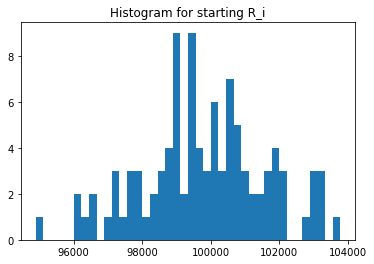

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([201996.5577461 , 254636.09001246, 256114.09001246, ...,
       195536.4157378 , 182963.40387685, 182312.94264833])

In [24]:
experiments.UNI_Si.unique()

array([10000., 14909., 15008., 14908., 14774., 14722., 14843., 14988.,
       14926., 14810., 14578., 14903., 15085., 14865., 14967., 14901.,
       14873., 14985., 14970., 14944., 14947., 14994., 14917., 14870.,
       14973., 14720., 14717., 14807., 14657., 15052., 14781., 14889.,
       14989., 14813., 15076., 14861., 14999., 14946., 14848., 14782.,
       14977., 14961., 15172., 14755., 15073., 14874., 15155., 14860.,
       14849., 14768., 14875., 14859., 14934., 14581., 14845., 15018.,
       15068., 15066., 14649., 15089., 14830., 14735., 14740., 14799.,
       14852., 14853., 14590., 15149., 14685., 14905., 14982., 14872.,
       14832., 14891., 15045., 14801., 14812., 14827., 14798., 14745.,
       14887., 15010., 15205., 14800., 15176., 15127., 15070., 15043.,
       15019., 14733., 15032., 14919., 15151., 14913., 14962., 14952.,
       15006., 14818., 14916., 15053., 14986., 14721., 14923., 14665.,
       14851., 14714., 14786., 14790., 14821., 15015., 14912., 14547.,
      

In [25]:
experiments.UNI_Qj.unique()

array([194418.4474541 , 201904.14952918, 200398.96300874, 197996.40227455,
       196600.92827866, 198222.06850876, 203454.75174422, 197747.81243404,
       195291.57119252, 196077.231658  , 197163.19100989, 194032.06930399,
       195796.0226227 , 200274.41256359, 207603.31638219, 193893.14310625,
       196395.68708622, 203172.92928252, 205690.05487723, 195079.09308881,
       211180.94193703, 194471.01880576, 200858.12505511, 203188.96817795,
       204688.0190082 , 208955.66475475, 202518.13993079, 202643.26662457,
       202361.02101812, 196139.41003538, 195113.38003965, 201175.61438211,
       201903.17850891, 201901.7459278 , 201191.35420859, 202098.49027696,
       193672.9508536 , 201004.38478618, 200911.82102208, 201939.03604997,
       195137.12985027, 205296.97880476, 202876.2016126 , 199108.23227827,
       203151.55171495, 194787.8221507 , 200739.82658988, 201042.13295417,
       200931.08249079, 195762.39587696, 196641.67923206, 206296.19078279,
       196356.27137964, 1

In [26]:
experiments.UNI_Rj.unique()

array([ 97209.22372705, 100952.07476459, 100199.48150437,  98998.20113728,
        98300.46413933,  99111.03425438, 101727.37587211,  98873.90621702,
        97645.78559626,  98038.615829  ,  98581.59550495,  97016.03465199,
        97898.01131135, 100137.2062818 , 103801.6581911 ,  96946.57155313,
        98197.84354311, 101586.46464126, 102845.02743862,  97539.54654441,
       105590.47096851,  97235.50940288, 100429.06252756, 101594.48408897,
       102344.0095041 , 104477.83237737, 101259.0699654 , 101321.63331229,
       101180.51050906,  98069.70501769,  97556.69001982, 100587.80719106,
       100951.58925445, 100950.8729639 , 100595.67710429, 101049.24513848,
        96836.4754268 , 100502.19239309, 100455.91051104, 100969.51802499,
        97568.56492513, 102648.48940238, 101438.1008063 ,  99554.11613914,
       101575.77585748,  97393.91107535, 100369.91329494, 100521.06647709,
       100465.5412454 ,  97881.19793848,  98320.83961603, 103148.09539139,
        98178.13568982,  

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 97209.22372705,  98998.20113728, 100952.07476459,  98300.46413933,
       101727.37587211,  98873.90621702,  97645.78559626, 100199.48150437,
        98581.59550495,  97898.01131135,  99111.03425438,  96946.57155313,
       103801.6581911 , 100137.2062818 , 102845.02743862,  97539.54654441,
        98197.84354311, 101586.46464126,  97235.50940288, 101594.48408897,
       102344.0095041 , 104477.83237737, 101321.63331229,  98038.615829  ,
       101259.0699654 , 101180.51050906,  98069.70501769,  97016.03465199,
       100429.06252756, 100595.67710429, 100950.8729639 ,  96836.4754268 ,
       100502.19239309, 100455.91051104, 102648.48940238, 101575.77585748,
       101438.1008063 ,  97393.91107535,  97556.69001982,  99554.11613914,
       100369.91329494, 101049.24513848, 100521.06647709, 100465.5412454 ,
       103148.09539139,  98320.83961603,  98445.85349378,  98178.13568982,
       100587.80719106,  97881.19793848, 100969.51802499, 100695.23274396,
       101640.17738244,  

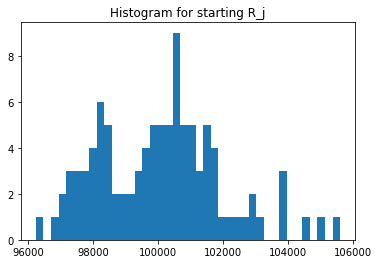

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100998.27887305,  99383.54500623,  98806.02781904,  99418.36888778,
       100716.70989512, 100194.32425272, 101955.97973737, 100754.1504107 ,
       100664.65974829,  97724.53133637, 101879.82436946, 101031.7181205 ,
        99973.01189183, 103773.6459511 ,  98335.73721185,  98803.91770933,
        99549.51030708,  99629.40756547, 100135.13413065,  99346.88336395,
        96103.21613609,  97190.99577765,  98605.84383074, 102974.38116142,
        97811.84641555, 100222.06920894,  99561.66365956, 101970.0495051 ,
        98917.24782412,  99046.32394905,  99083.04448048, 102083.1946731 ,
        97907.00331514, 101847.47977958,  96535.70193842, 100689.53428609,
        99768.99379084, 100650.2078689 , 101487.74385306,  98968.91569358,
       100394.45905789, 100343.29019185,  99001.60364256,  98396.17492283,
        98570.76742164, 102136.53705374,  99399.66208935,  97086.53581314,
       101230.74232906, 102999.60072183,  98946.17755173,  97588.11897026,
       101658.52873405, 1

In [31]:
experiments.UNI_ji.unique()

array([ 97209.22372705, 100952.07476459, 100199.48150437,  98998.20113728,
        98300.46413933,  99111.03425438, 101727.37587211,  98873.90621702,
        97645.78559626,  98038.615829  ,  98581.59550495,  97016.03465199,
        97898.01131135, 100137.2062818 , 103801.6581911 ,  96946.57155313,
        98197.84354311, 101586.46464126, 102845.02743862,  97539.54654441,
       105590.47096851,  97235.50940288, 100429.06252756, 101594.48408897,
       102344.0095041 , 104477.83237737, 101259.0699654 , 101321.63331229,
       101180.51050906,  98069.70501769,  97556.69001982, 100587.80719106,
       100951.58925445, 100950.8729639 , 100595.67710429, 101049.24513848,
        96836.4754268 , 100502.19239309, 100455.91051104, 100969.51802499,
        97568.56492513, 102648.48940238, 101438.1008063 ,  99554.11613914,
       101575.77585748,  97393.91107535, 100369.91329494, 100521.06647709,
       100465.5412454 ,  97881.19793848,  98320.83961603, 103148.09539139,
        98178.13568982,  

In [32]:
experiments.UNI_Sij.unique()

array([9.81796429e+09, 1.00329751e+10, 9.90031276e+09, 9.84223968e+09,
       9.90049933e+09, 9.93036310e+09, 1.03717143e+10, 9.96195642e+09,
       9.82947978e+09, 9.58077778e+09, 1.00434756e+10, 9.80169667e+09,
       9.78715905e+09, 1.03916030e+10, 1.02074126e+10, 9.57870108e+09,
       9.77554724e+09, 1.01209993e+10, 1.02984006e+10, 9.69024995e+09,
       1.01475839e+10, 9.45041598e+09, 9.90289246e+09, 1.04616291e+10,
       1.00104565e+10, 1.04709845e+10, 1.00815215e+10, 1.03317720e+10,
       1.00084976e+10, 9.71344377e+09, 9.66621386e+09, 1.02683247e+10,
       9.88386758e+09, 1.02815920e+10, 9.71107430e+09, 1.01746014e+10,
       9.66127772e+09, 1.01155666e+10, 1.01950437e+10, 9.99284372e+09,
       9.79534330e+09, 1.03000872e+10, 1.00425347e+10, 9.79574423e+09,
       1.00124022e+10, 9.94747681e+09, 9.97673547e+09, 9.75924212e+09,
       1.01702013e+10, 1.00817243e+10, 9.72847125e+09, 1.00660286e+10,
       9.98064483e+09, 9.88579074e+09, 9.99227694e+09, 9.89760437e+09,
      

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


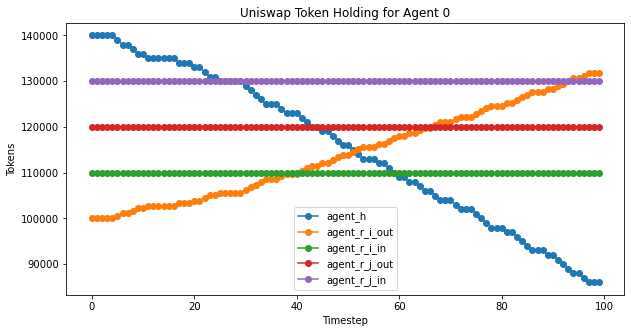

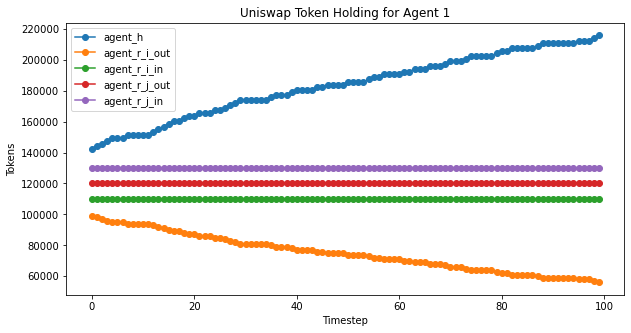

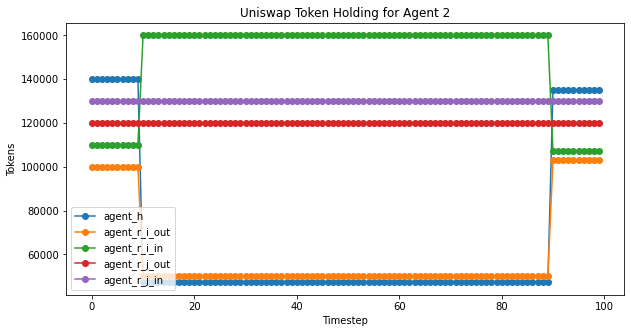

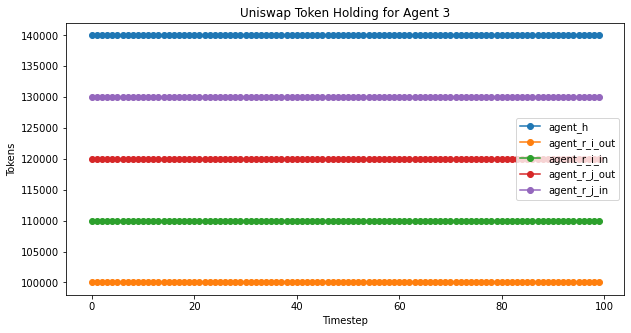

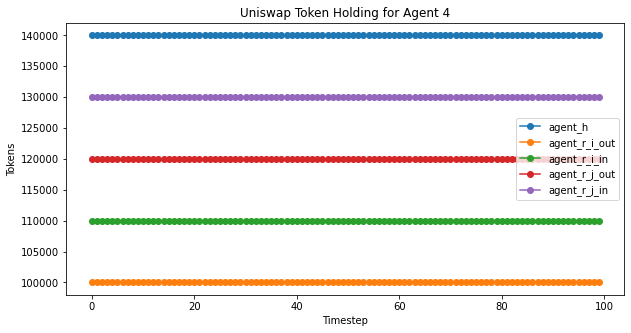

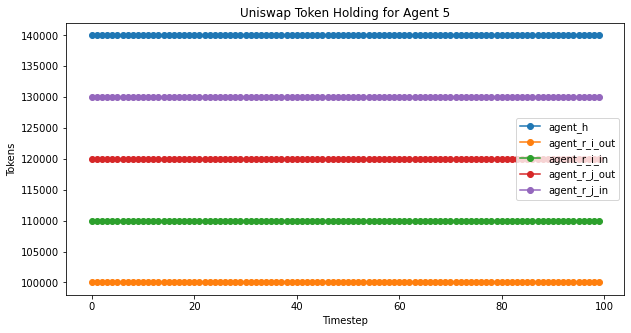

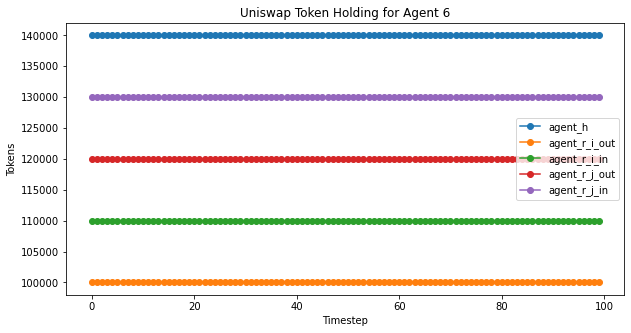

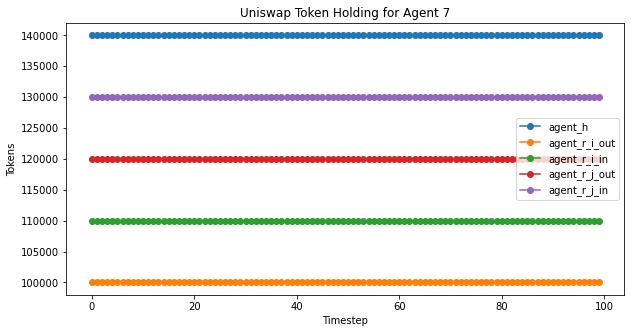

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


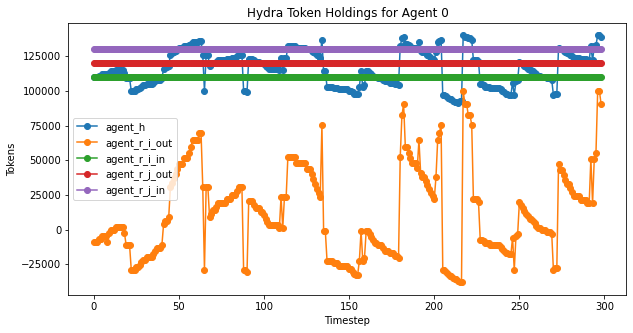

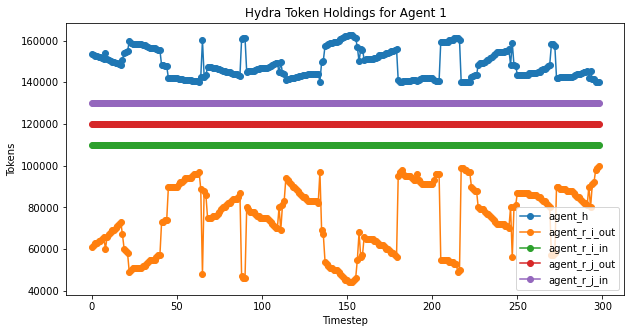

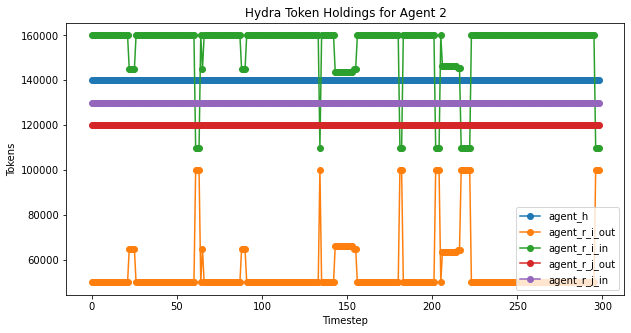

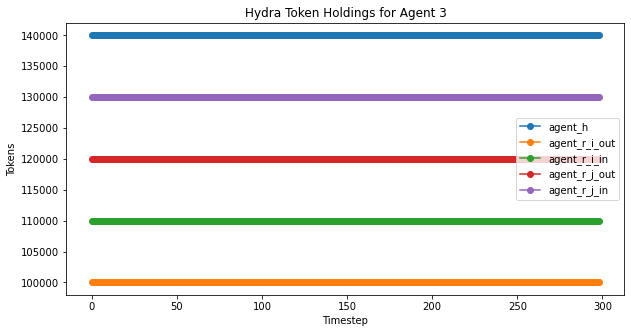

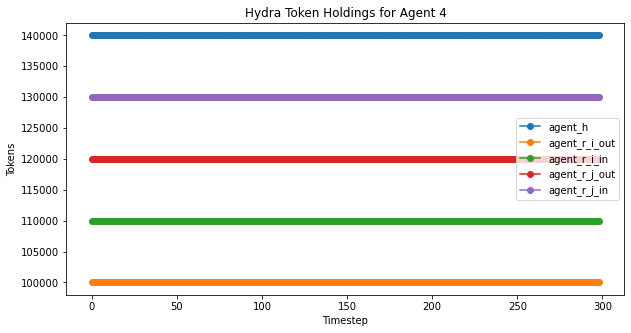

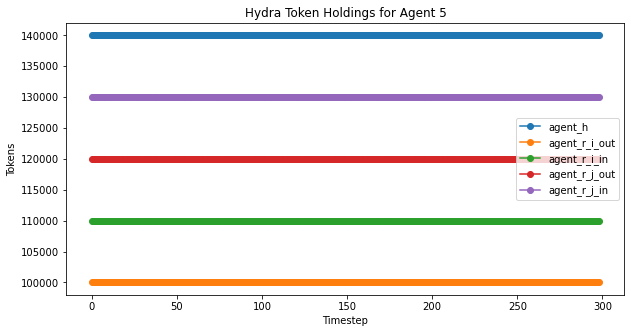

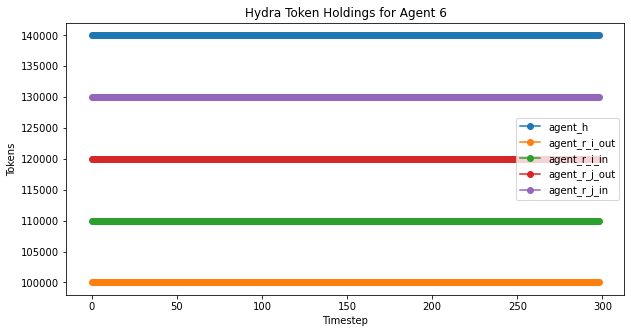

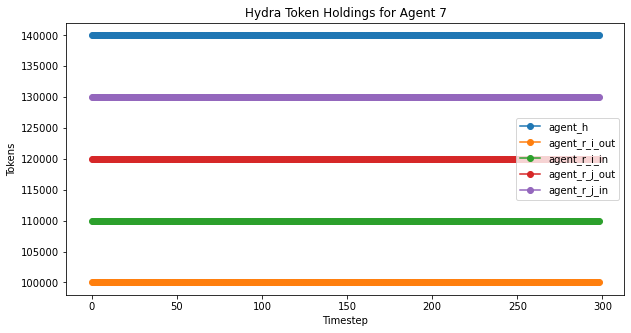

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

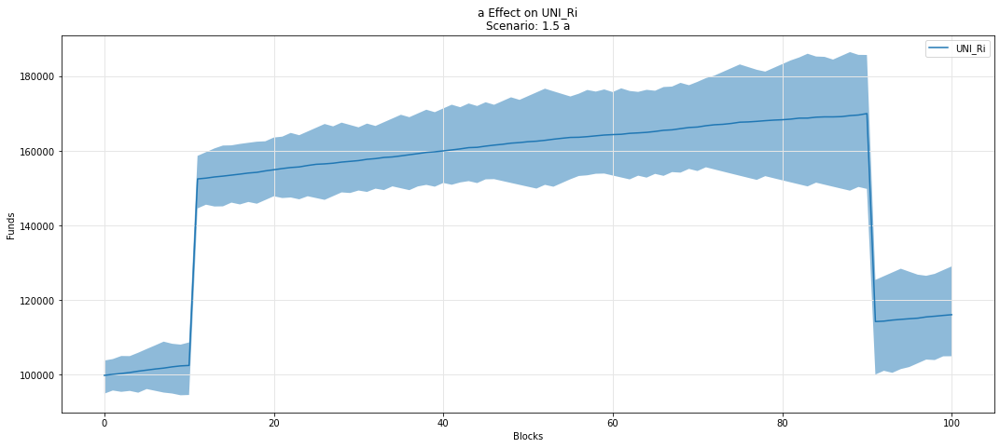

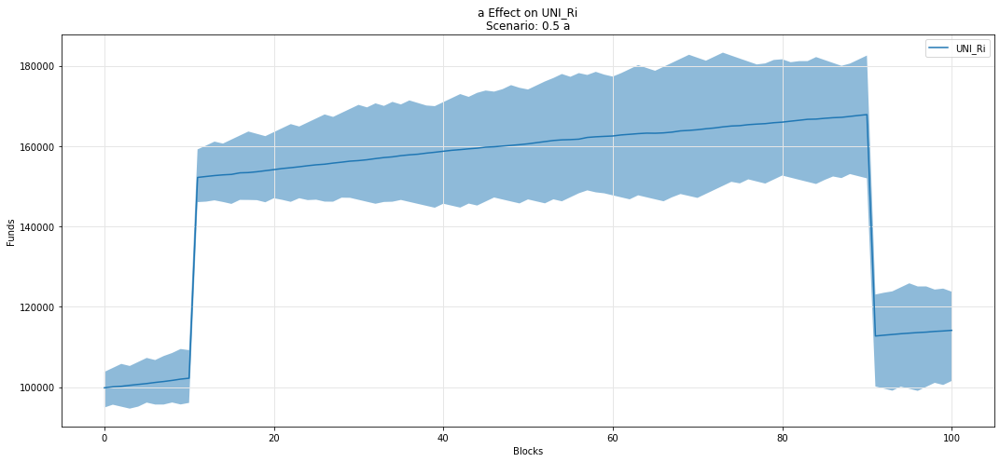

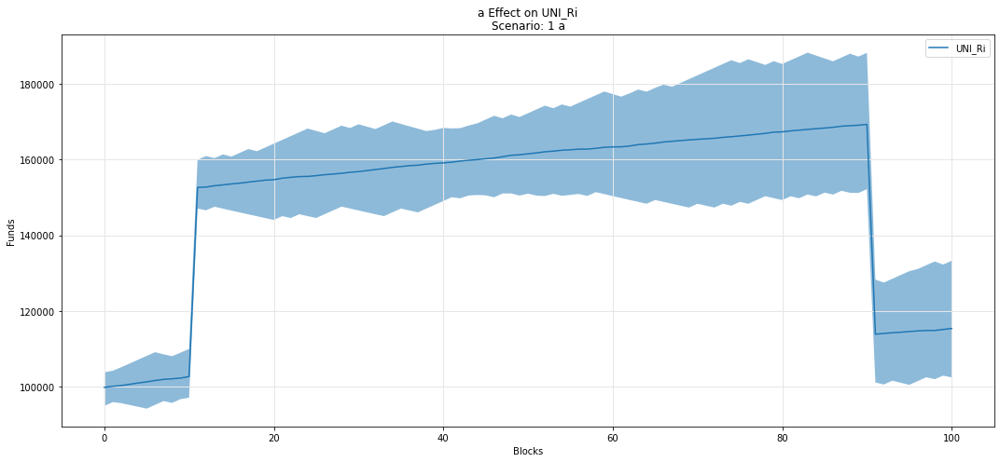

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

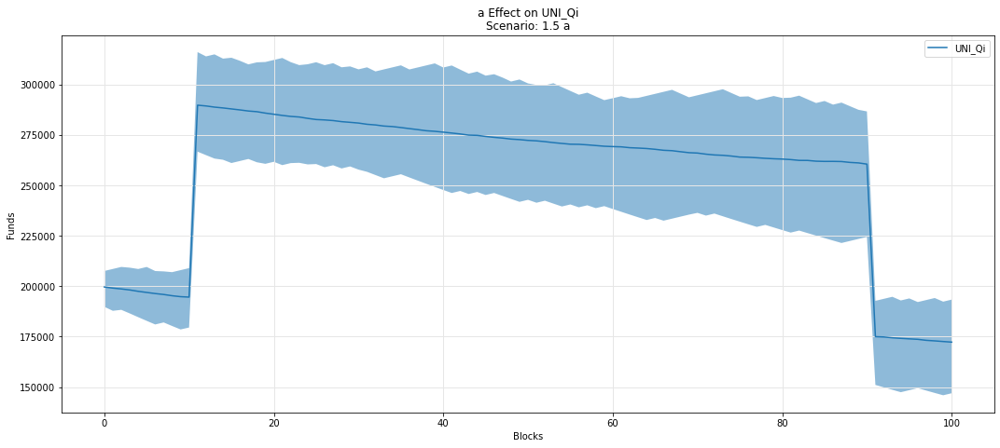

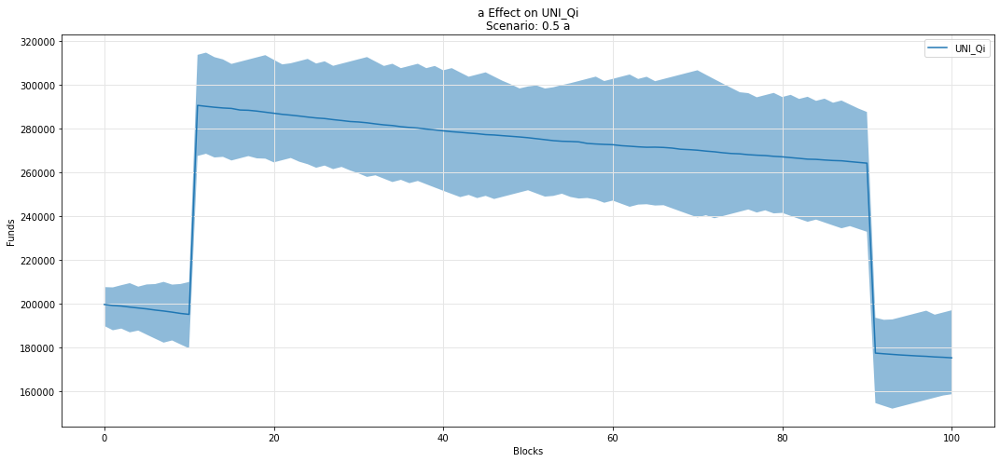

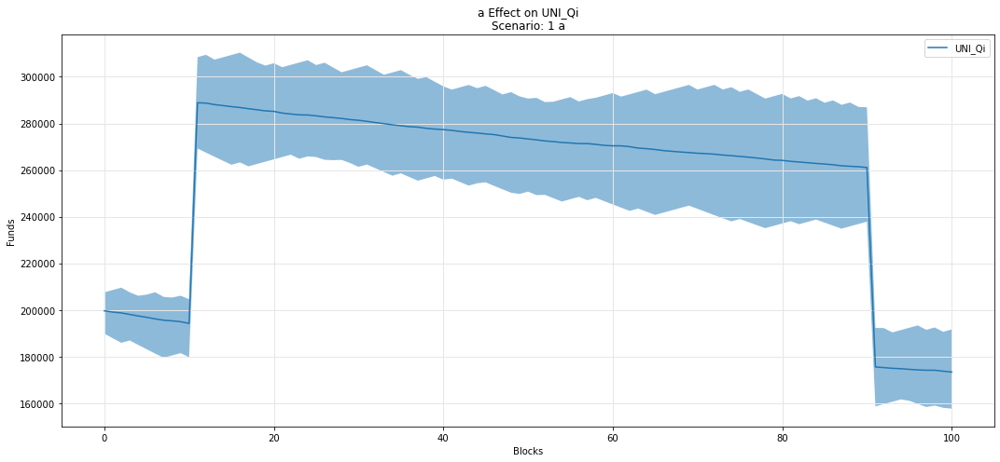

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

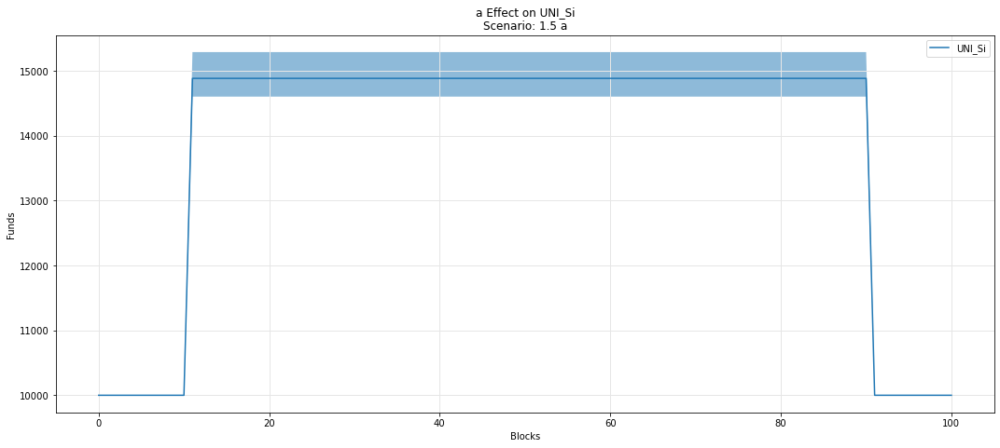

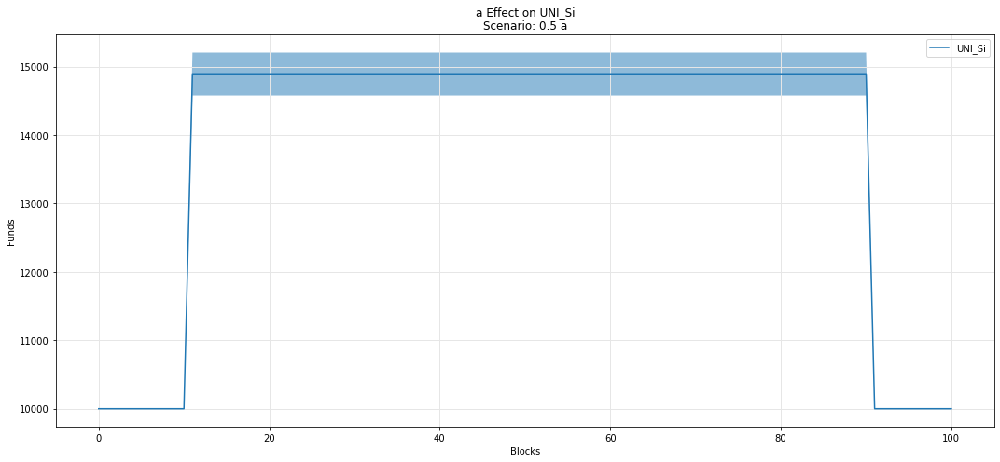

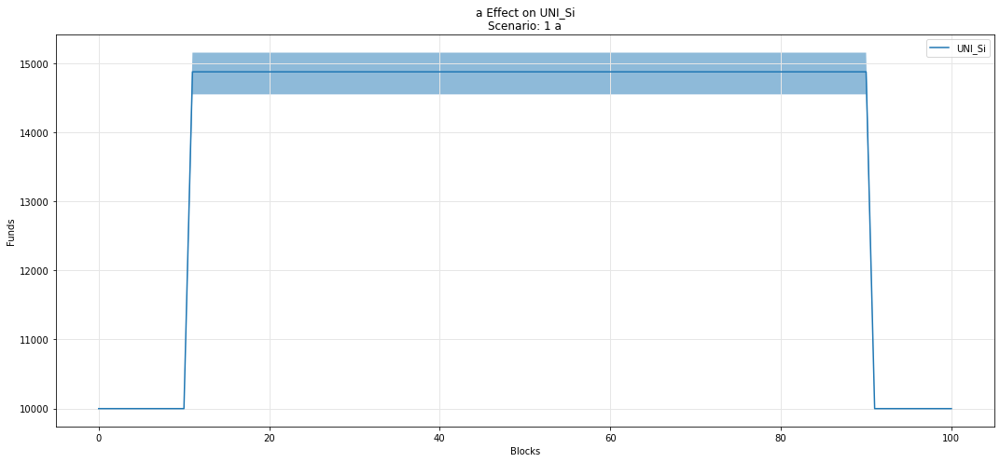

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

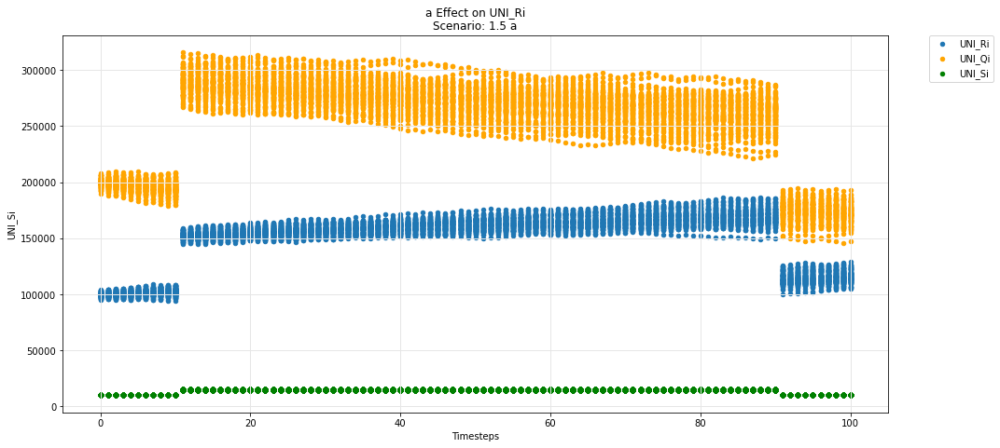

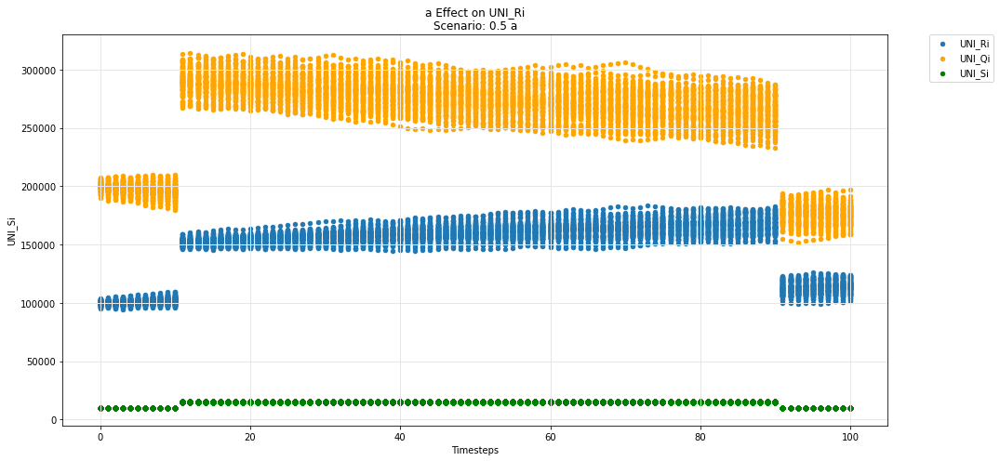

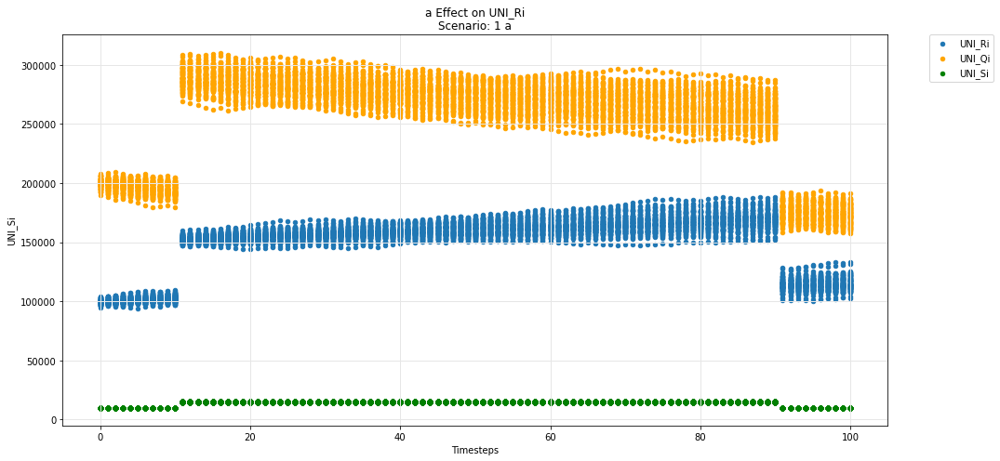

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

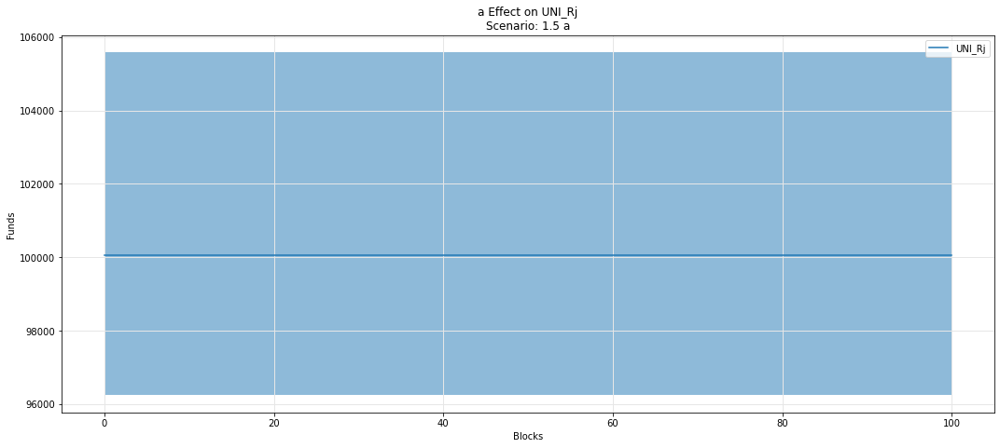

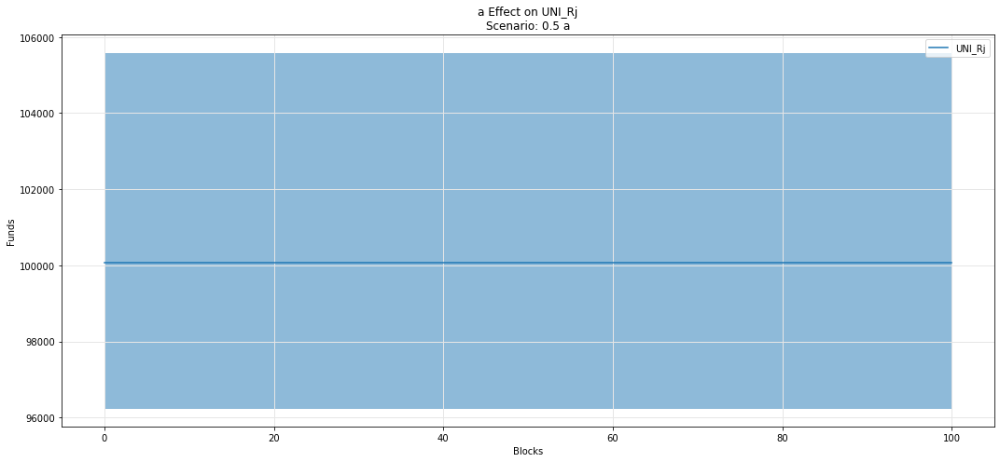

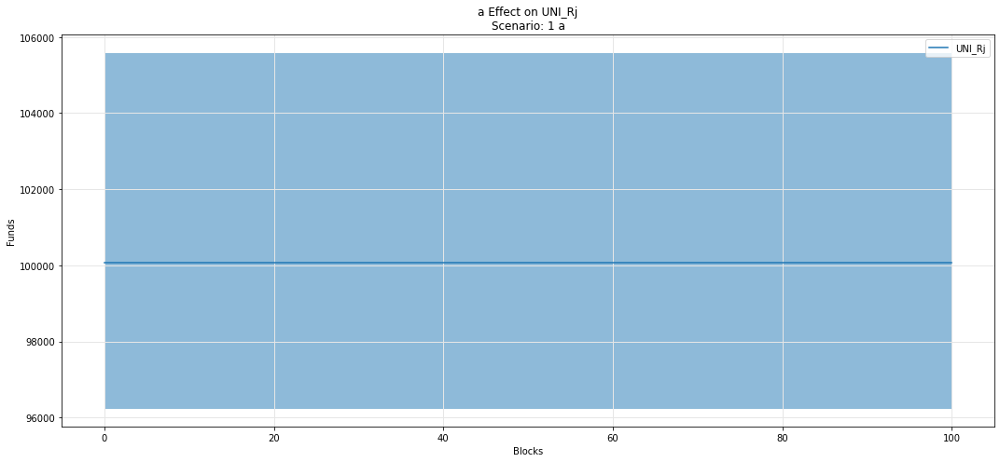

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

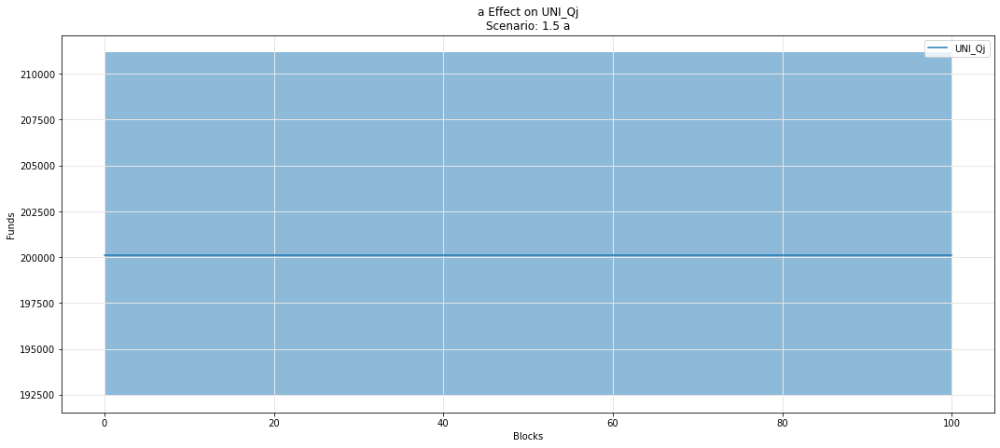

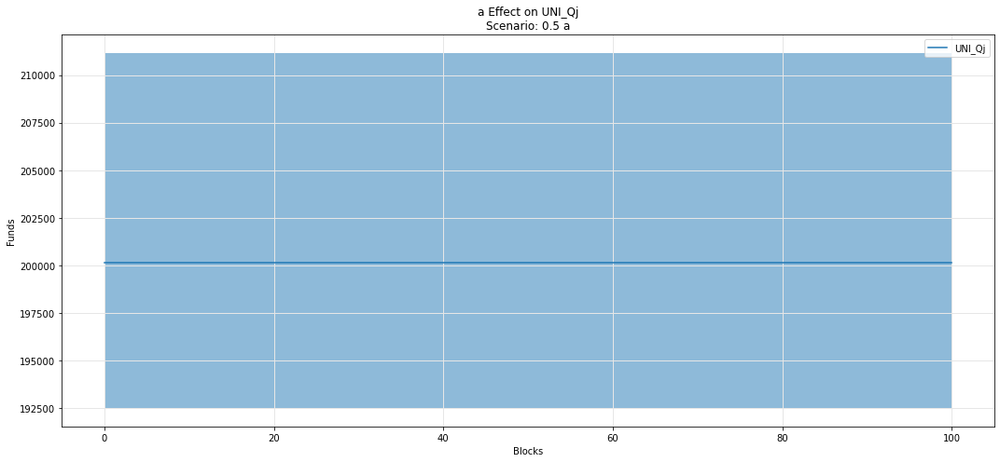

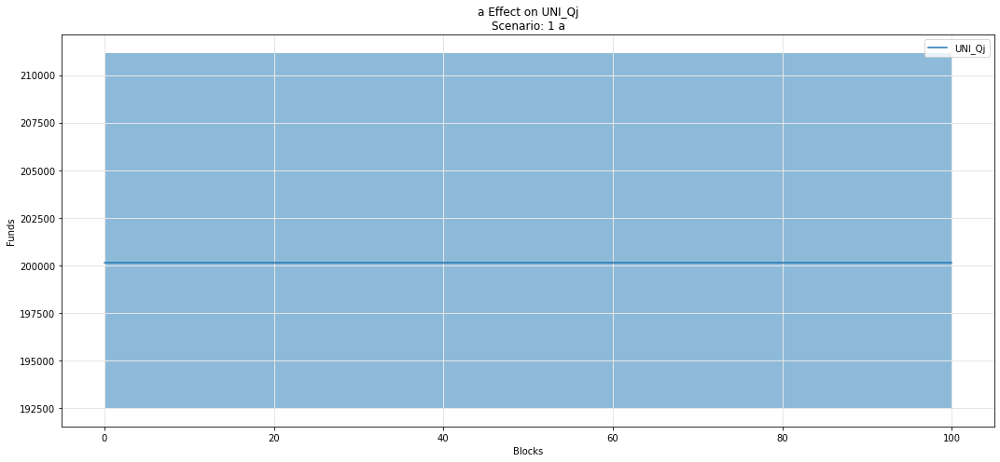

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

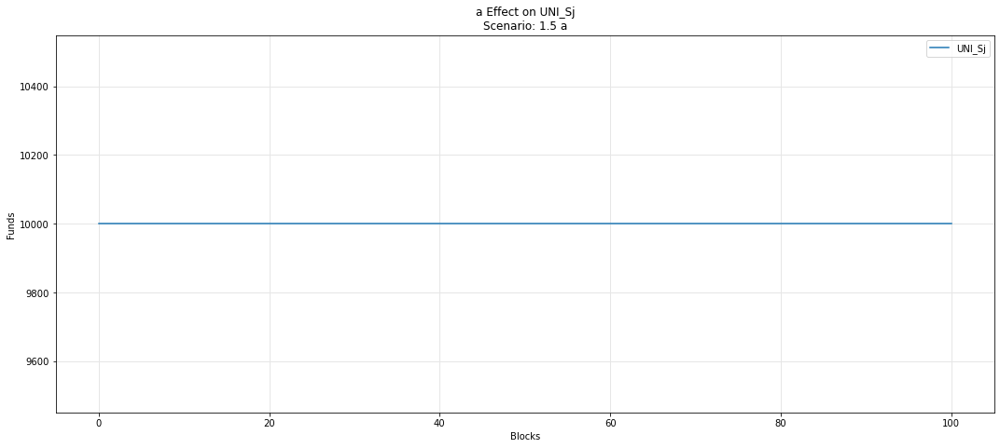

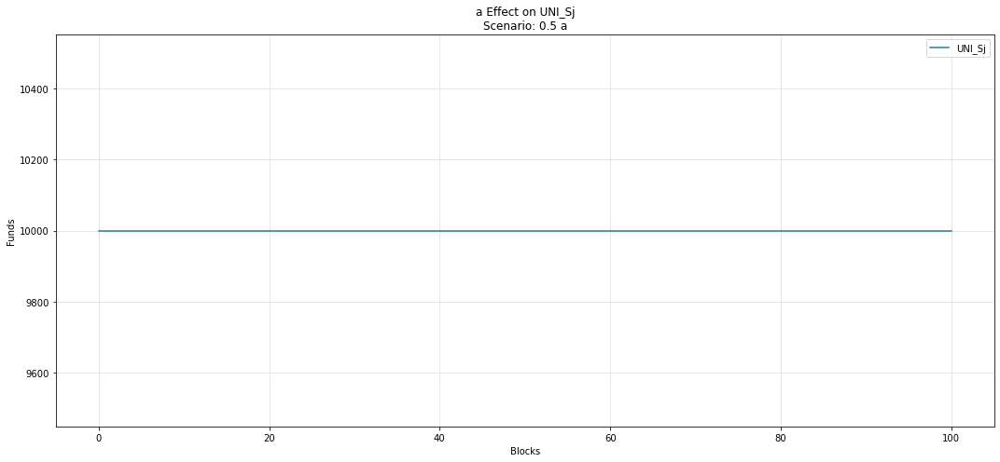

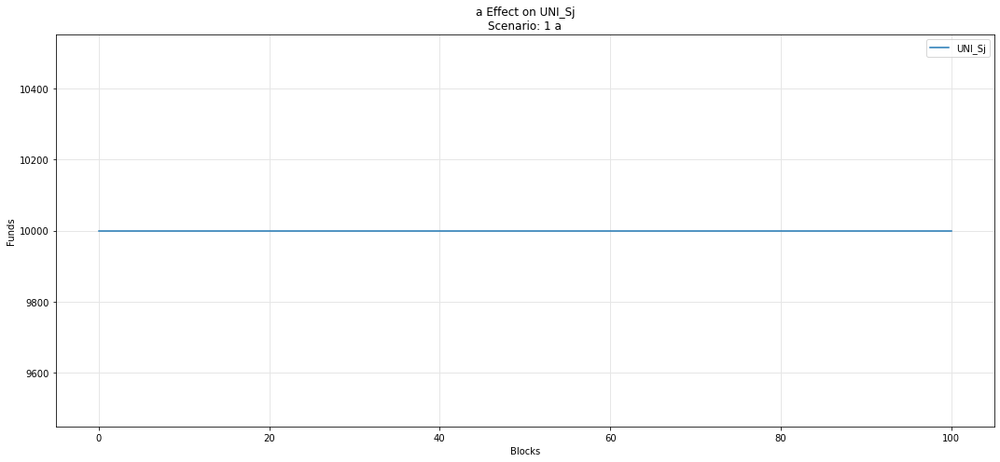

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

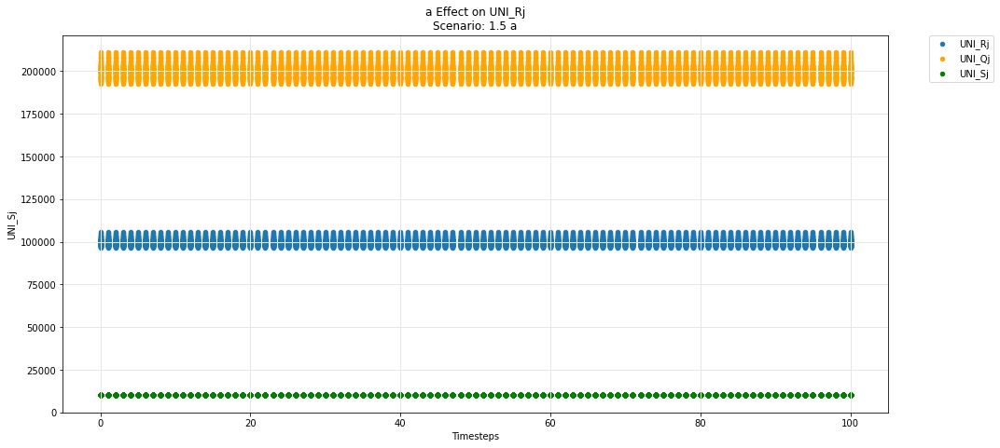

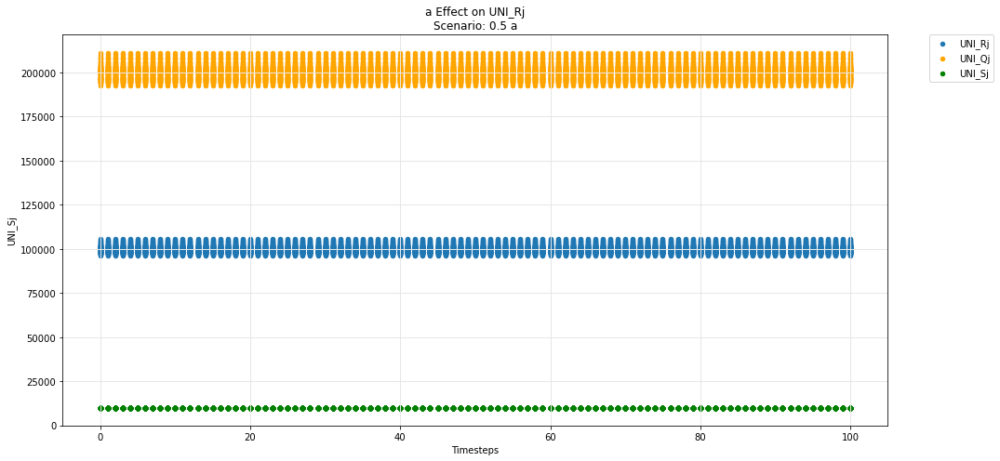

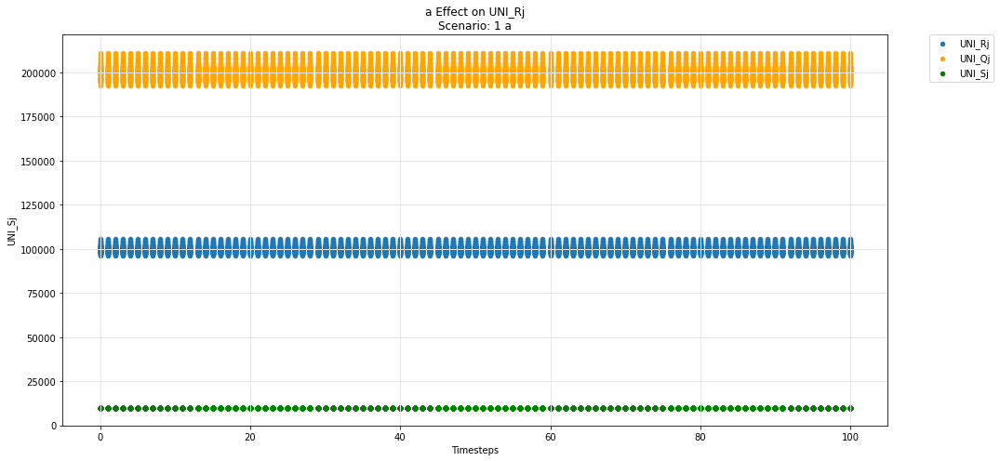

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

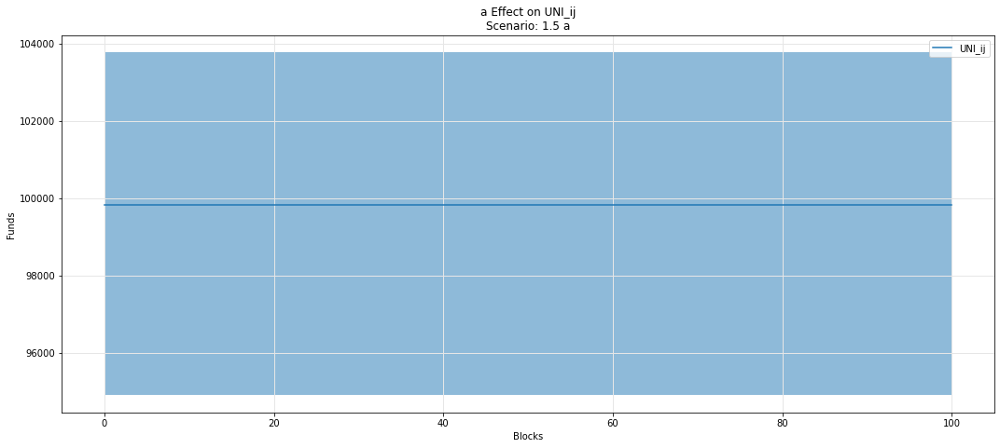

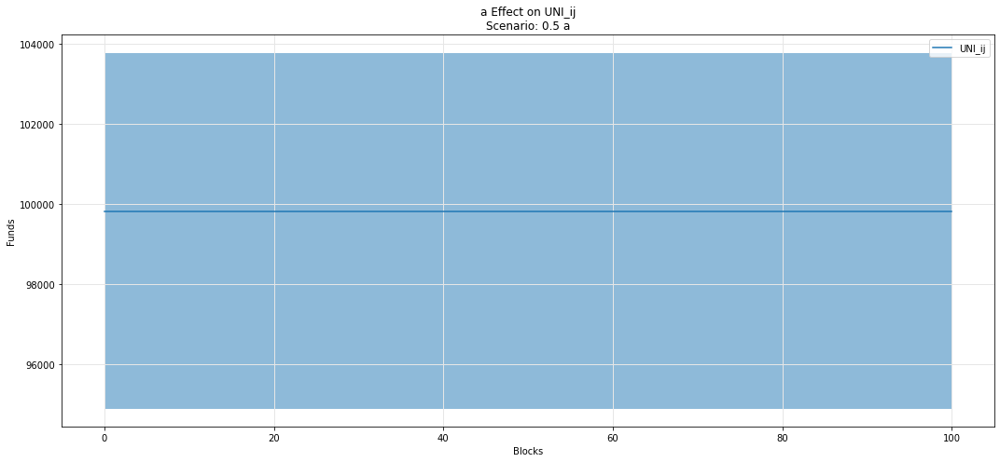

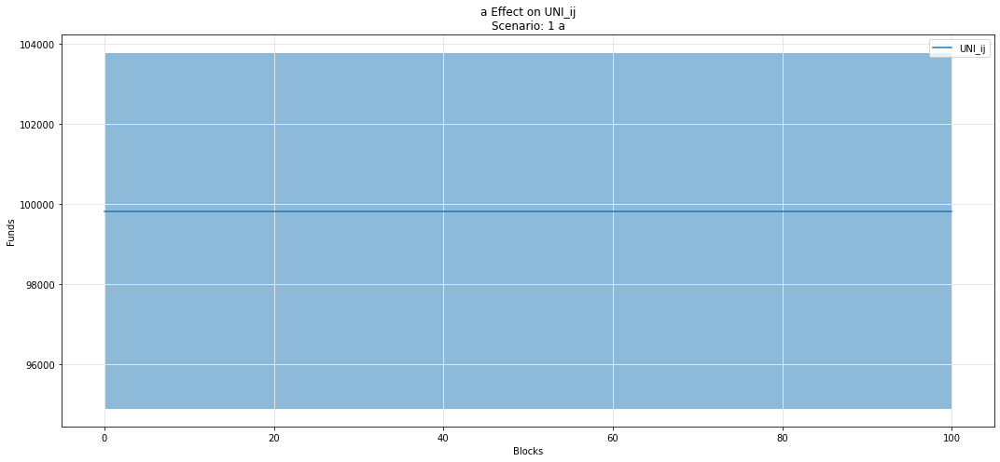

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

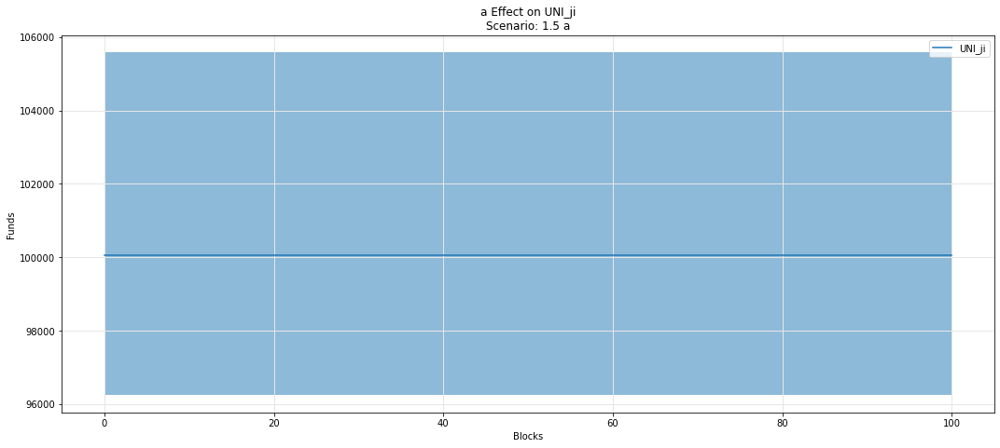

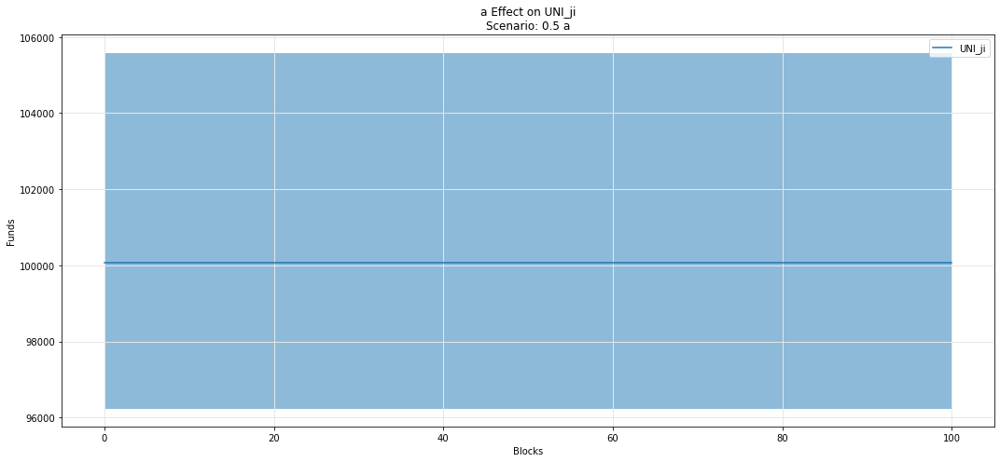

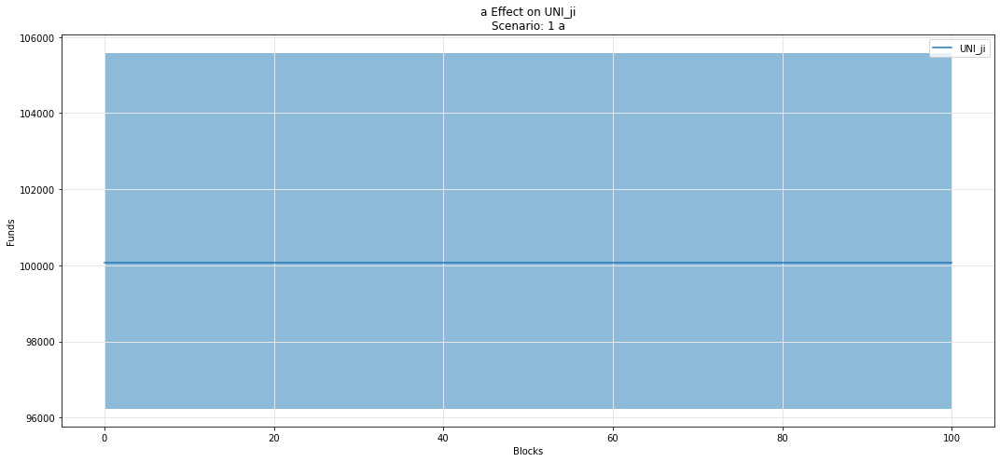

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

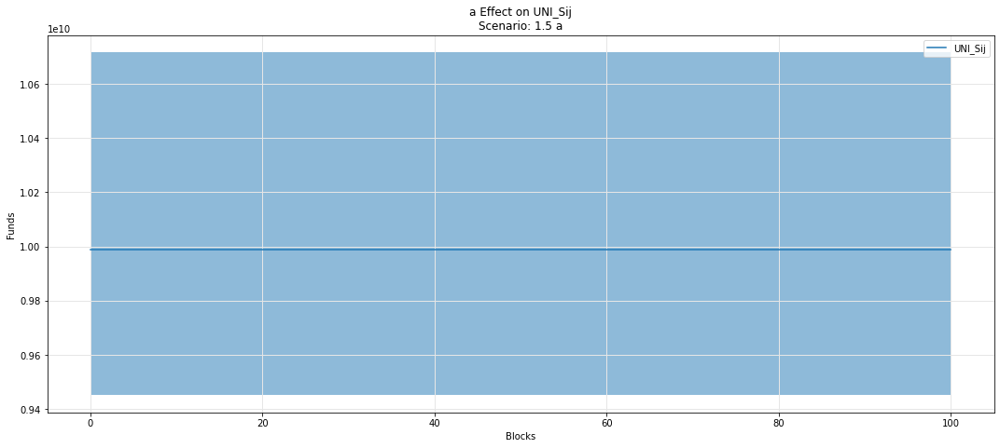

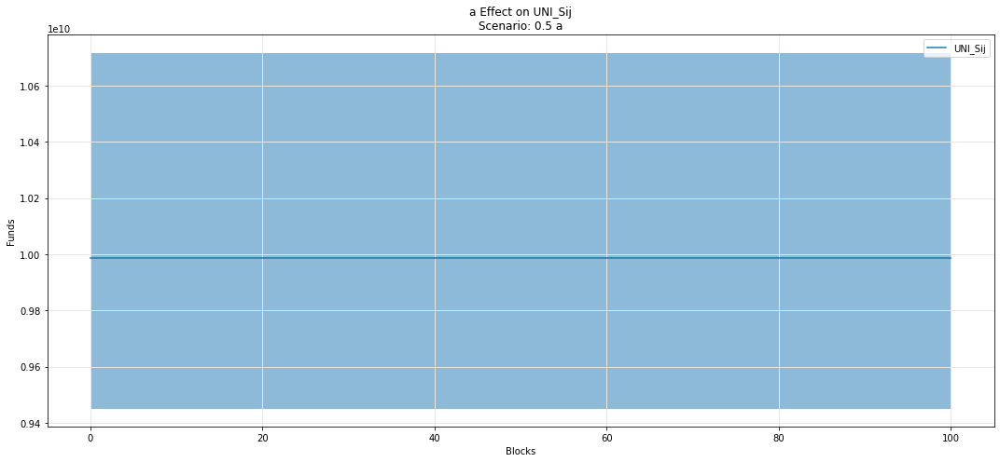

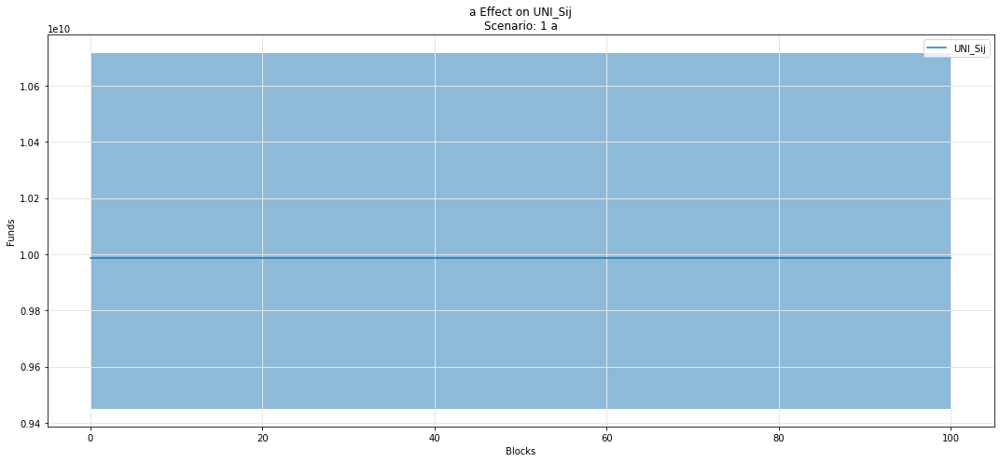

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

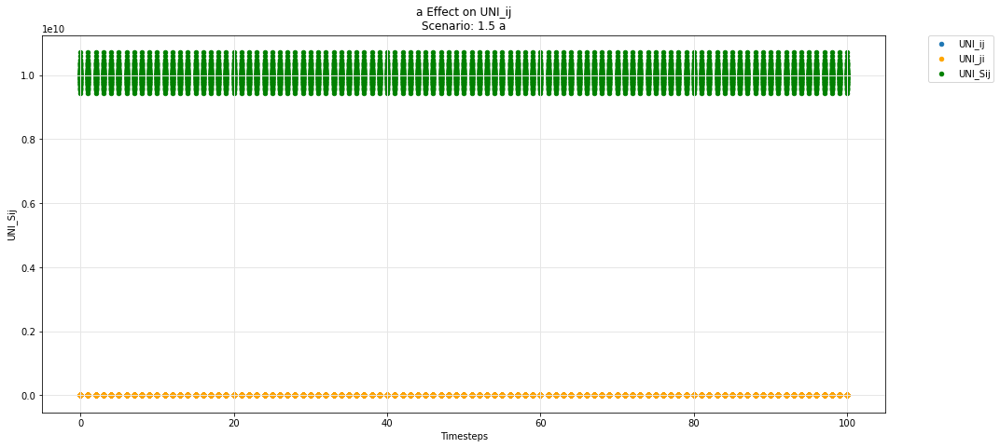

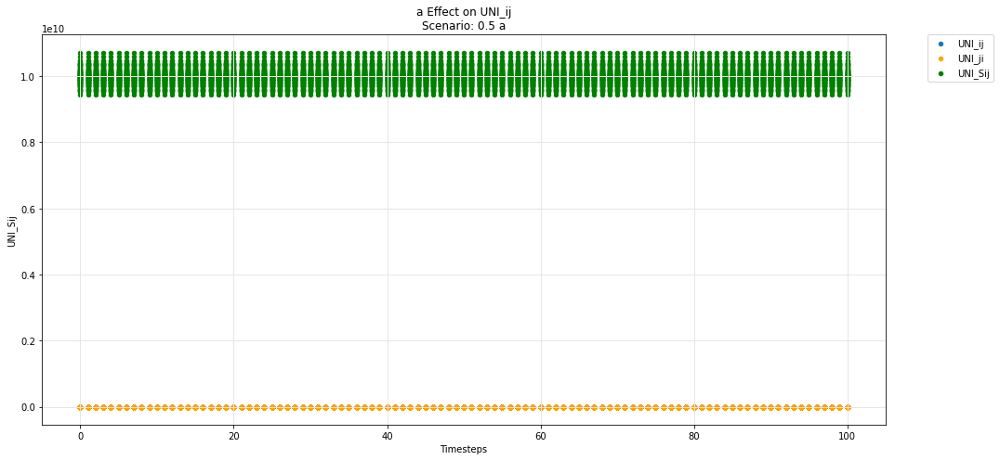

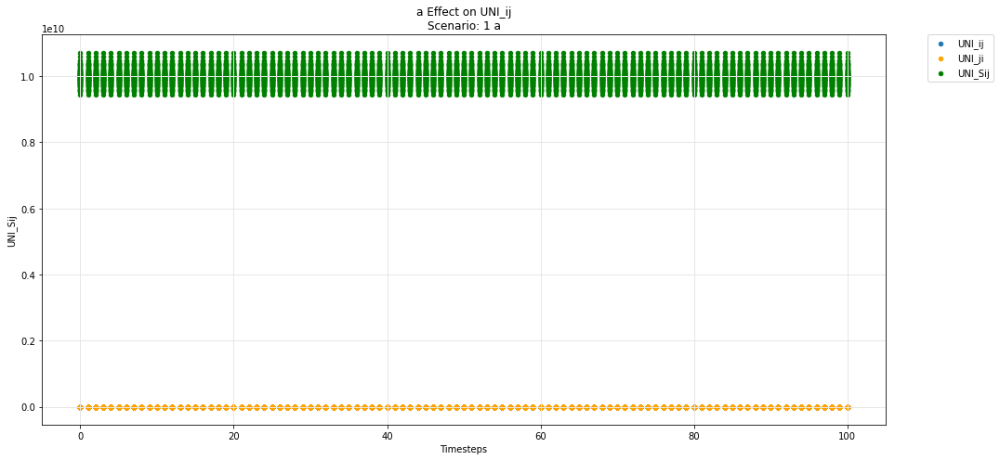

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

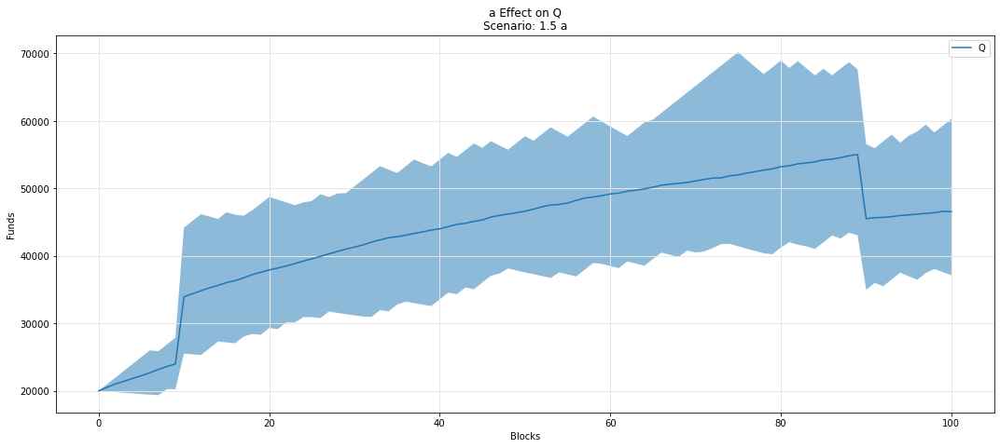

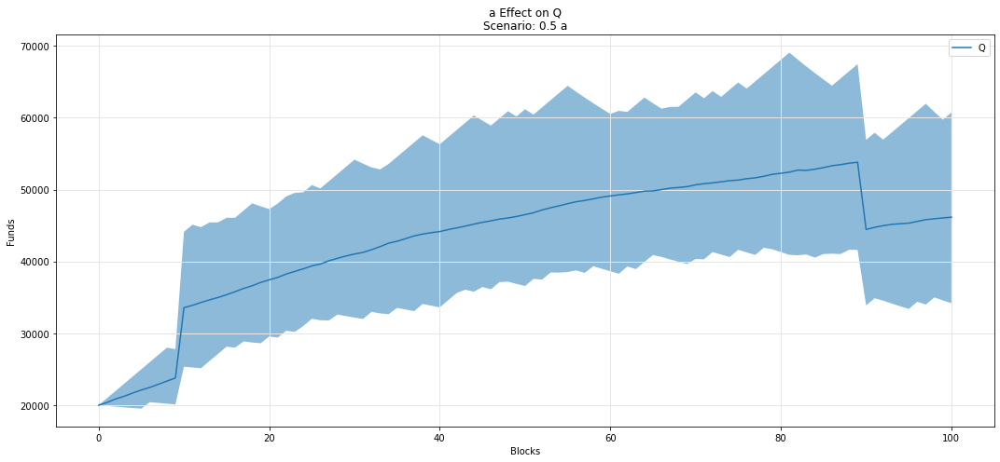

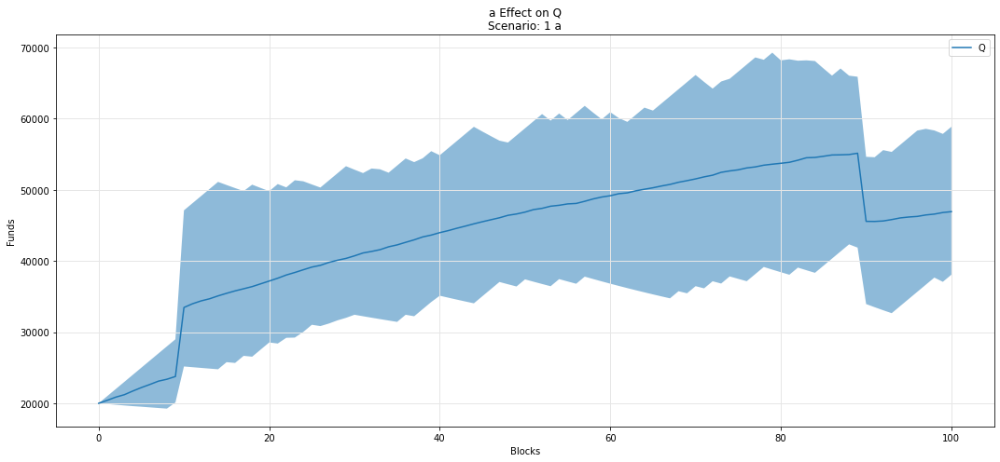

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

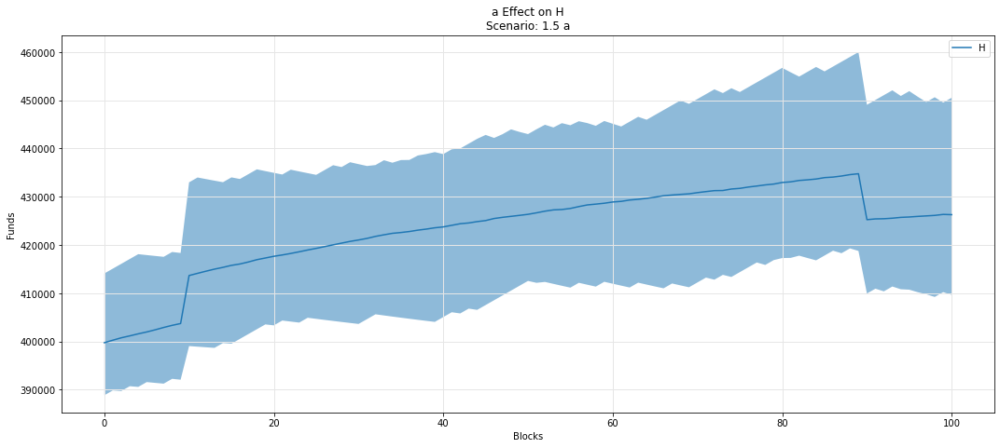

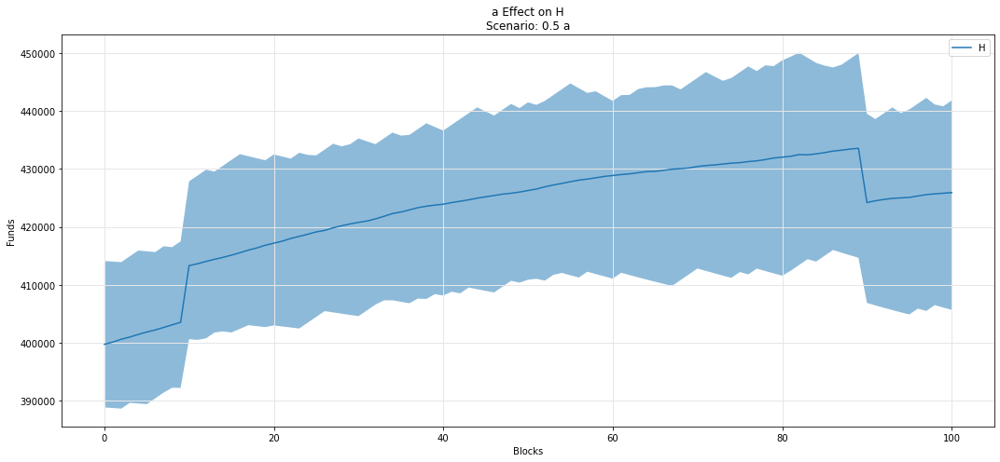

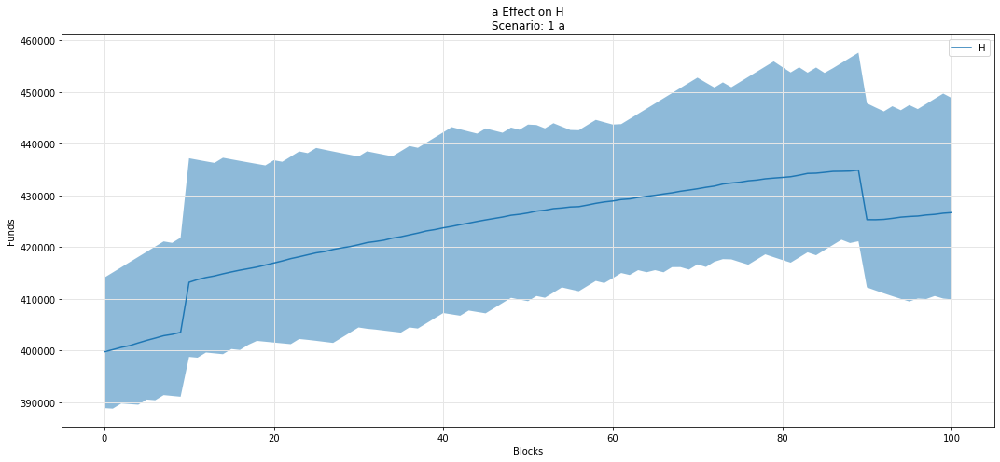

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

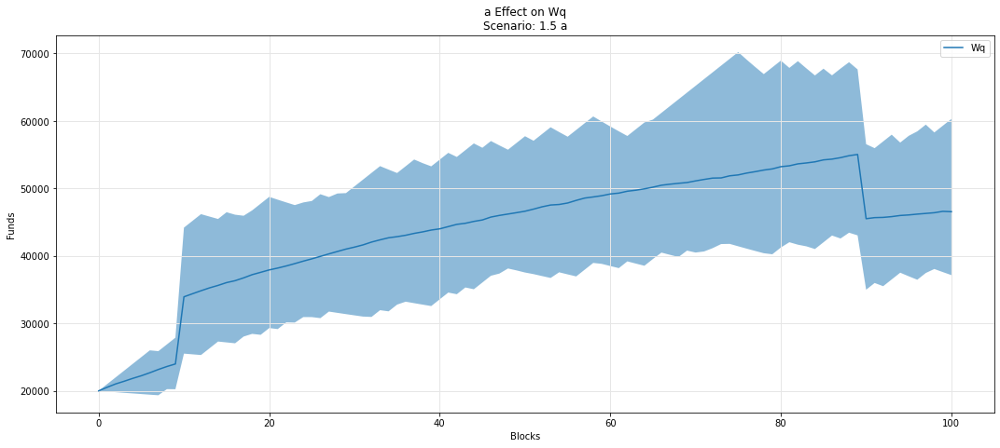

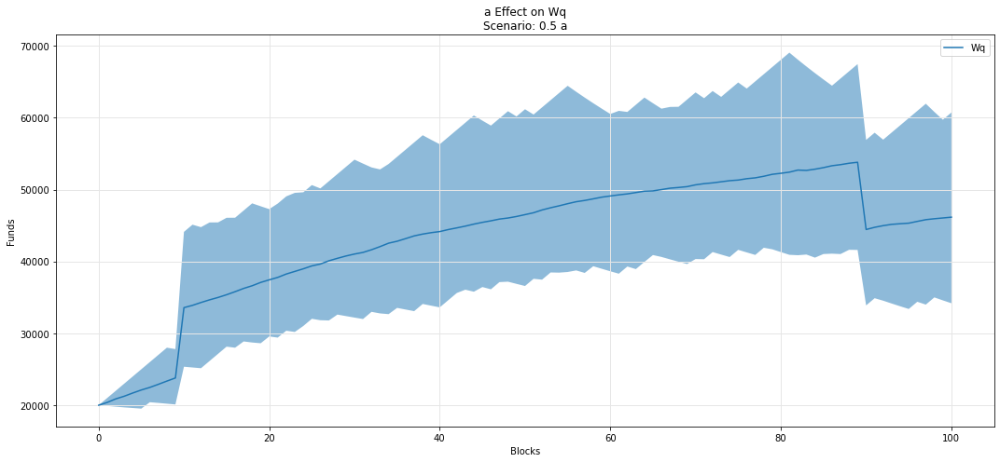

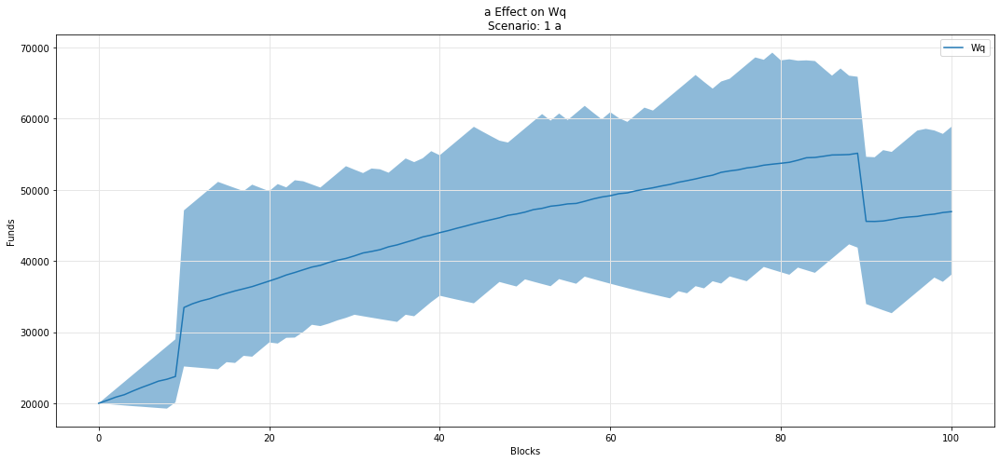

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

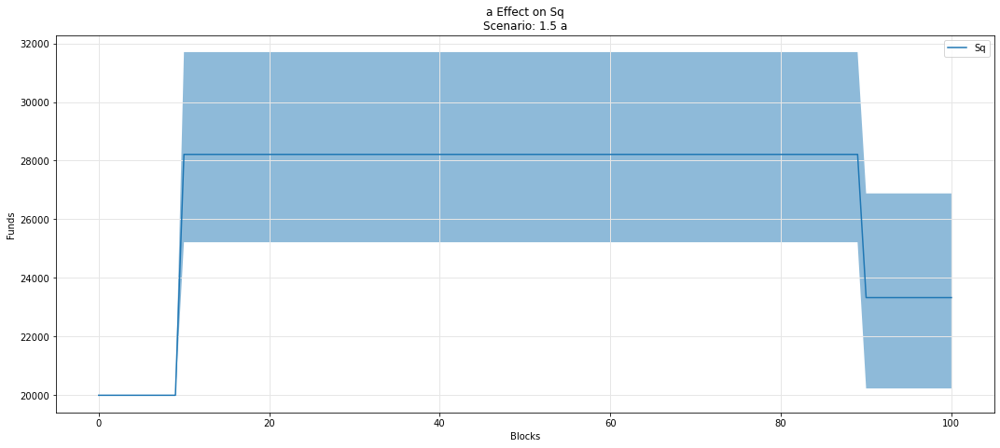

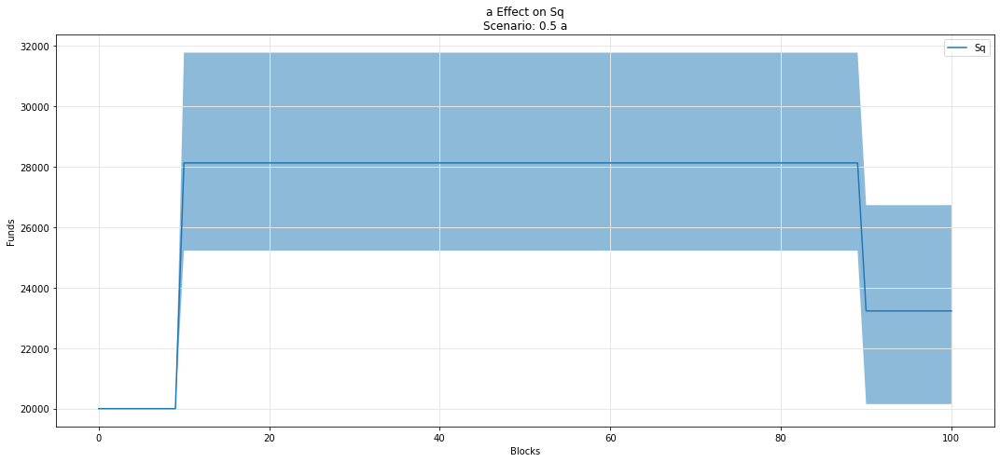

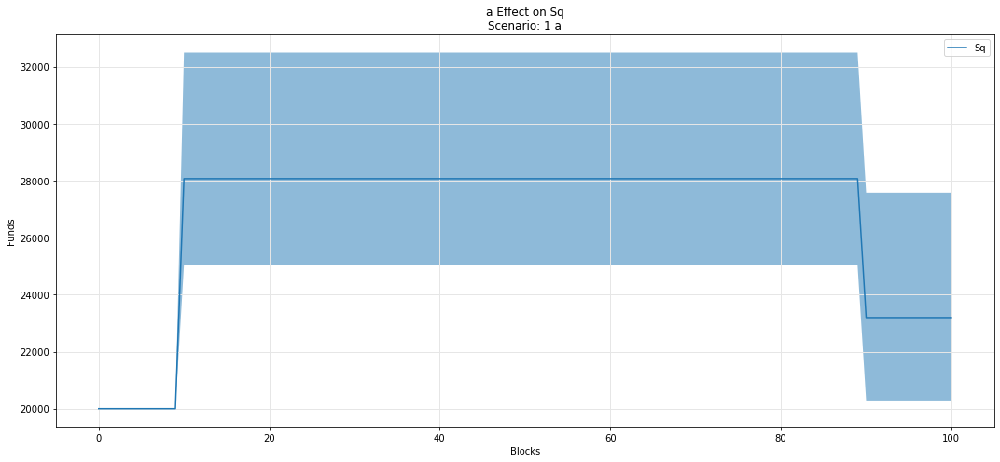

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

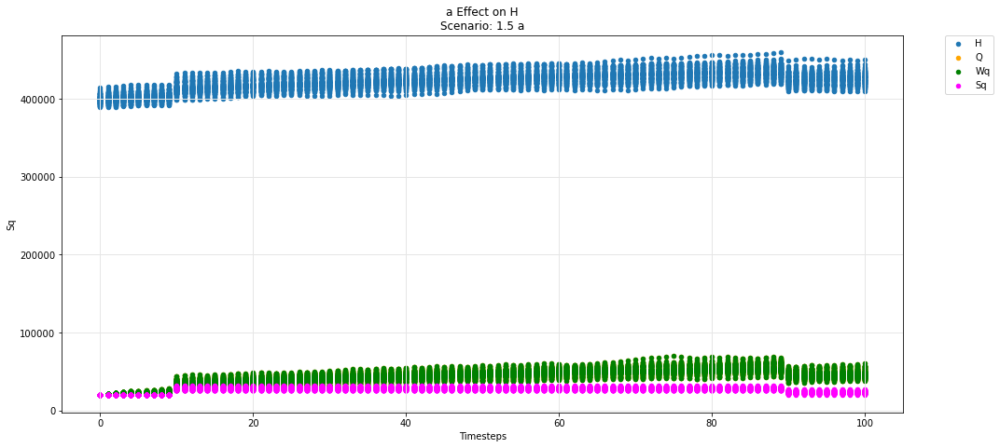

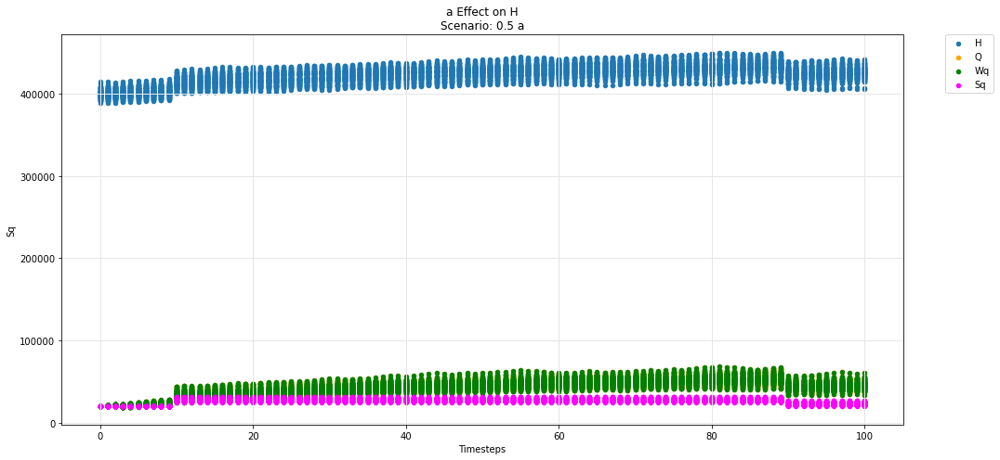

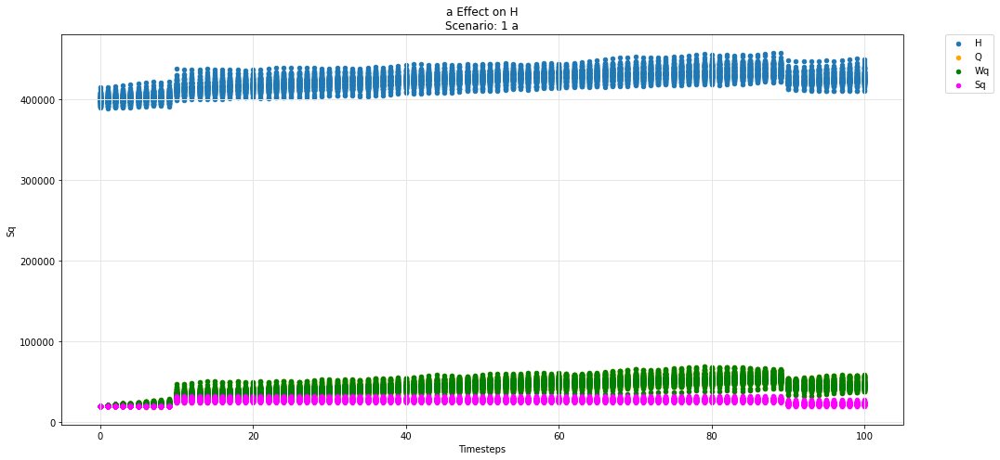

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

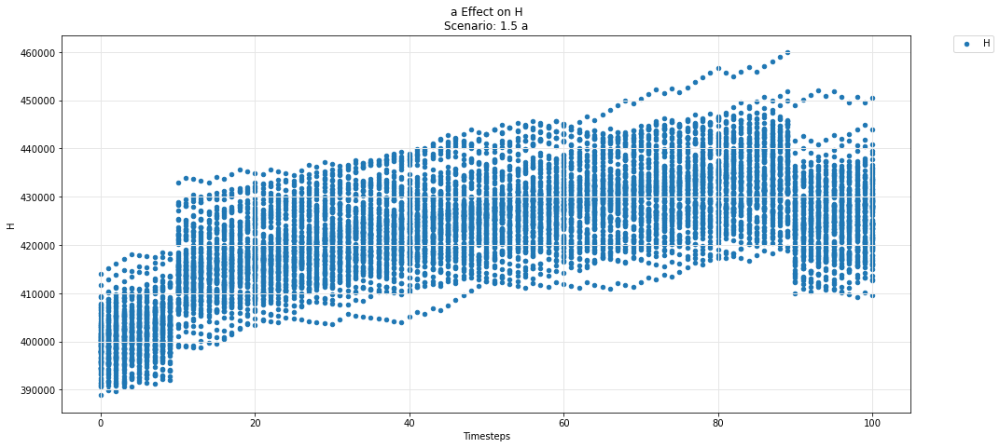

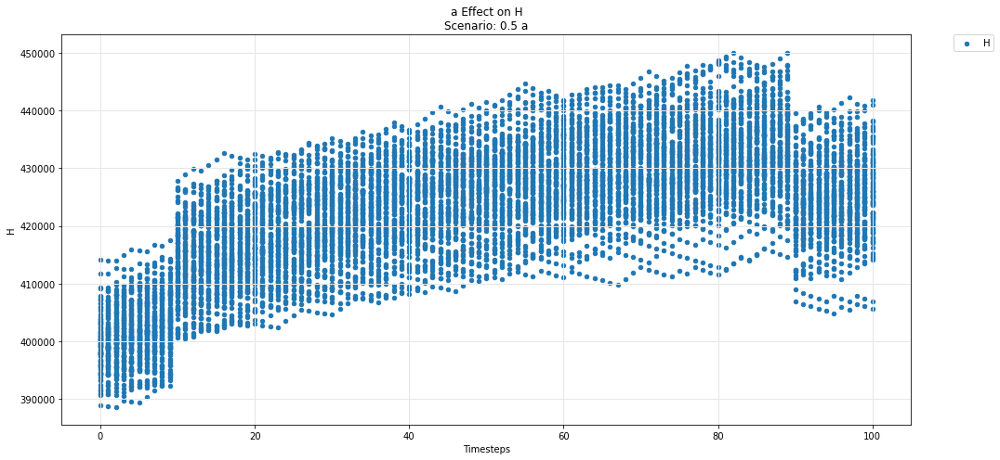

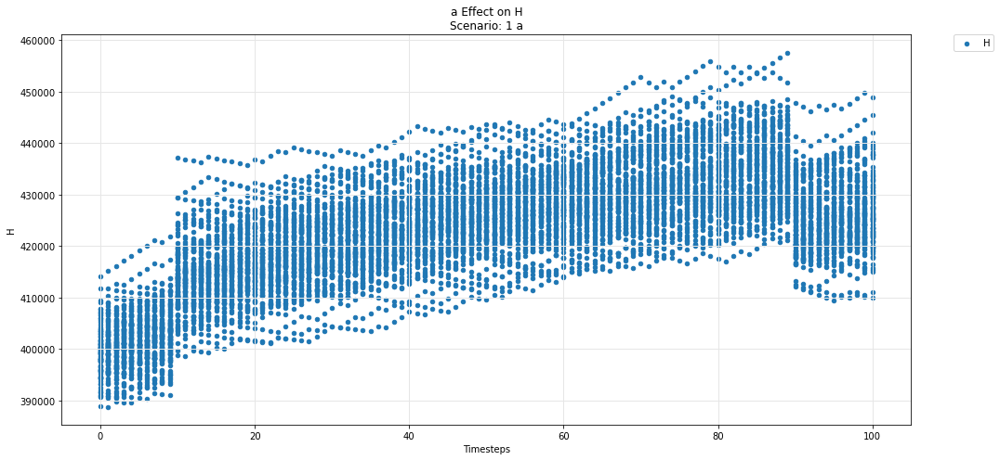

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

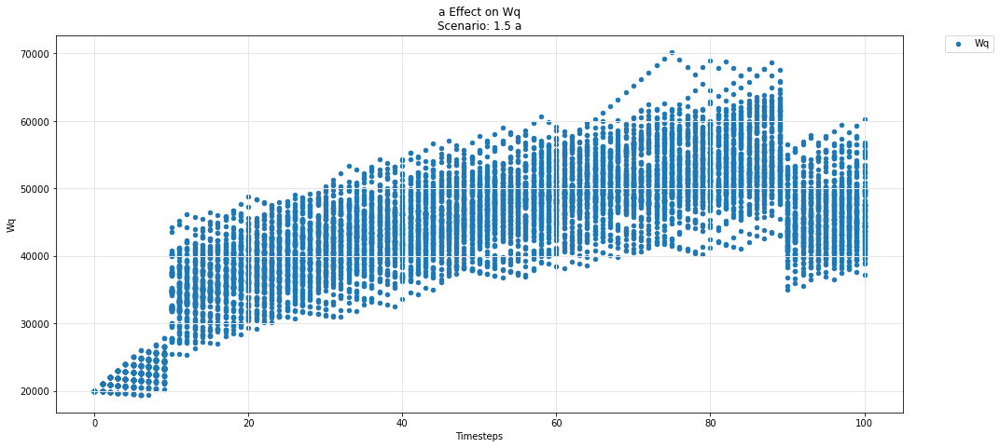

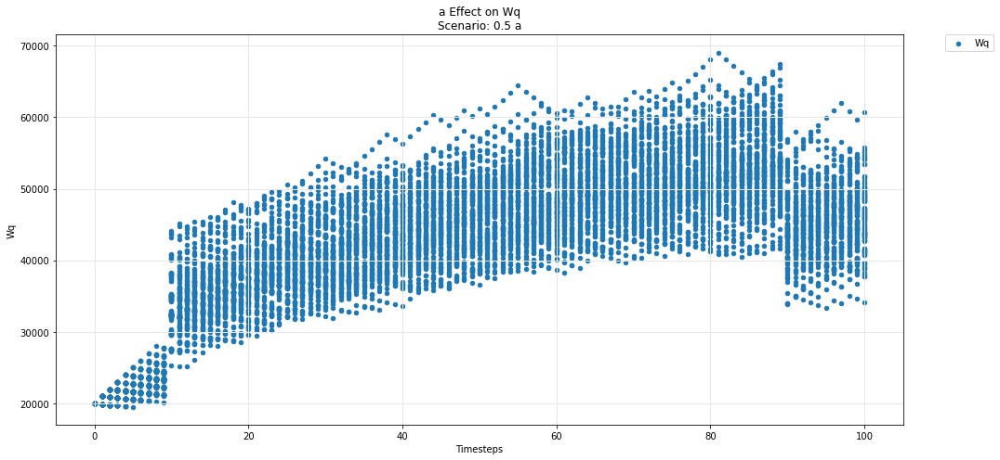

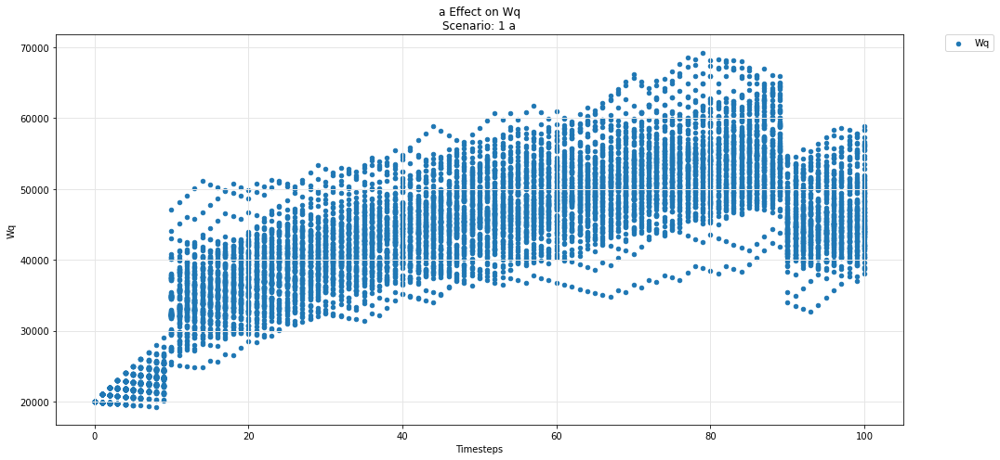

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

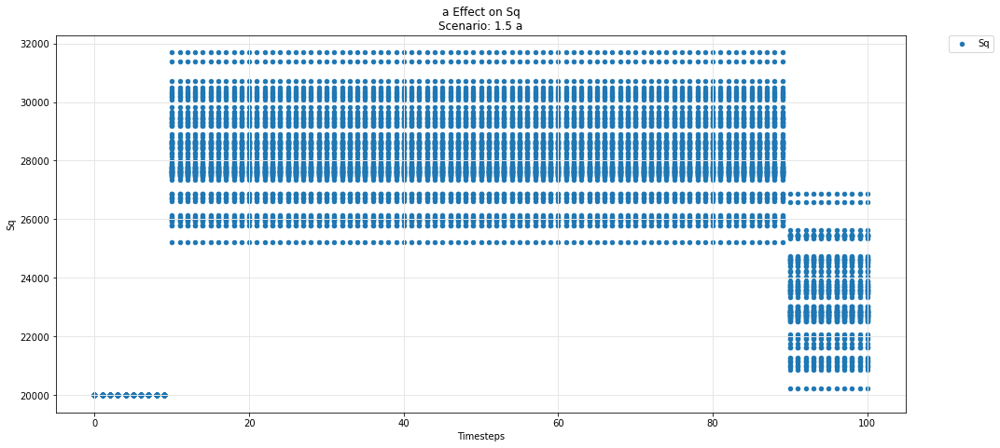

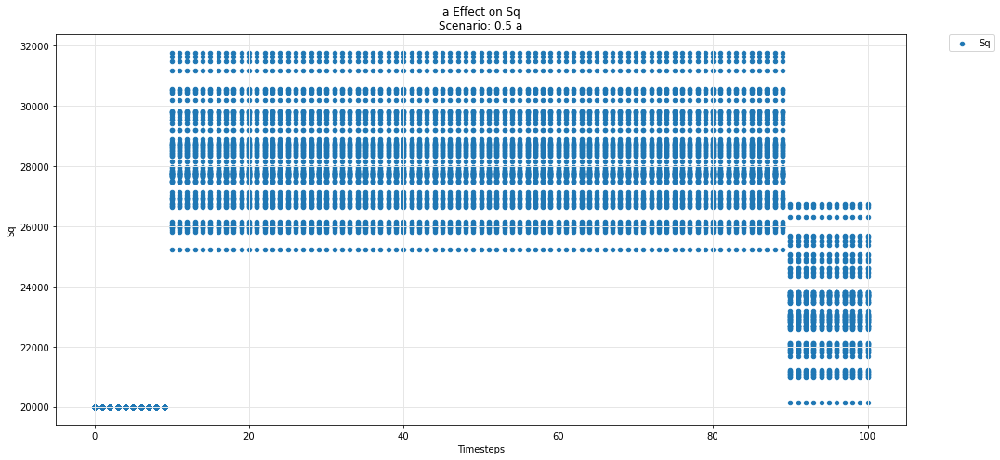

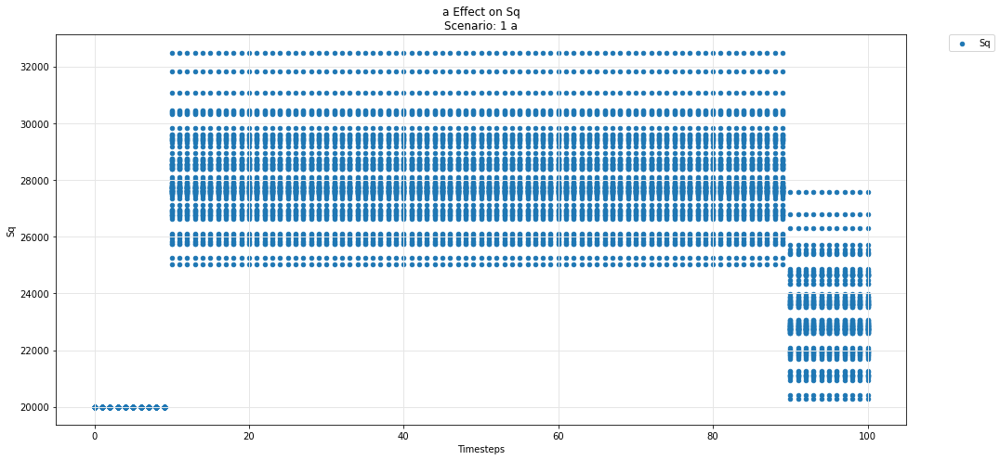

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

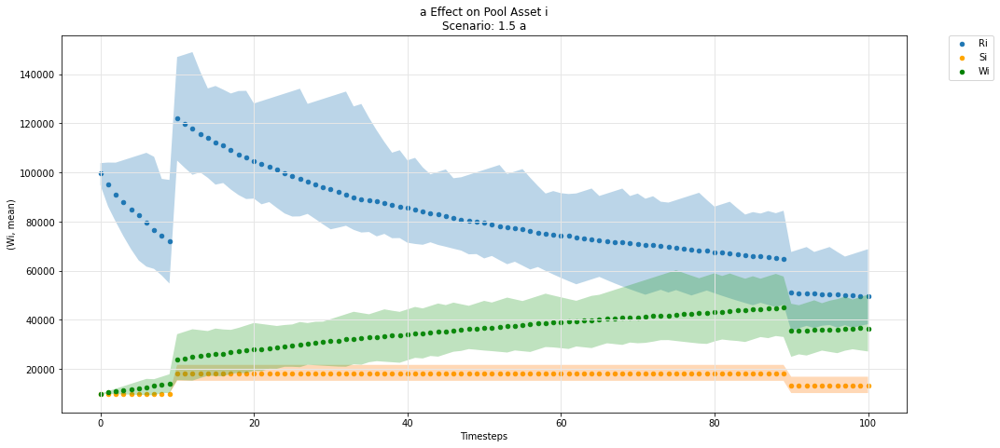

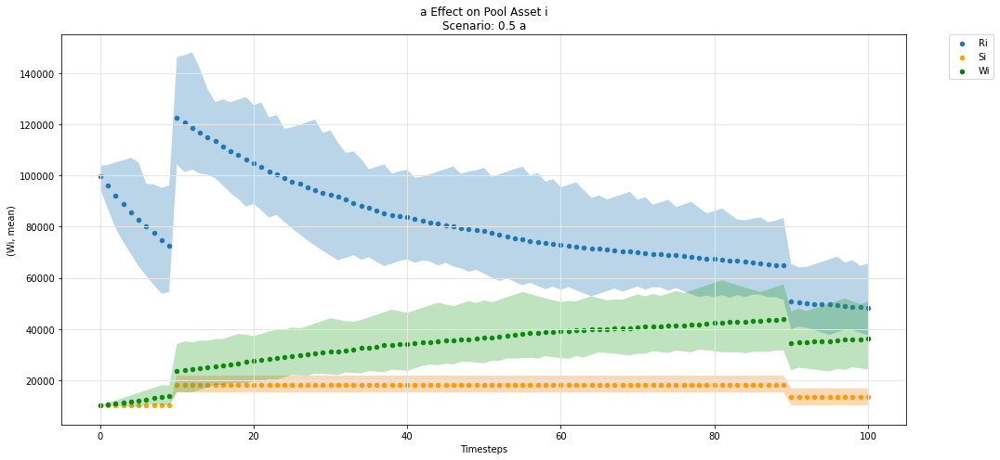

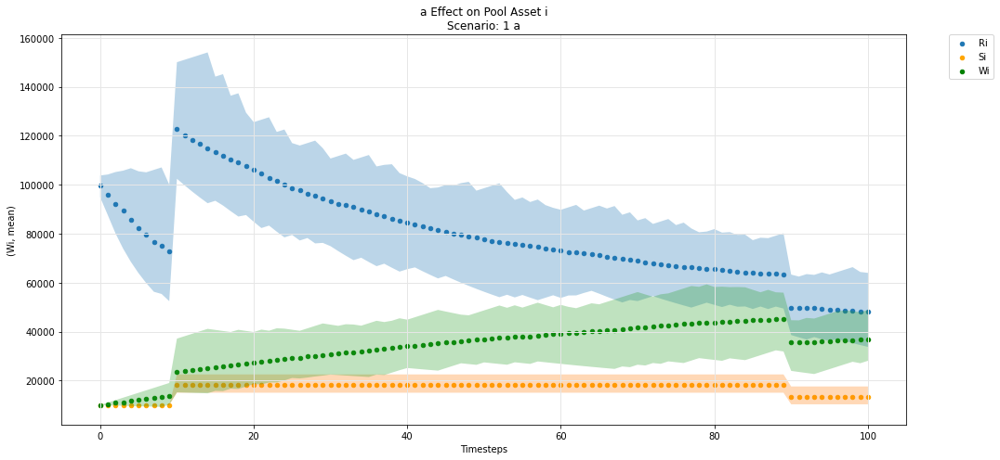

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

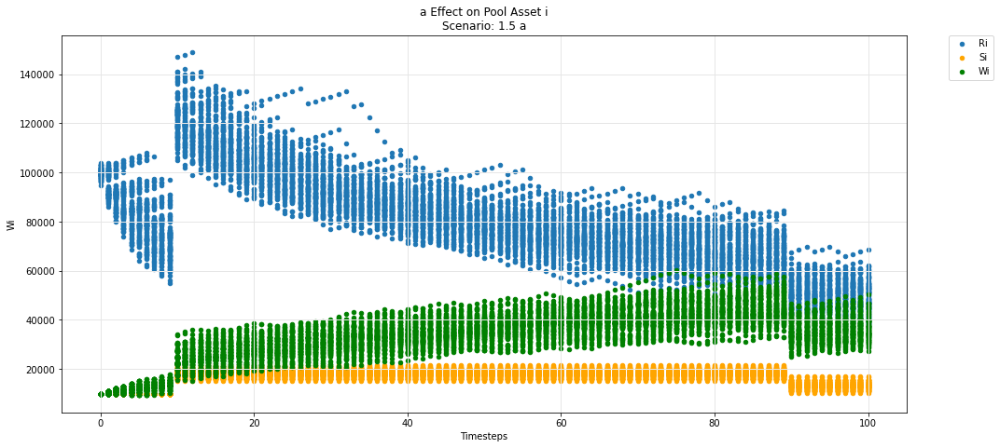

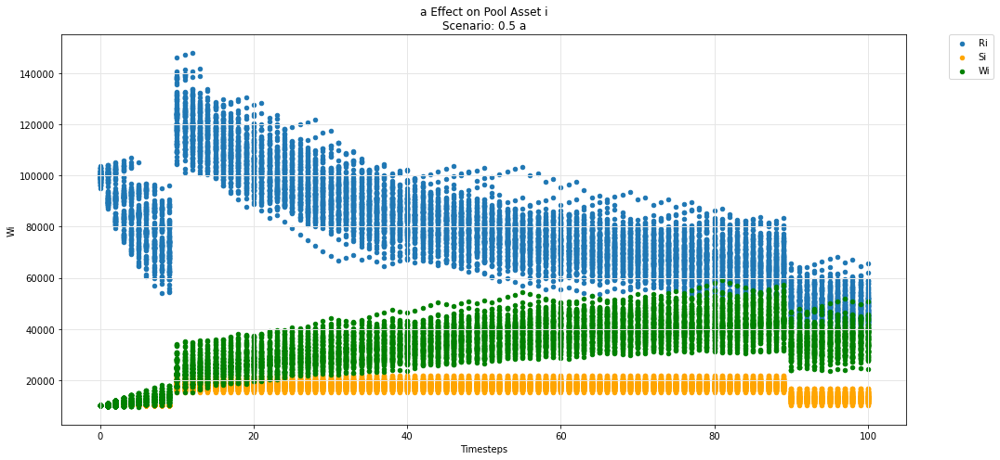

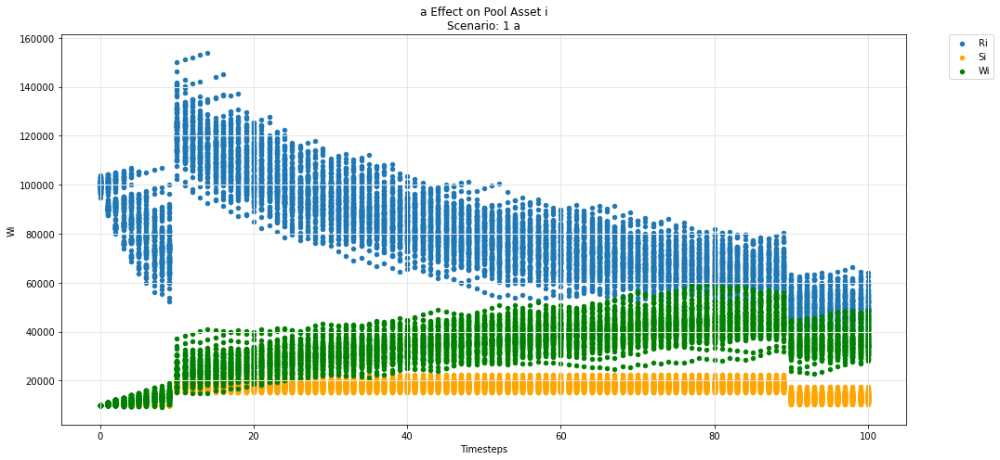

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

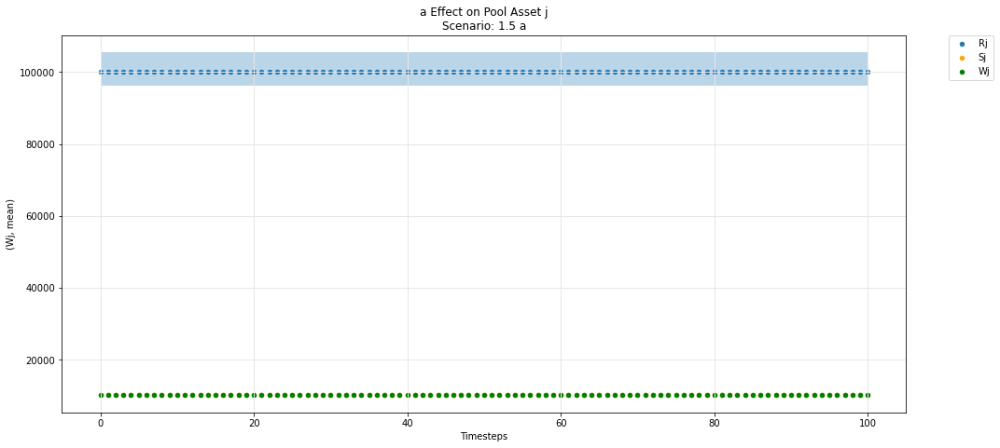

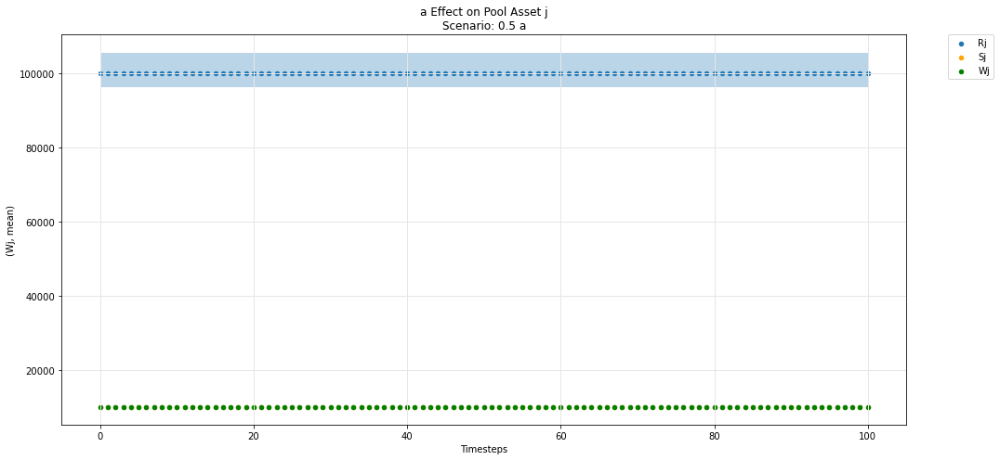

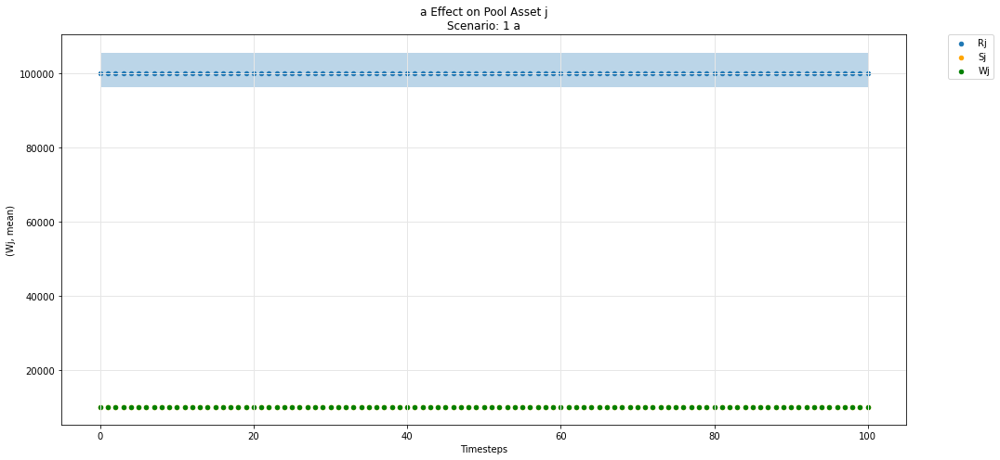

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

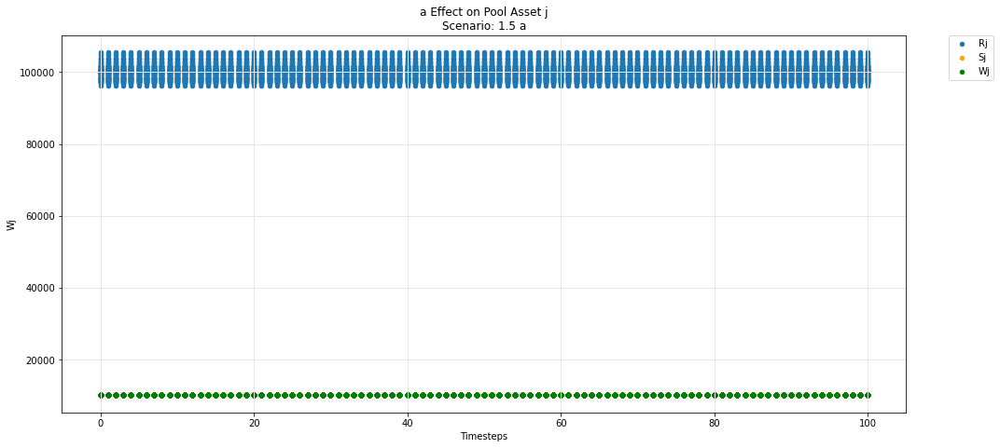

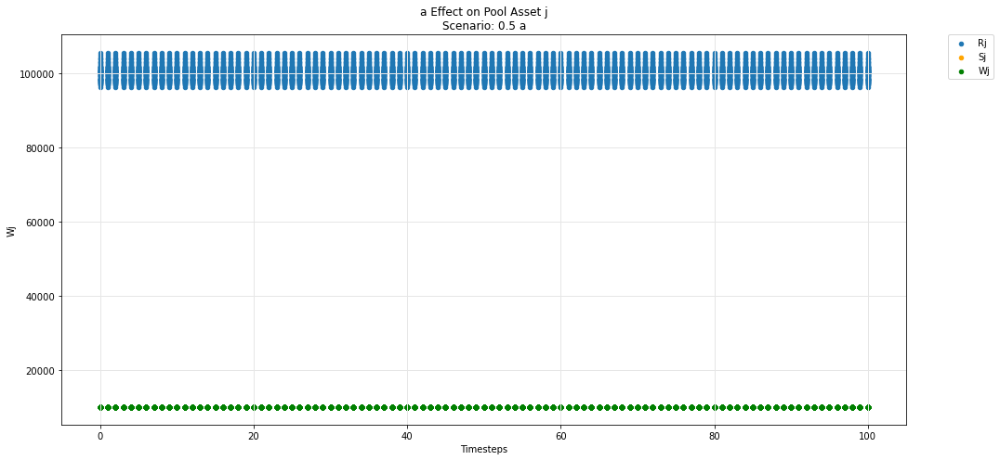

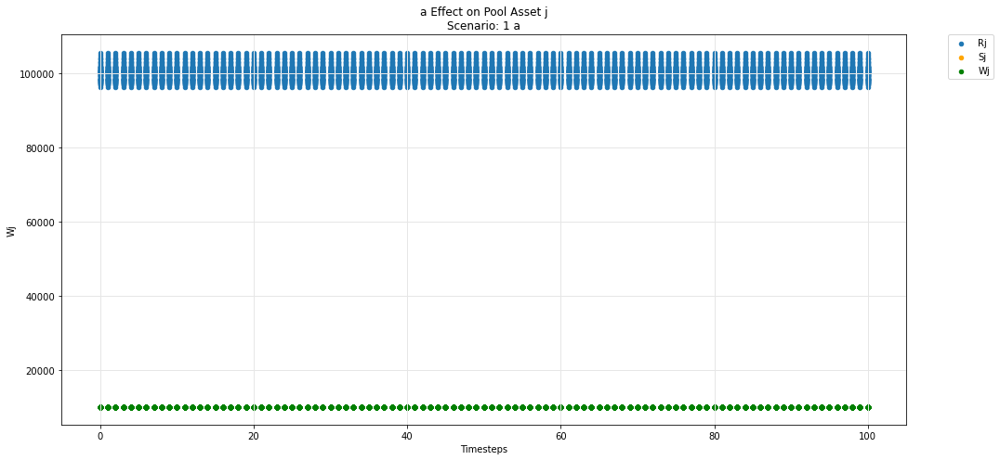

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

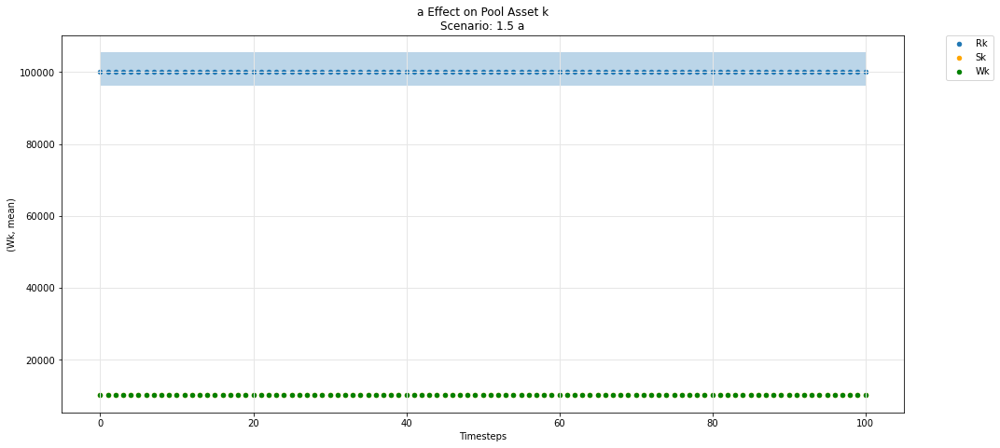

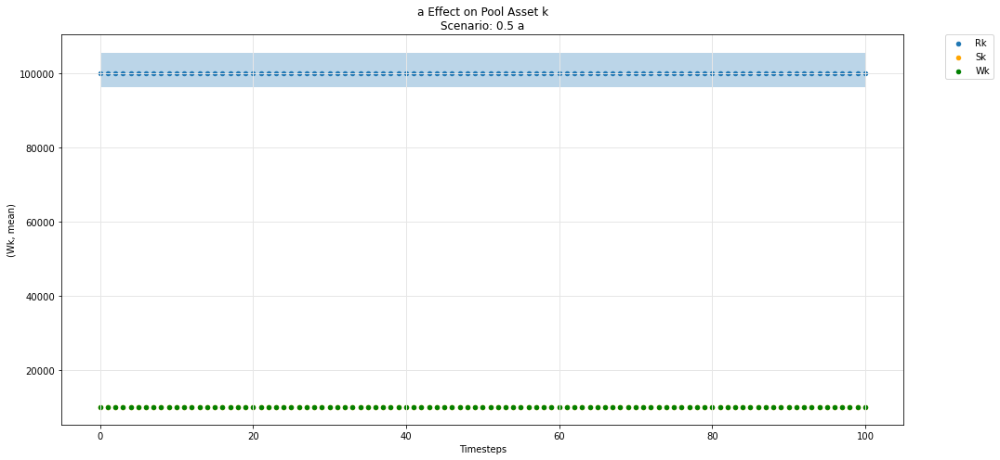

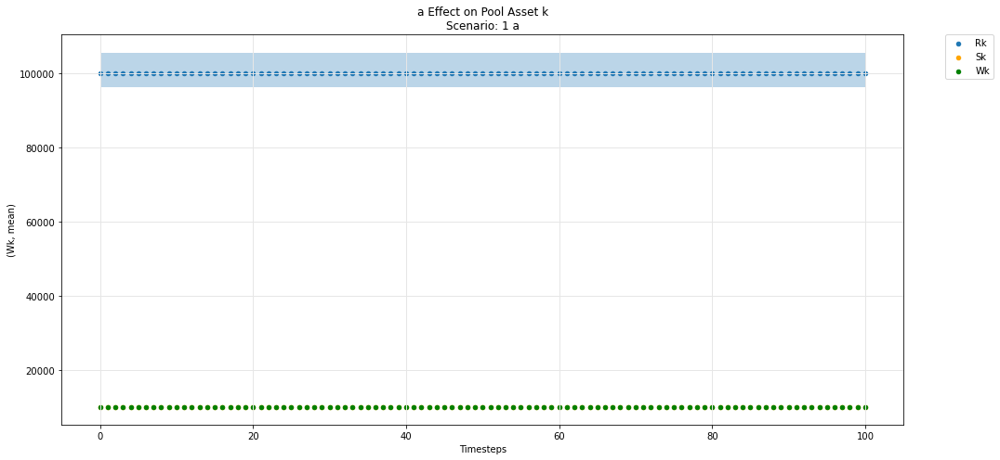

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

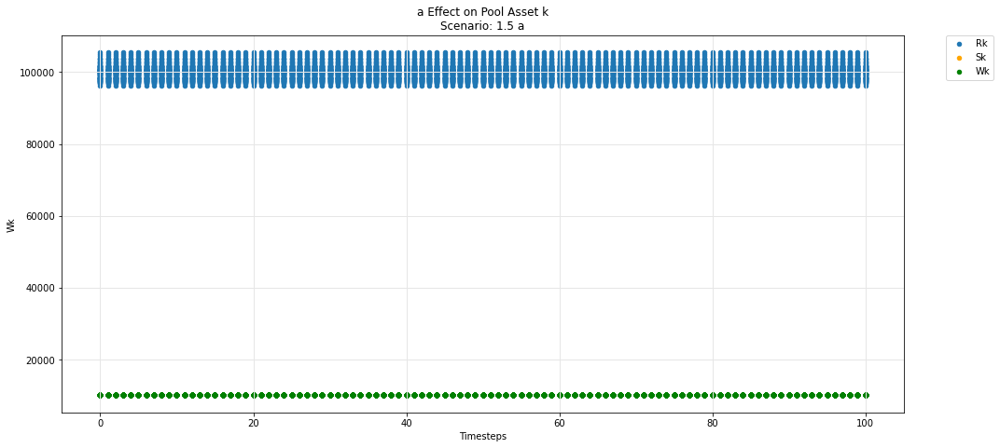

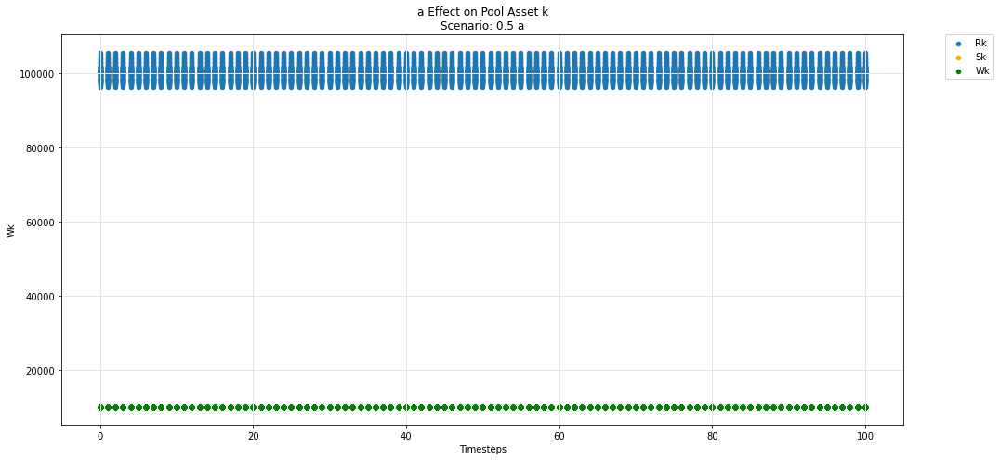

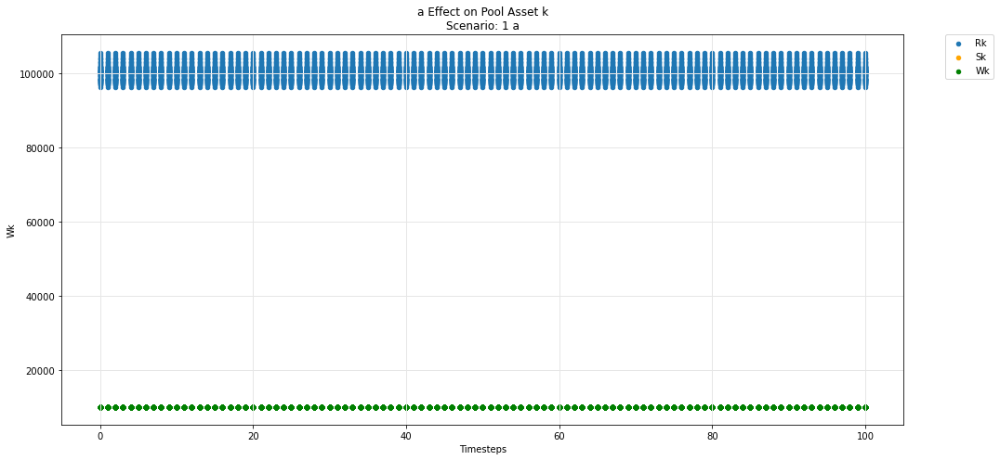

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

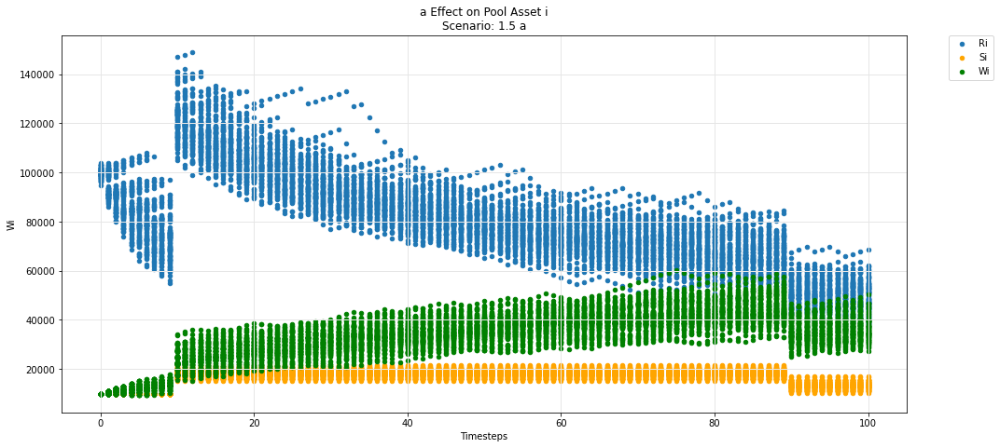

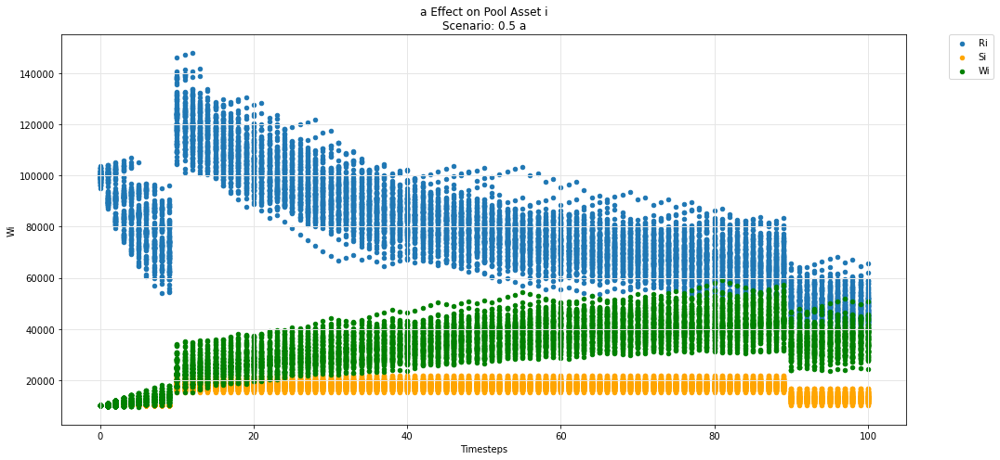

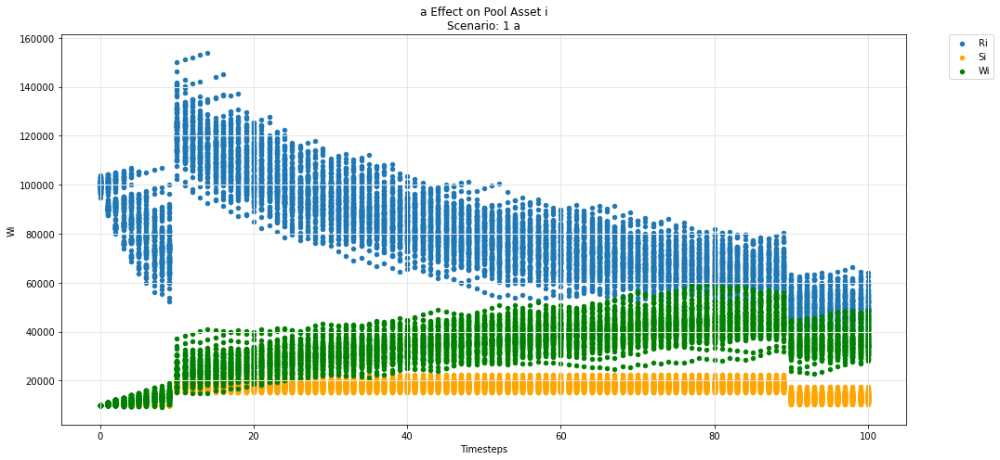

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

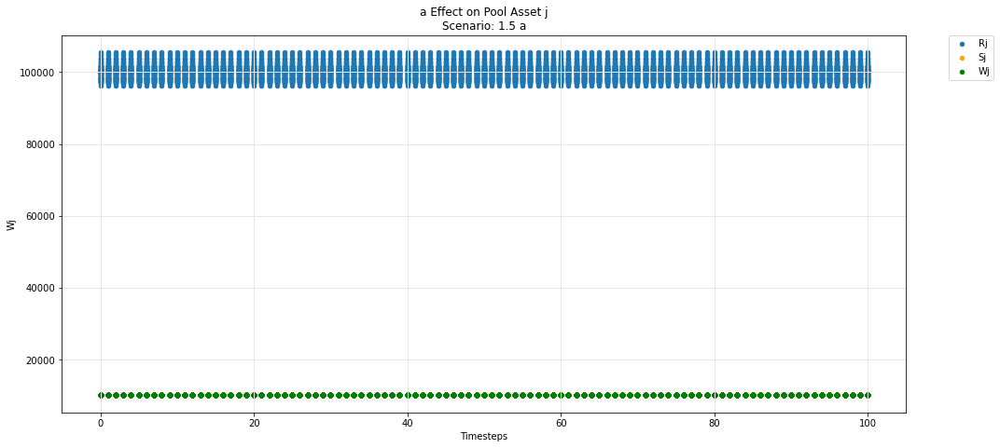

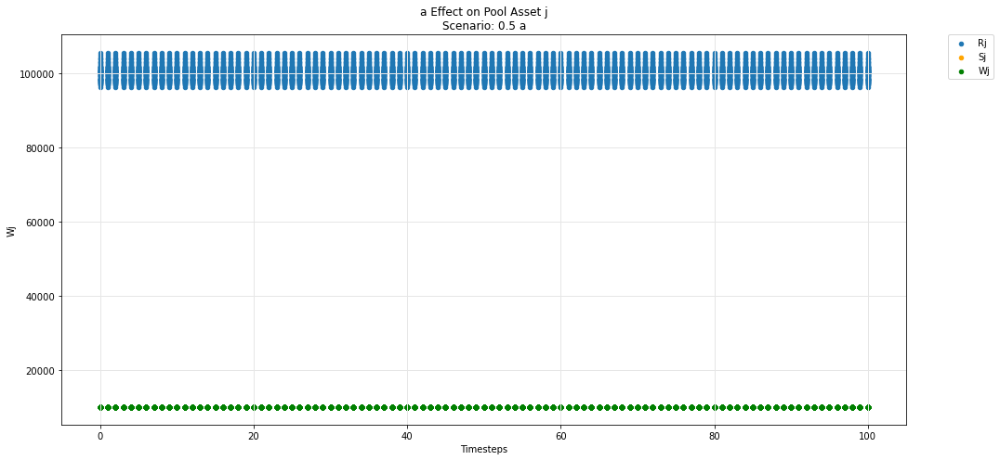

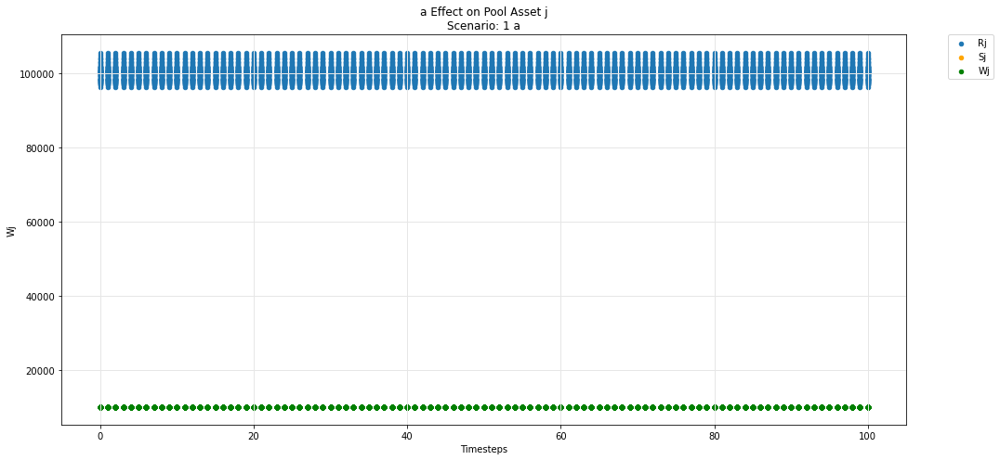

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

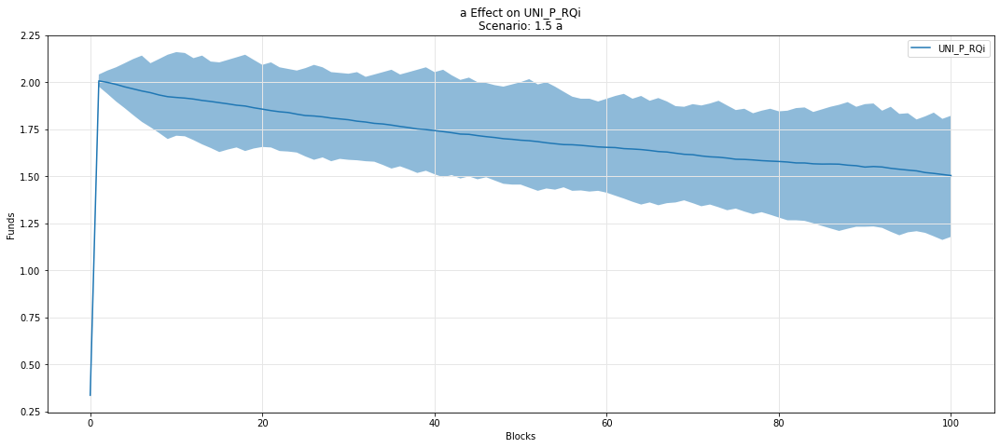

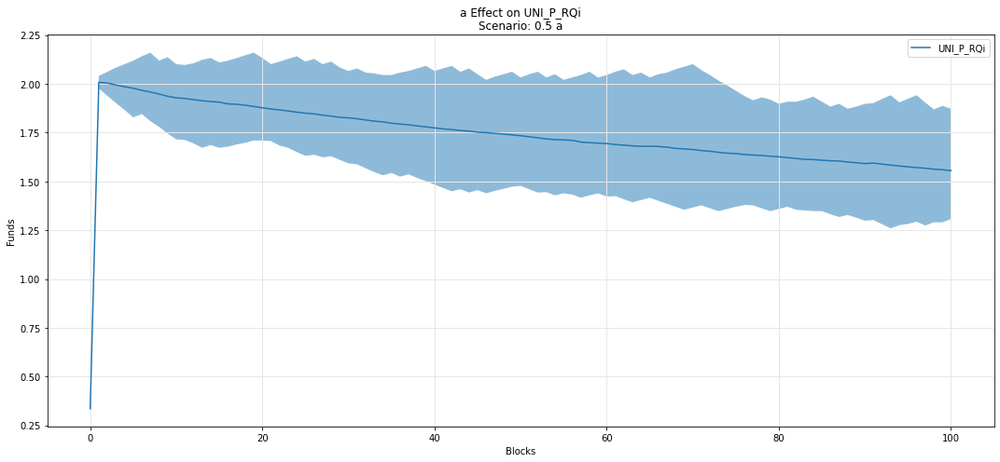

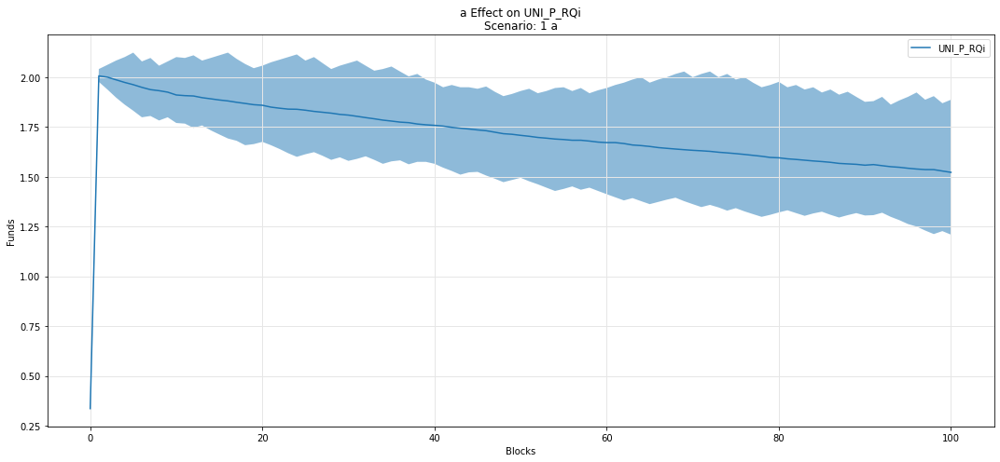

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

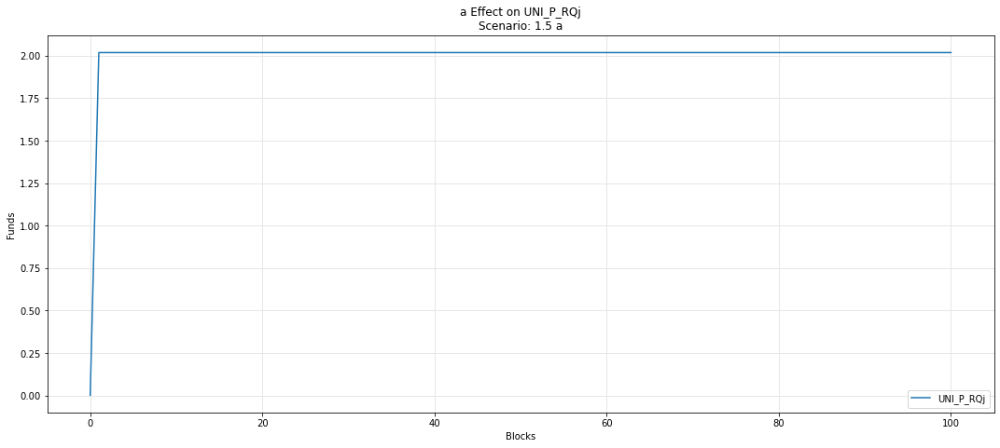

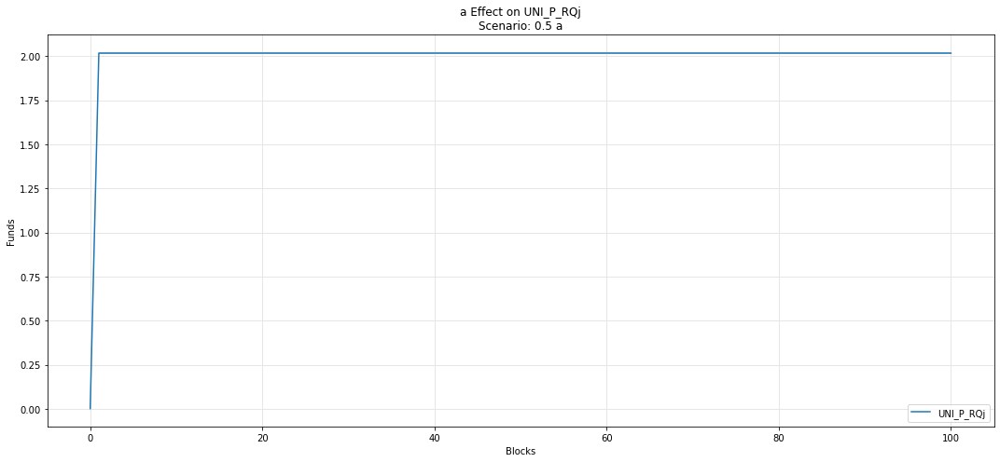

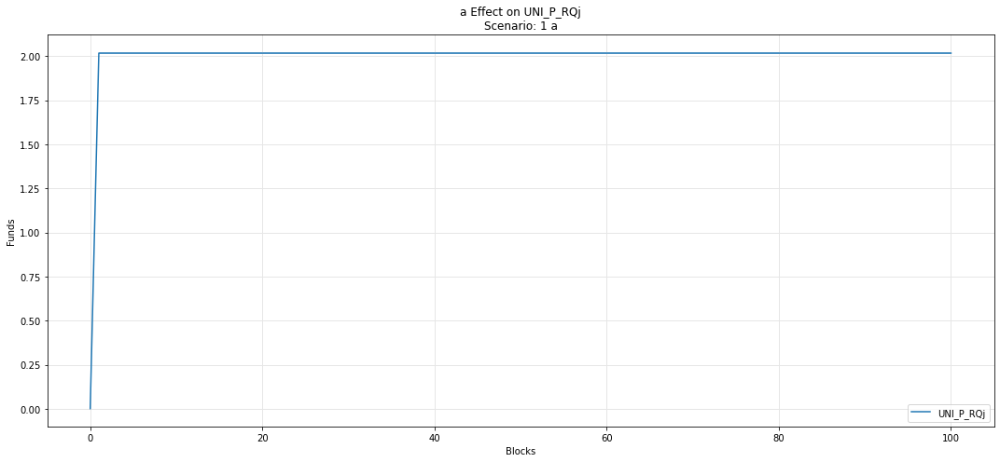

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

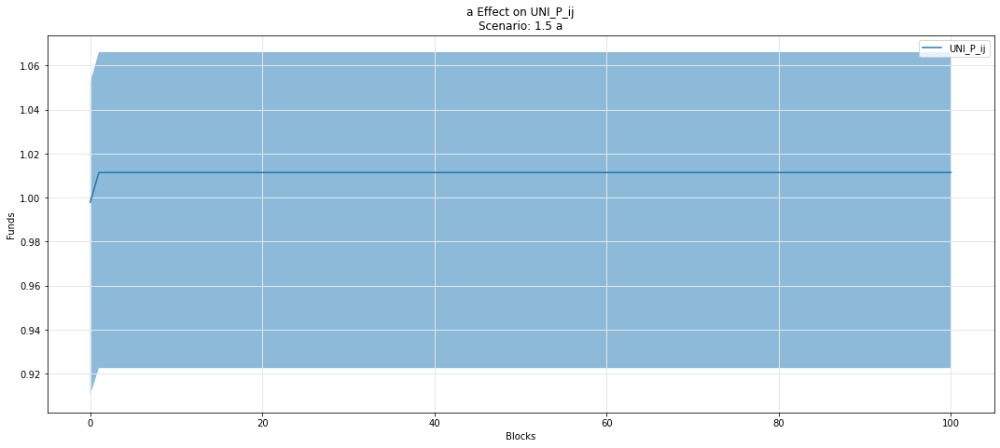

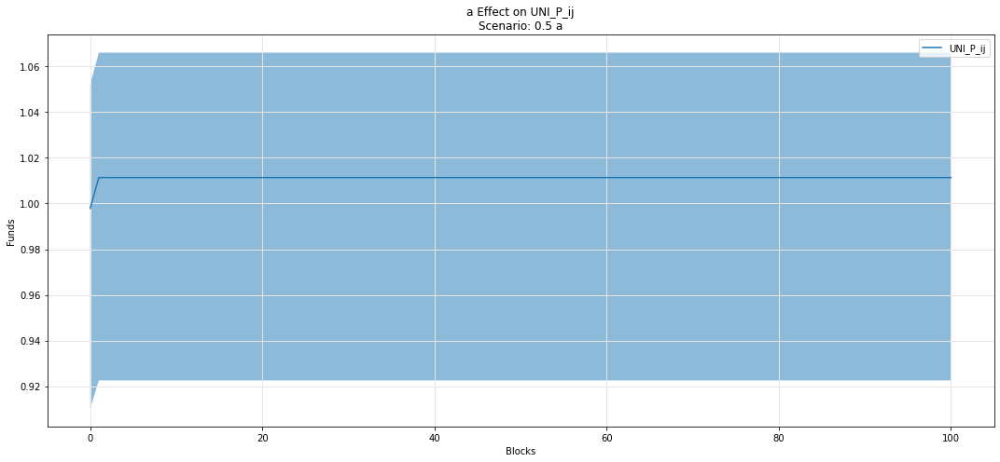

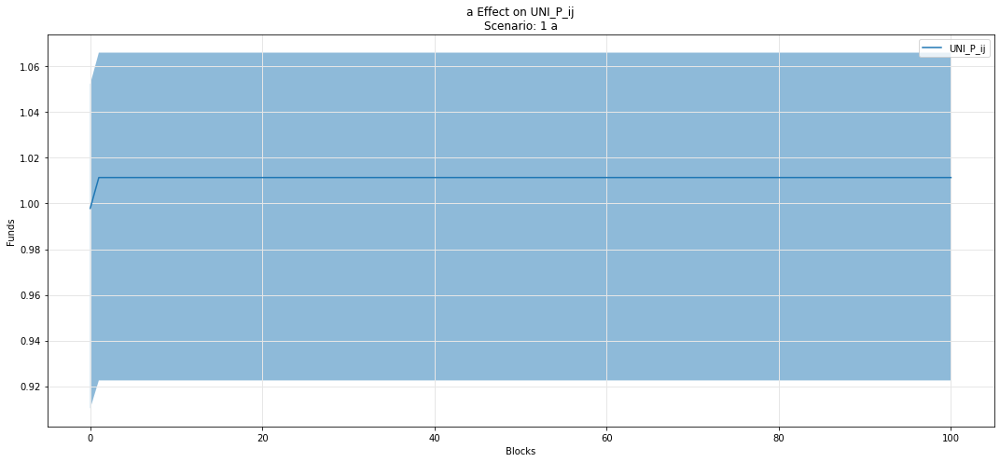

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

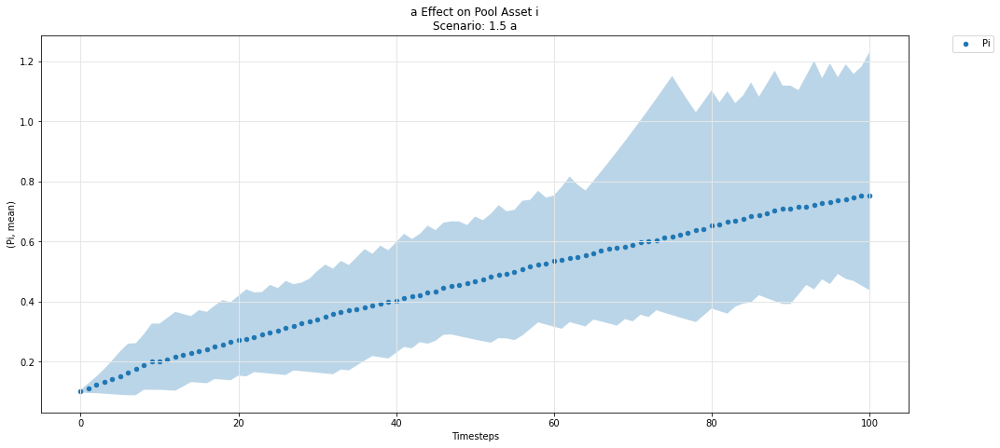

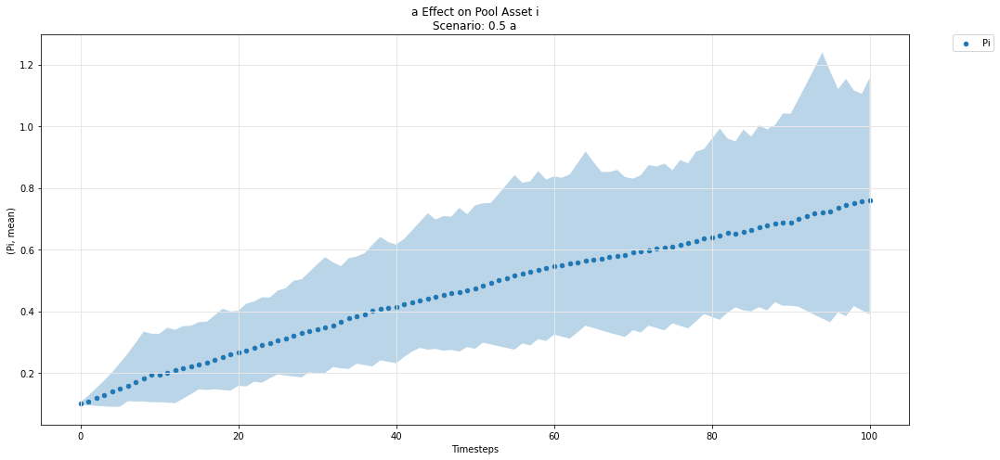

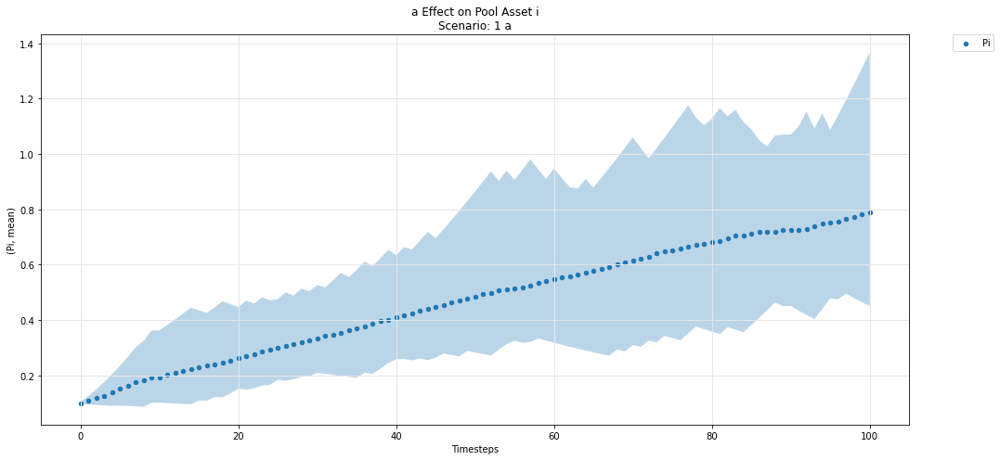

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

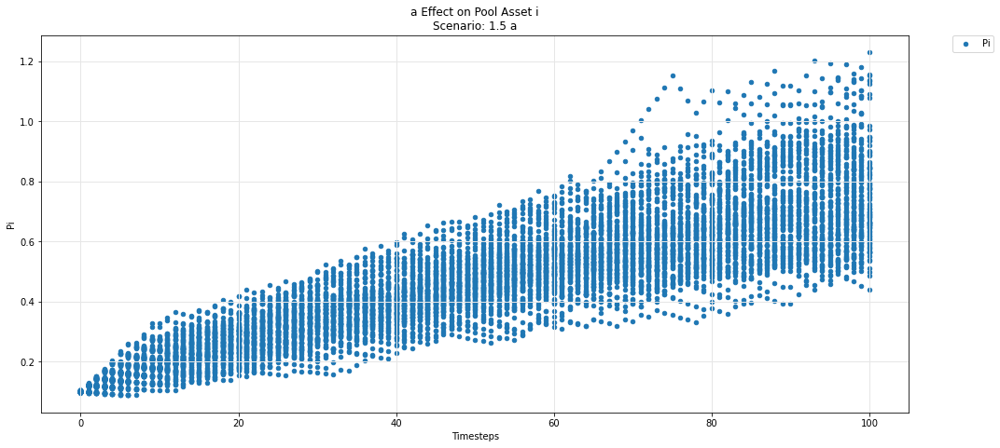

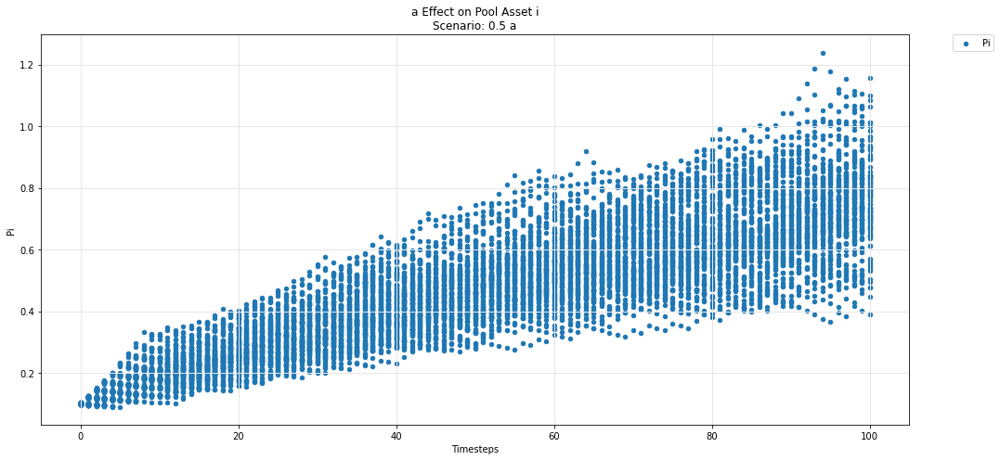

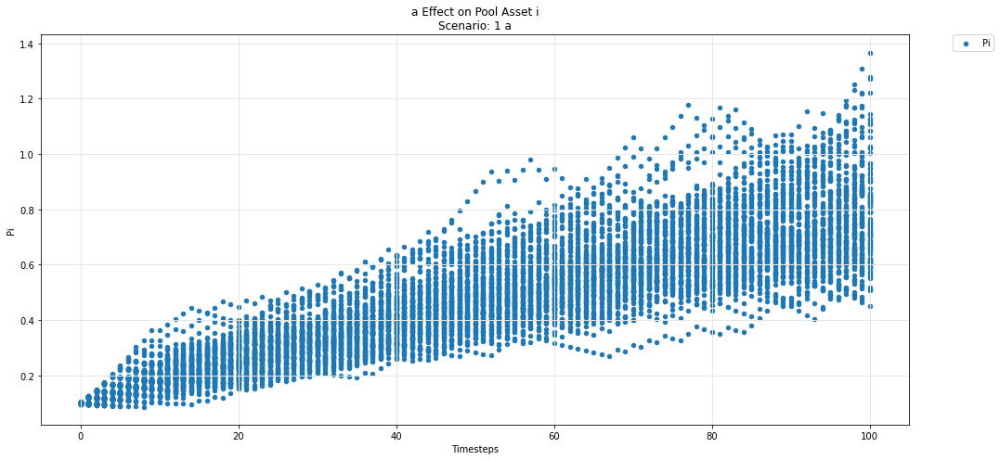

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

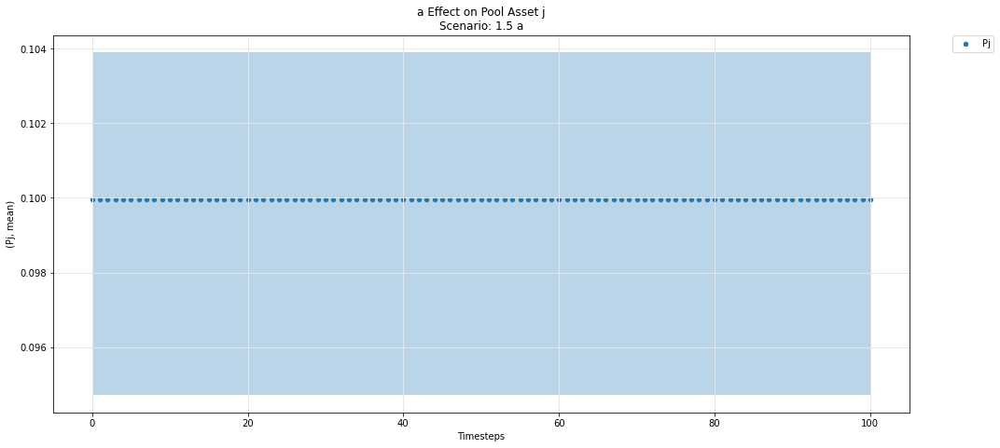

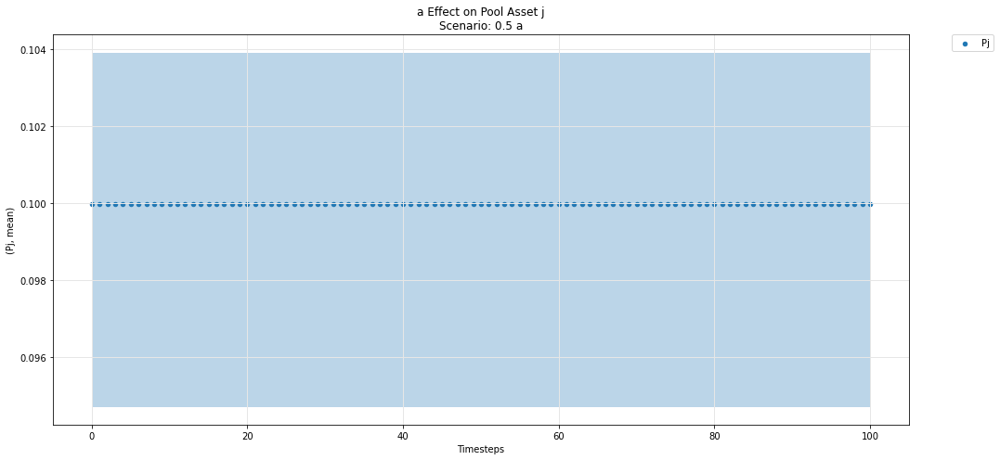

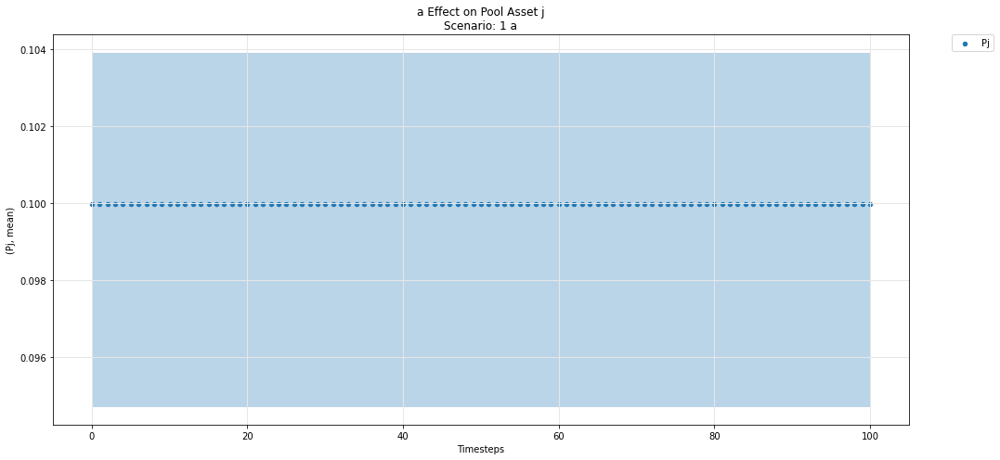

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

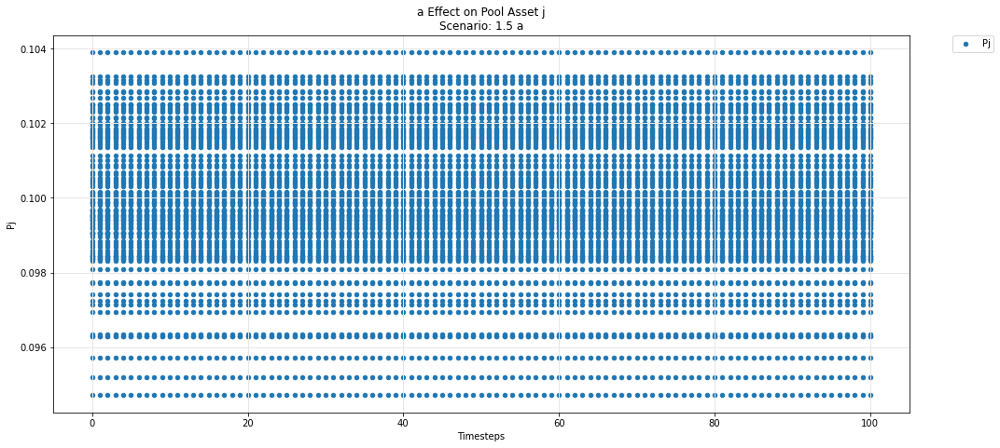

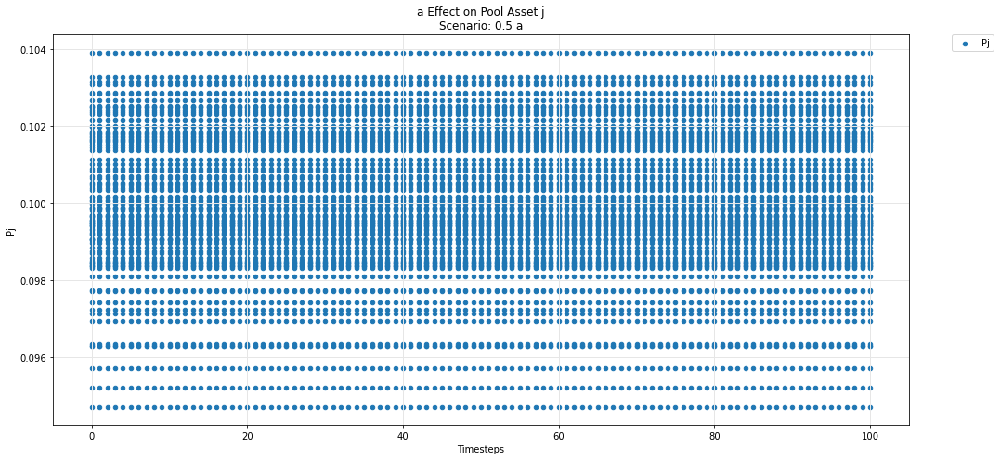

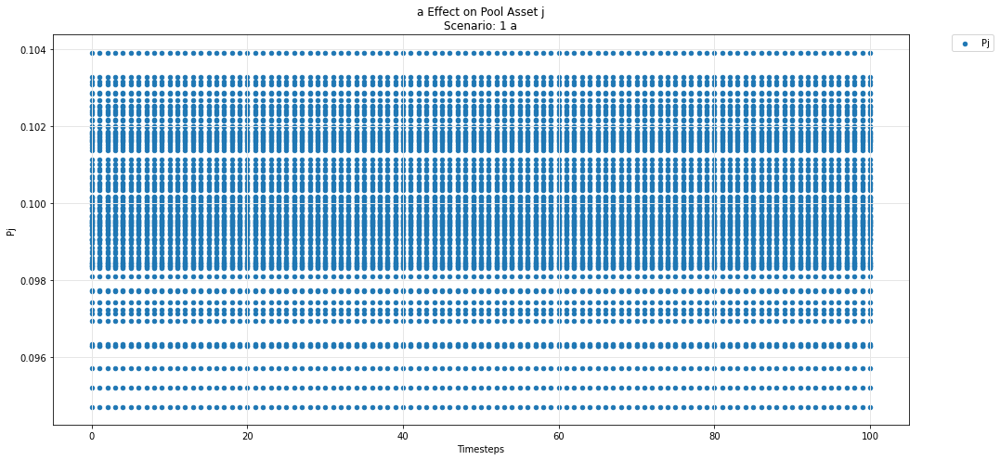

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

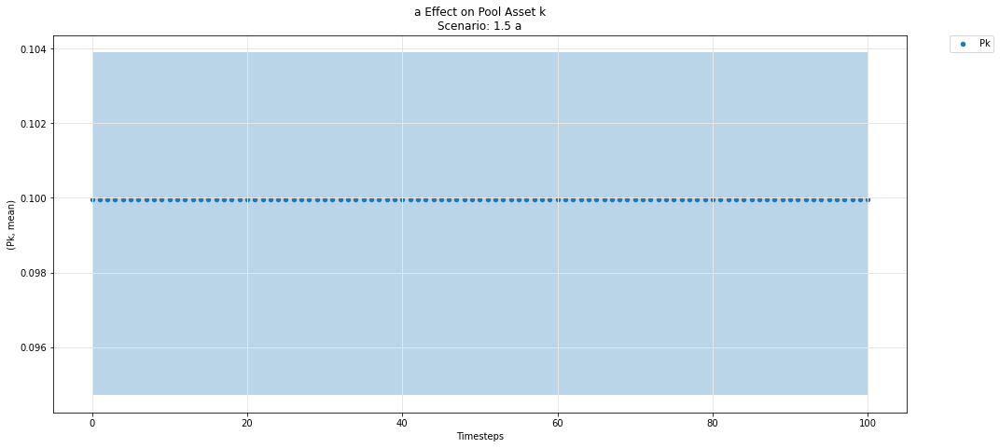

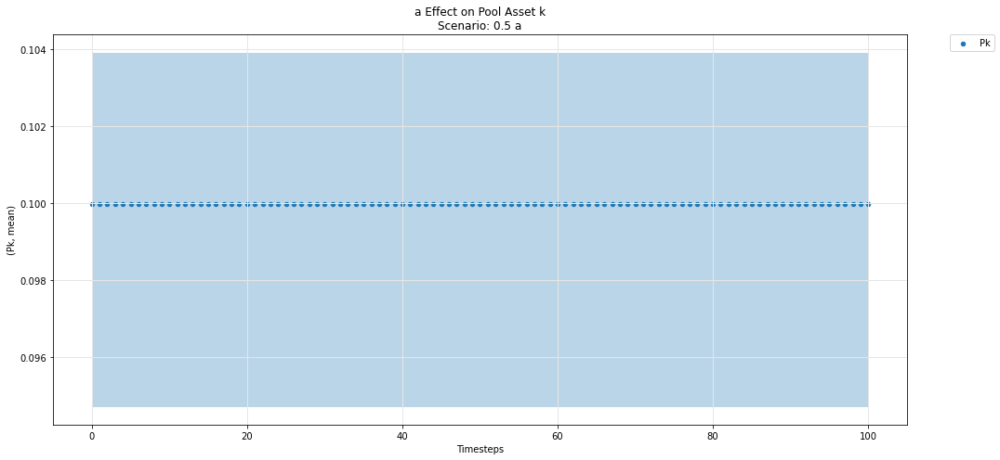

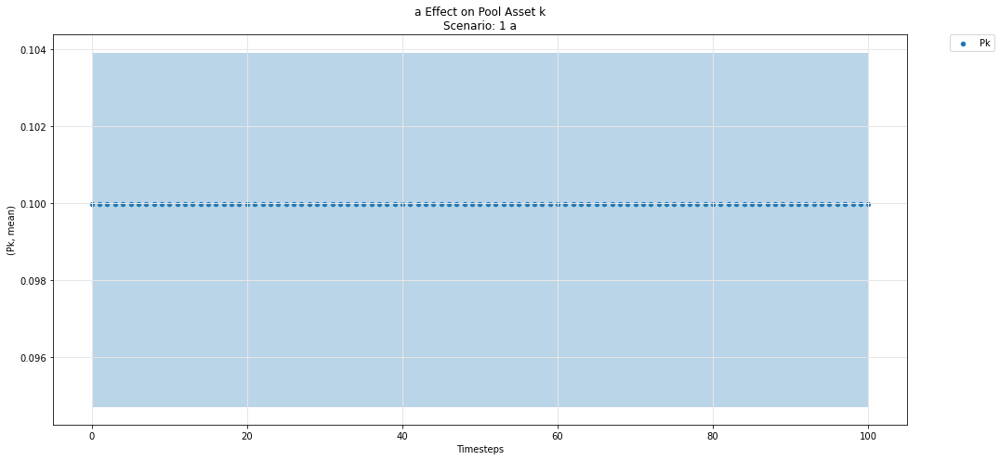

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

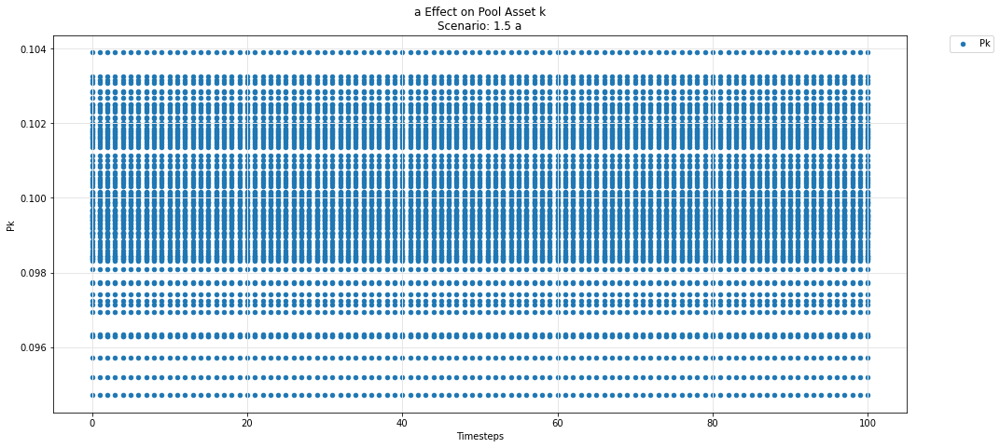

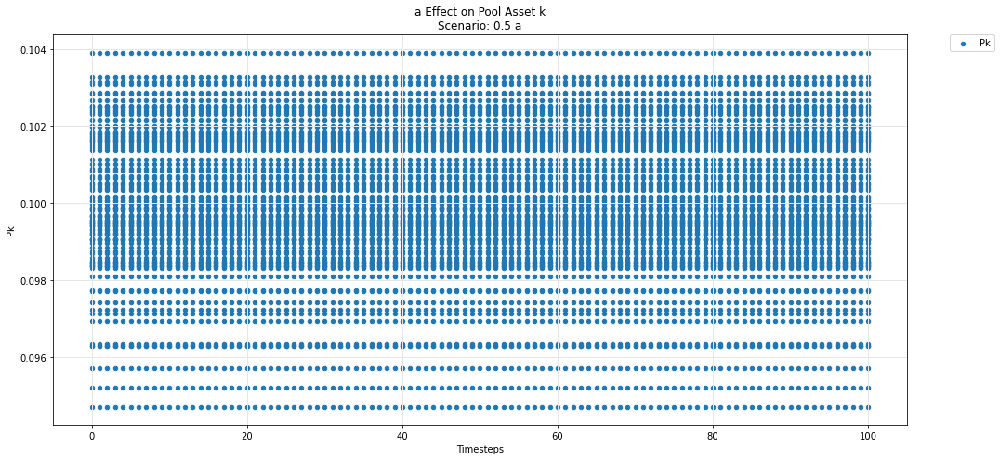

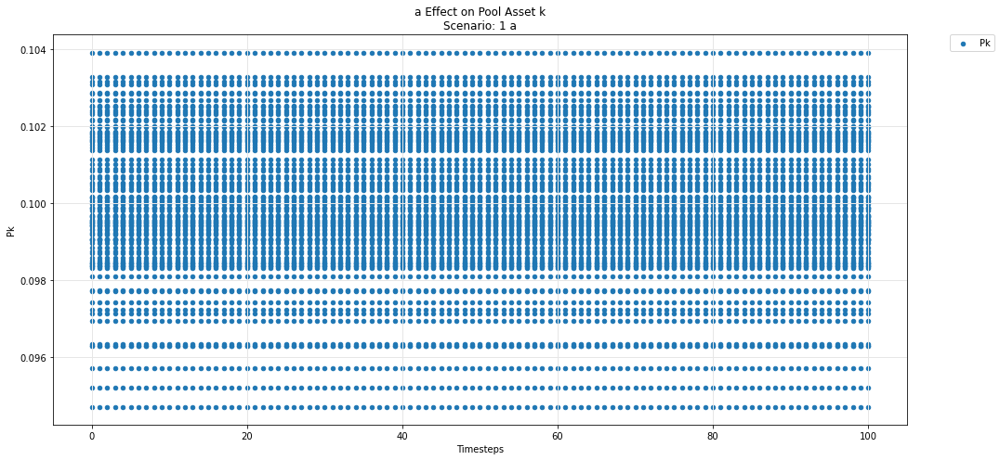

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')